In [1]:
import oggm
from oggm import cfg, workflow, tasks, graphics, utils 
import oggm.core.massbalance as mbmods
from oggm.core.flowline import FluxBasedModel
from oggm.workflow import execute_entity_task
import geopandas as gpd
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import os
import numpy as np
import xarray as xr
import salem, netCDF4
import shapely.geometry as shpg
plt.rcParams['figure.figsize'] = (8,8)
import logging
log = logging.getLogger(__name__)
from datetime import datetime

In [2]:
cfg.initialize()
rgi_version = '6'
rgi_region = '17'
cfg.PATHS['working_dir'] = "/home/david/OGGM_WORKING_DIRECTORY/"
cfg.PATHS['climate_file'] = "/home/david/Desktop/CCSM4_midHolocene_data/127ka.nc"
PI_path = "/home/david/Desktop/CCSM4_midHolocene_data/pi.nc"
cfg.PARAMS['continue_on_error'] = True
cfg.PARAMS['border'] = 200
cfg.PARAMS['use_multiprocessing'] = True
path = utils.get_rgi_intersects_region_file(rgi_region, version=rgi_version)
cfg.set_intersects_db(path)

2018-04-28 17:05:32: oggm.cfg: Parameter file: /home/david/oggm/oggm/params.cfg


In [8]:
rgi = gpd.read_file(os.path.join(cfg.PATHS['working_dir'], 'rgi_pif.shp'))
gdirs = workflow.init_glacier_regions(rgi)

In [9]:
gdir = gdirs[0]

In [10]:
gdir

<oggm.GlacierDirectory>
  RGI id: RGI60-17.00086
  Region: 17: Southern Andes
  Subregion: 17-01: Patagonia                       
  Glacier type: Glacier
  Terminus type: Land-terminating
  Area: 0.093 km2
  Lon, Lat: (-73.1545, -50.8267)
  Grid (nx, ny): (85, 57)
  Grid (dx, dy): (14.0, -14.0)

### Pre-processing

In [41]:
task_list = [
    tasks.glacier_masks,
    tasks.compute_centerlines,
    tasks.initialize_flowlines,
    tasks.compute_downstream_line,
    tasks.compute_downstream_bedshape,
    tasks.catchment_area,
    tasks.catchment_intersections,
    tasks.catchment_width_geom,
    tasks.catchment_width_correction,
]
for task in task_list:
    execute_entity_task(task, gdirs)

2018-03-26 16:31:32: oggm.workflow: Multiprocessing: using all available processors (N=12)
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00089) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00088) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00087) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00086) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00095) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00090) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00097) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00096) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00094) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00093) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00092) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00091) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (RGI60-17.00099) glacier_masks
2018-03-26 16:31:32: oggm.core.gis: (R

2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00207) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00208) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00209) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00210) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00211) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00212) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00214) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00215) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00213) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00216) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00219) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00220) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00218) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00217) glacier_masks
2018-03-26 16:31:33: oggm.core.gis: (RGI60-17.00221) glacier_m

2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00329) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00332) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00333) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00334) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00335) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00331) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00336) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00337) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00338) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00340) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00341) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00342) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00339) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00343) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00344) glacier_m

2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00452) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00454) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00453) glacier_masks
2018-03-26 16:31:34: oggm.core.gis: (RGI60-17.00455) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00571) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00572) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00573) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00456) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00570) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00577) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00576) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00578) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00579) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00574) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00575) glacier_m

2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00683) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00685) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00687) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00689) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00688) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00690) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00691) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00692) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00694) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00695) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00693) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00697) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00696) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00698) glacier_masks
2018-03-26 16:31:35: oggm.core.gis: (RGI60-17.00699) glacier_m

2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00809) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00808) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00810) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00813) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00812) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00811) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00815) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00816) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00817) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00814) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00818) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00820) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00819) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00821) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00822) glacier_m

2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00905) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00904) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00907) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00906) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00908) glacier_masks
2018-03-26 16:31:36: oggm.core.gis: (RGI60-17.00909) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00910) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00912) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00914) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00915) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00911) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00913) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00916) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00917) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.00918) glacier_m

2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01272) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01274) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01273) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01275) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01277) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01276) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01278) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01279) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01280) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01282) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01281) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01283) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01284) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01285) glacier_masks
2018-03-26 16:31:37: oggm.core.gis: (RGI60-17.01286) glacier_m

2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01964) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01965) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01962) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01966) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01967) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01968) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01971) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01969) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01974) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01975) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01973) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01978) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01977) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01979) glacier_masks
2018-03-26 16:31:38: oggm.core.gis: (RGI60-17.01976) glacier_m

2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02082) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02084) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02086) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02087) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02085) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02088) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02090) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02091) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02092) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02089) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02093) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02095) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02097) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02098) glacier_masks
2018-03-26 16:31:39: oggm.core.gis: (RGI60-17.02096) glacier_m

2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02202) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02203) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02201) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: RGI60-17.02035: DEM needed interpolation.
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02204) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02206) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02205) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02207) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02209) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02210) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02213) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02212) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02211) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02214) glacier_masks
2018-03-26 16:31:40: oggm.core.gis: (RGI60-17.02208

2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02319) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02322) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02321) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02323) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02324) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02320) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02325) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02327) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02326) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02328) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02330) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02329) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02331) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02333) glacier_masks
2018-03-26 16:31:41: oggm.core.gis: (RGI60-17.02332) glacier_m

2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02430) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02431) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02433) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02432) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02434) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02435) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: RGI60-17.02393: DEM needed interpolation.
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02437) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02436) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02439) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02438) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02441) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02440) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02443) glacier_masks
2018-03-26 16:31:42: oggm.core.gis: (RGI60-17.02442

2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02545) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02546) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02547) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02548) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02549) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02550) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02552) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02551) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: RGI60-17.02472: DEM needed interpolation.
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02553) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02554) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02555) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02557) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02556) glacier_masks
2018-03-26 16:31:43: oggm.core.gis: (RGI60-17.02558

2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02644) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02643) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02645) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02642) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02646) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02649) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02647) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02648) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02650) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02652) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02651) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02654) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02653) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02658) glacier_masks
2018-03-26 16:31:44: oggm.core.gis: (RGI60-17.02656) glacier_m

2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02747) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02748) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02749) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: RGI60-17.02705: DEM needed interpolation.
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02750) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: RGI60-17.02710: DEM needed interpolation.
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02751) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: RGI60-17.02716: DEM needed interpolation.
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02752) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02755) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02754) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02753) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02756) glacier_masks
2018-03-26 16:31:46: oggm.core.gis: (RGI60-17.02757) glacier_masks
2018-03-26 16:31:46: oggm.cor

2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02852) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02853) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02854) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: RGI60-17.02825: DEM needed interpolation.
2018-03-26 16:31:48: oggm.core.gis: RGI60-17.02812: DEM needed interpolation.
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02856) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02855) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02857) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02858) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: RGI60-17.02835: DEM needed interpolation.
2018-03-26 16:31:48: oggm.core.gis: RGI60-17.02828: DEM needed interpolation.
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02859) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02860) glacier_masks
2018-03-26 16:31:48: oggm.core.gis: (RGI60-17.02862) glacier_masks
2018-03-26 16:31:4

2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02955) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02957) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02956) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02958) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02961) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02960) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02959) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02962) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02963) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: RGI60-17.02935: DEM needed interpolation.
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02966) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02964) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02965) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02967) glacier_masks
2018-03-26 16:31:49: oggm.core.gis: (RGI60-17.02968

2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03069) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03066) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03068) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03070) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03073) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03071) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03074) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03072) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03075) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03076) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03078) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03079) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03080) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03077) glacier_masks
2018-03-26 16:31:50: oggm.core.gis: (RGI60-17.03081) glacier_m

2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03182) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03183) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03184) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03185) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03187) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: RGI60-17.03142: DEM needed interpolation.
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03186) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03188) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03189) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03191) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03192) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03190) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03194) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03193) glacier_masks
2018-03-26 16:31:51: oggm.core.gis: (RGI60-17.03195

2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03296) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03294) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03297) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03299) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03298) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03300) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03302) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03301) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03304) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03305) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03303) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03306) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03307) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03309) glacier_masks
2018-03-26 16:31:52: oggm.core.gis: (RGI60-17.03308) glacier_m

2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03396) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03395) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03397) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03398) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03399) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03400) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: RGI60-17.03371: DEM needed interpolation.
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03401) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03402) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03403) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03404) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03406) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: (RGI60-17.03405) glacier_masks
2018-03-26 16:31:54: oggm.core.gis: RGI60-17.03370: DEM needed interpolation.
2018-03-26 16:31:54: oggm.core.gis: (RGI

2018-03-26 16:31:55: oggm.core.gis: (RGI60-17.03490) glacier_masks
2018-03-26 16:31:55: oggm.core.gis: (RGI60-17.03491) glacier_masks
2018-03-26 16:31:55: oggm.core.gis: (RGI60-17.03493) glacier_masks
2018-03-26 16:31:55: oggm.core.gis: (RGI60-17.03492) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: (RGI60-17.03494) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: (RGI60-17.03495) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: (RGI60-17.03496) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: (RGI60-17.03498) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: (RGI60-17.03497) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: (RGI60-17.03499) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: RGI60-17.03469: DEM needed interpolation.
2018-03-26 16:31:56: oggm.core.gis: (RGI60-17.03500) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: RGI60-17.03486: DEM needed interpolation.
2018-03-26 16:31:56: oggm.core.gis: (RGI60-17.03503) glacier_masks
2018-03-26 16:31:56: oggm.core.gis: RGI6

2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03598) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03599) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03600) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03602) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03601) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03604) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: RGI60-17.03549: DEM needed interpolation.
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03605) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03603) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03607) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03606) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03609) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03608) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03610) glacier_masks
2018-03-26 16:31:57: oggm.core.gis: (RGI60-17.03611

2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03708) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03706) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03710) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03714) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03712) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03711) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03713) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03716) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03715) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03717) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03718) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03719) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: RGI60-17.03645: DEM needed interpolation.
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03720) glacier_masks
2018-03-26 16:31:58: oggm.core.gis: (RGI60-17.03722

2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03828) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03830) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03831) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: RGI60-17.03796: DEM needed interpolation.
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03829) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03833) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03832) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03834) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03835) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03836) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03837) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03838) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: RGI60-17.03803: DEM needed interpolation.
2018-03-26 16:31:59: oggm.core.gis: (RGI60-17.03839) glacier_masks
2018-03-26 16:31:59: oggm.core.gis: (RGI

2018-03-26 16:32:00: oggm.core.gis: RGI60-17.03862: DEM needed interpolation.
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03938) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03940) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03939) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03942) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03943) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03941) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03944) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03946) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03945) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03947) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03948) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03950) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03949) glacier_masks
2018-03-26 16:32:00: oggm.core.gis: (RGI60-17.03951

2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04055) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04056) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04054) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04057) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04058) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04059) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04060) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04061) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04065) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04064) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04062) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04066) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04063) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04067) glacier_masks
2018-03-26 16:32:01: oggm.core.gis: (RGI60-17.04068) glacier_m

2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04163) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04164) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04166) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04167) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: RGI60-17.04116: DEM needed interpolation.
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04165) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04168) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04169) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: RGI60-17.04110: DEM needed interpolation.
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04171) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04170) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04172) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04173) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI60-17.04175) glacier_masks
2018-03-26 16:32:02: oggm.core.gis: (RGI

2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04282) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04284) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04283) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04281) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04286) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04285) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04287) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04288) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04289) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04292) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04290) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04291) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04293) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04294) glacier_masks
2018-03-26 16:32:03: oggm.core.gis: (RGI60-17.04296) glacier_m

2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04403) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04404) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04400) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04399) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04406) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04407) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04409) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04405) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04408) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04411) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04410) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04413) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04412) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: AttributeError occurred during task glacier_masks on RGI60-17.04120: 'NoneType' object has no

2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04518) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04524) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04523) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04525) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04526) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04528) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04527) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04529) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04530) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04531) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04532) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04533) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04534) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04539) glacier_masks
2018-03-26 16:32:04: oggm.core.gis: (RGI60-17.04535) glacier_m

2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04635) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04636) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04638) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04639) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04640) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04637) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04641) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04643) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04644) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04645) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04646) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04642) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04647) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04648) glacier_masks
2018-03-26 16:32:05: oggm.core.gis: (RGI60-17.04649) glacier_m

2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04754) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04755) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04756) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04757) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04758) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04759) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04760) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04763) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04764) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04765) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04761) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04762) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04767) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04768) glacier_masks
2018-03-26 16:32:06: oggm.core.gis: (RGI60-17.04769) glacier_m

2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04875) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04876) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: RGI60-17.04866: DEM needed interpolation.
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04873) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04877) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04878) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04879) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04880) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04881) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04882) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04883) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04884) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04885) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: (RGI60-17.04886) glacier_masks
2018-03-26 16:32:07: oggm.core.gis: RGI60-17.04843:

2018-03-26 16:32:09: oggm.core.gis: RGI60-17.04946: DEM needed interpolation.
2018-03-26 16:32:09: oggm.core.gis: (RGI60-17.04968) glacier_masks
2018-03-26 16:32:09: oggm.core.gis: (RGI60-17.04970) glacier_masks
2018-03-26 16:32:09: oggm.core.gis: RGI60-17.04949: DEM needed interpolation.
2018-03-26 16:32:09: oggm.core.gis: (RGI60-17.04971) glacier_masks
2018-03-26 16:32:09: oggm.core.gis: RGI60-17.04918: DEM needed interpolation.
2018-03-26 16:32:09: oggm.core.gis: (RGI60-17.04973) glacier_masks
2018-03-26 16:32:09: oggm.core.gis: (RGI60-17.04972) glacier_masks
2018-03-26 16:32:09: oggm.core.gis: (RGI60-17.04974) glacier_masks
2018-03-26 16:32:09: oggm.core.gis: RGI60-17.04965: DEM needed interpolation.
2018-03-26 16:32:09: oggm.core.gis: (RGI60-17.04975) glacier_masks
2018-03-26 16:32:09: oggm.core.gis: RGI60-17.04957: DEM needed interpolation.
2018-03-26 16:32:09: oggm.core.gis: (RGI60-17.04976) glacier_masks
2018-03-26 16:32:09: oggm.core.gis: RGI60-17.04963: DEM needed interpolati

2018-03-26 16:32:10: oggm.core.gis: (RGI60-17.05069) glacier_masks
2018-03-26 16:32:10: oggm.core.gis: (RGI60-17.05068) glacier_masks
2018-03-26 16:32:10: oggm.core.gis: (RGI60-17.05070) glacier_masks
2018-03-26 16:32:10: oggm.core.gis: (RGI60-17.05072) glacier_masks
2018-03-26 16:32:10: oggm.core.gis: (RGI60-17.05073) glacier_masks
2018-03-26 16:32:10: oggm.core.gis: (RGI60-17.05071) glacier_masks
2018-03-26 16:32:10: oggm.core.gis: (RGI60-17.05074) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05076) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05075) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05077) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05078) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05079) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: RGI60-17.05031: DEM needed interpolation.
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05081) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05080

2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05184) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05187) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05189) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05190) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05192) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05193) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05194) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05191) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05195) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05196) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05197) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05199) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05198) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05200) glacier_masks
2018-03-26 16:32:11: oggm.core.gis: (RGI60-17.05201) glacier_m

2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05309) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05310) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05307) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05312) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05313) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05311) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05315) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05316) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05314) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05317) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05318) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05319) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05320) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05323) glacier_masks
2018-03-26 16:32:12: oggm.core.gis: (RGI60-17.05324) glacier_m

2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05431) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05433) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05432) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05434) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05435) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05437) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05439) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05438) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05436) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05440) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05443) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05441) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05442) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05444) glacier_masks
2018-03-26 16:32:13: oggm.core.gis: (RGI60-17.05445) glacier_m

2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05553) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05552) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05554) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05557) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05555) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05556) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05558) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05559) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05560) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05563) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05561) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05562) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05565) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05564) glacier_masks
2018-03-26 16:32:14: oggm.core.gis: (RGI60-17.05566) glacier_m

2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05673) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05672) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05675) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05674) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05676) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05678) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05677) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05680) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05681) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05682) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05683) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05684) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05679) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05686) glacier_masks
2018-03-26 16:32:15: oggm.core.gis: (RGI60-17.05685) glacier_m

2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05795) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05797) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05796) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05799) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05798) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05801) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05800) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05802) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05803) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05805) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05804) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05806) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05807) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05808) glacier_masks
2018-03-26 16:32:16: oggm.core.gis: (RGI60-17.05809) glacier_m

2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05912) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05913) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05914) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05915) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05916) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05917) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05918) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05919) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05921) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05920) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05922) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05924) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05923) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05925) glacier_masks
2018-03-26 16:32:17: oggm.core.gis: (RGI60-17.05926) glacier_m

2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06034) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06035) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06037) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06039) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06038) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06041) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06040) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06042) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06044) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06043) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06045) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06046) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06048) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06050) glacier_masks
2018-03-26 16:32:18: oggm.core.gis: (RGI60-17.06049) glacier_m

2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06156) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06157) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06159) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06161) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06162) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06160) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06163) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06165) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06166) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06168) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06164) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06167) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06170) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06169) glacier_masks
2018-03-26 16:32:19: oggm.core.gis: (RGI60-17.06172) glacier_m

2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06278) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06280) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06282) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06281) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06284) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06283) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06285) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06286) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06287) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06288) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06289) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06290) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06292) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06291) glacier_masks
2018-03-26 16:32:20: oggm.core.gis: (RGI60-17.06293) glacier_m

2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06401) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06399) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06402) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06403) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06404) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06405) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06406) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06407) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06408) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06410) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06411) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06409) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06412) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06413) glacier_masks
2018-03-26 16:32:21: oggm.core.gis: (RGI60-17.06414) glacier_m

2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06525) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06521) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06524) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06526) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06528) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06527) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06529) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06531) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06533) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06530) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06532) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06535) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06536) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06534) glacier_masks
2018-03-26 16:32:22: oggm.core.gis: (RGI60-17.06537) glacier_m

2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06642) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06645) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06646) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06648) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06647) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06650) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06649) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06651) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06652) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06653) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06654) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06656) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06657) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06655) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06658) glacier_m

2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06767) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06764) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06768) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06769) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06766) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06771) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06770) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06773) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06772) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06775) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06774) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06777) glacier_masks
2018-03-26 16:32:23: oggm.core.gis: (RGI60-17.06776) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06779) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06778) glacier_m

2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06886) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06890) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06891) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06889) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06892) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06893) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06894) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06895) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06896) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06897) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06899) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06898) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06900) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06902) glacier_masks
2018-03-26 16:32:24: oggm.core.gis: (RGI60-17.06904) glacier_m

2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07008) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07009) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07005) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07006) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07010) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07011) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07012) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07013) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: AttributeError occurred during task glacier_masks on RGI60-17.07007: 'NoneType' object has no attribute 'xy'
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07015) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07016) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07018) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07020) glacier_masks
2018-03-26 16:32:25: oggm.core.gis: (RGI60-17.07014

2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07126) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07128) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07129) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07130) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07131) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07133) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07132) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07134) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07135) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07136) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07137) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07138) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: AttributeError occurred during task glacier_masks on RGI60-17.07129: 'NoneType' object has no attribute 'xy'
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07139

2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07246) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07251) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07249) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07252) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07253) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07250) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07254) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07255) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07256) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07257) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07258) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07260) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07261) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07259) glacier_masks
2018-03-26 16:32:26: oggm.core.gis: (RGI60-17.07263) glacier_m

2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07370) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07374) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07372) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07373) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07375) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07376) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07378) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07377) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07381) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07380) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07382) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07384) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07379) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07383) glacier_masks
2018-03-26 16:32:27: oggm.core.gis: (RGI60-17.07385) glacier_m

2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07490) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07495) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07498) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07499) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07496) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07497) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07500) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07501) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07502) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: AttributeError occurred during task glacier_masks on RGI60-17.07489: 'NoneType' object has no attribute 'xy'
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07503) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07506) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07507) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07504

2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07614) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07615) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07613) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07612) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07617) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07616) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07618) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07619) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07620) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07622) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07625) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07624) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07621) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07626) glacier_masks
2018-03-26 16:32:28: oggm.core.gis: (RGI60-17.07623) glacier_m

2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07736) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07735) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07738) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07739) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07741) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07740) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07737) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07744) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07745) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07742) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07743) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07746) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07747) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07749) glacier_masks
2018-03-26 16:32:29: oggm.core.gis: (RGI60-17.07748) glacier_m

2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07855) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07858) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07859) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07860) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07856) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07861) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07862) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07863) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07864) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07865) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07867) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07868) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07870) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07869) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07866) glacier_m

2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07977) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07980) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07981) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07982) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07983) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07985) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07986) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07987) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07984) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07988) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07989) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07991) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07992) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07990) glacier_masks
2018-03-26 16:32:30: oggm.core.gis: (RGI60-17.07993) glacier_m

2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08102) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08104) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08105) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08106) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08107) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08103) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08108) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08109) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08110) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08112) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08113) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08114) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08115) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08111) glacier_masks
2018-03-26 16:32:31: oggm.core.gis: (RGI60-17.08116) glacier_m

2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08223) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08224) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08225) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08227) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08226) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08229) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08230) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08228) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08232) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08231) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08233) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08234) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08235) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08236) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08238) glacier_m

2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08346) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08348) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08347) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08349) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08350) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08351) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08352) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08353) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08355) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08356) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08357) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08354) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08358) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08359) glacier_masks
2018-03-26 16:32:32: oggm.core.gis: (RGI60-17.08361) glacier_m

2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08466) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08468) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08470) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08471) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08469) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08472) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08473) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08475) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08476) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08474) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08477) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08480) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08479) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08478) glacier_masks
2018-03-26 16:32:33: oggm.core.gis: (RGI60-17.08481) glacier_m

2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08588) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08590) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08591) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08589) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08594) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08595) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08597) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08596) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08592) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08598) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08599) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08600) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08601) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08593) glacier_masks
2018-03-26 16:32:34: oggm.core.gis: (RGI60-17.08602) glacier_m

2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08711) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08712) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08713) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08716) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08715) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08717) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08714) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08719) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08718) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08720) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08722) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08723) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08724) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08721) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08725) glacier_m

2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08836) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08835) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08833) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08838) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08839) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08840) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08837) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08842) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08843) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08841) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08844) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08845) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08846) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08847) glacier_masks
2018-03-26 16:32:35: oggm.core.gis: (RGI60-17.08849) glacier_m

2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08958) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08959) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08960) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08956) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08962) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08961) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08964) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08963) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08965) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08966) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08967) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08971) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08969) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08972) glacier_masks
2018-03-26 16:32:36: oggm.core.gis: (RGI60-17.08973) glacier_m

2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09079) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09082) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09083) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09081) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09084) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09085) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09087) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09088) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09086) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09090) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09089) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09092) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09091) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09093) glacier_masks
2018-03-26 16:32:37: oggm.core.gis: (RGI60-17.09094) glacier_m

2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09202) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09205) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09203) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09206) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09207) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09209) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09208) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09211) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09210) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09212) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09214) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09213) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09216) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09215) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09217) glacier_m

2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09326) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09327) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09328) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09329) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09330) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09332) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09331) glacier_masks
2018-03-26 16:32:38: oggm.core.gis: (RGI60-17.09333) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09334) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09335) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09337) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09336) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09338) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09339) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09340) glacier_m

2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09449) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09451) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09450) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09452) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09453) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09455) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09454) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09457) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09456) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09458) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09460) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09459) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09461) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09464) glacier_masks
2018-03-26 16:32:39: oggm.core.gis: (RGI60-17.09462) glacier_m

2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09572) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09574) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09573) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09575) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09577) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09578) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09579) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09576) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09581) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09582) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09583) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09584) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09586) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09580) glacier_masks
2018-03-26 16:32:40: oggm.core.gis: (RGI60-17.09587) glacier_m

2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09694) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09697) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09698) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09696) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09700) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09701) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09699) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09702) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09703) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09704) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09706) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09705) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09707) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09708) glacier_masks
2018-03-26 16:32:41: oggm.core.gis: (RGI60-17.09709) glacier_m

2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09819) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09818) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09820) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09821) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09823) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09822) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09824) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09825) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09826) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09827) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09828) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09829) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09830) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09831) glacier_masks
2018-03-26 16:32:42: oggm.core.gis: (RGI60-17.09833) glacier_m

2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15811) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15812) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15813) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15814) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15815) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15817) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15816) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15818) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15819) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15820) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: RGI60-17.15793: DEM needed interpolation.
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15821) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: (RGI60-17.15822) glacier_masks
2018-03-26 16:32:43: oggm.core.gis: RGI60-17.15802: DEM needed interpolation.
2018-03-26 16:32:43: oggm.core.gis: (RGI

2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00090) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00091) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00088) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00093) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00097) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00096) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00095) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00092) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00094) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00098) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00089) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00086) compute_centerlines
2018-03-26 16:32:45: oggm.co

2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00187) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00191) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00192) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00190) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00195) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00196) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00194) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00197) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00198) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00193) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00201) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00200) compute_centerlines
2018-03-26 16:32:45: oggm.co

2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00292) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00295) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00296) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00297) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00289) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00298) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00294) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00293) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00302) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00303) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00299) compute_centerlines
2018-03-26 16:32:45: oggm.core.centerlines: (RGI60-17.00304) compute_centerlines
2018-03-26 16:32:45: oggm.co

2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00394) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00395) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00396) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00397) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00398) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00399) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00392) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00402) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00401) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00403) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00405) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00400) compute_centerlines
2018-03-26 16:32:46: oggm.co

2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00608) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00606) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00610) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00611) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00612) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00613) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00615) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00616) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00617) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00614) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00620) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00621) compute_centerlines
2018-03-26 16:32:46: oggm.co

2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00704) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00707) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00713) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00716) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00715) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00714) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00717) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00708) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00719) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00718) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00721) compute_centerlines
2018-03-26 16:32:46: oggm.core.centerlines: (RGI60-17.00720) compute_centerlines
2018-03-26 16:32:46: oggm.co

2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00813) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00814) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00815) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00811) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00816) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00817) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00818) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00819) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00821) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00822) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00820) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00823) compute_centerlines
2018-03-26 16:32:47: oggm.co

2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00890) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00887) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00889) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00891) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00892) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00893) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00894) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00896) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00895) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00897) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00899) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00901) compute_centerlines
2018-03-26 16:32:47: oggm.co

2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00991) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00990) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00992) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00993) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00994) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00995) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00996) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00997) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00998) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.00999) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01000) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01002) compute_centerlines
2018-03-26 16:32:47: oggm.co

2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01900) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01901) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01903) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01906) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01907) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01908) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01909) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01910) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01911) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01912) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01904) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.01913) compute_centerlines
2018-03-26 16:32:47: oggm.co

2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.02013) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.02014) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.02009) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02016) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02017) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02019) compute_centerlines
2018-03-26 16:32:47: oggm.core.centerlines: (RGI60-17.02015) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02021) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02018) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02022) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02023) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02024) compute_centerlines
2018-03-26 16:32:48: oggm.co

2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02115) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02116) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02117) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02112) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02118) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02120) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02121) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02119) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02122) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02124) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02126) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02125) compute_centerlines
2018-03-26 16:32:48: oggm.co

2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02215) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02214) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02218) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02220) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02219) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02221) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02222) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02223) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02224) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02227) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02226) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02229) compute_centerlines
2018-03-26 16:32:48: oggm.co

2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02318) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02319) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02320) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02321) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02322) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02323) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02324) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02325) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02328) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02326) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02327) compute_centerlines
2018-03-26 16:32:48: oggm.core.centerlines: (RGI60-17.02329) compute_centerlines
2018-03-26 16:32:48: oggm.co

2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02414) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02416) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02418) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02419) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02420) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02421) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02417) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02422) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02415) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02413) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02425) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02424) compute_centerlines
2018-03-26 16:32:49: oggm.co

2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02515) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02516) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02517) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02518) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02520) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02519) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02521) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02522) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02523) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02524) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02526) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02525) compute_centerlines
2018-03-26 16:32:49: oggm.co

2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02611) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02612) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02609) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02613) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02615) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02616) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02617) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02618) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02614) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02619) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02620) compute_centerlines
2018-03-26 16:32:49: oggm.core.centerlines: (RGI60-17.02621) compute_centerlines
2018-03-26 16:32:49: oggm.co

2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02712) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02713) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02714) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02717) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02716) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02715) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02719) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02718) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02721) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02722) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02723) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02724) compute_centerlines
2018-03-26 16:32:50: oggm.co

2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02816) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02818) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02817) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02815) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02814) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02820) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02822) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02823) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02819) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02824) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02825) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02826) compute_centerlines
2018-03-26 16:32:50: oggm.co

2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02917) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02918) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02919) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02920) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02922) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02921) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02916) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02923) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02925) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02926) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02929) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.02924) compute_centerlines
2018-03-26 16:32:50: oggm.co

2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03018) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03019) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03021) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03020) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03023) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03022) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03025) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03026) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03024) compute_centerlines
2018-03-26 16:32:50: oggm.core.centerlines: (RGI60-17.03027) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03030) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03031) compute_centerlines
2018-03-26 16:32:51: oggm.co

2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03120) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03121) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03122) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03123) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03124) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03125) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03126) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03127) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03128) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03130) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03131) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03129) compute_centerlines
2018-03-26 16:32:51: oggm.co

2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03222) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03223) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03224) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03225) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03226) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03228) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03229) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03227) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03230) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03231) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03233) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03232) compute_centerlines
2018-03-26 16:32:51: oggm.co

2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03325) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03326) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03327) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03328) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03324) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03329) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03330) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03331) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03332) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03334) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03335) compute_centerlines
2018-03-26 16:32:51: oggm.core.centerlines: (RGI60-17.03336) compute_centerlines
2018-03-26 16:32:51: oggm.co

2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03423) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03420) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03425) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03426) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03427) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03428) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03424) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03429) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03431) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03433) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03434) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03432) compute_centerlines
2018-03-26 16:32:52: oggm.co

2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03522) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03525) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03527) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03528) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03529) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03530) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03531) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03526) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03532) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03534) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03535) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03536) compute_centerlines
2018-03-26 16:32:52: oggm.co

2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03623) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03622) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03624) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03625) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03626) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03628) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03627) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03630) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03631) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03629) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03633) compute_centerlines
2018-03-26 16:32:52: oggm.core.centerlines: (RGI60-17.03634) compute_centerlines
2018-03-26 16:32:52: oggm.co

2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03723) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03725) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03728) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03729) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03727) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03731) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03730) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03732) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03733) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03722) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03735) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03737) compute_centerlines
2018-03-26 16:32:53: oggm.co

2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03826) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03827) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03829) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03830) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03824) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03831) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03833) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03835) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03837) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03832) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03838) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03839) compute_centerlines
2018-03-26 16:32:53: oggm.co

2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03926) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03930) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03932) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03931) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03933) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03937) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03936) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03935) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03929) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03938) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03934) compute_centerlines
2018-03-26 16:32:53: oggm.core.centerlines: (RGI60-17.03939) compute_centerlines
2018-03-26 16:32:53: oggm.co

2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04023) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04028) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04027) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04029) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04030) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04032) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04031) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04034) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04035) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04036) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04033) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04037) compute_centerlines
2018-03-26 16:32:54: oggm.co

2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04127) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04124) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04123) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04128) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04126) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04129) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04130) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04131) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04134) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04132) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04135) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04133) compute_centerlines
2018-03-26 16:32:54: oggm.co

2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04228) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04223) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04231) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04230) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04229) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04227) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04232) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04233) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04234) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04235) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04237) compute_centerlines
2018-03-26 16:32:54: oggm.core.centerlines: (RGI60-17.04238) compute_centerlines
2018-03-26 16:32:54: oggm.co

2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04329) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04328) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04333) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04331) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04330) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04334) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04332) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04335) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04336) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04337) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04338) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04340) compute_centerlines
2018-03-26 16:32:55: oggm.co

2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04425) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04433) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04432) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04431) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04436) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04435) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04434) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04437) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04438) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04440) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04441) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04442) compute_centerlines
2018-03-26 16:32:55: oggm.co

2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04531) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04534) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04532) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04535) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04536) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04538) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04537) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04539) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04540) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04542) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04541) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04543) compute_centerlines
2018-03-26 16:32:55: oggm.co

2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04632) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04635) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04636) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04637) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04639) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04640) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04641) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04638) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04646) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04645) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04647) compute_centerlines
2018-03-26 16:32:55: oggm.core.centerlines: (RGI60-17.04643) compute_centerlines
2018-03-26 16:32:55: oggm.co

2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04732) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04735) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04730) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04736) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04734) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04737) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04740) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04738) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04739) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04743) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04742) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04741) compute_centerlines
2018-03-26 16:32:56: oggm.co

2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04833) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04835) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04836) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04839) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04838) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04837) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04840) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04841) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04844) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04845) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04846) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04847) compute_centerlines
2018-03-26 16:32:56: oggm.co

2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04936) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04937) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04938) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04940) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04939) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04941) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04943) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04942) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04945) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04947) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04944) compute_centerlines
2018-03-26 16:32:56: oggm.core.centerlines: (RGI60-17.04946) compute_centerlines
2018-03-26 16:32:56: oggm.co

2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05038) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05039) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05040) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05041) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05042) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05044) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05046) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05047) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05048) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05043) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05049) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05045) compute_centerlines
2018-03-26 16:32:57: oggm.co

2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05140) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05141) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05143) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05144) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05142) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05145) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05146) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05147) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05149) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05148) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05150) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05153) compute_centerlines
2018-03-26 16:32:57: oggm.co

2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05237) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05241) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05243) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05244) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05242) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05245) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05240) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05239) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05246) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05249) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05250) compute_centerlines
2018-03-26 16:32:57: oggm.core.centerlines: (RGI60-17.05247) compute_centerlines
2018-03-26 16:32:57: oggm.co

2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05341) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05342) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05339) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05343) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05345) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05347) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05344) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05346) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05348) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05349) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05350) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05351) compute_centerlines
2018-03-26 16:32:58: oggm.co

2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05443) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05444) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05442) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05445) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05447) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05446) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05448) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05449) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05450) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05451) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05453) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05452) compute_centerlines
2018-03-26 16:32:58: oggm.co

2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05541) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05542) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05543) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05539) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05546) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05544) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05548) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05545) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05547) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05550) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05549) compute_centerlines
2018-03-26 16:32:58: oggm.core.centerlines: (RGI60-17.05551) compute_centerlines
2018-03-26 16:32:58: oggm.co

2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05642) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05644) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05645) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05643) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05647) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05646) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05650) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05651) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05652) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05648) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05649) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05654) compute_centerlines
2018-03-26 16:32:59: oggm.co

2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05744) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05746) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05748) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05749) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05750) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05751) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05747) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05752) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05753) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05754) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05745) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05756) compute_centerlines
2018-03-26 16:32:59: oggm.co

2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05839) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05841) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05840) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05843) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05845) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05844) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05847) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05842) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05846) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05848) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05849) compute_centerlines
2018-03-26 16:32:59: oggm.core.centerlines: (RGI60-17.05850) compute_centerlines
2018-03-26 16:32:59: oggm.co

2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05942) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05940) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05943) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05946) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05945) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05948) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05944) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05950) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05951) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05947) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05949) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.05952) compute_centerlines
2018-03-26 16:33:00: oggm.co

2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06044) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06042) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06045) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06046) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06047) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06049) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06051) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06052) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06050) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06048) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06054) compute_centerlines
2018-03-26 16:33:00: oggm.core.centerlines: (RGI60-17.06053) compute_centerlines
2018-03-26 16:33:00: oggm.co

2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06146) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06145) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06148) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06149) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06150) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06147) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06152) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06153) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06151) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06154) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06157) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06159) compute_centerlines
2018-03-26 16:33:01: oggm.co

2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06248) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06242) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06249) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06250) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06251) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06253) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06252) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06254) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06255) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06258) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06256) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06257) compute_centerlines
2018-03-26 16:33:01: oggm.co

2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06349) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06350) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06352) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06353) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06354) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06355) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06351) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06356) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06357) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06358) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06359) compute_centerlines
2018-03-26 16:33:01: oggm.core.centerlines: (RGI60-17.06361) compute_centerlines
2018-03-26 16:33:01: oggm.co

2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06447) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06449) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06448) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06450) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06451) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06455) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06453) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06454) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06457) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06456) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06452) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06458) compute_centerlines
2018-03-26 16:33:02: oggm.co

2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06548) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06551) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06549) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06550) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06552) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06553) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06544) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06555) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06556) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06557) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06558) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06561) compute_centerlines
2018-03-26 16:33:02: oggm.co

2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06650) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06651) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06647) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06652) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06653) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06654) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06656) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06655) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06659) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06657) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06658) compute_centerlines
2018-03-26 16:33:02: oggm.core.centerlines: (RGI60-17.06660) compute_centerlines
2018-03-26 16:33:02: oggm.co

2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06745) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06749) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06750) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06748) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06751) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06754) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06755) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06756) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06753) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06757) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06752) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06760) compute_centerlines
2018-03-26 16:33:03: oggm.co

2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06849) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06851) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06850) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06852) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06855) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06856) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06853) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06857) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06858) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06854) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06859) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06861) compute_centerlines
2018-03-26 16:33:03: oggm.co

2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06941) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06946) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06947) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06948) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06945) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06949) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06951) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06952) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06950) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06953) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06955) compute_centerlines
2018-03-26 16:33:03: oggm.core.centerlines: (RGI60-17.06956) compute_centerlines
2018-03-26 16:33:03: oggm.co

2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07040) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07043) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07044) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07046) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07045) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07047) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07050) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07051) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07052) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07053) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07049) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07048) compute_centerlines
2018-03-26 16:33:04: oggm.co

2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07140) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07142) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07144) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07145) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07141) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07143) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07147) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07149) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07150) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07148) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07146) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07152) compute_centerlines
2018-03-26 16:33:04: oggm.co

2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07244) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07241) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07246) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07247) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07248) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07242) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07249) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07250) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07245) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07251) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07252) compute_centerlines
2018-03-26 16:33:04: oggm.core.centerlines: (RGI60-17.07253) compute_centerlines
2018-03-26 16:33:04: oggm.co

2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07344) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07346) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07345) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07347) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07348) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07349) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07350) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07351) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07352) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07353) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07354) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07355) compute_centerlines
2018-03-26 16:33:05: oggm.co

2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07448) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07444) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07449) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07450) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07447) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07451) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07452) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07453) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07456) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07455) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07454) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07457) compute_centerlines
2018-03-26 16:33:05: oggm.co

2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07543) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07544) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07545) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07546) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07548) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07547) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07542) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07541) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07549) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07552) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07553) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07554) compute_centerlines
2018-03-26 16:33:05: oggm.co

2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07644) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07643) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07645) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07647) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07648) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07649) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07651) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07650) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07652) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07646) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07653) compute_centerlines
2018-03-26 16:33:05: oggm.core.centerlines: (RGI60-17.07655) compute_centerlines
2018-03-26 16:33:05: oggm.co

2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07745) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07746) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07747) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07748) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07749) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07750) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07751) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07752) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07753) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07754) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07756) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07755) compute_centerlines
2018-03-26 16:33:06: oggm.co

2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07841) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07846) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07842) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07845) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07847) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07849) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07848) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07850) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07851) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07852) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07853) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07855) compute_centerlines
2018-03-26 16:33:06: oggm.co

2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07941) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07947) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07946) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07948) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07949) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07950) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07951) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07952) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07953) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07955) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07954) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.07957) compute_centerlines
2018-03-26 16:33:06: oggm.co

2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08048) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08049) compute_centerlines
2018-03-26 16:33:06: oggm.core.centerlines: (RGI60-17.08043) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08051) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08050) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08052) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08053) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08054) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08056) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08057) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08058) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08059) compute_centerlines
2018-03-26 16:33:07: oggm.co

2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08150) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08151) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08152) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08153) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08147) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08155) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08154) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08157) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08156) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08159) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08158) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08161) compute_centerlines
2018-03-26 16:33:07: oggm.co

2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08249) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08248) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08250) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08251) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08247) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08254) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08256) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08255) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08253) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08252) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08257) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08258) compute_centerlines
2018-03-26 16:33:07: oggm.co

2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08351) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08350) compute_centerlines
2018-03-26 16:33:07: oggm.core.centerlines: (RGI60-17.08348) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08352) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08355) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08356) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08354) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08353) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08357) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08359) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08358) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08360) compute_centerlines
2018-03-26 16:33:08: oggm.co

2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08449) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08441) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08448) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08451) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08452) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08453) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08450) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08455) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08454) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08456) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08457) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08460) compute_centerlines
2018-03-26 16:33:08: oggm.co

2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08546) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08545) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08547) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08550) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08551) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08552) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08548) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08549) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08553) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08554) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08555) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08556) compute_centerlines
2018-03-26 16:33:08: oggm.co

2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08648) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08649) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08650) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08651) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08647) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08653) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08655) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08656) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08652) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08654) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08658) compute_centerlines
2018-03-26 16:33:08: oggm.core.centerlines: (RGI60-17.08659) compute_centerlines
2018-03-26 16:33:08: oggm.co

2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08751) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08752) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08750) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08749) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08756) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08757) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08754) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08755) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08758) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08753) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08760) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08763) compute_centerlines
2018-03-26 16:33:09: oggm.co

2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08851) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08852) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08853) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08855) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08856) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08854) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08859) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08857) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08858) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08862) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08861) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08860) compute_centerlines
2018-03-26 16:33:09: oggm.co

2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08954) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08955) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08948) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08957) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08956) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08960) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08959) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08963) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08958) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08961) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08962) compute_centerlines
2018-03-26 16:33:09: oggm.core.centerlines: (RGI60-17.08964) compute_centerlines
2018-03-26 16:33:09: oggm.co

2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09055) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09050) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09051) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09059) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09058) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09060) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09062) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09061) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09064) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09065) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09066) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09063) compute_centerlines
2018-03-26 16:33:10: oggm.co

2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09156) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09160) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09162) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09163) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09159) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09158) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09164) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09161) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09167) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09168) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09169) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09170) compute_centerlines
2018-03-26 16:33:10: oggm.co

2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09260) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09262) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09259) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09261) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09264) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09265) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09266) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09267) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09268) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09263) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09269) compute_centerlines
2018-03-26 16:33:10: oggm.core.centerlines: (RGI60-17.09271) compute_centerlines
2018-03-26 16:33:10: oggm.co

2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09359) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09362) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09363) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09364) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09366) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09368) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09367) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09369) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09371) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09365) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09372) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09373) compute_centerlines
2018-03-26 16:33:11: oggm.co

2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09462) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09465) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09466) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09467) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09464) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09468) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09472) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09473) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09471) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09474) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09475) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09469) compute_centerlines
2018-03-26 16:33:11: oggm.co

2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09563) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09566) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09568) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09569) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09567) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09570) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09571) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09573) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09572) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09574) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09575) compute_centerlines
2018-03-26 16:33:11: oggm.core.centerlines: (RGI60-17.09578) compute_centerlines
2018-03-26 16:33:11: oggm.co

2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09667) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09672) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09670) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09664) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09671) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09673) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09669) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09674) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09675) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09676) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09677) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09678) compute_centerlines
2018-03-26 16:33:12: oggm.co

2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09769) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09771) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09773) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09772) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09775) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09770) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09776) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09774) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09778) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09777) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09779) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.09780) compute_centerlines
2018-03-26 16:33:12: oggm.co

2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15745) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15746) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15741) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15747) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15751) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15749) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15750) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15752) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15753) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15755) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15748) compute_centerlines
2018-03-26 16:33:12: oggm.core.centerlines: (RGI60-17.15754) compute_centerlines
2018-03-26 16:33:12: oggm.co

2018-03-26 16:33:13: oggm.core.centerlines: FileNotFoundError occurred during task compute_centerlines on RGI60-17.15839: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15839/geometries.pkl'
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15840) compute_centerlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15841) compute_centerlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15842) compute_centerlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15844) compute_centerlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15845) compute_centerlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15843) compute_centerlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15846) compute_centerlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15848) compute_centerlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.15847) compute_centerlines
2018-03-26 1

2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00099) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00100) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00102) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00103) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00101) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00104) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00105) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00106) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00108) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00111) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00112) initialize_flowlines
2018-03-26 16:33:13: oggm.core.centerlines: (RGI60-17.00109) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00199) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00203) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00204) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00205) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00201) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00193) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00202) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00208) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00207) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00209) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00210) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00212) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00300) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00301) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00302) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00303) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00305) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00304) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00306) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00298) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00308) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00310) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00307) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00309) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00399) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00400) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00401) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00402) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00403) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00404) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00406) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00405) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00408) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00407) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00410) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00411) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00613) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00610) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00616) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00614) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00615) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00619) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00620) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00622) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00623) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00621) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00624) initialize_flowlines
2018-03-26 16:33:14: oggm.core.centerlines: (RGI60-17.00618) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00702) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00712) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00714) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00713) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00715) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00718) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00719) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00716) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00717) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00721) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00722) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00723) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00810) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00811) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00812) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00813) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00815) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00816) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00818) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00817) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00820) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00822) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00814) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00823) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00887) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00886) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00885) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00888) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00889) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00890) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00891) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00892) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00894) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00893) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00895) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00896) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00980) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00985) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00986) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00987) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00989) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00990) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00988) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00991) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00992) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00993) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00996) initialize_flowlines
2018-03-26 16:33:15: oggm.core.centerlines: (RGI60-17.00995) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01891) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01887) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01892) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01893) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01898) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01894) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01900) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01902) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01903) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01899) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01904) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.01901) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02002) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02003) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02004) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02006) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02007) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02008) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02009) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02010) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02011) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02012) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02005) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02013) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02096) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02092) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02097) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02099) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02101) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02098) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02100) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02102) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02103) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02104) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02105) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02106) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02197) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02198) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02196) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02195) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02202) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02200) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02201) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02199) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02203) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02206) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02204) initialize_flowlines
2018-03-26 16:33:16: oggm.core.centerlines: (RGI60-17.02207) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02294) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02295) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02296) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02297) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02298) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02302) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02299) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02301) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02300) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02303) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02305) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02306) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02387) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02388) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02389) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02391) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02390) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02393) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02394) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02396) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02397) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02392) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02395) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02398) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02482) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02488) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02490) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02491) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02492) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02489) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02494) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02487) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02493) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02495) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02497) initialize_flowlines
2018-03-26 16:33:17: oggm.core.centerlines: (RGI60-17.02496) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02582) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02583) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02584) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02585) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02586) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02587) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02581) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02588) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02580) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02590) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02591) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02589) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02677) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02678) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02680) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02681) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02679) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02682) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02685) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02686) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02687) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02688) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02684) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02683) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02774) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02775) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02776) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02777) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02778) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02779) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02773) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02780) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02782) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02781) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02783) initialize_flowlines
2018-03-26 16:33:18: oggm.core.centerlines: (RGI60-17.02784) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02873) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02872) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02875) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02874) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02876) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02878) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02877) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02879) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02881) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02880) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02883) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02886) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02972) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02973) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02974) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02975) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02976) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02977) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02978) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02967) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02979) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02980) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02981) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.02982) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03070) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03072) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03069) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03075) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03073) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03074) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03077) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03076) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03079) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03081) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03078) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03080) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03172) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03171) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03173) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03174) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03175) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03177) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03178) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03176) initialize_flowlines
2018-03-26 16:33:19: oggm.core.centerlines: (RGI60-17.03168) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03181) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03182) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03180) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03267) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03272) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03268) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03274) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03275) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03276) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03273) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03278) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03279) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03280) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03282) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03283) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03367) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03373) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03370) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03368) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: FileNotFoundError occurred during task initialize_flowlines on RGI60-17.03369: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.03/RGI60-17.03369/centerlines.pkl'
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03374) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03375) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03377) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03376) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03380) initialize_flowlines
2

2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03464) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03455) more than 82% of the flowline is cropped due to negative slopes.
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03467) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03469) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03468) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03470) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03472) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03473) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03471) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03477) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.03475) initialize_flowlines
2018-03-26 16:33:20: oggm.core.centerlines: (RGI60-17.

2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03553) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03562) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03545) more than 86% of the flowline is cropped due to negative slopes.
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03561) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03563) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03564) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03567) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03568) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03566) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03565) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03569) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.

2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03655) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03658) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03660) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03661) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03659) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03663) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03655) more than 90% of the flowline is cropped due to negative slopes.
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03664) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03666) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03665) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03662) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.

2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03753) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03756) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03757) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03758) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03751) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03760) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03762) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03761) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03759) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03763) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03764) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03765) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03852) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03853) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03854) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03849) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03857) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03856) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03858) initialize_flowlines
2018-03-26 16:33:21: oggm.core.centerlines: (RGI60-17.03855) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03862) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03860) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03859) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03861) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03952) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03953) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03950) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03954) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03955) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03956) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03957) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03951) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03958) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03960) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03961) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.03959) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04047) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04048) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04049) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04045) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04050) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04051) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04052) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04053) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04055) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04056) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04058) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04054) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04142) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04143) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04144) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04145) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04147) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04146) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04148) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04151) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04153) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04152) initialize_flowlines
2018-03-26 16:33:22: oggm.core.centerlines: (RGI60-17.04149) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04150) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04242) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04243) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04244) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04240) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04246) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04248) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04250) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04249) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04245) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04251) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04253) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04252) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04337) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04334) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04335) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04343) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04344) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04345) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04340) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04342) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04341) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04346) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04347) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04351) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04433) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04434) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04435) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04438) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04437) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04439) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04440) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04441) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04444) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04442) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04445) initialize_flowlines
2018-03-26 16:33:23: oggm.core.centerlines: (RGI60-17.04446) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04529) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04536) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04537) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04533) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04539) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04538) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04541) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04542) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04540) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04546) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04543) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04545) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04635) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04637) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04638) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04639) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04631) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04632) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04641) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04642) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04643) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04644) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04645) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04646) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04731) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04732) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04733) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04734) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04735) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: AssertionError occurred during task initialize_flowlines on RGI60-17.04731: 
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04737) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04739) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04738) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04740) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04736) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04741

2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04830) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04832) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04833) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04831) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04834) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04835) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04836) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04838) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04839) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04841) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04837) initialize_flowlines
2018-03-26 16:33:24: oggm.core.centerlines: (RGI60-17.04840) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04922) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04928) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04929) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04930) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04932) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04934) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04931) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04933) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04935) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04936) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04937) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.04938) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05028) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05029) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05025) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05030) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05032) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05031) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05033) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05035) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05036) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05037) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05034) initialize_flowlines
2018-03-26 16:33:25: oggm.core.centerlines: (RGI60-17.05038) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05129) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05128) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05127) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05130) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05131) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05132) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05135) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05133) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05134) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05136) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05139) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05137) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05225) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05226) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05224) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05228) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05227) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05229) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05232) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05231) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05233) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05234) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05235) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05236) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05327) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05319) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05328) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05324) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05329) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05330) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05323) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05331) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05334) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05332) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05333) initialize_flowlines
2018-03-26 16:33:26: oggm.core.centerlines: (RGI60-17.05336) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05424) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05425) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05426) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05427) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05423) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05428) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05430) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05431) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05432) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05433) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05435) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05434) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05520) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05522) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05523) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05524) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05526) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05527) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05525) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05529) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05521) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05528) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05531) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05532) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05620) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05621) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05622) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05623) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05624) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05626) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05627) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05625) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05628) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05631) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05632) initialize_flowlines
2018-03-26 16:33:27: oggm.core.centerlines: (RGI60-17.05630) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05720) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05721) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05722) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05723) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05724) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05725) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05727) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05728) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05726) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05730) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05729) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05731) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05813) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05815) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05816) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05814) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05817) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05818) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05819) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05820) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05821) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05822) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05824) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05823) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05913) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05914) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05916) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05918) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05917) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05919) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05915) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05921) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05920) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05922) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05923) initialize_flowlines
2018-03-26 16:33:28: oggm.core.centerlines: (RGI60-17.05925) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06013) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06014) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06015) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06011) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06016) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06017) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06018) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06019) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06022) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06020) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06023) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06024) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06110) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06114) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06115) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06112) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06117) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06118) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06120) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06116) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06121) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06119) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06123) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06122) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06213) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06214) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06216) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06209) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06215) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06218) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: AssertionError occurred during task initialize_flowlines on RGI60-17.06216: 
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06219) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06220) initialize_flowlines
2018-03-26 16:33:29: oggm.core.centerlines: (RGI60-17.06221) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06222) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06223

2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06306) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06307) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06312) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06311) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06313) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06314) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06315) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06318) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06316) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06320) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06319) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06321) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06405) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06407) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06406) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06408) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06410) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06409) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06412) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06413) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06411) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06414) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06416) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06415) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06506) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06507) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06504) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06505) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06509) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06508) initialize_flowlines
2018-03-26 16:33:30: oggm.core.centerlines: (RGI60-17.06510) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06513) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06515) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06514) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06512) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06516) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06601) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06593) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06602) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06603) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06604) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06606) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06605) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06608) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06607) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06612) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06610) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06611) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06693) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06697) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06699) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06701) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06700) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06702) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06703) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06704) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06706) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06705) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06707) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06708) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06796) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06797) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06798) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06799) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06801) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06802) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06803) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06800) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06804) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06805) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06806) initialize_flowlines
2018-03-26 16:33:31: oggm.core.centerlines: (RGI60-17.06807) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06894) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06895) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06896) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06897) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06892) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06898) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06899) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06902) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06900) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06901) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06903) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06904) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06984) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06987) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06988) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06989) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06992) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06993) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06995) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06991) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06990) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06994) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06997) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.06998) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07082) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07078) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07081) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07083) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07084) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07086) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07087) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07085) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07089) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07091) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07090) initialize_flowlines
2018-03-26 16:33:32: oggm.core.centerlines: (RGI60-17.07092) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07179) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07177) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07180) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07178) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07181) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07186) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07184) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07185) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07183) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07182) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07187) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07188) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07277) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07275) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07280) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07282) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07279) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07283) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07281) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07285) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07284) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07286) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07288) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07289) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07377) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07378) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07379) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07380) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07382) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07383) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07381) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07385) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07386) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07387) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07384) initialize_flowlines
2018-03-26 16:33:33: oggm.core.centerlines: (RGI60-17.07388) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07476) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07479) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07478) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07482) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07483) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07481) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07480) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07484) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07486) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07485) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07487) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07489) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07573) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07574) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07569) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07576) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07577) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07575) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07571) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07578) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07579) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07580) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07582) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07583) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07671) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07672) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07673) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07674) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07676) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07675) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07678) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07677) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07680) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07683) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07679) initialize_flowlines
2018-03-26 16:33:34: oggm.core.centerlines: (RGI60-17.07682) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07767) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07769) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07770) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07772) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07773) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07775) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07776) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07777) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07778) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07771) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07781) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07774) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07868) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07869) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07870) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07871) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07872) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07874) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07876) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07875) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07877) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07878) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07873) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07881) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07968) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07969) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07970) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07971) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07973) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07975) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07976) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07977) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07972) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07978) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07974) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.07980) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08068) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08066) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08071) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08070) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08075) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08074) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08076) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08077) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08072) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08073) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08078) initialize_flowlines
2018-03-26 16:33:35: oggm.core.centerlines: (RGI60-17.08082) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08170) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08162) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08171) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08173) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08169) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08175) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08176) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08177) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08172) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08178) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: FileNotFoundError occurred during task initialize_flowlines on RGI60-17.08177: [Errno 2] No such file or directory: '/home/david/OGGM_WO

2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08266) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08267) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08268) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08269) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08270) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08265) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08271) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08274) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08273) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08275) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08277) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08272) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08365) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08366) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08367) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08368) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08369) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08370) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08371) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08372) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08376) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08373) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08377) initialize_flowlines
2018-03-26 16:33:36: oggm.core.centerlines: (RGI60-17.08374) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08462) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08464) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08463) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08467) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08466) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08465) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08471) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08469) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08468) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08470) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08472) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08473) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08558) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08559) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08561) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08562) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08560) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08563) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08565) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08564) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08566) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08567) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08568) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08569) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08658) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08659) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08661) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08663) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08662) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08660) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08664) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08665) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08668) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08667) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08666) initialize_flowlines
2018-03-26 16:33:37: oggm.core.centerlines: (RGI60-17.08669) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08759) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08761) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08763) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08755) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08760) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08765) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08764) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08766) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08767) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08762) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08768) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08769) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08856) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08834) more than 87% of the flowline is cropped due to negative slopes.
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08858) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08860) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08859) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08861) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08862) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08864) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08834) more than 89% of the flowline is cropped due to negative slopes.
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08865) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08863) initialize_flowlines
2018-03-26

2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08954) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08956) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08959) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08960) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08961) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08958) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08957) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08962) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08951) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08964) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08965) initialize_flowlines
2018-03-26 16:33:38: oggm.core.centerlines: (RGI60-17.08966) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09050) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09055) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09056) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09058) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09059) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09054) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09060) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09061) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09062) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09057) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09063) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09064) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09151) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09154) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09153) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09155) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09157) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09158) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09159) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09160) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09161) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09156) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09163) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09164) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09250) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09252) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09253) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09254) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09256) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09258) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09257) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09259) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09261) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09260) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09263) initialize_flowlines
2018-03-26 16:33:39: oggm.core.centerlines: (RGI60-17.09262) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09352) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09353) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09354) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09355) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09350) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09357) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09358) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09359) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09356) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09361) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09360) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09362) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09451) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09454) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09455) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09456) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09450) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09457) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09448) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09458) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09459) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09461) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09462) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09464) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09552) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09548) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09549) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09556) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09553) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09558) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09555) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09557) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09561) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09560) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09559) initialize_flowlines
2018-03-26 16:33:40: oggm.core.centerlines: (RGI60-17.09554) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09645) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09646) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09647) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09648) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09649) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09650) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09651) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09652) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09653) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09654) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09656) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09655) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09745) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09746) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09749) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09747) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09748) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09751) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09750) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09753) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09754) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09757) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09758) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.09760) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15718) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15719) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15721) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15720) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15722) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15724) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15725) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15726) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15723) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15729) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15727) initialize_flowlines
2018-03-26 16:33:41: oggm.core.centerlines: (RGI60-17.15728) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15817) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15808) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15818) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15820) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15821) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15822) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15819) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15823) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15825) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15826) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15827) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15824) initialize_flowlines
2018-03-26 16:33

2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15899) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15901) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: FileNotFoundError occurred during task initialize_flowlines on RGI60-17.15899: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15899/centerlines.pkl'
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15902) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15898) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15903) initialize_flowlines
2018-03-26 16:33:42: oggm.core.centerlines: FileNotFoundError occurred during task initialize_flowlines on RGI60-17.15903: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15903/centerlines.pkl'
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.15904) initial

2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.00165) compute_downstream_line
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.00170) compute_downstream_line
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.00166) compute_downstream_line
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.00169) compute_downstream_line
2018-03-26 16:33:42: oggm.core.centerlines: (RGI60-17.00171) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00172) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00173) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00176) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00177) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00178) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00179) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00180) comp

2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00264) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00266) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00268) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00262) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00270) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00271) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00272) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00274) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00275) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00273) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00269) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00267) comp

2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00363) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00364) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00361) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00362) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00365) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00367) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00366) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00368) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00369) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00370) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00371) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00372) comp

2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00572) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00455) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00573) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00574) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00576) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00577) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00579) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00578) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00580) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00581) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00575) compute_downstream_line
2018-03-26 16:33:43: oggm.core.centerlines: (RGI60-17.00582) comp

2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00669) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00670) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00667) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00672) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00675) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00676) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00677) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00671) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00673) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00674) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00678) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00679) comp

2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00766) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00765) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00768) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00769) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00771) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00762) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00772) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00774) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00770) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00773) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00776) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00781) comp

2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00856) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00857) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00858) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: OSError occurred during task compute_downstream_line on RGI60-17.00855: No such file or directory
2018-03-26 16:33:44: oggm.core.centerlines: OSError occurred during task compute_downstream_line on RGI60-17.00856: No such file or directory
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00859) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: OSError occurred during task compute_downstream_line on RGI60-17.00857: No such file or directory
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00860) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00861) compute_downstream_line
2018-03-26 16:33:44: oggm.core.centerlines: (RGI60-17.00862) com

2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00946) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00947) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00948) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00949) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00950) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00952) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00951) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00953) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00954) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00955) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00957) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.00956) comp

2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01282) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01291) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01288) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01290) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01293) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01294) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01295) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01298) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01297) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01296) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01292) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01299) comp

2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01949) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01955) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01957) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01954) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01959) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01958) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01960) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01962) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01964) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01965) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01966) compute_downstream_line
2018-03-26 16:33:45: oggm.core.centerlines: (RGI60-17.01968) comp

2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02051) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02054) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02053) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02055) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02056) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02059) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02060) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02058) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02057) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02061) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02062) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: FileNotFoundError occ

2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02147) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02146) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02150) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02151) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02152) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02153) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02154) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02148) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02155) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02149) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02157) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02158) comp

2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02243) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_line on RGI60-17.02239: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.02/RGI60-17.02239/inversion_flowlines.pkl'
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02246) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02245) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02247) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02244) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02248) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02249) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI60-17.02250) compute_downstream_line
2018-03-26 16:33:46: oggm.core.centerlines: (RGI

2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02338) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02337) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02340) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02339) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02341) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02342) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02344) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02347) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02343) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02345) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02346) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02349) comp

2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02433) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02431) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02434) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02435) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02436) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02437) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02432) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02438) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02441) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02439) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02440) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02443) comp

2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02529) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02528) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02530) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02531) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02532) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02533) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02535) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02536) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02534) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02538) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02539) compute_downstream_line
2018-03-26 16:33:47: oggm.core.centerlines: (RGI60-17.02537) comp

2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02617) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02623) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02625) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02624) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02626) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02629) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02627) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02628) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02630) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02632) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02633) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02634) comp

2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02716) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02714) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02719) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02720) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02721) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02718) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02722) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02724) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02725) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02726) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02727) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02728) comp

2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02814) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02812) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02816) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02817) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02818) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02815) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02819) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02820) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02821) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02822) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02824) compute_downstream_line
2018-03-26 16:33:48: oggm.core.centerlines: (RGI60-17.02823) comp

2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02906) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02909) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02911) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02912) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02913) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02910) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02914) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02908) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02915) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02916) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02917) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.02918) comp

2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03005) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03004) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03007) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03008) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03009) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03006) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03010) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03011) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03012) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03014) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03015) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03013) comp

2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03102) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03103) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03101) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03104) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03105) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03106) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03107) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03109) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03108) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03110) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03113) compute_downstream_line
2018-03-26 16:33:49: oggm.core.centerlines: (RGI60-17.03112) comp

2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03199) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03200) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03196) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03201) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03203) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03202) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03204) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03206) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03207) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03208) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03205) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03210) comp

2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03295) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03298) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03297) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03300) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03294) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03299) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03301) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03302) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03303) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03304) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03306) compute_downstream_line
2018-03-26 16:33:50: oggm.core.centerlines: (RGI60-17.03307) comp

2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03390) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03391) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03392) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03394) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03393) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03396) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03395) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03397) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03398) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03399) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03400) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03401) comp

2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03488) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03486) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03489) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03490) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03491) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03492) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03493) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03495) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03494) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03497) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03496) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03499) comp

2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03582) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03585) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03587) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03583) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03588) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03586) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03590) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03589) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03584) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03591) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03596) compute_downstream_line
2018-03-26 16:33:51: oggm.core.centerlines: (RGI60-17.03595) comp

2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03679) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03685) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03681) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03684) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03682) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03683) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03680) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03686) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03687) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03689) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03690) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03691) comp

2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03777) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03778) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03779) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03781) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03782) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03776) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03780) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03784) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03785) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03783) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03786) compute_downstream_line
2018-03-26 16:33:52: oggm.core.centerlines: (RGI60-17.03787) comp

2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03873) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03874) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03872) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03876) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03879) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03877) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03880) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03878) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03882) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03881) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03883) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03887) comp

2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03970) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03971) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03972) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03975) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03976) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03973) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03977) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03974) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03979) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03978) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03981) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.03980) comp

2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04066) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04067) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04062) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04068) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04069) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04072) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04070) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04073) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04071) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04075) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04077) compute_downstream_line
2018-03-26 16:33:53: oggm.core.centerlines: (RGI60-17.04076) comp

2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04159) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04162) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04163) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04161) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04166) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04165) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04164) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04167) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04169) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04170) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04168) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04172) comp

2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04257) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04258) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04260) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04259) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04262) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04261) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04263) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04264) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04266) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04267) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04268) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04269) comp

2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04354) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04356) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04355) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04357) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04359) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04358) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04360) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04361) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04363) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04364) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04365) compute_downstream_line
2018-03-26 16:33:54: oggm.core.centerlines: (RGI60-17.04366) comp

2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04450) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04446) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04445) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04453) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04452) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04451) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04455) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04456) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04459) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04457) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04458) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04460) comp

2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04545) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04546) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04548) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04549) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04550) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04552) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04551) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04547) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04553) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04556) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04555) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04557) comp

2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04643) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04644) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04645) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04641) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04646) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04647) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04649) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04648) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04650) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04653) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04651) compute_downstream_line
2018-03-26 16:33:55: oggm.core.centerlines: (RGI60-17.04652) comp

2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04737) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_line on RGI60-17.04731: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.04/RGI60-17.04731/inversion_flowlines.pkl'
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04739) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04738) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04740) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04741) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04742) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04743) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04745) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI

2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04832) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04827) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04834) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04833) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04835) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04836) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04839) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04838) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04837) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04840) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04842) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04841) comp

2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04928) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04930) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04931) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04929) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04932) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04934) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04935) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04936) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04937) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04938) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04933) compute_downstream_line
2018-03-26 16:33:56: oggm.core.centerlines: (RGI60-17.04939) comp

2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05026) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05027) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05024) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05028) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05031) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05029) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05033) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05030) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05035) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05034) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05036) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05037) comp

2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05122) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05125) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05123) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05124) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05127) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05126) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05130) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05128) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05129) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05131) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05133) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05134) comp

2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05217) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05218) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05219) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05223) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05222) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05220) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05221) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05224) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05226) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05228) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05225) compute_downstream_line
2018-03-26 16:33:57: oggm.core.centerlines: (RGI60-17.05227) comp

2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05312) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05316) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05315) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05317) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05319) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05321) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05322) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05318) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05320) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05323) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05324) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05325) comp

2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05411) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05414) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05413) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05415) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05412) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05417) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05419) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05418) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05421) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05416) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05422) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05423) comp

2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05509) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05507) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05510) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05512) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05513) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05514) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05515) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05511) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05516) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05517) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05519) compute_downstream_line
2018-03-26 16:33:58: oggm.core.centerlines: (RGI60-17.05521) comp

2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05603) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05607) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05606) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05608) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05611) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05610) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05612) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05609) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05613) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05614) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05616) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05615) comp

2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05702) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05703) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05704) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05705) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05706) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05709) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05710) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05711) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05707) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05712) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05708) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05714) comp

2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05799) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05801) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05802) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05803) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05804) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: OSError occurred during task compute_downstream_line on RGI60-17.05804: No such file or directory
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05805) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05806) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05808) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05809) compute_downstream_line
2018-03-26 16:33:59: oggm.core.centerlines: (RGI60-17.05807) compute_downstream_line
2018-03-

2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05894) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05896) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05893) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05895) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05899) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05897) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05901) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05900) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05902) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05903) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05904) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05898) comp

2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05990) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05991) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05992) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05993) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05994) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05995) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05996) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05998) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05997) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.05999) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.06000) compute_downstream_line
2018-03-26 16:34:00: oggm.core.centerlines: (RGI60-17.06001) comp

2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06087) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06088) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06090) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06089) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06092) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06094) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06093) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06096) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06095) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06097) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06098) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06091) comp

2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06184) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06185) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06186) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06187) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06188) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06189) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06191) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06192) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06193) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06194) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06195) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06190) comp

2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06278) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06280) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06281) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06282) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06279) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06285) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06283) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06284) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06286) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06287) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06288) compute_downstream_line
2018-03-26 16:34:01: oggm.core.centerlines: (RGI60-17.06289) comp

2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06375) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06377) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06380) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06378) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06379) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06376) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06381) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06382) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06383) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06384) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06385) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: OSError occurred duri

2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06470) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06472) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06471) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06473) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06474) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06476) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06475) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06477) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06478) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06479) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06480) compute_downstream_line
2018-03-26 16:34:02: oggm.core.centerlines: (RGI60-17.06481) comp

2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06565) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06566) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06567) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06568) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06569) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06572) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06573) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06570) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06571) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06575) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06576) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06574) comp

2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06664) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06661) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06662) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06665) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06668) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06666) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06669) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06670) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06667) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06671) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06674) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06675) comp

2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06759) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06758) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06761) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06757) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06762) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06760) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06766) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06765) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06767) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06768) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06764) compute_downstream_line
2018-03-26 16:34:03: oggm.core.centerlines: (RGI60-17.06763) comp

2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06854) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06857) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06856) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06855) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06860) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06861) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06858) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06859) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06862) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06864) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06865) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06867) comp

2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06949) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06946) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06950) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06951) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06952) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06953) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06954) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06955) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06957) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06956) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06959) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.06958) comp

2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07044) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07045) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07046) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07047) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07042) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07048) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07050) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07049) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07052) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07051) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07053) compute_downstream_line
2018-03-26 16:34:04: oggm.core.centerlines: (RGI60-17.07054) comp

2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07139) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07134) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07141) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07142) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07140) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07144) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07143) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07145) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07147) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07148) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07150) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07149) comp

2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07235) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07236) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07238) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07240) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07239) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07241) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07242) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07243) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07237) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07244) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07246) compute_downstream_line
2018-03-26 16:34:05: oggm.core.centerlines: (RGI60-17.07245) comp

2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07332) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07333) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07334) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07336) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07337) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07338) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07339) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07342) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07340) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07341) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07343) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07346) comp

2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07428) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07430) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07431) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07433) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07432) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07435) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07436) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07437) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07434) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07438) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07439) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07441) comp

2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07525) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07526) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07523) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: OSError occurred during task compute_downstream_line on RGI60-17.07523: No such file or directory
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07529) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07528) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07530) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07527) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07531) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07533) compute_downstream_line
2018-03-26 16:34:06: oggm.core.centerlines: (RGI60-17.07535) compute_downstream_line
2018-03-

2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07621) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07616) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07613) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07624) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07623) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07622) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07625) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07626) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07628) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07630) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07631) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07632) comp

2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07714) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07717) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07718) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07719) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07721) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07720) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07722) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07723) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07724) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07725) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07726) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07727) comp

2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07811) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07813) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07812) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07816) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07817) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07814) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07815) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07818) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07819) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07820) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07821) compute_downstream_line
2018-03-26 16:34:07: oggm.core.centerlines: (RGI60-17.07823) comp

2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07907) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07910) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07911) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07912) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07906) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07914) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07913) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07915) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07917) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07916) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07919) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07920) comp

2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.07999) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08006) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08007) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08010) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08008) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08011) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08009) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08012) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08013) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08017) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08016) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08014) comp

2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08098) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08101) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08106) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08105) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08107) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08108) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08104) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08109) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08110) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08111) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08112) compute_downstream_line
2018-03-26 16:34:08: oggm.core.centerlines: (RGI60-17.08113) comp

2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08198) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08199) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08200) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08197) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08202) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08203) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08201) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08206) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08205) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08204) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08208) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08211) comp

2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08295) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08294) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08298) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08297) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08296) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08300) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08301) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08299) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08303) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08304) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08305) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08302) comp

2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08392) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08390) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: OSError occurred during task compute_downstream_line on RGI60-17.08391: No such file or directory
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08393) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08395) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08396) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08398) compute_downstream_line
2018-03-26 16:34:09: oggm.core.centerlines: (RGI60-17.08394) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08399) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08397) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08401) compute_downstream_line
2018-03-

2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08482) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08488) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08489) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08490) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08483) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08494) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08491) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: OSError occurred during task compute_downstream_line on RGI60-17.08491: No such file or directory
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08495) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08493) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08497) compute_downstream_line
2018-03-

2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08579) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08583) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08585) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08582) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08586) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08587) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08584) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08588) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08591) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08592) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08590) compute_downstream_line
2018-03-26 16:34:10: oggm.core.centerlines: (RGI60-17.08594) comp

2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08680) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08679) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08678) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08682) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08681) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08683) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08685) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08686) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08687) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08684) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08688) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08690) comp

2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08776) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08777) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08775) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08779) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08778) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08780) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08781) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08782) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08785) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08786) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08783) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08784) comp

2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08870) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08871) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08875) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08874) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08876) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08877) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08878) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08880) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08879) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08882) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08883) compute_downstream_line
2018-03-26 16:34:11: oggm.core.centerlines: (RGI60-17.08881) comp

2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08969) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08970) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08971) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08972) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08973) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08974) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08976) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08977) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08978) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08979) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08980) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.08975) comp

2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09068) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09070) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09067) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09069) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09071) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09063) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09072) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09073) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09075) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09074) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09076) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09078) comp

2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09165) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09159) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09166) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09160) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09168) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09169) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09171) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09170) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09174) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09167) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09175) compute_downstream_line
2018-03-26 16:34:12: oggm.core.centerlines: (RGI60-17.09173) comp

2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09261) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09259) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09262) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09263) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09264) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09266) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09265) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09267) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09268) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09271) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09272) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09273) comp

2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09358) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09352) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09360) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09359) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09361) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09363) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09365) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09366) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09364) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09362) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09367) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09370) comp

2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09454) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09455) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09456) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09457) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09458) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09460) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09461) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09459) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09462) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09464) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09466) compute_downstream_line
2018-03-26 16:34:13: oggm.core.centerlines: (RGI60-17.09465) comp

2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09551) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09552) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09555) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09553) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09556) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09554) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09557) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09559) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09560) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09562) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09563) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09561) comp

2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09646) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09648) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09647) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09644) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09650) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09649) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09651) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09652) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09655) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09653) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09656) compute_downstream_line
2018-03-26 16:34:14: oggm.core.centerlines: (RGI60-17.09657) comp

2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09742) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09744) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09745) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09746) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09747) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09743) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09748) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09751) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09749) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09750) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09754) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.09753) comp

2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15712) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15713) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15714) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15716) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15717) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15718) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15719) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15720) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15715) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15722) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15721) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15723) comp

2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15810) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15811) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15813) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15812) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15814) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15815) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15816) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15817) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15819) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15818) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15822) compute_downstream_line
2018-03-26 16:34:15: oggm.core.centerlines: (RGI60-17.15820) comp

2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.15904) compute_downstream_line
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.15906) compute_downstream_line
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.15901) compute_downstream_line
2018-03-26 16:34:16: oggm.core.centerlines: OSError occurred during task compute_downstream_line on RGI60-17.15899: No such file or directory
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.15908) compute_downstream_line
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.15907) compute_downstream_line
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.00089) compute_downstream_bedshape
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.00087) compute_downstream_bedshape
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.00095) compute_downstream_bedshape
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.00093) compute_downstream_bedshape
2018-03-26 16:34:16: oggm.core.centerlines: (RGI60-17.00088) compute_downstre

2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00172) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00173) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00174) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00176) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00175) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00178) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00177) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00179) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00180) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00181) compute_downstream_bedshape
2018-03-26 16:34:17: oggm.core.centerlines: (RGI60-17.00182) compute_downstream_bedshape
2018-03-26 16:34:17: 

2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00265) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00266) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00268) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00269) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00267) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00270) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00271) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00273) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00272) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00274) compute_downstream_bedshape
2018-03-26 16:34:18: oggm.core.centerlines: (RGI60-17.00275) compute_downstream_bedshape
2018-03-26 16:34:18: 

2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00358) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00360) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00359) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00361) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00364) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00362) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00363) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00365) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00366) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00367) compute_downstream_bedshape
2018-03-26 16:34:19: oggm.core.centerlines: (RGI60-17.00369) compute_downstream_bedshape
2018-03-26 16:34:19: 

2018-03-26 16:34:20: oggm.core.centerlines: (RGI60-17.00451) compute_downstream_bedshape
2018-03-26 16:34:20: oggm.core.centerlines: (RGI60-17.00454) compute_downstream_bedshape
2018-03-26 16:34:20: oggm.core.centerlines: (RGI60-17.00453) compute_downstream_bedshape
2018-03-26 16:34:20: oggm.core.centerlines: (RGI60-17.00452) compute_downstream_bedshape
2018-03-26 16:34:21: oggm.core.centerlines: (RGI60-17.00455) compute_downstream_bedshape
2018-03-26 16:34:21: oggm.core.centerlines: (RGI60-17.00456) compute_downstream_bedshape
2018-03-26 16:34:21: oggm.core.centerlines: (RGI60-17.00571) compute_downstream_bedshape
2018-03-26 16:34:21: oggm.core.centerlines: (RGI60-17.00572) compute_downstream_bedshape
2018-03-26 16:34:21: oggm.core.centerlines: (RGI60-17.00570) compute_downstream_bedshape
2018-03-26 16:34:21: oggm.core.centerlines: (RGI60-17.00573) compute_downstream_bedshape
2018-03-26 16:34:21: oggm.core.centerlines: (RGI60-17.00574) compute_downstream_bedshape
2018-03-26 16:34:21: 

2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00658) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00659) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00656) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00660) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00661) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00662) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00663) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00665) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00666) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00664) compute_downstream_bedshape
2018-03-26 16:34:22: oggm.core.centerlines: (RGI60-17.00667) compute_downstream_bedshape
2018-03-26 16:34:22: 

2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00751) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00749) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00752) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00753) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00754) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00755) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00756) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00757) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00758) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00759) compute_downstream_bedshape
2018-03-26 16:34:23: oggm.core.centerlines: (RGI60-17.00760) compute_downstream_bedshape
2018-03-26 16:34:23: 

2018-03-26 16:34:24: oggm.core.centerlines: (RGI60-17.00841) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00844) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00845) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00846) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00847) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00848) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00849) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00850) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00851) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.00851: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECT

2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00910) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00914) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00913) compute_downstream_bedshape
2018-03-26 16:34:25: oggm.core.centerlines: (RGI60-17.00912) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00917) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00916) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00915) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00918) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00919) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00920) compute_downstream_bedshape
2018-03-26 16:34:26: oggm.core.centerlines: (RGI60-17.00921) compute_downstream_bedshape
2018-03-26 16:34:26: 

2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01003) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01005) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01006) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01007) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01009) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01008) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01010) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01011) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01012) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01014) compute_downstream_bedshape
2018-03-26 16:34:27: oggm.core.centerlines: (RGI60-17.01013) compute_downstream_bedshape
2018-03-26 16:34:27: 

2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01908) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01907) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01909) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01911) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01910) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01912) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01913) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01915) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01914) compute_downstream_bedshape
2018-03-26 16:34:28: oggm.core.centerlines: (RGI60-17.01916) compute_downstream_bedshape
2018-03-26 16:34:29: oggm.core.centerlines: (RGI60-17.01918) compute_downstream_bedshape
2018-03-26 16:34:29: 

2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02008) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02009) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02010) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02013) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02011) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02012) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02014) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02015) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02016) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02017) compute_downstream_bedshape
2018-03-26 16:34:30: oggm.core.centerlines: (RGI60-17.02018) compute_downstream_bedshape
2018-03-26 16:34:30: 

2018-03-26 16:34:31: oggm.core.centerlines: (RGI60-17.02094) compute_downstream_bedshape
2018-03-26 16:34:31: oggm.core.centerlines: (RGI60-17.02095) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02096) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02098) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02097) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02100) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02099) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02102) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02103) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02101) compute_downstream_bedshape
2018-03-26 16:34:32: oggm.core.centerlines: (RGI60-17.02104) compute_downstream_bedshape
2018-03-26 16:34:32: 

2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02187) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02188) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02189) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02190) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02191) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02192) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02193) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02194) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02195) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02196) compute_downstream_bedshape
2018-03-26 16:34:33: oggm.core.centerlines: (RGI60-17.02198) compute_downstream_bedshape
2018-03-26 16:34:33: 

2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02276) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02278) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02277) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02279) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02280) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02281) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02283) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02285) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02284) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02282) compute_downstream_bedshape
2018-03-26 16:34:34: oggm.core.centerlines: (RGI60-17.02287) compute_downstream_bedshape
2018-03-26 16:34:34: 

2018-03-26 16:34:36: oggm.core.centerlines: (RGI60-17.02367) compute_downstream_bedshape
2018-03-26 16:34:36: oggm.core.centerlines: (RGI60-17.02368) compute_downstream_bedshape
2018-03-26 16:34:36: oggm.core.centerlines: (RGI60-17.02369) compute_downstream_bedshape
2018-03-26 16:34:36: oggm.core.centerlines: (RGI60-17.02370) compute_downstream_bedshape
2018-03-26 16:34:36: oggm.core.centerlines: (RGI60-17.02372) compute_downstream_bedshape
2018-03-26 16:34:36: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.02372: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.02/RGI60-17.02372/inversion_flowlines.pkl'
2018-03-26 16:34:36: oggm.core.centerlines: (RGI60-17.02371) compute_downstream_bedshape
2018-03-26 16:34:36: oggm.core.centerlines: (RGI60-17.02373) compute_downstream_bedshape
2018-03-26 16:34:36: oggm.core.centerlines: (RGI60-17.02375) compute_downstream_bedshape
2018-03-26 1

2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02454) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02456) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02455) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02453) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02457) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02458) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02461) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02460) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02462) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02459) compute_downstream_bedshape
2018-03-26 16:34:37: oggm.core.centerlines: (RGI60-17.02463) compute_downstream_bedshape
2018-03-26 16:34:37: 

2018-03-26 16:34:39: oggm.core.centerlines: (RGI60-17.02545) compute_downstream_bedshape
2018-03-26 16:34:39: oggm.core.centerlines: (RGI60-17.02547) compute_downstream_bedshape
2018-03-26 16:34:39: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.02547: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.02/RGI60-17.02547/inversion_flowlines.pkl'
2018-03-26 16:34:39: oggm.core.centerlines: (RGI60-17.02550) compute_downstream_bedshape
2018-03-26 16:34:39: oggm.core.centerlines: (RGI60-17.02549) compute_downstream_bedshape
2018-03-26 16:34:39: oggm.core.centerlines: (RGI60-17.02548) compute_downstream_bedshape
2018-03-26 16:34:39: oggm.core.centerlines: (RGI60-17.02551) compute_downstream_bedshape
2018-03-26 16:34:39: oggm.core.centerlines: (RGI60-17.02552) compute_downstream_bedshape
2018-03-26 16:34:39: oggm.core.centerlines: (RGI60-17.02553) compute_downstream_bedshape
2018-03-26 1

2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02632) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02633) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02634) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02636) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02635) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02637) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02638) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02639) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02640) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02641) compute_downstream_bedshape
2018-03-26 16:34:40: oggm.core.centerlines: (RGI60-17.02642) compute_downstream_bedshape
2018-03-26 16:34:40: 

2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02721) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02722) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02723) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02724) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02725) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02727) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02726) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02728) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02730) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02731) compute_downstream_bedshape
2018-03-26 16:34:41: oggm.core.centerlines: (RGI60-17.02729) compute_downstream_bedshape
2018-03-26 16:34:41: 

2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02814) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02816) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02815) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02817) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02818) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02819) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02820) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02821) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02822) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02823) compute_downstream_bedshape
2018-03-26 16:34:43: oggm.core.centerlines: (RGI60-17.02824) compute_downstream_bedshape
2018-03-26 16:34:43: 

2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02902) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02904) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02905) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02906) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02907) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02908) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02910) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02911) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02909) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02912) compute_downstream_bedshape
2018-03-26 16:34:45: oggm.core.centerlines: (RGI60-17.02913) compute_downstream_bedshape
2018-03-26 16:34:45: 

2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.02996) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.02997) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.02998) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.02999) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.03000) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.03001) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.03002) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.03003) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.03004) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.03005) compute_downstream_bedshape
2018-03-26 16:34:47: oggm.core.centerlines: (RGI60-17.03006) compute_downstream_bedshape
2018-03-26 16:34:47: 

2018-03-26 16:34:48: oggm.core.centerlines: (RGI60-17.03088) compute_downstream_bedshape
2018-03-26 16:34:48: oggm.core.centerlines: (RGI60-17.03090) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03091) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03092) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03093) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03095) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03096) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03094) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03097) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03098) compute_downstream_bedshape
2018-03-26 16:34:49: oggm.core.centerlines: (RGI60-17.03099) compute_downstream_bedshape
2018-03-26 16:34:49: 

2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03181) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03183) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03185) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03184) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03186) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03187) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03188) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03189) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03190) compute_downstream_bedshape
2018-03-26 16:34:50: oggm.core.centerlines: (RGI60-17.03191) compute_downstream_bedshape
/home/david/oggm/oggm/core/centerlines.py:949: RuntimeWarning: invalid value encountered in double_scalars
  a

2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03273) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03274) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03275) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03276) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03277) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03279) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03280) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03278) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03281) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03282) compute_downstream_bedshape
2018-03-26 16:34:52: oggm.core.centerlines: (RGI60-17.03283) compute_downstream_bedshape
2018-03-26 16:34:52: 

2018-03-26 16:34:54: oggm.core.centerlines: (RGI60-17.03364) compute_downstream_bedshape
2018-03-26 16:34:54: oggm.core.centerlines: (RGI60-17.03367) compute_downstream_bedshape
2018-03-26 16:34:54: oggm.core.centerlines: (RGI60-17.03369) compute_downstream_bedshape
2018-03-26 16:34:54: oggm.core.centerlines: (RGI60-17.03368) compute_downstream_bedshape
2018-03-26 16:34:54: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.03369: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.03/RGI60-17.03369/inversion_flowlines.pkl'
2018-03-26 16:34:54: oggm.core.centerlines: (RGI60-17.03371) compute_downstream_bedshape
2018-03-26 16:34:54: oggm.core.centerlines: (RGI60-17.03370) compute_downstream_bedshape
2018-03-26 16:34:54: oggm.core.centerlines: (RGI60-17.03372) compute_downstream_bedshape
2018-03-26 16:34:54: oggm.core.centerlines: (RGI60-17.03373) compute_downstream_bedshape
2018-03-26 1

2018-03-26 16:34:55: oggm.core.centerlines: (RGI60-17.03455) compute_downstream_bedshape
2018-03-26 16:34:55: oggm.core.centerlines: (RGI60-17.03456) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03457) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03458) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03459) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03461) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03460) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03463) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03464) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03462) compute_downstream_bedshape
2018-03-26 16:34:56: oggm.core.centerlines: (RGI60-17.03465) compute_downstream_bedshape
2018-03-26 16:34:56: 

2018-03-26 16:34:57: oggm.core.centerlines: (RGI60-17.03544) compute_downstream_bedshape
2018-03-26 16:34:57: oggm.core.centerlines: (RGI60-17.03546) compute_downstream_bedshape
2018-03-26 16:34:57: oggm.core.centerlines: (RGI60-17.03545) compute_downstream_bedshape
2018-03-26 16:34:57: oggm.core.centerlines: (RGI60-17.03547) compute_downstream_bedshape
2018-03-26 16:34:58: oggm.core.centerlines: (RGI60-17.03548) compute_downstream_bedshape
2018-03-26 16:34:58: oggm.core.centerlines: (RGI60-17.03549) compute_downstream_bedshape
2018-03-26 16:34:58: oggm.core.centerlines: (RGI60-17.03550) compute_downstream_bedshape
2018-03-26 16:34:58: oggm.core.centerlines: (RGI60-17.03552) compute_downstream_bedshape
2018-03-26 16:34:58: oggm.core.centerlines: (RGI60-17.03553) compute_downstream_bedshape
2018-03-26 16:34:58: oggm.core.centerlines: (RGI60-17.03551) compute_downstream_bedshape
2018-03-26 16:34:58: oggm.core.centerlines: (RGI60-17.03554) compute_downstream_bedshape
2018-03-26 16:34:58: 

2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03637) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03638) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03639) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03640) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03641) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03642) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03644) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03643) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03645) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03646) compute_downstream_bedshape
2018-03-26 16:34:59: oggm.core.centerlines: (RGI60-17.03647) compute_downstream_bedshape
2018-03-26 16:34:59: 

2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03730) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03731) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03734) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03733) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03732) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03735) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03737) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03736) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03738) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03739) compute_downstream_bedshape
2018-03-26 16:35:01: oggm.core.centerlines: (RGI60-17.03741) compute_downstream_bedshape
2018-03-26 16:35:01: 

2018-03-26 16:35:02: oggm.core.centerlines: (RGI60-17.03823) compute_downstream_bedshape
2018-03-26 16:35:02: oggm.core.centerlines: (RGI60-17.03824) compute_downstream_bedshape
2018-03-26 16:35:02: oggm.core.centerlines: (RGI60-17.03825) compute_downstream_bedshape
2018-03-26 16:35:02: oggm.core.centerlines: (RGI60-17.03826) compute_downstream_bedshape
2018-03-26 16:35:02: oggm.core.centerlines: (RGI60-17.03827) compute_downstream_bedshape
2018-03-26 16:35:03: oggm.core.centerlines: (RGI60-17.03828) compute_downstream_bedshape
2018-03-26 16:35:03: oggm.core.centerlines: (RGI60-17.03829) compute_downstream_bedshape
2018-03-26 16:35:03: oggm.core.centerlines: (RGI60-17.03830) compute_downstream_bedshape
2018-03-26 16:35:03: oggm.core.centerlines: (RGI60-17.03831) compute_downstream_bedshape
2018-03-26 16:35:03: oggm.core.centerlines: (RGI60-17.03832) compute_downstream_bedshape
2018-03-26 16:35:03: oggm.core.centerlines: (RGI60-17.03833) compute_downstream_bedshape
2018-03-26 16:35:03: 

2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03916) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03917) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03918) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03920) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03919) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03921) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03923) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03922) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03924) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03926) compute_downstream_bedshape
2018-03-26 16:35:04: oggm.core.centerlines: (RGI60-17.03927) compute_downstream_bedshape
2018-03-26 16:35:04: 

2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04005) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04006) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04007) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04008) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04010) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04009) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04011) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04013) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04012) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04016) compute_downstream_bedshape
2018-03-26 16:35:06: oggm.core.centerlines: (RGI60-17.04014) compute_downstream_bedshape
2018-03-26 16:35:06: 

2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04097) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04100) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04099) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04101) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04102) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04104) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04103) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04105) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04106) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04107) compute_downstream_bedshape
2018-03-26 16:35:07: oggm.core.centerlines: (RGI60-17.04108) compute_downstream_bedshape
2018-03-26 16:35:08: 

2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04186) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04188) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04190) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04189) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04191) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04193) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04192) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04194) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04196) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04197) compute_downstream_bedshape
2018-03-26 16:35:09: oggm.core.centerlines: (RGI60-17.04195) compute_downstream_bedshape
2018-03-26 16:35:09: 

2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04281) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04283) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04282) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04280) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04284) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04287) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04286) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04285) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04288) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04290) compute_downstream_bedshape
2018-03-26 16:35:10: oggm.core.centerlines: (RGI60-17.04289) compute_downstream_bedshape
2018-03-26 16:35:10: 

2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04370) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04367) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04371) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04372) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04374) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04373) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04375) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04376) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04378) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04377) compute_downstream_bedshape
2018-03-26 16:35:12: oggm.core.centerlines: (RGI60-17.04379) compute_downstream_bedshape
2018-03-26 16:35:12: 

2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04461) compute_downstream_bedshape
2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04462) compute_downstream_bedshape
2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04464) compute_downstream_bedshape
2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04465) compute_downstream_bedshape
/home/david/oggm/oggm/core/centerlines.py:949: RuntimeWarning: invalid value encountered in double_scalars
  a = np.sum(x ** 2 * (y - y0)) / np.sum(x ** 4)
2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04466) compute_downstream_bedshape
2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04467) compute_downstream_bedshape
2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04469) compute_downstream_bedshape
2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04468) compute_downstream_bedshape
2018-03-26 16:35:13: oggm.core.centerlines: (RGI60-17.04470) compute_downstream_bedshape
2018-03-26 16:35:13: oggm.core.centerlines:

2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04552) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04554) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04555) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04556) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04558) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04559) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04557) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04561) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04560) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04562) compute_downstream_bedshape
2018-03-26 16:35:15: oggm.core.centerlines: (RGI60-17.04564) compute_downstream_bedshape
2018-03-26 16:35:15: 

2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04646) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04647) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04649) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04648) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04650) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04651) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04652) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04653) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04654) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04655) compute_downstream_bedshape
2018-03-26 16:35:16: oggm.core.centerlines: (RGI60-17.04656) compute_downstream_bedshape
2018-03-26 16:35:16: 

2018-03-26 16:35:17: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.04731: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.04/RGI60-17.04731/inversion_flowlines.pkl'
2018-03-26 16:35:17: oggm.core.centerlines: (RGI60-17.04735) compute_downstream_bedshape
2018-03-26 16:35:17: oggm.core.centerlines: (RGI60-17.04736) compute_downstream_bedshape
2018-03-26 16:35:17: oggm.core.centerlines: (RGI60-17.04738) compute_downstream_bedshape
2018-03-26 16:35:17: oggm.core.centerlines: (RGI60-17.04739) compute_downstream_bedshape
2018-03-26 16:35:17: oggm.core.centerlines: (RGI60-17.04737) compute_downstream_bedshape
2018-03-26 16:35:17: oggm.core.centerlines: (RGI60-17.04741) compute_downstream_bedshape
2018-03-26 16:35:17: oggm.core.centerlines: (RGI60-17.04740) compute_downstream_bedshape
2018-03-26 16:35:17: oggm.core.centerlines: (RGI60-17.04743) compute_downstream_bedshape
2018-03-26 1

2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04824) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04826) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04825) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04827) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04828) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04829) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04830) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04831) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04832) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04833) compute_downstream_bedshape
2018-03-26 16:35:19: oggm.core.centerlines: (RGI60-17.04834) compute_downstream_bedshape
2018-03-26 16:35:19: 

2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04916) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04918) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04919) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04921) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04920) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04922) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04923) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04924) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04925) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04926) compute_downstream_bedshape
2018-03-26 16:35:20: oggm.core.centerlines: (RGI60-17.04927) compute_downstream_bedshape
2018-03-26 16:35:20: 

2018-03-26 16:35:21: oggm.core.centerlines: (RGI60-17.05009) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05011) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05012) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05013) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05014) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05016) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05015) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05017) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05018) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05019) compute_downstream_bedshape
2018-03-26 16:35:22: oggm.core.centerlines: (RGI60-17.05020) compute_downstream_bedshape
2018-03-26 16:35:22: 

2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05103) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05104) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05106) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05105) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05107) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05108) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05110) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05111) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05109) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05112) compute_downstream_bedshape
2018-03-26 16:35:23: oggm.core.centerlines: (RGI60-17.05113) compute_downstream_bedshape
2018-03-26 16:35:23: 

2018-03-26 16:35:24: oggm.core.centerlines: (RGI60-17.05196) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: (RGI60-17.05197) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: (RGI60-17.05198) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: (RGI60-17.05199) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: (RGI60-17.05201) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: (RGI60-17.05200) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: (RGI60-17.05202) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: (RGI60-17.05203) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: (RGI60-17.05204) compute_downstream_bedshape
2018-03-26 16:35:25: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.05203: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECT

2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05285) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05286) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05287) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05288) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05289) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05290) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05291) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05294) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05295) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05293) compute_downstream_bedshape
2018-03-26 16:35:26: oggm.core.centerlines: (RGI60-17.05296) compute_downstream_bedshape
2018-03-26 16:35:26: 

2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05378) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05379) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05381) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05380) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05382) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05383) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05386) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05384) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05385) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05387) compute_downstream_bedshape
2018-03-26 16:35:27: oggm.core.centerlines: (RGI60-17.05388) compute_downstream_bedshape
2018-03-26 16:35:27: 

2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05471) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05472) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05474) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05473) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05476) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05477) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05475) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05478) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05479) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05480) compute_downstream_bedshape
2018-03-26 16:35:29: oggm.core.centerlines: (RGI60-17.05481) compute_downstream_bedshape
2018-03-26 16:35:29: 

2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05565) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05564) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05566) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05567) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05568) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05569) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05570) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05571) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05572) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05573) compute_downstream_bedshape
2018-03-26 16:35:30: oggm.core.centerlines: (RGI60-17.05574) compute_downstream_bedshape
2018-03-26 16:35:30: 

2018-03-26 16:35:31: oggm.core.centerlines: (RGI60-17.05658) compute_downstream_bedshape
2018-03-26 16:35:31: oggm.core.centerlines: (RGI60-17.05659) compute_downstream_bedshape
2018-03-26 16:35:31: oggm.core.centerlines: (RGI60-17.05655) compute_downstream_bedshape
2018-03-26 16:35:31: oggm.core.centerlines: (RGI60-17.05660) compute_downstream_bedshape
2018-03-26 16:35:31: oggm.core.centerlines: (RGI60-17.05661) compute_downstream_bedshape
2018-03-26 16:35:31: oggm.core.centerlines: (RGI60-17.05662) compute_downstream_bedshape
2018-03-26 16:35:32: oggm.core.centerlines: (RGI60-17.05664) compute_downstream_bedshape
2018-03-26 16:35:32: oggm.core.centerlines: (RGI60-17.05663) compute_downstream_bedshape
2018-03-26 16:35:32: oggm.core.centerlines: (RGI60-17.05666) compute_downstream_bedshape
2018-03-26 16:35:32: oggm.core.centerlines: (RGI60-17.05665) compute_downstream_bedshape
2018-03-26 16:35:32: oggm.core.centerlines: (RGI60-17.05667) compute_downstream_bedshape
2018-03-26 16:35:32: 

2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05748) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05751) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05752) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05753) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05754) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05756) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05755) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05758) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05757) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05759) compute_downstream_bedshape
2018-03-26 16:35:33: oggm.core.centerlines: (RGI60-17.05760) compute_downstream_bedshape
2018-03-26 16:35:33: 

2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05836) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05837) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05838) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05839) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05840) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05841) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05842) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05844) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05843) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05846) compute_downstream_bedshape
2018-03-26 16:35:34: oggm.core.centerlines: (RGI60-17.05845) compute_downstream_bedshape
2018-03-26 16:35:34: 

2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05929) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05930) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05932) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05931) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05933) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05934) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05936) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05935) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05937) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05938) compute_downstream_bedshape
2018-03-26 16:35:36: oggm.core.centerlines: (RGI60-17.05939) compute_downstream_bedshape
2018-03-26 16:35:36: 

2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06022) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06024) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06023) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06025) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06026) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06027) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06028) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06029) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06030) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06031) compute_downstream_bedshape
2018-03-26 16:35:37: oggm.core.centerlines: (RGI60-17.06032) compute_downstream_bedshape
2018-03-26 16:35:37: 

2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06116) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06115) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06118) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06117) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06119) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06120) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06121) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06122) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06123) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06124) compute_downstream_bedshape
2018-03-26 16:35:39: oggm.core.centerlines: (RGI60-17.06125) compute_downstream_bedshape
2018-03-26 16:35:39: 

2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06209) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06208) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06210) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06211) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06212) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06213) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06216) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06214) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06217) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: (RGI60-17.06215) compute_downstream_bedshape
2018-03-26 16:35:40: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape

2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06298) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06297) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06299) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06300) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06301) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06302) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06303) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06304) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06306) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06305) compute_downstream_bedshape
2018-03-26 16:35:42: oggm.core.centerlines: (RGI60-17.06307) compute_downstream_bedshape
2018-03-26 16:35:42: 

2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06385) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06388) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06389) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06390) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06387) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06391) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06392) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06393) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06395) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06394) compute_downstream_bedshape
2018-03-26 16:35:43: oggm.core.centerlines: (RGI60-17.06396) compute_downstream_bedshape
2018-03-26 16:35:43: 

2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06479) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06481) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06480) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06482) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06483) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06486) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06485) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06484) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06487) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06489) compute_downstream_bedshape
2018-03-26 16:35:45: oggm.core.centerlines: (RGI60-17.06488) compute_downstream_bedshape
2018-03-26 16:35:45: 

2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06569) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06568) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06570) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06571) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06572) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06573) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06574) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06577) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06576) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06575) compute_downstream_bedshape
2018-03-26 16:35:46: oggm.core.centerlines: (RGI60-17.06578) compute_downstream_bedshape
2018-03-26 16:35:46: 

2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06661) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06662) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06663) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06664) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06666) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06665) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06667) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06668) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06669) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06671) compute_downstream_bedshape
2018-03-26 16:35:48: oggm.core.centerlines: (RGI60-17.06670) compute_downstream_bedshape
2018-03-26 16:35:48: 

2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06750) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06751) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06752) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06753) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06754) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06757) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06756) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06759) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06758) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06760) compute_downstream_bedshape
2018-03-26 16:35:49: oggm.core.centerlines: (RGI60-17.06755) compute_downstream_bedshape
2018-03-26 16:35:49: 

2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06843) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06844) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06845) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06847) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06846) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06848) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06849) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06850) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06852) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06851) compute_downstream_bedshape
2018-03-26 16:35:51: oggm.core.centerlines: (RGI60-17.06853) compute_downstream_bedshape
2018-03-26 16:35:51: 

2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06929) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06931) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06932) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06930) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06933) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06934) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06935) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06936) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06937) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06938) compute_downstream_bedshape
2018-03-26 16:35:52: oggm.core.centerlines: (RGI60-17.06939) compute_downstream_bedshape
2018-03-26 16:35:52: 

2018-03-26 16:35:53: oggm.core.centerlines: (RGI60-17.07019) compute_downstream_bedshape
2018-03-26 16:35:53: oggm.core.centerlines: (RGI60-17.07020) compute_downstream_bedshape
2018-03-26 16:35:53: oggm.core.centerlines: (RGI60-17.07017) compute_downstream_bedshape
2018-03-26 16:35:54: oggm.core.centerlines: (RGI60-17.07022) compute_downstream_bedshape
2018-03-26 16:35:54: oggm.core.centerlines: (RGI60-17.07021) compute_downstream_bedshape
2018-03-26 16:35:54: oggm.core.centerlines: (RGI60-17.07023) compute_downstream_bedshape
2018-03-26 16:35:54: oggm.core.centerlines: (RGI60-17.07024) compute_downstream_bedshape
2018-03-26 16:35:54: oggm.core.centerlines: (RGI60-17.07025) compute_downstream_bedshape
2018-03-26 16:35:54: oggm.core.centerlines: (RGI60-17.07026) compute_downstream_bedshape
2018-03-26 16:35:54: oggm.core.centerlines: (RGI60-17.07027) compute_downstream_bedshape
2018-03-26 16:35:54: oggm.core.centerlines: (RGI60-17.07028) compute_downstream_bedshape
2018-03-26 16:35:54: 

2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07112) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07113) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07111) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07115) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07114) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07116) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07118) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07117) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07119) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07120) compute_downstream_bedshape
2018-03-26 16:35:55: oggm.core.centerlines: (RGI60-17.07122) compute_downstream_bedshape
2018-03-26 16:35:55: 

2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07201) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07199) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07202) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07203) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07204) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07206) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07205) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07207) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07208) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07209) compute_downstream_bedshape
2018-03-26 16:35:57: oggm.core.centerlines: (RGI60-17.07211) compute_downstream_bedshape
2018-03-26 16:35:57: 

2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07292) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07294) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07295) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07296) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07299) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07297) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07298) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07301) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07302) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07300) compute_downstream_bedshape
2018-03-26 16:35:58: oggm.core.centerlines: (RGI60-17.07303) compute_downstream_bedshape
2018-03-26 16:35:58: 

2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07385) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07387) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07388) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07389) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07390) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07391) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07392) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07394) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07395) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07393) compute_downstream_bedshape
2018-03-26 16:36:00: oggm.core.centerlines: (RGI60-17.07397) compute_downstream_bedshape
2018-03-26 16:36:00: 

2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07479) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07480) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07481) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07482) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07483) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07484) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07485) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07486) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07487) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07489) compute_downstream_bedshape
2018-03-26 16:36:01: oggm.core.centerlines: (RGI60-17.07488) compute_downstream_bedshape
2018-03-26 16:36:01: 

2018-03-26 16:36:02: oggm.core.centerlines: (RGI60-17.07565) compute_downstream_bedshape
2018-03-26 16:36:02: oggm.core.centerlines: (RGI60-17.07567) compute_downstream_bedshape
2018-03-26 16:36:02: oggm.core.centerlines: (RGI60-17.07568) compute_downstream_bedshape
2018-03-26 16:36:02: oggm.core.centerlines: (RGI60-17.07566) compute_downstream_bedshape
2018-03-26 16:36:02: oggm.core.centerlines: (RGI60-17.07569) compute_downstream_bedshape
2018-03-26 16:36:02: oggm.core.centerlines: (RGI60-17.07570) compute_downstream_bedshape
2018-03-26 16:36:02: oggm.core.centerlines: (RGI60-17.07571) compute_downstream_bedshape
2018-03-26 16:36:03: oggm.core.centerlines: (RGI60-17.07572) compute_downstream_bedshape
2018-03-26 16:36:03: oggm.core.centerlines: (RGI60-17.07573) compute_downstream_bedshape
2018-03-26 16:36:03: oggm.core.centerlines: (RGI60-17.07574) compute_downstream_bedshape
2018-03-26 16:36:03: oggm.core.centerlines: (RGI60-17.07576) compute_downstream_bedshape
2018-03-26 16:36:03: 

2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07657) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07659) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07660) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07662) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07661) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07663) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07664) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07665) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07668) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07667) compute_downstream_bedshape
2018-03-26 16:36:04: oggm.core.centerlines: (RGI60-17.07666) compute_downstream_bedshape
2018-03-26 16:36:04: 

2018-03-26 16:36:06: oggm.core.centerlines: (RGI60-17.07751) compute_downstream_bedshape
2018-03-26 16:36:06: oggm.core.centerlines: (RGI60-17.07754) compute_downstream_bedshape
2018-03-26 16:36:06: oggm.core.centerlines: (RGI60-17.07753) compute_downstream_bedshape
2018-03-26 16:36:06: oggm.core.centerlines: (RGI60-17.07752) compute_downstream_bedshape
2018-03-26 16:36:06: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.07753: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.07/RGI60-17.07753/inversion_flowlines.pkl'
2018-03-26 16:36:06: oggm.core.centerlines: (RGI60-17.07755) compute_downstream_bedshape
2018-03-26 16:36:06: oggm.core.centerlines: (RGI60-17.07756) compute_downstream_bedshape
2018-03-26 16:36:06: oggm.core.centerlines: (RGI60-17.07758) compute_downstream_bedshape
2018-03-26 16:36:06: oggm.core.centerlines: (RGI60-17.07757) compute_downstream_bedshape
2018-03-26 1

2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07840) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07841) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07842) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07844) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07843) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07846) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07845) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07847) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07848) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07850) compute_downstream_bedshape
2018-03-26 16:36:07: oggm.core.centerlines: (RGI60-17.07849) compute_downstream_bedshape
2018-03-26 16:36:07: 

2018-03-26 16:36:08: oggm.core.centerlines: (RGI60-17.07932) compute_downstream_bedshape
2018-03-26 16:36:08: oggm.core.centerlines: (RGI60-17.07934) compute_downstream_bedshape
2018-03-26 16:36:08: oggm.core.centerlines: (RGI60-17.07935) compute_downstream_bedshape
2018-03-26 16:36:09: oggm.core.centerlines: (RGI60-17.07937) compute_downstream_bedshape
2018-03-26 16:36:09: oggm.core.centerlines: (RGI60-17.07936) compute_downstream_bedshape
2018-03-26 16:36:09: oggm.core.centerlines: (RGI60-17.07939) compute_downstream_bedshape
2018-03-26 16:36:09: oggm.core.centerlines: (RGI60-17.07940) compute_downstream_bedshape
2018-03-26 16:36:09: oggm.core.centerlines: (RGI60-17.07941) compute_downstream_bedshape
2018-03-26 16:36:09: oggm.core.centerlines: (RGI60-17.07942) compute_downstream_bedshape
2018-03-26 16:36:09: oggm.core.centerlines: (RGI60-17.07938) compute_downstream_bedshape
2018-03-26 16:36:09: oggm.core.centerlines: (RGI60-17.07943) compute_downstream_bedshape
2018-03-26 16:36:09: 

2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08026) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08027) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08029) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08028) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08030) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08032) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08033) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08031) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08034) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08035) compute_downstream_bedshape
2018-03-26 16:36:10: oggm.core.centerlines: (RGI60-17.08036) compute_downstream_bedshape
2018-03-26 16:36:10: 

2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08119) compute_downstream_bedshape
2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08120) compute_downstream_bedshape
2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08121) compute_downstream_bedshape
2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08122) compute_downstream_bedshape
2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08123) compute_downstream_bedshape
2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08124) compute_downstream_bedshape
2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08125) compute_downstream_bedshape
2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08127) compute_downstream_bedshape
2018-03-26 16:36:11: oggm.core.centerlines: (RGI60-17.08126) compute_downstream_bedshape
2018-03-26 16:36:12: oggm.core.centerlines: (RGI60-17.08129) compute_downstream_bedshape
2018-03-26 16:36:12: oggm.core.centerlines: (RGI60-17.08128) compute_downstream_bedshape
2018-03-26 16:36:12: 

2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08209) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08208) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08210) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08211) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08212) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08213) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08214) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08215) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08216) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08217) compute_downstream_bedshape
2018-03-26 16:36:13: oggm.core.centerlines: (RGI60-17.08218) compute_downstream_bedshape
2018-03-26 16:36:13: 

2018-03-26 16:36:14: oggm.core.centerlines: (RGI60-17.08301) compute_downstream_bedshape
2018-03-26 16:36:14: oggm.core.centerlines: (RGI60-17.08303) compute_downstream_bedshape
2018-03-26 16:36:14: oggm.core.centerlines: (RGI60-17.08302) compute_downstream_bedshape
2018-03-26 16:36:15: oggm.core.centerlines: (RGI60-17.08305) compute_downstream_bedshape
2018-03-26 16:36:15: oggm.core.centerlines: (RGI60-17.08306) compute_downstream_bedshape
2018-03-26 16:36:15: oggm.core.centerlines: (RGI60-17.08304) compute_downstream_bedshape
2018-03-26 16:36:15: oggm.core.centerlines: (RGI60-17.08307) compute_downstream_bedshape
2018-03-26 16:36:15: oggm.core.centerlines: (RGI60-17.08308) compute_downstream_bedshape
2018-03-26 16:36:15: oggm.core.centerlines: (RGI60-17.08309) compute_downstream_bedshape
2018-03-26 16:36:15: oggm.core.centerlines: (RGI60-17.08310) compute_downstream_bedshape
2018-03-26 16:36:15: oggm.core.centerlines: (RGI60-17.08311) compute_downstream_bedshape
2018-03-26 16:36:15: 

2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08392) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08393) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08394) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08396) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08395) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08397) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08399) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08400) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08398) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08401) compute_downstream_bedshape
2018-03-26 16:36:16: oggm.core.centerlines: (RGI60-17.08402) compute_downstream_bedshape
2018-03-26 16:36:16: 

2018-03-26 16:36:17: oggm.core.centerlines: (RGI60-17.08486) compute_downstream_bedshape
2018-03-26 16:36:17: oggm.core.centerlines: (RGI60-17.08485) compute_downstream_bedshape
2018-03-26 16:36:17: oggm.core.centerlines: (RGI60-17.08487) compute_downstream_bedshape
2018-03-26 16:36:17: oggm.core.centerlines: (RGI60-17.08488) compute_downstream_bedshape
2018-03-26 16:36:17: oggm.core.centerlines: (RGI60-17.08489) compute_downstream_bedshape
2018-03-26 16:36:17: oggm.core.centerlines: (RGI60-17.08490) compute_downstream_bedshape
2018-03-26 16:36:17: oggm.core.centerlines: (RGI60-17.08491) compute_downstream_bedshape
2018-03-26 16:36:17: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.08491: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.08/RGI60-17.08491/inversion_flowlines.pkl'
2018-03-26 16:36:17: oggm.core.centerlines: (RGI60-17.08492) compute_downstream_bedshape
2018-03-26 1

2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08574) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08575) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08576) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08577) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08578) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08579) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08580) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08581) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08582) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08583) compute_downstream_bedshape
2018-03-26 16:36:19: oggm.core.centerlines: (RGI60-17.08584) compute_downstream_bedshape
2018-03-26 16:36:19: 

2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08667) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08668) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08669) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08670) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08671) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08672) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08674) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08673) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08675) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08676) compute_downstream_bedshape
2018-03-26 16:36:20: oggm.core.centerlines: (RGI60-17.08678) compute_downstream_bedshape
2018-03-26 16:36:20: 

2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08760) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08761) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08762) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08763) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08765) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08764) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08767) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08766) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08768) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08770) compute_downstream_bedshape
2018-03-26 16:36:22: oggm.core.centerlines: (RGI60-17.08769) compute_downstream_bedshape
2018-03-26 16:36:22: 

2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08854) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08853) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08856) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08855) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08857) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08858) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08859) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08861) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08860) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08862) compute_downstream_bedshape
2018-03-26 16:36:23: oggm.core.centerlines: (RGI60-17.08863) compute_downstream_bedshape
2018-03-26 16:36:23: 

2018-03-26 16:36:24: oggm.core.centerlines: (RGI60-17.08947) compute_downstream_bedshape
2018-03-26 16:36:24: oggm.core.centerlines: (RGI60-17.08946) compute_downstream_bedshape
2018-03-26 16:36:24: oggm.core.centerlines: (RGI60-17.08948) compute_downstream_bedshape
2018-03-26 16:36:24: oggm.core.centerlines: (RGI60-17.08949) compute_downstream_bedshape
2018-03-26 16:36:24: oggm.core.centerlines: (RGI60-17.08950) compute_downstream_bedshape
2018-03-26 16:36:25: oggm.core.centerlines: (RGI60-17.08952) compute_downstream_bedshape
2018-03-26 16:36:25: oggm.core.centerlines: (RGI60-17.08951) compute_downstream_bedshape
2018-03-26 16:36:25: oggm.core.centerlines: (RGI60-17.08953) compute_downstream_bedshape
2018-03-26 16:36:25: oggm.core.centerlines: (RGI60-17.08955) compute_downstream_bedshape
2018-03-26 16:36:25: oggm.core.centerlines: (RGI60-17.08954) compute_downstream_bedshape
2018-03-26 16:36:25: oggm.core.centerlines: (RGI60-17.08956) compute_downstream_bedshape
2018-03-26 16:36:25: 

2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09039) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09040) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09041) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09042) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09043) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09044) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09045) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09046) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09048) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09047) compute_downstream_bedshape
2018-03-26 16:36:26: oggm.core.centerlines: (RGI60-17.09049) compute_downstream_bedshape
2018-03-26 16:36:26: 

2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09132) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09134) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09133) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09135) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09136) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09137) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09139) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09138) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09140) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09142) compute_downstream_bedshape
2018-03-26 16:36:27: oggm.core.centerlines: (RGI60-17.09141) compute_downstream_bedshape
2018-03-26 16:36:27: 

2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09226) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09227) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09225) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09228) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09229) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09230) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09231) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09232) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09233) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09234) compute_downstream_bedshape
2018-03-26 16:36:29: oggm.core.centerlines: (RGI60-17.09235) compute_downstream_bedshape
2018-03-26 16:36:29: 

2018-03-26 16:36:30: oggm.core.centerlines: (RGI60-17.09318) compute_downstream_bedshape
2018-03-26 16:36:30: oggm.core.centerlines: (RGI60-17.09319) compute_downstream_bedshape
2018-03-26 16:36:30: oggm.core.centerlines: (RGI60-17.09320) compute_downstream_bedshape
2018-03-26 16:36:30: oggm.core.centerlines: (RGI60-17.09321) compute_downstream_bedshape
2018-03-26 16:36:30: oggm.core.centerlines: (RGI60-17.09322) compute_downstream_bedshape
2018-03-26 16:36:30: oggm.core.centerlines: (RGI60-17.09323) compute_downstream_bedshape
2018-03-26 16:36:31: oggm.core.centerlines: (RGI60-17.09325) compute_downstream_bedshape
2018-03-26 16:36:30: oggm.core.centerlines: (RGI60-17.09324) compute_downstream_bedshape
2018-03-26 16:36:31: oggm.core.centerlines: (RGI60-17.09326) compute_downstream_bedshape
2018-03-26 16:36:31: oggm.core.centerlines: (RGI60-17.09327) compute_downstream_bedshape
2018-03-26 16:36:31: oggm.core.centerlines: (RGI60-17.09328) compute_downstream_bedshape
2018-03-26 16:36:31: 

2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09411) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09412) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09413) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09414) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09416) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09415) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09417) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09418) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09419) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09420) compute_downstream_bedshape
2018-03-26 16:36:32: oggm.core.centerlines: (RGI60-17.09421) compute_downstream_bedshape
2018-03-26 16:36:32: 

2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09504) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09505) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09507) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09506) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09508) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09509) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09512) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09510) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09513) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09511) compute_downstream_bedshape
2018-03-26 16:36:34: oggm.core.centerlines: (RGI60-17.09514) compute_downstream_bedshape
2018-03-26 16:36:34: 

2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09593) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09594) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09595) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09596) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09597) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09599) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09598) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09600) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09601) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09602) compute_downstream_bedshape
2018-03-26 16:36:35: oggm.core.centerlines: (RGI60-17.09603) compute_downstream_bedshape
2018-03-26 16:36:35: 

2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09684) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09687) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09689) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09688) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09691) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09692) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09690) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09693) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09695) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09694) compute_downstream_bedshape
2018-03-26 16:36:37: oggm.core.centerlines: (RGI60-17.09697) compute_downstream_bedshape
2018-03-26 16:36:37: 

2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09781) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09780) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09779) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09782) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09784) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09783) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09785) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09787) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09788) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09786) compute_downstream_bedshape
2018-03-26 16:36:38: oggm.core.centerlines: (RGI60-17.09791) compute_downstream_bedshape
2018-03-26 16:36:38: 

2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15744) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15746) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15747) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15748) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15750) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15749) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15751) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15752) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15753) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15754) compute_downstream_bedshape
2018-03-26 16:36:40: oggm.core.centerlines: (RGI60-17.15755) compute_downstream_bedshape
2018-03-26 16:36:40: 

2018-03-26 16:36:41: oggm.core.centerlines: (RGI60-17.15835) compute_downstream_bedshape
2018-03-26 16:36:41: oggm.core.centerlines: (RGI60-17.15836) compute_downstream_bedshape
2018-03-26 16:36:41: oggm.core.centerlines: (RGI60-17.15837) compute_downstream_bedshape
2018-03-26 16:36:41: oggm.core.centerlines: (RGI60-17.15838) compute_downstream_bedshape
2018-03-26 16:36:41: oggm.core.centerlines: (RGI60-17.15839) compute_downstream_bedshape
2018-03-26 16:36:41: oggm.core.centerlines: FileNotFoundError occurred during task compute_downstream_bedshape on RGI60-17.15839: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15839/inversion_flowlines.pkl'
2018-03-26 16:36:41: oggm.core.centerlines: (RGI60-17.15840) compute_downstream_bedshape
2018-03-26 16:36:41: oggm.core.centerlines: (RGI60-17.15841) compute_downstream_bedshape
2018-03-26 16:36:41: oggm.core.centerlines: (RGI60-17.15842) compute_downstream_bedshape
2018-03-26 1

2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00100) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00101) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00102) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00103) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00104) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00107) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00105) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00106) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00108) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00109) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00110) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00112) catchment_area
2018-03-26 16:36:43: oggm.core.centerlines: (RGI60-17.00113) catchment_area
2018-03-26 1

2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00211) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00213) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00208) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00214) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00209) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00207) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00216) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00217) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00218) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00212) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00220) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00221) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00219) catchment_area
2018-03-26 1

2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00317) catchment_area
2018-03-26 16:36:44: oggm.core.centerlines: (RGI60-17.00314) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00318) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00319) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00320) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00322) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00321) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00323) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00324) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00325) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00326) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00327) catchment_area
2018-03-26 16:36:45: oggm.core.centerlines: (RGI60-17.00328) catchment_area
2018-03-26 1

2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00424) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00425) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00426) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00427) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00428) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00429) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00430) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00431) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00432) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00433) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00434) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00435) catchment_area
2018-03-26 16:36:47: oggm.core.centerlines: (RGI60-17.00436) catchment_area
2018-03-26 1

2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00645) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00647) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00646) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00648) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00651) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00653) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00650) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00654) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00649) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00656) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00655) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00657) catchment_area
2018-03-26 16:36:49: oggm.core.centerlines: (RGI60-17.00652) catchment_area
2018-03-26 1

2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00752) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00756) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00755) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00757) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00753) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00759) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00758) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00761) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00760) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00762) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00763) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00764) catchment_area
2018-03-26 16:36:50: oggm.core.centerlines: (RGI60-17.00765) catchment_area
2018-03-26 1

2018-03-26 16:36:51: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.00852: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.00/RGI60-17.00852/centerlines.pkl'
2018-03-26 16:36:51: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.00854: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.00/RGI60-17.00854/centerlines.pkl'
2018-03-26 16:36:51: oggm.core.centerlines: (RGI60-17.00858) catchment_area
2018-03-26 16:36:51: oggm.core.centerlines: (RGI60-17.00855) catchment_area
2018-03-26 16:36:51: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.00855: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.00/RGI60-17.00855/centerlines.pkl'
2018-03-26 16:36:51: oggm.core.centerlines: (RGI60-17.00856) catchment_area
2018-03

2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00939) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00945) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00946) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00947) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00949) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00950) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00951) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00944) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00948) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00952) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00954) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00953) catchment_area
2018-03-26 16:36:52: oggm.core.centerlines: (RGI60-17.00956) catchment_area
2018-03-26 1

2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01296) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01297) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01298) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01299) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01300) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01795) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01301) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01797) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01801) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01803) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01805) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01812) catchment_area
2018-03-26 16:36:53: oggm.core.centerlines: (RGI60-17.01819) catchment_area
2018-03-26 1

2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01977) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01978) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01979) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01980) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01982) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01981) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01983) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01984) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01985) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01986) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01987) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01989) catchment_area
2018-03-26 16:36:55: oggm.core.centerlines: (RGI60-17.01988) catchment_area
2018-03-26 1

2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02086) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02085) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02087) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02089) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02091) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02088) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02090) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02092) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02095) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02094) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02093) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02096) catchment_area
2018-03-26 16:36:57: oggm.core.centerlines: (RGI60-17.02097) catchment_area
2018-03-26 1

2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02192) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02194) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02195) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02196) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02197) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02198) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02199) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02200) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02201) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02204) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02202) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02203) catchment_area
2018-03-26 16:36:58: oggm.core.centerlines: (RGI60-17.02205) catchment_area
2018-03-26 1

2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02301) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02303) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02302) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02304) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02305) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02306) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02307) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02308) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02309) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02310) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02311) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02312) catchment_area
2018-03-26 16:37:00: oggm.core.centerlines: (RGI60-17.02313) catchment_area
2018-03-26 1

2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02403) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02405) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02404) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02406) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02407) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02409) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02408) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02410) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02411) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02412) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02413) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02414) catchment_area
2018-03-26 16:37:02: oggm.core.centerlines: (RGI60-17.02415) catchment_area
2018-03-26 1

2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02511) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02513) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02512) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02514) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02515) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02516) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02517) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02518) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02519) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02520) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02521) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02522) catchment_area
2018-03-26 16:37:03: oggm.core.centerlines: (RGI60-17.02523) catchment_area
2018-03-26 1

2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02613) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02614) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02615) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02617) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02616) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02618) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02619) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02620) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02621) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02622) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02623) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02624) catchment_area
2018-03-26 16:37:06: oggm.core.centerlines: (RGI60-17.02625) catchment_area
2018-03-26 1

2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02721) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02722) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02723) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02725) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02724) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02726) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02727) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02728) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02729) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02730) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02731) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02732) catchment_area
2018-03-26 16:37:09: oggm.core.centerlines: (RGI60-17.02734) catchment_area
2018-03-26 1

2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02829) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02830) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02832) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02831) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02834) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02833) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02836) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02835) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02838) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02840) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02839) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02841) catchment_area
2018-03-26 16:37:11: oggm.core.centerlines: (RGI60-17.02842) catchment_area
2018-03-26 1

2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02938) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02937) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02939) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02940) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02941) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02942) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02943) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02944) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02945) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02946) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02947) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02948) catchment_area
2018-03-26 16:37:13: oggm.core.centerlines: (RGI60-17.02949) catchment_area
2018-03-26 1

2018-03-26 16:37:14: oggm.core.centerlines: (RGI60-17.03045) catchment_area
2018-03-26 16:37:14: oggm.core.centerlines: (RGI60-17.03046) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03047) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03048) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03049) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03051) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03050) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03053) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03054) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03052) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03055) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03056) catchment_area
2018-03-26 16:37:15: oggm.core.centerlines: (RGI60-17.03057) catchment_area
2018-03-26 1

2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03153) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03154) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03155) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03156) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03158) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03157) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03159) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03160) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03162) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03161) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03163) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03164) catchment_area
2018-03-26 16:37:17: oggm.core.centerlines: (RGI60-17.03165) catchment_area
2018-03-26 1

2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03261) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03262) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03264) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03265) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03267) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03263) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03268) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03266) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03269) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03270) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03272) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03271) catchment_area
2018-03-26 16:37:18: oggm.core.centerlines: (RGI60-17.03273) catchment_area
2018-03-26 1

2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03368) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03370) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03371) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03372) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03373) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03374) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.03369: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.03/RGI60-17.03369/centerlines.pkl'
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03375) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03376) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03378) catchment_area
2018-03-26 16:37:20: oggm.core.centerlines: (RGI60-17.03380) 

2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03474) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03476) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03475) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03479) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03480) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03478) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03481) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03482) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03477) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03483) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03485) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03484) catchment_area
2018-03-26 16:37:21: oggm.core.centerlines: (RGI60-17.03487) catchment_area
2018-03-26 1

2018-03-26 16:37:23: oggm.core.centerlines: (RGI60-17.03579) catchment_area
2018-03-26 16:37:23: oggm.core.centerlines: (RGI60-17.03578) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03581) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03583) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03584) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03582) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03585) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03586) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03588) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03590) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03589) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03591) catchment_area
2018-03-26 16:37:24: oggm.core.centerlines: (RGI60-17.03592) catchment_area
2018-03-26 1

2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03687) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03688) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03689) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03691) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03690) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03692) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03693) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03694) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03696) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03695) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03697) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03698) catchment_area
2018-03-26 16:37:25: oggm.core.centerlines: (RGI60-17.03699) catchment_area
2018-03-26 1

2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03796) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03795) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03797) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03798) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03799) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03800) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03801) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03802) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03803) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03804) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03805) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03806) catchment_area
2018-03-26 16:37:27: oggm.core.centerlines: (RGI60-17.03807) catchment_area
2018-03-26 1

2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03903) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03904) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03905) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03906) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03907) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03908) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03909) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03910) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03911) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03912) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03913) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03914) catchment_area
2018-03-26 16:37:29: oggm.core.centerlines: (RGI60-17.03915) catchment_area
2018-03-26 1

2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04008) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04010) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04011) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04009) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04012) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04013) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04014) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04015) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04016) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04017) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04018) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04020) catchment_area
2018-03-26 16:37:31: oggm.core.centerlines: (RGI60-17.04021) catchment_area
2018-03-26 1

2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04116) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04117) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04119) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04120) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04118) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.04120: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.04/RGI60-17.04120/centerlines.pkl'
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04121) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04122) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04124) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04125) catchment_area
2018-03-26 16:37:33: oggm.core.centerlines: (RGI60-17.04123) 

2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04222) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04221) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04224) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04223) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04225) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04226) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04227) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04229) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04228) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04231) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04233) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04230) catchment_area
2018-03-26 16:37:36: oggm.core.centerlines: (RGI60-17.04232) catchment_area
2018-03-26 1

2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04330) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04328) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04331) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04333) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04334) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04335) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04332) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04337) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04336) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04339) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04338) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04340) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04341) catchment_area
2018-03-26 1

2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04431) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04437) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04439) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04441) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04442) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04444) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04440) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04447) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04443) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04445) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04446) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04448) catchment_area
2018-03-26 16:37:38: oggm.core.centerlines: (RGI60-17.04449) catchment_area
2018-03-26 1

2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04545) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04546) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04547) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04548) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04549) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04550) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04551) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04552) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04553) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04554) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04555) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04556) catchment_area
2018-03-26 16:37:40: oggm.core.centerlines: (RGI60-17.04558) catchment_area
2018-03-26 1

2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04653) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04654) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04655) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04657) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04658) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04656) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04659) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04660) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04661) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04663) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04665) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04662) catchment_area
2018-03-26 16:37:42: oggm.core.centerlines: (RGI60-17.04664) catchment_area
2018-03-26 1

2018-03-26 16:37:43: oggm.core.centerlines: (RGI60-17.04759) catchment_area
2018-03-26 16:37:43: oggm.core.centerlines: (RGI60-17.04758) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04762) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04761) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04760) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04765) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04764) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04763) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04766) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04767) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04768) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04770) catchment_area
2018-03-26 16:37:44: oggm.core.centerlines: (RGI60-17.04769) catchment_area
2018-03-26 1

2018-03-26 16:37:45: oggm.core.centerlines: (RGI60-17.04866) catchment_area
2018-03-26 16:37:45: oggm.core.centerlines: (RGI60-17.04867) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04868) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04869) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04870) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04871) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04872) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04873) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04874) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04875) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04876) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04877) catchment_area
2018-03-26 16:37:46: oggm.core.centerlines: (RGI60-17.04878) catchment_area
2018-03-26 1

2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04975) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04973) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04976) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04977) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04978) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04979) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04980) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04981) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04982) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04983) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04984) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04985) catchment_area
2018-03-26 16:37:50: oggm.core.centerlines: (RGI60-17.04986) catchment_area
2018-03-26 1

2018-03-26 16:37:51: oggm.core.centerlines: (RGI60-17.05083) catchment_area
2018-03-26 16:37:51: oggm.core.centerlines: (RGI60-17.05081) catchment_area
2018-03-26 16:37:51: oggm.core.centerlines: (RGI60-17.05084) catchment_area
2018-03-26 16:37:51: oggm.core.centerlines: (RGI60-17.05086) catchment_area
2018-03-26 16:37:52: oggm.core.centerlines: (RGI60-17.05087) catchment_area
2018-03-26 16:37:51: oggm.core.centerlines: (RGI60-17.05085) catchment_area
2018-03-26 16:37:52: oggm.core.centerlines: (RGI60-17.05088) catchment_area
2018-03-26 16:37:52: oggm.core.centerlines: (RGI60-17.05089) catchment_area
2018-03-26 16:37:52: oggm.core.centerlines: (RGI60-17.05090) catchment_area
2018-03-26 16:37:52: oggm.core.centerlines: (RGI60-17.05091) catchment_area
2018-03-26 16:37:52: oggm.core.centerlines: (RGI60-17.05092) catchment_area
2018-03-26 16:37:52: oggm.core.centerlines: (RGI60-17.05093) catchment_area
2018-03-26 16:37:52: oggm.core.centerlines: (RGI60-17.05094) catchment_area
2018-03-26 1

2018-03-26 16:37:54: oggm.core.centerlines: (RGI60-17.05189) catchment_area
2018-03-26 16:37:54: oggm.core.centerlines: (RGI60-17.05191) catchment_area
2018-03-26 16:37:54: oggm.core.centerlines: (RGI60-17.05192) catchment_area
2018-03-26 16:37:54: oggm.core.centerlines: (RGI60-17.05193) catchment_area
2018-03-26 16:37:54: oggm.core.centerlines: (RGI60-17.05194) catchment_area
2018-03-26 16:37:55: oggm.core.centerlines: (RGI60-17.05195) catchment_area
2018-03-26 16:37:55: oggm.core.centerlines: (RGI60-17.05196) catchment_area
2018-03-26 16:37:55: oggm.core.centerlines: (RGI60-17.05197) catchment_area
2018-03-26 16:37:55: oggm.core.centerlines: (RGI60-17.05198) catchment_area
2018-03-26 16:37:55: oggm.core.centerlines: (RGI60-17.05199) catchment_area
2018-03-26 16:37:55: oggm.core.centerlines: (RGI60-17.05200) catchment_area
2018-03-26 16:37:55: oggm.core.centerlines: (RGI60-17.05201) catchment_area
2018-03-26 16:37:55: oggm.core.centerlines: (RGI60-17.05202) catchment_area
2018-03-26 1

2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05295) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05296) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05297) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05298) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05299) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05300) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05301) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05302) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05303) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05304) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05305) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05306) catchment_area
2018-03-26 16:37:57: oggm.core.centerlines: (RGI60-17.05307) catchment_area
2018-03-26 1

2018-03-26 16:37:58: oggm.core.centerlines: (RGI60-17.05403) catchment_area
2018-03-26 16:37:58: oggm.core.centerlines: (RGI60-17.05404) catchment_area
2018-03-26 16:37:58: oggm.core.centerlines: (RGI60-17.05405) catchment_area
2018-03-26 16:37:58: oggm.core.centerlines: (RGI60-17.05406) catchment_area
2018-03-26 16:37:58: oggm.core.centerlines: (RGI60-17.05407) catchment_area
2018-03-26 16:37:58: oggm.core.centerlines: (RGI60-17.05408) catchment_area
2018-03-26 16:37:58: oggm.core.centerlines: (RGI60-17.05409) catchment_area
2018-03-26 16:37:58: oggm.core.centerlines: (RGI60-17.05410) catchment_area
2018-03-26 16:37:59: oggm.core.centerlines: (RGI60-17.05411) catchment_area
2018-03-26 16:37:59: oggm.core.centerlines: (RGI60-17.05413) catchment_area
2018-03-26 16:37:59: oggm.core.centerlines: (RGI60-17.05412) catchment_area
2018-03-26 16:37:59: oggm.core.centerlines: (RGI60-17.05415) catchment_area
2018-03-26 16:37:59: oggm.core.centerlines: (RGI60-17.05414) catchment_area
2018-03-26 1

2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05508) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05509) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05510) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05512) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05513) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05514) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05511) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05515) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05516) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05517) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05519) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05518) catchment_area
2018-03-26 16:38:00: oggm.core.centerlines: (RGI60-17.05520) catchment_area
2018-03-26 1

2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05618) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05616) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05617) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05620) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05622) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05621) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05624) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05619) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05623) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05625) catchment_area
2018-03-26 16:38:02: oggm.core.centerlines: (RGI60-17.05626) catchment_area
2018-03-26 16:38:03: oggm.core.centerlines: (RGI60-17.05627) catchment_area
2018-03-26 16:38:03: oggm.core.centerlines: (RGI60-17.05628) catchment_area
2018-03-26 1

2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05724) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05725) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05726) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05727) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05728) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05729) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05730) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05731) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05732) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05734) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05733) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05735) catchment_area
2018-03-26 16:38:05: oggm.core.centerlines: (RGI60-17.05736) catchment_area
2018-03-26 1

2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05826) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05827) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05828) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05829) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05830) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05831) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05833) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05832) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05834) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05835) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05836) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05837) catchment_area
2018-03-26 16:38:07: oggm.core.centerlines: (RGI60-17.05838) catchment_area
2018-03-26 1

2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05935) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05934) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05937) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05938) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05936) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05939) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05940) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05941) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05942) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05943) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05944) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05945) catchment_area
2018-03-26 16:38:11: oggm.core.centerlines: (RGI60-17.05946) catchment_area
2018-03-26 1

2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06042) catchment_area
2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06043) catchment_area
2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06044) catchment_area
2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06045) catchment_area
2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06046) catchment_area
2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06047) catchment_area
2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06048) catchment_area
2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06049) catchment_area
2018-03-26 16:38:14: oggm.core.centerlines: (RGI60-17.06050) catchment_area
2018-03-26 16:38:15: oggm.core.centerlines: (RGI60-17.06052) catchment_area
2018-03-26 16:38:15: oggm.core.centerlines: (RGI60-17.06053) catchment_area
2018-03-26 16:38:15: oggm.core.centerlines: (RGI60-17.06051) catchment_area
2018-03-26 16:38:15: oggm.core.centerlines: (RGI60-17.06054) catchment_area
2018-03-26 1

2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06149) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06151) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06153) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06152) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06154) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06155) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06156) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06158) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06159) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06157) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06160) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06162) catchment_area
2018-03-26 16:38:18: oggm.core.centerlines: (RGI60-17.06161) catchment_area
2018-03-26 1

2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06258) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06259) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06260) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06262) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06261) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06263) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06264) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06265) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06266) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06267) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06268) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06269) catchment_area
2018-03-26 16:38:21: oggm.core.centerlines: (RGI60-17.06270) catchment_area
2018-03-26 1

2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06366) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06367) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06368) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06369) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06370) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06371) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06372) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06373) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06374) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06375) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06376) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06377) catchment_area
2018-03-26 16:38:23: oggm.core.centerlines: (RGI60-17.06378) catchment_area
2018-03-26 1

2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06468) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06472) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06473) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06474) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06475) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06476) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06477) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06478) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06480) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06479) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06482) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06481) catchment_area
2018-03-26 16:38:26: oggm.core.centerlines: (RGI60-17.06483) catchment_area
2018-03-26 1

2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06577) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06578) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06575) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06579) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06581) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06580) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06582) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06583) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06584) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06585) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06586) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06588) catchment_area
2018-03-26 16:38:28: oggm.core.centerlines: (RGI60-17.06587) catchment_area
2018-03-26 1

2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06683) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06685) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06686) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06687) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06688) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06690) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06689) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06692) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06691) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06693) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06694) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06695) catchment_area
2018-03-26 16:38:30: oggm.core.centerlines: (RGI60-17.06696) catchment_area
2018-03-26 1

2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06790) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06789) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06791) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06793) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06792) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06794) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06796) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06797) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06795) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06798) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06801) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06800) catchment_area
2018-03-26 16:38:32: oggm.core.centerlines: (RGI60-17.06799) catchment_area
2018-03-26 1

2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06897) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06898) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06899) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06900) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06901) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06902) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06903) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06904) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06905) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06906) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06907) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06908) catchment_area
2018-03-26 16:38:34: oggm.core.centerlines: (RGI60-17.06909) catchment_area
2018-03-26 1

2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07000) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07001) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07002) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.06999) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07003) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07004) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07006) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07005) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07007) catchment_area
2018-03-26 16:38:37: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.07007: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.07/RGI60-17.07007/centerlines.pkl'
2018-03-26 16:38:37: oggm.core.centerlines: (RGI60-17.07008) 

2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07105) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07106) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07107) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07108) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07104) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07109) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07111) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07110) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07112) catchment_area
2018-03-26 16:38:38: oggm.core.centerlines: (RGI60-17.07113) catchment_area
2018-03-26 16:38:39: oggm.core.centerlines: (RGI60-17.07114) catchment_area
2018-03-26 16:38:39: oggm.core.centerlines: (RGI60-17.07116) catchment_area
2018-03-26 16:38:39: oggm.core.centerlines: (RGI60-17.07115) catchment_area
2018-03-26 1

2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07209) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07210) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07211) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07212) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07213) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07214) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07215) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07216) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07217) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07218) catchment_area
2018-03-26 16:38:40: oggm.core.centerlines: (RGI60-17.07219) catchment_area
2018-03-26 16:38:41: oggm.core.centerlines: (RGI60-17.07220) catchment_area
2018-03-26 16:38:41: oggm.core.centerlines: (RGI60-17.07221) catchment_area
2018-03-26 1

2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07318) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07317) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07319) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07321) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07320) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07322) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07323) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07324) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07325) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07326) catchment_area
2018-03-26 16:38:42: oggm.core.centerlines: (RGI60-17.07327) catchment_area
2018-03-26 16:38:43: oggm.core.centerlines: (RGI60-17.07328) catchment_area
2018-03-26 16:38:43: oggm.core.centerlines: (RGI60-17.07329) catchment_area
2018-03-26 1

2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07425) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07426) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07427) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07429) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07430) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07428) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07431) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07432) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07434) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07435) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07433) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07436) catchment_area
2018-03-26 16:38:44: oggm.core.centerlines: (RGI60-17.07438) catchment_area
2018-03-26 1

2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07527) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07528) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07530) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07531) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07532) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07529) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07533) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07535) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07534) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07537) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07538) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07536) catchment_area
2018-03-26 16:38:46: oggm.core.centerlines: (RGI60-17.07540) catchment_area
2018-03-26 1

2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07635) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07636) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07637) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07638) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07640) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07639) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07641) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07642) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07644) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07645) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07643) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07647) catchment_area
2018-03-26 16:38:47: oggm.core.centerlines: (RGI60-17.07646) catchment_area
2018-03-26 1

2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07744) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07745) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07746) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07747) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07740) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07749) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07748) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07751) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07750) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07752) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: (RGI60-17.07753) catchment_area
2018-03-26 16:38:49: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.07753: [Errno 2] No such file or directory: '/home/dav

2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07846) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07849) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07850) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07851) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07853) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07852) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07854) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07855) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07856) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07857) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07858) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07859) catchment_area
2018-03-26 16:38:50: oggm.core.centerlines: (RGI60-17.07861) catchment_area
2018-03-26 1

2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07956) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07957) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07959) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07960) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07958) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07962) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07961) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07963) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07964) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07965) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07966) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07967) catchment_area
2018-03-26 16:38:51: oggm.core.centerlines: (RGI60-17.07968) catchment_area
2018-03-26 1

2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08064) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08065) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08067) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08068) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08066) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08069) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08071) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08070) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08072) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08073) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08074) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08076) catchment_area
2018-03-26 16:38:53: oggm.core.centerlines: (RGI60-17.08075) catchment_area
2018-03-26 1

2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08173) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08174) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08172) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08175) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08176) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08177) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08178) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.08177: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.08/RGI60-17.08177/centerlines.pkl'
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08179) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08180) catchment_area
2018-03-26 16:38:55: oggm.core.centerlines: (RGI60-17.08181) 

2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08278) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08279) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08276) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08280) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08281) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08282) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08283) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08284) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08285) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08286) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08287) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08288) catchment_area
2018-03-26 16:38:58: oggm.core.centerlines: (RGI60-17.08290) catchment_area
2018-03-26 1

2018-03-26 16:39:00: oggm.core.centerlines: (RGI60-17.08384) catchment_area
2018-03-26 16:39:00: oggm.core.centerlines: (RGI60-17.08385) catchment_area
2018-03-26 16:39:00: oggm.core.centerlines: (RGI60-17.08387) catchment_area
2018-03-26 16:39:00: oggm.core.centerlines: (RGI60-17.08388) catchment_area
2018-03-26 16:39:00: oggm.core.centerlines: (RGI60-17.08389) catchment_area
2018-03-26 16:39:01: oggm.core.centerlines: (RGI60-17.08390) catchment_area
2018-03-26 16:39:01: oggm.core.centerlines: (RGI60-17.08392) catchment_area
2018-03-26 16:39:01: oggm.core.centerlines: (RGI60-17.08391) catchment_area
2018-03-26 16:39:01: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.08391: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.08/RGI60-17.08391/centerlines.pkl'
2018-03-26 16:39:01: oggm.core.centerlines: (RGI60-17.08393) catchment_area
2018-03-26 16:39:01: oggm.core.centerlines: (RGI60-17.08395) 

2018-03-26 16:39:02: oggm.core.centerlines: (RGI60-17.08489) catchment_area
2018-03-26 16:39:02: oggm.core.centerlines: (RGI60-17.08491) catchment_area
2018-03-26 16:39:02: oggm.core.centerlines: FileNotFoundError occurred during task catchment_area on RGI60-17.08491: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.08/RGI60-17.08491/centerlines.pkl'
2018-03-26 16:39:02: oggm.core.centerlines: (RGI60-17.08492) catchment_area
2018-03-26 16:39:02: oggm.core.centerlines: (RGI60-17.08493) catchment_area
2018-03-26 16:39:02: oggm.core.centerlines: (RGI60-17.08494) catchment_area
2018-03-26 16:39:03: oggm.core.centerlines: (RGI60-17.08495) catchment_area
2018-03-26 16:39:03: oggm.core.centerlines: (RGI60-17.08496) catchment_area
2018-03-26 16:39:03: oggm.core.centerlines: (RGI60-17.08497) catchment_area
2018-03-26 16:39:03: oggm.core.centerlines: (RGI60-17.08498) catchment_area
2018-03-26 16:39:03: oggm.core.centerlines: (RGI60-17.08499) 

2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08596) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08598) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08595) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08597) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08599) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08601) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08602) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08600) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08603) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08606) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08607) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08605) catchment_area
2018-03-26 16:39:05: oggm.core.centerlines: (RGI60-17.08604) catchment_area
2018-03-26 1

2018-03-26 16:39:06: oggm.core.centerlines: (RGI60-17.08703) catchment_area
2018-03-26 16:39:06: oggm.core.centerlines: (RGI60-17.08704) catchment_area
2018-03-26 16:39:06: oggm.core.centerlines: (RGI60-17.08705) catchment_area
2018-03-26 16:39:06: oggm.core.centerlines: (RGI60-17.08706) catchment_area
2018-03-26 16:39:06: oggm.core.centerlines: (RGI60-17.08707) catchment_area
2018-03-26 16:39:06: oggm.core.centerlines: (RGI60-17.08708) catchment_area
2018-03-26 16:39:06: oggm.core.centerlines: (RGI60-17.08709) catchment_area
2018-03-26 16:39:06: oggm.core.centerlines: (RGI60-17.08710) catchment_area
2018-03-26 16:39:07: oggm.core.centerlines: (RGI60-17.08711) catchment_area
2018-03-26 16:39:07: oggm.core.centerlines: (RGI60-17.08712) catchment_area
2018-03-26 16:39:07: oggm.core.centerlines: (RGI60-17.08713) catchment_area
2018-03-26 16:39:07: oggm.core.centerlines: (RGI60-17.08714) catchment_area
2018-03-26 16:39:07: oggm.core.centerlines: (RGI60-17.08715) catchment_area
2018-03-26 1

2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08811) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08813) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08812) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08815) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08814) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08816) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08818) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08819) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08820) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08817) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08821) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08822) catchment_area
2018-03-26 16:39:08: oggm.core.centerlines: (RGI60-17.08823) catchment_area
2018-03-26 1

2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08920) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08919) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08921) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08922) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08923) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08924) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08925) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08926) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08928) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08927) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08929) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08930) catchment_area
2018-03-26 16:39:10: oggm.core.centerlines: (RGI60-17.08931) catchment_area
2018-03-26 1

2018-03-26 16:39:11: oggm.core.centerlines: (RGI60-17.09027) catchment_area
2018-03-26 16:39:11: oggm.core.centerlines: (RGI60-17.09028) catchment_area
2018-03-26 16:39:11: oggm.core.centerlines: (RGI60-17.09029) catchment_area
2018-03-26 16:39:11: oggm.core.centerlines: (RGI60-17.09030) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09031) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09032) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09033) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09034) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09035) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09036) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09037) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09038) catchment_area
2018-03-26 16:39:12: oggm.core.centerlines: (RGI60-17.09039) catchment_area
2018-03-26 1

2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09133) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09137) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09138) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09135) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09139) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09140) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09141) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09142) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09143) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09144) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09145) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09146) catchment_area
2018-03-26 16:39:14: oggm.core.centerlines: (RGI60-17.09147) catchment_area
2018-03-26 1

2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09242) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09245) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09246) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09248) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09244) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09249) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09250) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09247) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09251) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09252) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09253) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09254) catchment_area
2018-03-26 16:39:16: oggm.core.centerlines: (RGI60-17.09255) catchment_area
2018-03-26 1

2018-03-26 16:39:18: oggm.core.centerlines: (RGI60-17.09352) catchment_area
2018-03-26 16:39:18: oggm.core.centerlines: (RGI60-17.09350) catchment_area
2018-03-26 16:39:18: oggm.core.centerlines: (RGI60-17.09353) catchment_area
2018-03-26 16:39:18: oggm.core.centerlines: (RGI60-17.09354) catchment_area
2018-03-26 16:39:18: oggm.core.centerlines: (RGI60-17.09355) catchment_area
2018-03-26 16:39:18: oggm.core.centerlines: (RGI60-17.09356) catchment_area
2018-03-26 16:39:18: oggm.core.centerlines: (RGI60-17.09357) catchment_area
2018-03-26 16:39:19: oggm.core.centerlines: (RGI60-17.09358) catchment_area
2018-03-26 16:39:19: oggm.core.centerlines: (RGI60-17.09359) catchment_area
2018-03-26 16:39:19: oggm.core.centerlines: (RGI60-17.09360) catchment_area
2018-03-26 16:39:19: oggm.core.centerlines: (RGI60-17.09361) catchment_area
2018-03-26 16:39:19: oggm.core.centerlines: (RGI60-17.09362) catchment_area
2018-03-26 16:39:19: oggm.core.centerlines: (RGI60-17.09363) catchment_area
2018-03-26 1

2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09459) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09460) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09463) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09464) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09465) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09461) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09462) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09466) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09468) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09469) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09470) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09467) catchment_area
2018-03-26 16:39:21: oggm.core.centerlines: (RGI60-17.09472) catchment_area
2018-03-26 1

2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09566) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09568) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09570) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09571) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09569) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09573) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09572) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09574) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09575) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09576) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09577) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09578) catchment_area
2018-03-26 16:39:23: oggm.core.centerlines: (RGI60-17.09579) catchment_area
2018-03-26 1

2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09675) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09676) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09678) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09677) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09679) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09681) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09682) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09680) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09684) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09683) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09685) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09686) catchment_area
2018-03-26 16:39:25: oggm.core.centerlines: (RGI60-17.09688) catchment_area
2018-03-26 1

2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09784) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09783) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09785) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09788) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09786) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09787) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09789) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09791) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09790) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09794) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09792) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09795) catchment_area
2018-03-26 16:39:27: oggm.core.centerlines: (RGI60-17.09797) catchment_area
2018-03-26 1

2018-03-26 16:39:29: oggm.core.centerlines: (RGI60-17.15764) catchment_area
2018-03-26 16:39:29: oggm.core.centerlines: (RGI60-17.15765) catchment_area
2018-03-26 16:39:29: oggm.core.centerlines: (RGI60-17.15766) catchment_area
2018-03-26 16:39:29: oggm.core.centerlines: (RGI60-17.15769) catchment_area
2018-03-26 16:39:29: oggm.core.centerlines: (RGI60-17.15767) catchment_area
2018-03-26 16:39:29: oggm.core.centerlines: (RGI60-17.15768) catchment_area
2018-03-26 16:39:29: oggm.core.centerlines: (RGI60-17.15770) catchment_area
2018-03-26 16:39:29: oggm.core.centerlines: (RGI60-17.15771) catchment_area
2018-03-26 16:39:30: oggm.core.centerlines: (RGI60-17.15773) catchment_area
2018-03-26 16:39:30: oggm.core.centerlines: (RGI60-17.15772) catchment_area
2018-03-26 16:39:30: oggm.core.centerlines: (RGI60-17.15774) catchment_area
2018-03-26 16:39:30: oggm.core.centerlines: (RGI60-17.15775) catchment_area
2018-03-26 16:39:30: oggm.core.centerlines: (RGI60-17.15776) catchment_area
2018-03-26 1

2018-03-26 16:39:37: oggm.core.centerlines: (RGI60-17.15859) catchment_area
2018-03-26 16:39:37: oggm.core.centerlines: (RGI60-17.15860) catchment_area
2018-03-26 16:39:37: oggm.core.centerlines: (RGI60-17.15861) catchment_area
2018-03-26 16:39:37: oggm.core.centerlines: (RGI60-17.15862) catchment_area
2018-03-26 16:39:37: oggm.core.centerlines: (RGI60-17.15863) catchment_area
2018-03-26 16:39:37: oggm.core.centerlines: (RGI60-17.15864) catchment_area
2018-03-26 16:39:38: oggm.core.centerlines: (RGI60-17.15865) catchment_area
2018-03-26 16:39:38: oggm.core.centerlines: (RGI60-17.15866) catchment_area
2018-03-26 16:39:38: oggm.core.centerlines: (RGI60-17.15867) catchment_area
2018-03-26 16:39:38: oggm.core.centerlines: (RGI60-17.15868) catchment_area
2018-03-26 16:39:38: oggm.core.centerlines: (RGI60-17.15869) catchment_area
2018-03-26 16:39:38: oggm.core.centerlines: (RGI60-17.15870) catchment_area
2018-03-26 16:39:38: oggm.core.centerlines: (RGI60-17.15871) catchment_area
2018-03-26 1

2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00129) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00131) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00132) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00130) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00134) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00133) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00135) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00136) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00137) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00138) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00139) catchment_intersections
2018-03-26 16:39:55: oggm.core.centerlines: (RGI60-17.00140) catc

2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00226) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00227) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00229) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00230) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00231) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00228) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00232) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00233) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00234) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00235) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00238) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00237) catc

2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00324) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00323) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00325) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00326) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00328) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00327) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00329) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00330) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00331) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00334) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00332) catchment_intersections
2018-03-26 16:39:56: oggm.core.centerlines: (RGI60-17.00333) catc

2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00421) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00420) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00422) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00424) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00425) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00426) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00423) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00427) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00429) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00428) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00431) catchment_intersections
2018-03-26 16:39:57: oggm.core.centerlines: (RGI60-17.00430) catc

2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00631) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00629) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00633) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00632) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00634) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00636) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00635) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00638) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00637) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00639) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00640) catchment_intersections
2018-03-26 16:39:58: oggm.core.centerlines: (RGI60-17.00641) catc

2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00729) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00727) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00728) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00731) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00730) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00733) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00735) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00734) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00736) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00732) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00737) catchment_intersections
2018-03-26 16:39:59: oggm.core.centerlines: (RGI60-17.00738) catc

2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00825) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00827) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00828) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00829) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00826) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00824) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00830) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00831) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00833) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00835) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00834) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00832) catc

2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00895) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00896) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00897) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00899) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00898) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00901) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00903) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00900) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00904) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00905) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00902) catchment_intersections
2018-03-26 16:40:00: oggm.core.centerlines: (RGI60-17.00906) catc

2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.00993) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.00992) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.00995) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.00996) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.00997) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.00998) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.00994) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.01000) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.01001) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.01002) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.01003) catchment_intersections
2018-03-26 16:40:01: oggm.core.centerlines: (RGI60-17.00999) catc

2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01898) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01900) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01899) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01901) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01904) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01902) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01906) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01903) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01907) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01908) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01910) catchment_intersections
2018-03-26 16:40:02: oggm.core.centerlines: (RGI60-17.01909) catc

2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02002) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02005) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02006) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02007) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02008) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02009) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02011) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02010) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02014) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02015) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02016) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02012) catc

2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02102) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02103) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02101) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02105) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02104) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02106) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02108) catchment_intersections
2018-03-26 16:40:03: oggm.core.centerlines: (RGI60-17.02107) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02109) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02111) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02112) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02110) catc

2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02198) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02197) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02201) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02200) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02202) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02203) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02204) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02205) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02206) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02208) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02207) catchment_intersections
2018-03-26 16:40:04: oggm.core.centerlines: (RGI60-17.02209) catc

2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02294) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02296) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02298) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02297) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02299) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02300) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02301) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02302) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02304) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02305) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02306) catchment_intersections
2018-03-26 16:40:05: oggm.core.centerlines: (RGI60-17.02303) catc

2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02387) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02388) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02385) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02389) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02390) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02391) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02392) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02393) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02394) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02395) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02396) catchment_intersections
2018-03-26 16:40:06: oggm.core.centerlines: (RGI60-17.02398) catc

2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02483) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02484) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02485) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02486) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02488) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02487) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02489) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02490) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02491) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02492) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02493) catchment_intersections
2018-03-26 16:40:07: oggm.core.centerlines: (RGI60-17.02495) catc

2018-03-26 16:40:08: oggm.core.centerlines: (RGI60-17.02576) catchment_intersections
2018-03-26 16:40:08: oggm.core.centerlines: (RGI60-17.02578) catchment_intersections
2018-03-26 16:40:08: oggm.core.centerlines: (RGI60-17.02579) catchment_intersections
2018-03-26 16:40:08: oggm.core.centerlines: FileNotFoundError occurred during task catchment_intersections on RGI60-17.02578: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.02/RGI60-17.02578/catchment_indices.pkl'
2018-03-26 16:40:08: oggm.core.centerlines: (RGI60-17.02580) catchment_intersections
2018-03-26 16:40:08: oggm.core.centerlines: (RGI60-17.02581) catchment_intersections
2018-03-26 16:40:08: oggm.core.centerlines: (RGI60-17.02582) catchment_intersections
2018-03-26 16:40:08: oggm.core.centerlines: (RGI60-17.02583) catchment_intersections
2018-03-26 16:40:08: oggm.core.centerlines: (RGI60-17.02584) catchment_intersections
2018-03-26 16:40:08: oggm.core.centerlines: (RGI60

2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02670) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02672) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02673) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02675) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02677) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02678) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02674) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02676) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02679) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02680) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02681) catchment_intersections
2018-03-26 16:40:09: oggm.core.centerlines: (RGI60-17.02682) catc

2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02769) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02766) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02770) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02772) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02771) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02773) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02774) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02775) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02777) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02776) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02778) catchment_intersections
2018-03-26 16:40:10: oggm.core.centerlines: (RGI60-17.02780) catc

2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02866) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02865) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02867) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02869) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02868) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02870) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02871) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02872) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02874) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02873) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02875) catchment_intersections
2018-03-26 16:40:11: oggm.core.centerlines: (RGI60-17.02877) catc

2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02963) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02960) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02964) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02966) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02965) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02967) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02968) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02969) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02970) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02972) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02971) catchment_intersections
2018-03-26 16:40:12: oggm.core.centerlines: (RGI60-17.02974) catc

2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03059) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03060) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03061) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03063) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03062) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03064) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03065) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03066) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03068) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03069) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03070) catchment_intersections
2018-03-26 16:40:13: oggm.core.centerlines: (RGI60-17.03067) catc

2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03156) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03157) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03158) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03159) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03161) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03162) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03160) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03163) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03165) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03166) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03164) catchment_intersections
2018-03-26 16:40:14: oggm.core.centerlines: (RGI60-17.03167) catc

2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03254) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03255) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03253) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03256) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03257) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03259) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03258) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03260) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03261) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03263) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03262) catchment_intersections
2018-03-26 16:40:15: oggm.core.centerlines: (RGI60-17.03264) catc

2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03351) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03350) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03352) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03353) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03354) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03355) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03357) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03356) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03358) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03359) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03360) catchment_intersections
2018-03-26 16:40:16: oggm.core.centerlines: (RGI60-17.03361) catc

2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03444) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03445) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03446) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03447) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03448) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03450) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03451) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03449) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03452) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03453) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03454) catchment_intersections
2018-03-26 16:40:17: oggm.core.centerlines: (RGI60-17.03456) catc

2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03538) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03541) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03542) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03543) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03544) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03545) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03546) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03547) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03548) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03549) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03550) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03551) catc

2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03637) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03639) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03640) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03638) catchment_intersections
2018-03-26 16:40:18: oggm.core.centerlines: (RGI60-17.03641) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03643) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03644) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03642) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03646) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03645) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03647) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03648) catc

2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03734) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03735) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03736) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03737) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03738) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03739) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03740) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03741) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03742) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03743) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03744) catchment_intersections
2018-03-26 16:40:19: oggm.core.centerlines: (RGI60-17.03746) catc

2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03831) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03832) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03830) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03833) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03834) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03835) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03836) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03837) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03839) catchment_intersections
2018-03-26 16:40:20: oggm.core.centerlines: (RGI60-17.03838) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03841) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03842) catc

2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03927) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03929) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03930) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03931) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03928) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03932) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03935) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03934) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03933) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03937) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03936) catchment_intersections
2018-03-26 16:40:21: oggm.core.centerlines: (RGI60-17.03938) catc

2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04021) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04023) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04024) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04022) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04025) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04026) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04028) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04027) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04029) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04030) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04032) catchment_intersections
2018-03-26 16:40:22: oggm.core.centerlines: (RGI60-17.04033) catc

2018-03-26 16:40:23: oggm.core.centerlines: (RGI60-17.04119) catchment_intersections
2018-03-26 16:40:23: oggm.core.centerlines: (RGI60-17.04118) catchment_intersections
2018-03-26 16:40:23: oggm.core.centerlines: (RGI60-17.04120) catchment_intersections
2018-03-26 16:40:23: oggm.core.centerlines: FileNotFoundError occurred during task catchment_intersections on RGI60-17.04120: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.04/RGI60-17.04120/catchment_indices.pkl'
2018-03-26 16:40:24: oggm.core.centerlines: (RGI60-17.04121) catchment_intersections
2018-03-26 16:40:24: oggm.core.centerlines: (RGI60-17.04122) catchment_intersections
2018-03-26 16:40:24: oggm.core.centerlines: (RGI60-17.04124) catchment_intersections
2018-03-26 16:40:24: oggm.core.centerlines: (RGI60-17.04123) catchment_intersections
2018-03-26 16:40:24: oggm.core.centerlines: (RGI60-17.04126) catchment_intersections
2018-03-26 16:40:24: oggm.core.centerlines: (RGI60

2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04212) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04214) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04215) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04216) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04213) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04217) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04219) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04218) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04222) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04223) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04221) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04220) catc

2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04310) catchment_intersections
2018-03-26 16:40:25: oggm.core.centerlines: (RGI60-17.04309) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04311) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04312) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04315) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04314) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04313) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04317) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04316) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04318) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04320) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04319) catc

2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04404) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04406) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04408) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04409) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04410) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04412) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04411) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04414) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04415) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04416) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04413) catchment_intersections
2018-03-26 16:40:26: oggm.core.centerlines: (RGI60-17.04419) catc

2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04502) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04504) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04505) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04506) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04508) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04507) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04509) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04510) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04511) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04513) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04514) catchment_intersections
2018-03-26 16:40:27: oggm.core.centerlines: (RGI60-17.04512) catc

2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04600) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04601) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04602) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04603) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04604) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04605) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04607) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04606) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04608) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04610) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04609) catchment_intersections
2018-03-26 16:40:28: oggm.core.centerlines: (RGI60-17.04611) catc

2018-03-26 16:40:29: oggm.core.centerlines: (RGI60-17.04696) catchment_intersections
2018-03-26 16:40:29: oggm.core.centerlines: (RGI60-17.04698) catchment_intersections
2018-03-26 16:40:29: oggm.core.centerlines: FileNotFoundError occurred during task catchment_intersections on RGI60-17.04698: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.04/RGI60-17.04698/catchment_indices.pkl'
2018-03-26 16:40:29: oggm.core.centerlines: (RGI60-17.04701) catchment_intersections
2018-03-26 16:40:29: oggm.core.centerlines: (RGI60-17.04699) catchment_intersections
2018-03-26 16:40:29: oggm.core.centerlines: (RGI60-17.04700) catchment_intersections
2018-03-26 16:40:29: oggm.core.centerlines: (RGI60-17.04702) catchment_intersections
2018-03-26 16:40:29: oggm.core.centerlines: (RGI60-17.04703) catchment_intersections
2018-03-26 16:40:29: oggm.core.centerlines: (RGI60-17.04705) catchment_intersections
2018-03-26 16:40:29: oggm.core.centerlines: (RGI60

2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04791) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04792) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04793) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04794) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04796) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04795) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04797) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04798) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04799) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04801) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04800) catchment_intersections
2018-03-26 16:40:30: oggm.core.centerlines: (RGI60-17.04802) catc

2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04888) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04889) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04891) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04890) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04892) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04893) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04895) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04894) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04896) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04897) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04898) catchment_intersections
2018-03-26 16:40:31: oggm.core.centerlines: (RGI60-17.04899) catc

2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04986) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04985) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04988) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04987) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04989) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04990) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04991) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04992) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04994) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04993) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04996) catchment_intersections
2018-03-26 16:40:32: oggm.core.centerlines: (RGI60-17.04995) catc

2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05082) catchment_intersections
2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05083) catchment_intersections
2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05084) catchment_intersections
2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05085) catchment_intersections
2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05086) catchment_intersections
2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05087) catchment_intersections
2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05088) catchment_intersections
2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05089) catchment_intersections
2018-03-26 16:40:33: oggm.core.centerlines: (RGI60-17.05090) catchment_intersections
2018-03-26 16:40:34: oggm.core.centerlines: (RGI60-17.05092) catchment_intersections
2018-03-26 16:40:34: oggm.core.centerlines: (RGI60-17.05091) catchment_intersections
2018-03-26 16:40:34: oggm.core.centerlines: (RGI60-17.05093) catc

2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05180) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05179) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05181) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05182) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05183) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05184) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05185) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05186) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05188) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05187) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05189) catchment_intersections
2018-03-26 16:40:35: oggm.core.centerlines: (RGI60-17.05190) catc

2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05273) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05274) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05275) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05276) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05277) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05278) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05279) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05281) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05280) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05282) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05283) catchment_intersections
2018-03-26 16:40:36: oggm.core.centerlines: (RGI60-17.05284) catc

2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05370) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05371) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05374) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05373) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05372) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05376) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05375) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05377) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05378) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05380) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05379) catchment_intersections
2018-03-26 16:40:37: oggm.core.centerlines: (RGI60-17.05383) catc

2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05464) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05468) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05469) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05471) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05472) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05470) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05473) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05475) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05474) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05477) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05476) catchment_intersections
2018-03-26 16:40:38: oggm.core.centerlines: (RGI60-17.05478) catc

2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05562) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05563) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05564) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05561) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05565) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05568) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05569) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05566) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05567) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05571) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05570) catchment_intersections
2018-03-26 16:40:39: oggm.core.centerlines: (RGI60-17.05573) catc

2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05659) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05660) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05658) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05661) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05663) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05662) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05664) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05665) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05666) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05667) catchment_intersections
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05667) this blob was unusually large
2018-03-26 16:40:40: oggm.core.centerlines: (RGI60-17.05669

2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05753) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05756) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05755) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05757) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05760) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05758) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05759) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05761) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05762) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05764) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05765) catchment_intersections
2018-03-26 16:40:41: oggm.core.centerlines: (RGI60-17.05763) catc

2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05845) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05846) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05849) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05850) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05847) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05848) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05851) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05853) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05852) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05854) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05855) catchment_intersections
2018-03-26 16:40:42: oggm.core.centerlines: (RGI60-17.05856) catc

2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05943) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05942) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05944) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05946) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05945) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05948) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05949) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05947) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05950) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05952) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05951) catchment_intersections
2018-03-26 16:40:44: oggm.core.centerlines: (RGI60-17.05953) catc

2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06039) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06040) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06041) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06042) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06044) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06045) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06046) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06043) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06047) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06048) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06051) catchment_intersections
2018-03-26 16:40:45: oggm.core.centerlines: (RGI60-17.06049) catc

2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06136) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06138) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06137) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06140) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06139) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06141) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06142) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06143) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06144) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06145) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06147) catchment_intersections
2018-03-26 16:40:47: oggm.core.centerlines: (RGI60-17.06146) catc

2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06232) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06235) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06236) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06234) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06237) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06239) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06238) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06241) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06242) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06243) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06240) catchment_intersections
2018-03-26 16:40:48: oggm.core.centerlines: (RGI60-17.06244) catc

2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06330) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06331) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06332) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06333) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06334) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06335) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06336) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06337) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06338) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06339) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06341) catchment_intersections
2018-03-26 16:40:49: oggm.core.centerlines: (RGI60-17.06342) catc

2018-03-26 16:40:50: oggm.core.centerlines: (RGI60-17.06424) catchment_intersections
2018-03-26 16:40:50: oggm.core.centerlines: (RGI60-17.06425) catchment_intersections
2018-03-26 16:40:50: oggm.core.centerlines: (RGI60-17.06426) catchment_intersections
2018-03-26 16:40:50: oggm.core.centerlines: (RGI60-17.06427) catchment_intersections
2018-03-26 16:40:50: oggm.core.centerlines: (RGI60-17.06429) catchment_intersections
2018-03-26 16:40:50: oggm.core.centerlines: (RGI60-17.06428) catchment_intersections
2018-03-26 16:40:51: oggm.core.centerlines: (RGI60-17.06431) catchment_intersections
2018-03-26 16:40:51: oggm.core.centerlines: (RGI60-17.06432) catchment_intersections
2018-03-26 16:40:51: oggm.core.centerlines: (RGI60-17.06430) catchment_intersections
2018-03-26 16:40:51: oggm.core.centerlines: (RGI60-17.06433) catchment_intersections
2018-03-26 16:40:51: oggm.core.centerlines: (RGI60-17.06435) catchment_intersections
2018-03-26 16:40:51: oggm.core.centerlines: (RGI60-17.06436) catc

2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06521) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06522) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06523) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06524) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06525) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06526) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06528) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06529) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06527) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06530) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06531) catchment_intersections
2018-03-26 16:40:52: oggm.core.centerlines: (RGI60-17.06532) catc

2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06613) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06616) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06617) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06618) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06619) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06620) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06621) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06623) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06622) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06625) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06624) catchment_intersections
2018-03-26 16:40:53: oggm.core.centerlines: (RGI60-17.06628) catc

2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06708) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06711) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06710) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06712) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06713) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06714) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06717) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06718) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06715) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06716) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06719) catchment_intersections
2018-03-26 16:40:54: oggm.core.centerlines: (RGI60-17.06720) catc

2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06805) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06808) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06806) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06810) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06809) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06811) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06812) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06813) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06814) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06815) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06816) catchment_intersections
2018-03-26 16:40:55: oggm.core.centerlines: (RGI60-17.06818) catc

2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06903) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06904) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06905) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06906) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06907) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06908) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06910) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06909) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06912) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: (RGI60-17.06911) catchment_intersections
2018-03-26 16:40:56: oggm.core.centerlines: FileNotFoundError occurred during task catchment_intersections on RGI60-17.06912: [Errno 2] No such file o

2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.06990) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.06996) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.06995) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.06998) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.07000) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.07002) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.06997) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.06999) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.07003) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.07001) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.07004) catchment_intersections
2018-03-26 16:40:57: oggm.core.centerlines: (RGI60-17.07005) catc

2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07089) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07087) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07090) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07091) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07093) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07092) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07095) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07096) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07094) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07097) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07098) catchment_intersections
2018-03-26 16:40:58: oggm.core.centerlines: (RGI60-17.07100) catc

2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07182) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07183) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07184) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07185) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07186) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07188) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07189) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07187) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07191) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07190) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07192) catchment_intersections
2018-03-26 16:40:59: oggm.core.centerlines: (RGI60-17.07193) catc

2018-03-26 16:41:00: oggm.core.centerlines: (RGI60-17.07280) catchment_intersections
2018-03-26 16:41:00: oggm.core.centerlines: (RGI60-17.07282) catchment_intersections
2018-03-26 16:41:00: oggm.core.centerlines: (RGI60-17.07279) catchment_intersections
2018-03-26 16:41:00: oggm.core.centerlines: (RGI60-17.07281) catchment_intersections
2018-03-26 16:41:00: oggm.core.centerlines: (RGI60-17.07283) catchment_intersections
2018-03-26 16:41:01: oggm.core.centerlines: (RGI60-17.07284) catchment_intersections
2018-03-26 16:41:01: oggm.core.centerlines: (RGI60-17.07285) catchment_intersections
2018-03-26 16:41:01: oggm.core.centerlines: (RGI60-17.07287) catchment_intersections
2018-03-26 16:41:01: oggm.core.centerlines: (RGI60-17.07286) catchment_intersections
2018-03-26 16:41:01: oggm.core.centerlines: (RGI60-17.07288) catchment_intersections
2018-03-26 16:41:01: oggm.core.centerlines: (RGI60-17.07291) catchment_intersections
2018-03-26 16:41:01: oggm.core.centerlines: (RGI60-17.07292) catc

2018-03-26 16:41:01: oggm.core.centerlines: (RGI60-17.07375) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07377) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07378) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07379) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07380) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07381) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07382) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07384) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07383) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07385) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07386) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07387) catc

2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07473) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07474) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07475) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07477) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07478) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07476) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07479) catchment_intersections
2018-03-26 16:41:02: oggm.core.centerlines: (RGI60-17.07480) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07481) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07482) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07484) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07485) catc

2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07564) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07566) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07565) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07567) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07568) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07570) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07569) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07571) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07573) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07572) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07574) catchment_intersections
2018-03-26 16:41:03: oggm.core.centerlines: (RGI60-17.07575) catc

2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07661) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07662) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07663) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07664) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07665) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07666) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07667) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07668) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07669) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07670) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07671) catchment_intersections
2018-03-26 16:41:04: oggm.core.centerlines: (RGI60-17.07673) catc

2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07755) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07756) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07757) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07758) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07759) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07760) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07761) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07762) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07764) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07763) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07765) catchment_intersections
2018-03-26 16:41:05: oggm.core.centerlines: (RGI60-17.07767) catc

2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07852) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07854) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07853) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07855) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07856) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07857) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07858) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07859) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07860) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07861) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07862) catchment_intersections
2018-03-26 16:41:06: oggm.core.centerlines: (RGI60-17.07863) catc

2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07949) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07950) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07953) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07954) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07951) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07956) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07952) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07955) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07957) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07958) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07961) catchment_intersections
2018-03-26 16:41:07: oggm.core.centerlines: (RGI60-17.07960) catc

2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08044) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08048) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08049) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08047) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08051) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08050) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08052) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08053) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08055) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08056) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08054) catchment_intersections
2018-03-26 16:41:08: oggm.core.centerlines: (RGI60-17.08057) catc

2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08143) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08144) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08145) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08146) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08147) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08149) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08150) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08148) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08151) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08152) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08153) catchment_intersections
2018-03-26 16:41:09: oggm.core.centerlines: (RGI60-17.08155) catc

2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08238) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08236) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08240) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08239) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08241) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08242) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08243) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08245) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08246) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08244) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08247) catchment_intersections
2018-03-26 16:41:10: oggm.core.centerlines: (RGI60-17.08249) catc

2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08334) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08336) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08335) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08337) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08338) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08339) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08340) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08341) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08343) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08342) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08344) catchment_intersections
2018-03-26 16:41:11: oggm.core.centerlines: (RGI60-17.08346) catc

2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08428) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08429) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08430) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08432) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08433) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08434) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08431) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08435) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08436) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08438) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08437) catchment_intersections
2018-03-26 16:41:12: oggm.core.centerlines: (RGI60-17.08440) catc

2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08523) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08521) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08524) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08525) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08526) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08527) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08528) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08529) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08530) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08531) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08532) catchment_intersections
2018-03-26 16:41:13: oggm.core.centerlines: (RGI60-17.08534) catc

2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08619) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08620) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08617) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08621) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08624) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08623) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08625) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08622) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08627) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08628) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08626) catchment_intersections
2018-03-26 16:41:14: oggm.core.centerlines: (RGI60-17.08629) catc

2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08716) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08717) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08715) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08718) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08719) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08722) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08720) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08721) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08724) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08725) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08723) catchment_intersections
2018-03-26 16:41:15: oggm.core.centerlines: (RGI60-17.08727) catc

2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08813) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08814) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08811) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08812) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08815) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08817) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08816) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08818) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08820) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08821) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08822) catchment_intersections
2018-03-26 16:41:16: oggm.core.centerlines: (RGI60-17.08819) catc

2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08908) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08907) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08911) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08912) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08910) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08913) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08915) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08914) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08917) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08918) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08919) catchment_intersections
2018-03-26 16:41:17: oggm.core.centerlines: (RGI60-17.08916) catc

2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09005) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09007) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09008) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09006) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09009) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09010) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09011) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09012) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09014) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09015) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09013) catchment_intersections
2018-03-26 16:41:18: oggm.core.centerlines: (RGI60-17.09016) catc

2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09101) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09103) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09104) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09105) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09107) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09106) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09108) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09109) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09110) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09112) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09111) catchment_intersections
2018-03-26 16:41:19: oggm.core.centerlines: (RGI60-17.09113) catc

2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09199) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09200) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09201) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09202) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09203) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09204) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09206) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09205) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09208) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09207) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09209) catchment_intersections
2018-03-26 16:41:20: oggm.core.centerlines: (RGI60-17.09211) catc

2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09296) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09297) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09298) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09299) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09300) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09301) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09302) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09304) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09303) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09305) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09306) catchment_intersections
2018-03-26 16:41:21: oggm.core.centerlines: (RGI60-17.09308) catc

2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09393) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09394) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09396) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09395) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09397) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09398) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09399) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09400) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09401) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09403) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09402) catchment_intersections
2018-03-26 16:41:22: oggm.core.centerlines: (RGI60-17.09405) catc

2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09489) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09491) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09493) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09492) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09494) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09495) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09496) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09498) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09497) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09499) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09502) catchment_intersections
2018-03-26 16:41:23: oggm.core.centerlines: (RGI60-17.09500) catc

2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09586) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09587) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09589) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09590) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09592) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09593) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09594) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09591) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09595) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09596) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09598) catchment_intersections
2018-03-26 16:41:24: oggm.core.centerlines: (RGI60-17.09597) catc

2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09686) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09685) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09687) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09684) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09688) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09690) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09689) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09692) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09691) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09693) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09694) catchment_intersections
2018-03-26 16:41:25: oggm.core.centerlines: (RGI60-17.09696) catc

2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09781) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09782) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09783) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09785) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09786) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09784) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09787) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09788) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09789) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09790) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09791) catchment_intersections
2018-03-26 16:41:26: oggm.core.centerlines: (RGI60-17.09792) catc

2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15751) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15752) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15753) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15750) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15754) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15757) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15755) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15756) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15758) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15759) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15760) catchment_intersections
2018-03-26 16:41:27: oggm.core.centerlines: (RGI60-17.15761) catc

2018-03-26 16:41:29: oggm.core.centerlines: FileNotFoundError occurred during task catchment_intersections on RGI60-17.15839: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15839/catchment_indices.pkl'
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60-17.15840) catchment_intersections
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60-17.15841) catchment_intersections
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60-17.15842) catchment_intersections
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60-17.15843) catchment_intersections
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60-17.15845) catchment_intersections
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60-17.15844) catchment_intersections
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60-17.15846) catchment_intersections
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60-17.15847) catchment_intersections
2018-03-26 16:41:29: oggm.core.centerlines: (RGI60

2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00093) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00097) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00091) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00099) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00098) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00101) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00100) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00102) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00105) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00103) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00104) catchment_width_geom
2018-03-26 16:41:31: oggm.core.centerlines: (RGI60-17.00106) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00195) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00196) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00197) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00198) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00200) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00199) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00201) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00202) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00203) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00204) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00205) catchment_width_geom
2018-03-26 16:41:33: oggm.core.centerlines: (RGI60-17.00206) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00294) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00293) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00295) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: Set altitude threshold to 330.0
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00297) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00296) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00299) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00298) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00300) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00301) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00302) catchment_width_geom
2018-03-26 16:41:34: oggm.core.centerlines: (RGI60-17.00304) catchment_width_geom
2018-03-26 16:41:34: o

2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00390) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00392) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00393) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00395) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00394) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00396) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00397) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00398) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00399) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00400) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00401) catchment_width_geom
2018-03-26 16:41:36: oggm.core.centerlines: (RGI60-17.00402) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00604) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00605) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00606) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00607) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00608) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00609) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00611) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00612) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00610) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00613) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00615) catchment_width_geom
2018-03-26 16:41:38: oggm.core.centerlines: (RGI60-17.00614) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00704) catchment_width_geom
2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00705) catchment_width_geom
2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00707) catchment_width_geom
2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00706) catchment_width_geom
2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00708) catchment_width_geom
2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00709) catchment_width_geom
2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00710) catchment_width_geom
2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00711) catchment_width_geom
2018-03-26 16:41:39: oggm.core.centerlines: (RGI60-17.00712) catchment_width_geom
2018-03-26 16:41:40: oggm.core.centerlines: (RGI60-17.00713) catchment_width_geom
2018-03-26 16:41:40: oggm.core.centerlines: (RGI60-17.00714) catchment_width_geom
2018-03-26 16:41:40: oggm.core.centerlines: (RGI60-17.00716) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00805) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00806) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00804) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00807) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00809) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00808) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00810) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00812) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00811) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00813) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00814) catchment_width_geom
2018-03-26 16:41:41: oggm.core.centerlines: (RGI60-17.00815) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00879) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00878) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00880) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00882) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00881) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00883) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00884) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00885) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00886) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00887) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00888) catchment_width_geom
2018-03-26 16:41:42: oggm.core.centerlines: (RGI60-17.00889) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00978) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00979) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00980) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00981) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00982) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00983) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00984) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00985) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00986) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00987) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00988) catchment_width_geom
2018-03-26 16:41:43: oggm.core.centerlines: (RGI60-17.00990) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01874) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01883) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01877) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01884) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01886) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01887) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01890) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01892) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01893) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01891) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01898) catchment_width_geom
2018-03-26 16:41:45: oggm.core.centerlines: (RGI60-17.01894) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01991) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01992) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01993) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01994) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01996) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01995) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01997) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01998) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.01999) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.02000) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.02001) catchment_width_geom
2018-03-26 16:41:47: oggm.core.centerlines: (RGI60-17.02002) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02085) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02086) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02088) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02087) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02089) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02090) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02091) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02093) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02092) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02094) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02096) catchment_width_geom
2018-03-26 16:41:49: oggm.core.centerlines: (RGI60-17.02095) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02186) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02185) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02187) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02188) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02189) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02190) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02191) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02192) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02193) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02194) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02196) catchment_width_geom
2018-03-26 16:41:51: oggm.core.centerlines: (RGI60-17.02195) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:52: oggm.core.centerlines: (RGI60-17.02275) catchment_width_geom
2018-03-26 16:41:52: oggm.core.centerlines: (RGI60-17.02276) catchment_width_geom
2018-03-26 16:41:52: oggm.core.centerlines: (RGI60-17.02278) catchment_width_geom
2018-03-26 16:41:52: oggm.core.centerlines: (RGI60-17.02277) catchment_width_geom
2018-03-26 16:41:53: oggm.core.centerlines: (RGI60-17.02279) catchment_width_geom
2018-03-26 16:41:53: oggm.core.centerlines: (RGI60-17.02280) catchment_width_geom
2018-03-26 16:41:53: oggm.core.centerlines: (RGI60-17.02282) catchment_width_geom
2018-03-26 16:41:53: oggm.core.centerlines: (RGI60-17.02281) catchment_width_geom
2018-03-26 16:41:53: oggm.core.centerlines: (RGI60-17.02284) catchment_width_geom
2018-03-26 16:41:53: oggm.core.centerlines: (RGI60-17.02283) catchment_width_geom
2018-03-26 16:41:53: oggm.core.centerlines: (RGI60-17.02285) catchment_width_geom
2018-03-26 16:41:53: oggm.core.centerlines: (RGI60-17.02286) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02373) catchment_width_geom
2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02375) catchment_width_geom
2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02374) catchment_width_geom
2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02377) catchment_width_geom
2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02376) catchment_width_geom
2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02378) catchment_width_geom
2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02379) catchment_width_geom
2018-03-26 16:41:55: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_geom on RGI60-17.02378: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.02/RGI60-17.02378/inversion_flowlines.pkl'
2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02380) catchment_width_geom
2018-03-26 16:41:55: oggm.core.centerlines: (RGI60-17.02381) catchment_widt

2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02470) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02471) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02472) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02474) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02475) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02473) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02476) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02477) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02478) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02479) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02480) catchment_width_geom
2018-03-26 16:41:57: oggm.core.centerlines: (RGI60-17.02481) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02563) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02565) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02566) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02567) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02568) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02569) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02570) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02571) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02572) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02573) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02574) catchment_width_geom
2018-03-26 16:41:59: oggm.core.centerlines: (RGI60-17.02575) catchment_width_geom
2018-03-26 16:41

2018-03-26 16:42:01: oggm.core.centerlines: (RGI60-17.02655) catchment_width_geom
2018-03-26 16:42:01: oggm.core.centerlines: (RGI60-17.02657) catchment_width_geom
2018-03-26 16:42:01: oggm.core.centerlines: (RGI60-17.02658) catchment_width_geom
2018-03-26 16:42:01: oggm.core.centerlines: (RGI60-17.02659) catchment_width_geom
2018-03-26 16:42:01: oggm.core.centerlines: (RGI60-17.02660) catchment_width_geom
2018-03-26 16:42:02: oggm.core.centerlines: (RGI60-17.02661) catchment_width_geom
2018-03-26 16:42:02: oggm.core.centerlines: (RGI60-17.02662) catchment_width_geom
2018-03-26 16:42:02: oggm.core.centerlines: (RGI60-17.02663) catchment_width_geom
2018-03-26 16:42:02: oggm.core.centerlines: (RGI60-17.02664) catchment_width_geom
2018-03-26 16:42:02: oggm.core.centerlines: (RGI60-17.02665) catchment_width_geom
2018-03-26 16:42:02: oggm.core.centerlines: (RGI60-17.02666) catchment_width_geom
2018-03-26 16:42:02: oggm.core.centerlines: (RGI60-17.02667) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:04: oggm.core.centerlines: (RGI60-17.02748) catchment_width_geom
2018-03-26 16:42:04: oggm.core.centerlines: Set altitude threshold to 270.0
2018-03-26 16:42:04: oggm.core.centerlines: (RGI60-17.02749) catchment_width_geom
2018-03-26 16:42:04: oggm.core.centerlines: (RGI60-17.02750) catchment_width_geom
2018-03-26 16:42:04: oggm.core.centerlines: (RGI60-17.02751) catchment_width_geom
2018-03-26 16:42:04: oggm.core.centerlines: (RGI60-17.02752) catchment_width_geom
2018-03-26 16:42:04: oggm.core.centerlines: (RGI60-17.02754) catchment_width_geom
2018-03-26 16:42:04: oggm.core.centerlines: (RGI60-17.02753) catchment_width_geom
2018-03-26 16:42:04: oggm.core.centerlines: (RGI60-17.02755) catchment_width_geom
2018-03-26 16:42:05: oggm.core.centerlines: (RGI60-17.02757) catchment_width_geom
2018-03-26 16:42:05: oggm.core.centerlines: (RGI60-17.02756) catchment_width_geom
2018-03-26 16:42:05: oggm.core.centerlines: (RGI60-17.02758) catchment_width_geom
2018-03-26 16:42:05: o

2018-03-26 16:42:07: oggm.core.centerlines: Set altitude threshold to 290.0
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02840) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: Set altitude threshold to 310.0
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02841) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02842) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02843) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02844) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02845) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02846) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02847) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02848) catchment_width_geom
2018-03-26 16:42:07: oggm.core.centerlines: (RGI60-17.02849) catchment_width_geom
2018-03-26 16:42:07: oggm.co

2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02934) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02936) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02937) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02939) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02940) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02941) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02938) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02942) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02943) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02944) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02945) catchment_width_geom
2018-03-26 16:42:10: oggm.core.centerlines: (RGI60-17.02946) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03036) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03035) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03037) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03038) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03039) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03040) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03041) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03043) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03044) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03042) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03045) catchment_width_geom
2018-03-26 16:42:12: oggm.core.centerlines: (RGI60-17.03046) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:14: oggm.core.centerlines: (RGI60-17.03134) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03137) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03138) catchment_width_geom
2018-03-26 16:42:14: oggm.core.centerlines: (RGI60-17.03136) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03140) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03141) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03139) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03142) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03143) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03144) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03146) catchment_width_geom
2018-03-26 16:42:15: oggm.core.centerlines: (RGI60-17.03145) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:16: oggm.core.centerlines: (RGI60-17.03235) catchment_width_geom
2018-03-26 16:42:16: oggm.core.centerlines: (RGI60-17.03237) catchment_width_geom
2018-03-26 16:42:16: oggm.core.centerlines: (RGI60-17.03236) catchment_width_geom
2018-03-26 16:42:16: oggm.core.centerlines: (RGI60-17.03240) catchment_width_geom
2018-03-26 16:42:16: oggm.core.centerlines: (RGI60-17.03239) catchment_width_geom
2018-03-26 16:42:16: oggm.core.centerlines: (RGI60-17.03238) catchment_width_geom
2018-03-26 16:42:17: oggm.core.centerlines: (RGI60-17.03241) catchment_width_geom
2018-03-26 16:42:17: oggm.core.centerlines: (RGI60-17.03242) catchment_width_geom
2018-03-26 16:42:17: oggm.core.centerlines: (RGI60-17.03244) catchment_width_geom
2018-03-26 16:42:17: oggm.core.centerlines: (RGI60-17.03246) catchment_width_geom
2018-03-26 16:42:17: oggm.core.centerlines: (RGI60-17.03243) catchment_width_geom
2018-03-26 16:42:17: oggm.core.centerlines: (RGI60-17.03245) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03334) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03336) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03337) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03338) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03339) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03341) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03340) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03342) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03343) catchment_width_geom
2018-03-26 16:42:18: oggm.core.centerlines: (RGI60-17.03344) catchment_width_geom
2018-03-26 16:42:19: oggm.core.centerlines: (RGI60-17.03345) catchment_width_geom
2018-03-26 16:42:19: oggm.core.centerlines: (RGI60-17.03346) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:20: oggm.core.centerlines: (RGI60-17.03429) catchment_width_geom
2018-03-26 16:42:20: oggm.core.centerlines: (RGI60-17.03430) catchment_width_geom
2018-03-26 16:42:20: oggm.core.centerlines: (RGI60-17.03432) catchment_width_geom
2018-03-26 16:42:20: oggm.core.centerlines: (RGI60-17.03431) catchment_width_geom
2018-03-26 16:42:21: oggm.core.centerlines: (RGI60-17.03433) catchment_width_geom
2018-03-26 16:42:21: oggm.core.centerlines: (RGI60-17.03434) catchment_width_geom
2018-03-26 16:42:21: oggm.core.centerlines: (RGI60-17.03436) catchment_width_geom
2018-03-26 16:42:21: oggm.core.centerlines: (RGI60-17.03438) catchment_width_geom
2018-03-26 16:42:21: oggm.core.centerlines: (RGI60-17.03435) catchment_width_geom
2018-03-26 16:42:21: oggm.core.centerlines: (RGI60-17.03437) catchment_width_geom
2018-03-26 16:42:21: oggm.core.centerlines: (RGI60-17.03439) catchment_width_geom
2018-03-26 16:42:21: oggm.core.centerlines: (RGI60-17.03441) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03529) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03530) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03531) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03532) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03533) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03534) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03535) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03536) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03537) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03538) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: (RGI60-17.03539) catchment_width_geom
2018-03-26 16:42:23: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width

2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03623) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03624) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03626) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03625) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03627) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03628) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03630) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03629) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03631) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03632) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03633) catchment_width_geom
2018-03-26 16:42:25: oggm.core.centerlines: (RGI60-17.03634) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03724) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03725) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03726) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03727) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03723) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03728) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03730) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03729) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03731) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03732) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03734) catchment_width_geom
2018-03-26 16:42:27: oggm.core.centerlines: (RGI60-17.03733) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:29: oggm.core.centerlines: (RGI60-17.03822) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03823) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03824) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03825) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03826) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03827) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03828) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03829) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03830) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03832) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03831) catchment_width_geom
2018-03-26 16:42:30: oggm.core.centerlines: (RGI60-17.03833) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03923) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03922) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03925) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03924) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03926) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03927) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03928) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03930) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03929) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03931) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03932) catchment_width_geom
2018-03-26 16:42:32: oggm.core.centerlines: (RGI60-17.03933) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04014) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04015) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: Set altitude threshold to 270.0
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04016) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04018) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04017) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04019) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04020) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: Set altitude threshold to 290.0
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04021) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04023) catchment_width_geom
2018-03-26 16:42:34: oggm.core.centerlines: (RGI60-17.04022) catchment_width_geom
2018-03-26 16:42:34: oggm.co

2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04105) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04107) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04108) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04109) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04110) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04111) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04112) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04113) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04115) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04114) catchment_width_geom
2018-03-26 16:42:37: oggm.core.centerlines: (RGI60-17.04116) catchment_width_geom
2018-03-26 16:42:38: oggm.core.centerlines: (RGI60-17.04118) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04203) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04204) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04205) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04207) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04208) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04209) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04206) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04210) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04212) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04211) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04214) catchment_width_geom
2018-03-26 16:42:40: oggm.core.centerlines: (RGI60-17.04213) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04302) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04304) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04305) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04306) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04307) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04308) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04309) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04311) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04310) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04312) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04314) catchment_width_geom
2018-03-26 16:42:42: oggm.core.centerlines: (RGI60-17.04313) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04400) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04401) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04402) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04404) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04403) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04406) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04405) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04407) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04408) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04409) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04410) catchment_width_geom
2018-03-26 16:42:43: oggm.core.centerlines: (RGI60-17.04411) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04500) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04501) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04502) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04503) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04505) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04504) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04507) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04506) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04508) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04509) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04510) catchment_width_geom
2018-03-26 16:42:45: oggm.core.centerlines: (RGI60-17.04511) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04600) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04601) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04602) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04603) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04604) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04605) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04606) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04607) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04608) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04609) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04611) catchment_width_geom
2018-03-26 16:42:47: oggm.core.centerlines: (RGI60-17.04612) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:49: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_geom on RGI60-17.04698: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.04/RGI60-17.04698/inversion_flowlines.pkl'
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04700) catchment_width_geom
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04701) catchment_width_geom
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04702) catchment_width_geom
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04703) catchment_width_geom
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04705) catchment_width_geom
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04704) catchment_width_geom
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04706) catchment_width_geom
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04707) catchment_width_geom
2018-03-26 16:42:49: oggm.core.centerlines: (RGI60-17.04708) catchment_widt

2018-03-26 16:42:51: oggm.core.centerlines: (RGI60-17.04794) catchment_width_geom
2018-03-26 16:42:51: oggm.core.centerlines: (RGI60-17.04795) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04796) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04798) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04799) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04797) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04800) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04801) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04802) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04803) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04804) catchment_width_geom
2018-03-26 16:42:52: oggm.core.centerlines: (RGI60-17.04805) catchment_width_geom
2018-03-26 16:42

2018-03-26 16:42:54: oggm.core.centerlines: (RGI60-17.04889) catchment_width_geom
2018-03-26 16:42:54: oggm.core.centerlines: (RGI60-17.04890) catchment_width_geom
2018-03-26 16:42:54: oggm.core.centerlines: Set altitude threshold to 290.0
2018-03-26 16:42:54: oggm.core.centerlines: (RGI60-17.04891) catchment_width_geom
2018-03-26 16:42:54: oggm.core.centerlines: (RGI60-17.04892) catchment_width_geom
2018-03-26 16:42:54: oggm.core.centerlines: Set altitude threshold to 270.0
2018-03-26 16:42:55: oggm.core.centerlines: Set altitude threshold to 270.0
2018-03-26 16:42:55: oggm.core.centerlines: (RGI60-17.04893) catchment_width_geom
2018-03-26 16:42:55: oggm.core.centerlines: Set altitude threshold to 310.0
2018-03-26 16:42:55: oggm.core.centerlines: (RGI60-17.04894) catchment_width_geom
2018-03-26 16:42:55: oggm.core.centerlines: (RGI60-17.04895) catchment_width_geom
2018-03-26 16:42:55: oggm.core.centerlines: (RGI60-17.04896) catchment_width_geom
2018-03-26 16:42:55: oggm.core.centerlin

2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04974) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04975) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04976) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04977) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04979) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04978) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04980) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04981) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: Set altitude threshold to 270.0
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04982) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04983) catchment_width_geom
2018-03-26 16:42:58: oggm.core.centerlines: (RGI60-17.04984) catchment_width_geom
2018-03-26 16:42:58: o

2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05072) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05074) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05075) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05077) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05076) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05079) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05080) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05078) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05081) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05082) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05083) catchment_width_geom
2018-03-26 16:43:01: oggm.core.centerlines: (RGI60-17.05084) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:03: oggm.core.centerlines: (RGI60-17.05173) catchment_width_geom
2018-03-26 16:43:03: oggm.core.centerlines: (RGI60-17.05174) catchment_width_geom
2018-03-26 16:43:03: oggm.core.centerlines: (RGI60-17.05175) catchment_width_geom
2018-03-26 16:43:03: oggm.core.centerlines: (RGI60-17.05176) catchment_width_geom
2018-03-26 16:43:03: oggm.core.centerlines: (RGI60-17.05177) catchment_width_geom
2018-03-26 16:43:03: oggm.core.centerlines: (RGI60-17.05178) catchment_width_geom
2018-03-26 16:43:03: oggm.core.centerlines: (RGI60-17.05180) catchment_width_geom
2018-03-26 16:43:03: oggm.core.centerlines: (RGI60-17.05179) catchment_width_geom
2018-03-26 16:43:04: oggm.core.centerlines: (RGI60-17.05181) catchment_width_geom
2018-03-26 16:43:04: oggm.core.centerlines: (RGI60-17.05182) catchment_width_geom
2018-03-26 16:43:04: oggm.core.centerlines: (RGI60-17.05183) catchment_width_geom
2018-03-26 16:43:04: oggm.core.centerlines: (RGI60-17.05184) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05270) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05271) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05272) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05273) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05274) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05275) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05276) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05277) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05279) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05278) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05280) catchment_width_geom
2018-03-26 16:43:06: oggm.core.centerlines: (RGI60-17.05281) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05370) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05371) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05372) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05373) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05374) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05375) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05377) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05376) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05378) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05379) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05380) catchment_width_geom
2018-03-26 16:43:08: oggm.core.centerlines: (RGI60-17.05381) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05470) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05471) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05472) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05473) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05474) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05475) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05476) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05477) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05478) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05479) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05480) catchment_width_geom
2018-03-26 16:43:11: oggm.core.centerlines: (RGI60-17.05481) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05567) catchment_width_geom
2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05569) catchment_width_geom
2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05568) catchment_width_geom
2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05571) catchment_width_geom
2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05572) catchment_width_geom
2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05570) catchment_width_geom
2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05574) catchment_width_geom
2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05573) catchment_width_geom
2018-03-26 16:43:13: oggm.core.centerlines: (RGI60-17.05575) catchment_width_geom
2018-03-26 16:43:14: oggm.core.centerlines: (RGI60-17.05576) catchment_width_geom
2018-03-26 16:43:14: oggm.core.centerlines: (RGI60-17.05577) catchment_width_geom
2018-03-26 16:43:14: oggm.core.centerlines: (RGI60-17.05578) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05667) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05669) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05668) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05670) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05667) this blob was unusually large
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05671) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05672) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05673) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05675) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05674) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05676) catchment_width_geom
2018-03-26 16:43:16: oggm.core.centerlines: (RGI60-17.05678) catchment_width_geom
2018-03

2018-03-26 16:43:19: oggm.core.centerlines: (RGI60-17.05764) catchment_width_geom
2018-03-26 16:43:19: oggm.core.centerlines: (RGI60-17.05763) catchment_width_geom
2018-03-26 16:43:19: oggm.core.centerlines: (RGI60-17.05765) catchment_width_geom
2018-03-26 16:43:19: oggm.core.centerlines: (RGI60-17.05766) catchment_width_geom
2018-03-26 16:43:19: oggm.core.centerlines: (RGI60-17.05769) catchment_width_geom
2018-03-26 16:43:19: oggm.core.centerlines: (RGI60-17.05767) catchment_width_geom
2018-03-26 16:43:19: oggm.core.centerlines: (RGI60-17.05768) catchment_width_geom
2018-03-26 16:43:20: oggm.core.centerlines: (RGI60-17.05770) catchment_width_geom
2018-03-26 16:43:20: oggm.core.centerlines: (RGI60-17.05771) catchment_width_geom
2018-03-26 16:43:20: oggm.core.centerlines: (RGI60-17.05773) catchment_width_geom
2018-03-26 16:43:20: oggm.core.centerlines: (RGI60-17.05772) catchment_width_geom
2018-03-26 16:43:20: oggm.core.centerlines: (RGI60-17.05775) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:22: oggm.core.centerlines: (RGI60-17.05857) catchment_width_geom
2018-03-26 16:43:22: oggm.core.centerlines: (RGI60-17.05858) catchment_width_geom
2018-03-26 16:43:22: oggm.core.centerlines: (RGI60-17.05859) catchment_width_geom
2018-03-26 16:43:22: oggm.core.centerlines: (RGI60-17.05860) catchment_width_geom
2018-03-26 16:43:23: oggm.core.centerlines: (RGI60-17.05862) catchment_width_geom
2018-03-26 16:43:23: oggm.core.centerlines: (RGI60-17.05861) catchment_width_geom
2018-03-26 16:43:23: oggm.core.centerlines: (RGI60-17.05864) catchment_width_geom
2018-03-26 16:43:23: oggm.core.centerlines: (RGI60-17.05865) catchment_width_geom
2018-03-26 16:43:23: oggm.core.centerlines: (RGI60-17.05863) catchment_width_geom
2018-03-26 16:43:23: oggm.core.centerlines: (RGI60-17.05866) catchment_width_geom
2018-03-26 16:43:23: oggm.core.centerlines: (RGI60-17.05867) catchment_width_geom
2018-03-26 16:43:23: oggm.core.centerlines: (RGI60-17.05868) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05957) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05958) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05959) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05960) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05961) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05963) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05962) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05965) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05964) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05966) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05967) catchment_width_geom
2018-03-26 16:43:26: oggm.core.centerlines: (RGI60-17.05968) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06058) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06056) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06059) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06060) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06061) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06062) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06064) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06063) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06065) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06066) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06067) catchment_width_geom
2018-03-26 16:43:30: oggm.core.centerlines: (RGI60-17.06068) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06158) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06157) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06159) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06160) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06161) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06162) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06163) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06164) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06165) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06167) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06166) catchment_width_geom
2018-03-26 16:43:33: oggm.core.centerlines: (RGI60-17.06168) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06254) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06255) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06256) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06258) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06257) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06259) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06260) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06262) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06263) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06261) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06264) catchment_width_geom
2018-03-26 16:43:36: oggm.core.centerlines: (RGI60-17.06265) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06354) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06355) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06356) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06357) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06358) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06360) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06359) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06361) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06362) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06364) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06363) catchment_width_geom
2018-03-26 16:43:39: oggm.core.centerlines: (RGI60-17.06365) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06450) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06452) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06453) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06454) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06455) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06457) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06456) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06458) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06459) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06460) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06462) catchment_width_geom
2018-03-26 16:43:42: oggm.core.centerlines: (RGI60-17.06463) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06548) catchment_width_geom
2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06549) catchment_width_geom
2018-03-26 16:43:44: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_geom on RGI60-17.06547: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.06/RGI60-17.06547/inversion_flowlines.pkl'
2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06550) catchment_width_geom
2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06551) catchment_width_geom
2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06552) catchment_width_geom
2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06553) catchment_width_geom
2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06555) catchment_width_geom
2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06554) catchment_width_geom
2018-03-26 16:43:44: oggm.core.centerlines: (RGI60-17.06557) catchment_widt

2018-03-26 16:43:46: oggm.core.centerlines: (RGI60-17.06645) catchment_width_geom
2018-03-26 16:43:46: oggm.core.centerlines: (RGI60-17.06647) catchment_width_geom
2018-03-26 16:43:46: oggm.core.centerlines: (RGI60-17.06646) catchment_width_geom
2018-03-26 16:43:46: oggm.core.centerlines: (RGI60-17.06648) catchment_width_geom
2018-03-26 16:43:46: oggm.core.centerlines: (RGI60-17.06649) catchment_width_geom
2018-03-26 16:43:46: oggm.core.centerlines: (RGI60-17.06650) catchment_width_geom
2018-03-26 16:43:47: oggm.core.centerlines: (RGI60-17.06651) catchment_width_geom
2018-03-26 16:43:47: oggm.core.centerlines: (RGI60-17.06652) catchment_width_geom
2018-03-26 16:43:47: oggm.core.centerlines: (RGI60-17.06653) catchment_width_geom
2018-03-26 16:43:47: oggm.core.centerlines: (RGI60-17.06654) catchment_width_geom
2018-03-26 16:43:47: oggm.core.centerlines: (RGI60-17.06655) catchment_width_geom
2018-03-26 16:43:47: oggm.core.centerlines: (RGI60-17.06656) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06739) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06738) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06740) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06741) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06742) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06743) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06744) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06745) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06746) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06747) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06748) catchment_width_geom
2018-03-26 16:43:49: oggm.core.centerlines: (RGI60-17.06749) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06838) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06839) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06840) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06841) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06842) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06843) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06844) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06845) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06846) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06847) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06848) catchment_width_geom
2018-03-26 16:43:51: oggm.core.centerlines: (RGI60-17.06849) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06929) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06928) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06930) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06931) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06932) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06933) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06935) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06934) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06936) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06938) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06937) catchment_width_geom
2018-03-26 16:43:54: oggm.core.centerlines: (RGI60-17.06939) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07026) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07027) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07025) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07028) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07029) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07030) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07031) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07034) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07032) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07033) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07035) catchment_width_geom
2018-03-26 16:43:56: oggm.core.centerlines: (RGI60-17.07036) catchment_width_geom
2018-03-26 16:43

2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07126) catchment_width_geom
2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07125) catchment_width_geom
2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07128) catchment_width_geom
2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07127) catchment_width_geom
2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07130) catchment_width_geom
2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07129) catchment_width_geom
2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07131) catchment_width_geom
2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07133) catchment_width_geom
2018-03-26 16:43:59: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_geom on RGI60-17.07129: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.07/RGI60-17.07129/inversion_flowlines.pkl'
2018-03-26 16:43:59: oggm.core.centerlines: (RGI60-17.07134) catchment_widt

2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07222) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07225) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07223) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07224) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07226) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07227) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07228) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07230) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07229) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07231) catchment_width_geom
2018-03-26 16:44:01: oggm.core.centerlines: (RGI60-17.07232) catchment_width_geom
2018-03-26 16:44:02: oggm.core.centerlines: (RGI60-17.07233) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07322) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07321) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07324) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07323) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07325) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07326) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07327) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07328) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07329) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07330) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07331) catchment_width_geom
2018-03-26 16:44:04: oggm.core.centerlines: (RGI60-17.07332) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:06: oggm.core.centerlines: (RGI60-17.07418) catchment_width_geom
2018-03-26 16:44:06: oggm.core.centerlines: (RGI60-17.07419) catchment_width_geom
2018-03-26 16:44:06: oggm.core.centerlines: (RGI60-17.07420) catchment_width_geom
2018-03-26 16:44:06: oggm.core.centerlines: (RGI60-17.07421) catchment_width_geom
2018-03-26 16:44:06: oggm.core.centerlines: (RGI60-17.07422) catchment_width_geom
2018-03-26 16:44:06: oggm.core.centerlines: (RGI60-17.07423) catchment_width_geom
2018-03-26 16:44:06: oggm.core.centerlines: (RGI60-17.07424) catchment_width_geom
2018-03-26 16:44:06: oggm.core.centerlines: (RGI60-17.07425) catchment_width_geom
2018-03-26 16:44:07: oggm.core.centerlines: (RGI60-17.07426) catchment_width_geom
2018-03-26 16:44:07: oggm.core.centerlines: (RGI60-17.07427) catchment_width_geom
2018-03-26 16:44:07: oggm.core.centerlines: (RGI60-17.07429) catchment_width_geom
2018-03-26 16:44:07: oggm.core.centerlines: (RGI60-17.07428) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07515) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07516) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07517) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07518) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07519) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07520) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07521) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07522) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: (RGI60-17.07523) catchment_width_geom
2018-03-26 16:44:09: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_geom on RGI60-17.07523: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.07/RGI60-17.07523/inversion_flowline

2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07612) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07613) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07614) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07615) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07616) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07617) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07618) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07619) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07620) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07622) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07621) catchment_width_geom
2018-03-26 16:44:11: oggm.core.centerlines: (RGI60-17.07625) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07709) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07711) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07710) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07712) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07714) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07713) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07715) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07716) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07717) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07719) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07718) catchment_width_geom
2018-03-26 16:44:13: oggm.core.centerlines: (RGI60-17.07720) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07806) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07807) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07809) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07808) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07810) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07811) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07812) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07813) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07815) catchment_width_geom
2018-03-26 16:44:15: oggm.core.centerlines: (RGI60-17.07814) catchment_width_geom
2018-03-26 16:44:16: oggm.core.centerlines: (RGI60-17.07816) catchment_width_geom
2018-03-26 16:44:16: oggm.core.centerlines: (RGI60-17.07818) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07905) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07907) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07908) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07909) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07910) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07911) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07912) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07913) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07914) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07915) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07916) catchment_width_geom
2018-03-26 16:44:18: oggm.core.centerlines: (RGI60-17.07917) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08007) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08006) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08008) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08010) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08009) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08011) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08012) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08013) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08014) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08015) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08016) catchment_width_geom
2018-03-26 16:44:20: oggm.core.centerlines: (RGI60-17.08017) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08105) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08107) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08108) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08109) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08110) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08111) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08112) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08113) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08114) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08115) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08116) catchment_width_geom
2018-03-26 16:44:22: oggm.core.centerlines: (RGI60-17.08117) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08202) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08205) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08204) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08206) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08207) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08208) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08210) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08209) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08212) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08211) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08213) catchment_width_geom
2018-03-26 16:44:25: oggm.core.centerlines: (RGI60-17.08214) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08302) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08303) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08304) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08305) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08306) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08307) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08309) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08308) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08310) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08311) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08312) catchment_width_geom
2018-03-26 16:44:28: oggm.core.centerlines: (RGI60-17.08313) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08399) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08400) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08401) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08402) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08403) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08404) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08405) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08406) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08407) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08408) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08409) catchment_width_geom
2018-03-26 16:44:30: oggm.core.centerlines: (RGI60-17.08411) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08496) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08497) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08498) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08499) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08500) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08501) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08502) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08504) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08503) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08505) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08506) catchment_width_geom
2018-03-26 16:44:32: oggm.core.centerlines: (RGI60-17.08507) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:34: oggm.core.centerlines: (RGI60-17.08595) catchment_width_geom
2018-03-26 16:44:34: oggm.core.centerlines: (RGI60-17.08597) catchment_width_geom
2018-03-26 16:44:34: oggm.core.centerlines: (RGI60-17.08596) catchment_width_geom
2018-03-26 16:44:34: oggm.core.centerlines: (RGI60-17.08598) catchment_width_geom
2018-03-26 16:44:34: oggm.core.centerlines: (RGI60-17.08599) catchment_width_geom
2018-03-26 16:44:35: oggm.core.centerlines: (RGI60-17.08600) catchment_width_geom
2018-03-26 16:44:35: oggm.core.centerlines: (RGI60-17.08601) catchment_width_geom
2018-03-26 16:44:35: oggm.core.centerlines: (RGI60-17.08603) catchment_width_geom
2018-03-26 16:44:35: oggm.core.centerlines: (RGI60-17.08602) catchment_width_geom
2018-03-26 16:44:35: oggm.core.centerlines: (RGI60-17.08604) catchment_width_geom
2018-03-26 16:44:35: oggm.core.centerlines: (RGI60-17.08605) catchment_width_geom
2018-03-26 16:44:35: oggm.core.centerlines: (RGI60-17.08606) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08695) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08694) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08696) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08697) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08698) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08699) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08700) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08701) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08702) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08704) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08703) catchment_width_geom
2018-03-26 16:44:37: oggm.core.centerlines: (RGI60-17.08705) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08794) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08795) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08796) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08797) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08798) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08799) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08800) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08802) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08801) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08803) catchment_width_geom
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08769) this blob was unusually large
2018-03-26 16:44:39: oggm.core.centerlines: (RGI60-17.08804) catchment_width_geom
2018-03

2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08893) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08894) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08895) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08896) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08897) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08898) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08899) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08900) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08902) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08901) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08903) catchment_width_geom
2018-03-26 16:44:41: oggm.core.centerlines: (RGI60-17.08904) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.08994) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.08995) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.08993) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.08997) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.08996) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.08998) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.09000) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.08999) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.09001) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.09002) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.09003) catchment_width_geom
2018-03-26 16:44:43: oggm.core.centerlines: (RGI60-17.09004) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09093) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09094) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09095) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09097) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09096) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09098) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09099) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09100) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09101) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09102) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09103) catchment_width_geom
2018-03-26 16:44:46: oggm.core.centerlines: (RGI60-17.09104) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:48: oggm.core.centerlines: (RGI60-17.09193) catchment_width_geom
2018-03-26 16:44:48: oggm.core.centerlines: (RGI60-17.09194) catchment_width_geom
2018-03-26 16:44:48: oggm.core.centerlines: (RGI60-17.09196) catchment_width_geom
2018-03-26 16:44:48: oggm.core.centerlines: (RGI60-17.09195) catchment_width_geom
2018-03-26 16:44:48: oggm.core.centerlines: (RGI60-17.09197) catchment_width_geom
2018-03-26 16:44:48: oggm.core.centerlines: (RGI60-17.09198) catchment_width_geom
2018-03-26 16:44:49: oggm.core.centerlines: (RGI60-17.09200) catchment_width_geom
2018-03-26 16:44:49: oggm.core.centerlines: (RGI60-17.09199) catchment_width_geom
2018-03-26 16:44:49: oggm.core.centerlines: (RGI60-17.09201) catchment_width_geom
2018-03-26 16:44:49: oggm.core.centerlines: (RGI60-17.09204) catchment_width_geom
2018-03-26 16:44:49: oggm.core.centerlines: (RGI60-17.09203) catchment_width_geom
2018-03-26 16:44:49: oggm.core.centerlines: (RGI60-17.09202) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09294) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09295) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09293) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09296) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09297) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09298) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09299) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09300) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09302) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09301) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09303) catchment_width_geom
2018-03-26 16:44:51: oggm.core.centerlines: (RGI60-17.09304) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09392) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09394) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09395) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09396) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09397) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09398) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09399) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09400) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09401) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09403) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09402) catchment_width_geom
2018-03-26 16:44:54: oggm.core.centerlines: (RGI60-17.09404) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09493) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09494) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09495) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09496) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09498) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09499) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09497) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09500) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09502) catchment_width_geom
2018-03-26 16:44:56: oggm.core.centerlines: (RGI60-17.09501) catchment_width_geom
2018-03-26 16:44:57: oggm.core.centerlines: (RGI60-17.09503) catchment_width_geom
2018-03-26 16:44:57: oggm.core.centerlines: (RGI60-17.09504) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09590) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09592) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09591) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09593) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09594) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09595) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09596) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09597) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09598) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09600) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09599) catchment_width_geom
2018-03-26 16:44:59: oggm.core.centerlines: (RGI60-17.09601) catchment_width_geom
2018-03-26 16:44

2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09690) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09691) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09692) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09693) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09694) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09695) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09696) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09699) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09697) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09698) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09700) catchment_width_geom
2018-03-26 16:45:01: oggm.core.centerlines: (RGI60-17.09701) catchment_width_geom
2018-03-26 16:45

2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09790) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09791) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09792) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09793) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09794) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09795) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09796) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09797) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09798) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09799) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09800) catchment_width_geom
2018-03-26 16:45:03: oggm.core.centerlines: (RGI60-17.09803) catchment_width_geom
2018-03-26 16:45

2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15755) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15756) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: Set altitude threshold to 330.0
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15757) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: Set altitude threshold to 350.0
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15758) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15759) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15760) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15761) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15762) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15763) catchment_width_geom
2018-03-26 16:45:05: oggm.core.centerlines: (RGI60-17.15764) catchment_width_geom
2018-03-26 16:45:05: oggm.co

2018-03-26 16:45:09: oggm.core.centerlines: Set altitude threshold to 430.0
2018-03-26 16:45:09: oggm.core.centerlines: (RGI60-17.15836) catchment_width_geom
2018-03-26 16:45:09: oggm.core.centerlines: (RGI60-17.15837) catchment_width_geom
2018-03-26 16:45:09: oggm.core.centerlines: (RGI60-17.15838) catchment_width_geom
2018-03-26 16:45:09: oggm.core.centerlines: Set altitude threshold to 450.0
2018-03-26 16:45:09: oggm.core.centerlines: (RGI60-17.15839) catchment_width_geom
2018-03-26 16:45:09: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_geom on RGI60-17.15839: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15839/inversion_flowlines.pkl'
2018-03-26 16:45:09: oggm.core.centerlines: (RGI60-17.15840) catchment_width_geom
2018-03-26 16:45:09: oggm.core.centerlines: (RGI60-17.15841) catchment_width_geom
2018-03-26 16:45:09: oggm.core.centerlines: Set altitude threshold to 470.0
2018-03-26 

2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15877) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15878) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15879) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15880) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15881) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15882) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15883) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: Set altitude threshold to 270.0
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15884) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15885) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: (RGI60-17.15886) catchment_width_geom
2018-03-26 16:45:11: oggm.core.centerlines: Set altitude threshold to 290.0
2018-03-26 16:45:12: oggm.co

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00130) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00131) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00133) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00132) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00134) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00136) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00138) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00140) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00139) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00142) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00124) catchment_width_correction
2018-03-26 16:45:14: oggm.core.c

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00219) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00220) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00211) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00221) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00222) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00226) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00172) chosen binsize 285
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00224) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00225) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00227) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00228) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlin

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00304) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00308) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00309) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00172) chosen binsize 315
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00306) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00310) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00307) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00311) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00312) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00316) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00315) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlin

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00394) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00399) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00400) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00395) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00402) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00396) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00401) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00405) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00397) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00403) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00404) catchment_width_correction
2018-03-26 16:45:14: oggm.core.c

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00592) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00602) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00598) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00603) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00606) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00607) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00608) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00609) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00611) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00610) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00612) catchment_width_correction
2018-03-26 16:45:14: oggm.core.c

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00698) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00699) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00701) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00700) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00697) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00702) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00703) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00704) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00695) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00691) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00696) catchment_width_correction
2018-03-26 16:45:14: oggm.core.c

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00785) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00790) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00795) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00793) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00791) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00794) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00792) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00784) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00796) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00797) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00798) catchment_width_correction
2018-03-26 16:45:14: oggm.core.c

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00856) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00865) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00863) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00862) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00867) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00869) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00866) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00870) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00871) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_correction on RGI60-17.00851: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_gl

2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00950) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00951) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00953) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00954) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00952) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00955) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00949) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00959) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00960) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00957) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.00961) catchment_width_correction
2018-03-26 16:45:14: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01289) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01290) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01291) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.01286) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.01285) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01295) catchment_width_correction
2018-03-26 16:45:14: oggm.core.centerlines: (RGI60-17.01287) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01292) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01298) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01296) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01299) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01948) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01950) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01952) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01951) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01953) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01954) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01957) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01955) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01949) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01962) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.01960) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02047) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02048) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02050) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02049) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02052) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02054) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02051) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02053) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02055) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_correction on RGI60-17.02047: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_gl

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02131) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02128) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02133) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02135) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02134) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02136) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02139) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02141) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02144) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02137) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02140) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02217) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02225) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02226) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02228) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02229) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02230) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02223) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02232) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02233) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02227) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02234) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02304) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02307) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02308) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02309) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02310) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02306) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02311) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02314) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02312) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02316) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02317) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02392) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02393) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02394) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02395) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02397) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02382) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02399) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02398) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02400) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02403) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02402) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02478) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02479) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02480) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02476) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02482) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02481) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02483) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02484) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02485) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02487) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02486) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02562) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02565) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02566) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02567) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02569) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02570) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02568) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02573) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02575) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02572) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02571) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02645) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02652) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02650) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02654) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02655) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02657) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02656) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02659) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02658) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02649) catchment_width_correction
2018-03-26 16:45:15: oggm.core.centerlines: (RGI60-17.02661) catchment_width_correction
2018-03-26 16:45:15: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02717) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02732) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02734) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02735) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02733) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02737) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02738) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02742) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02739) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02736) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02740) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02820) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02823) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02824) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02822) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02821) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02827) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02829) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02826) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02828) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02831) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02825) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02914) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02910) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02911) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02915) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02916) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02917) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02913) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02912) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02918) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02919) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.02923) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03004) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03006) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03007) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03005) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03008) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03009) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03010) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03003) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03011) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03012) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03013) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03099) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03100) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03096) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03104) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03103) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03105) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03101) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03102) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03098) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03108) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03106) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03186) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03187) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03189) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03190) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03191) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03192) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03193) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03195) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03194) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03196) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03197) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03283) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03285) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03288) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03287) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03281) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03280) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03289) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03290) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03292) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03279) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03286) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03372) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03368) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03373) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03375) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03374) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03378) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03380) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03381) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03382) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03377) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03379) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03465) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03460) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03467) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03468) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03469) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03470) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03472) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03473) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03475) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03474) catchment_width_correction
2018-03-26 16:45:16: oggm.core.centerlines: (RGI60-17.03477) catchment_width_correction
2018-03-26 16:45:16: oggm.core.c

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03556) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03557) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03558) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03559) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03560) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03561) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03562) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03564) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03565) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03552) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03563) catchment_width_correction
2018-03-26 16:45:17: oggm.core.c

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03644) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03650) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03649) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03651) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03648) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03652) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03654) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03656) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03653) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03657) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03655) catchment_width_correction
2018-03-26 16:45:17: oggm.core.c

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03741) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03742) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03745) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03746) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03743) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03744) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03747) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03748) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03749) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03750) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03751) catchment_width_correction
2018-03-26 16:45:17: oggm.core.c

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03835) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03836) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03837) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03838) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03840) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03839) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03843) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03844) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03845) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03846) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03847) catchment_width_correction
2018-03-26 16:45:17: oggm.core.c

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03930) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03932) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03929) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03933) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03928) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03935) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03937) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03938) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03939) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03940) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.03942) catchment_width_correction
2018-03-26 16:45:17: oggm.core.c

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04019) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04020) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04021) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04023) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04024) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04025) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04026) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04022) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04027) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04029) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04030) catchment_width_correction
2018-03-26 16:45:17: oggm.core.c

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04110) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04111) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04112) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04117) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04115) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04116) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04118) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04114) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04113) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04120) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04121) catchment_width_correction
2018-03-26 16:45:17: oggm.core.c

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04195) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04194) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04190) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04198) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04199) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04200) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04163) chosen binsize 175
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04202) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04203) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04207) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04205) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlin

2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04289) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04290) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04286) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04291) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04293) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04294) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04295) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04296) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04292) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04297) catchment_width_correction
2018-03-26 16:45:17: oggm.core.centerlines: (RGI60-17.04299) catchment_width_correction
2018-03-26 16:45:17: oggm.core.c

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04379) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04380) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04381) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04386) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04382) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04385) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04376) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04387) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04388) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04389) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04390) catchment_width_correction
2018-03-26 16:45:18: oggm.core.c

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04472) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04473) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04474) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04476) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04477) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04475) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04478) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04479) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04471) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04480) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04482) catchment_width_correction
2018-03-26 16:45:18: oggm.core.c

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04568) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04567) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04565) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04569) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04552) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04560) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04570) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04571) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04562) chosen binsize 155
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04573) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04572) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlin

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04659) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04658) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04661) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04660) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04653) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04652) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04664) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04666) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04665) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04667) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04663) catchment_width_correction
2018-03-26 16:45:18: oggm.core.c

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04742) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04744) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04745) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04746) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04747) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04743) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04748) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04750) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04741) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04752) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04754) catchment_width_correction
2018-03-26 16:45:18: oggm.core.c

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04832) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04833) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04834) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04836) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04835) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04839) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04837) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04838) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04841) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04840) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04844) catchment_width_correction
2018-03-26 16:45:18: oggm.core.c

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04883) chosen binsize 160
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04896) chosen binsize 280
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04902) chosen binsize 155
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04908) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04907) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04900) chosen binsize 165
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04901) chosen binsize 195
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04889) chosen binsize 355
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04904) chosen binsize 175
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04903) chosen binsize 195
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04910) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04909) catchment_width_correction
2018-03-

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04976) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04981) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04979) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04980) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04977) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04972) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04978) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04983) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04984) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04971) chosen binsize 210
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.04985) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlin

2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05062) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05053) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05063) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05064) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05065) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05068) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05069) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05072) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05071) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05060) catchment_width_correction
2018-03-26 16:45:18: oggm.core.centerlines: (RGI60-17.05073) catchment_width_correction
2018-03-26 16:45:18: oggm.core.c

2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05142) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05141) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05147) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05140) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05148) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05149) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05155) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05154) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05151) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05152) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05150) catchment_width_correction
2018-03-26 16:45:19: oggm.core.c

2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05236) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05234) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05226) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05237) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05239) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05240) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05243) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05242) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05233) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05246) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05247) catchment_width_correction
2018-03-26 16:45:19: oggm.core.c

2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05326) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05328) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05327) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05330) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05329) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05181) chosen binsize 340
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05331) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05332) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05320) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05287) chosen binsize 290
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05334) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI

2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05419) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05420) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05415) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05417) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05416) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05421) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05414) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05422) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05423) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05425) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05426) catchment_width_correction
2018-03-26 16:45:19: oggm.core.c

2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05506) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05503) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05507) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05508) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05497) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05512) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05513) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05510) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05514) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05516) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05511) catchment_width_correction
2018-03-26 16:45:19: oggm.core.c

2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05597) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05598) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05576) chosen binsize 165
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05596) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05599) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05595) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05600) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05602) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05603) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05604) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05605) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlin

2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05687) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05686) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05677) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05690) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05691) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05692) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05693) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05689) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05695) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05694) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05696) catchment_width_correction
2018-03-26 16:45:19: oggm.core.c

2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05778) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05775) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05779) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05780) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05783) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05781) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05785) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05786) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05784) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05788) catchment_width_correction
2018-03-26 16:45:19: oggm.core.centerlines: (RGI60-17.05790) catchment_width_correction
2018-03-26 16:45:19: oggm.core.c

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05863) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05861) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05865) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05866) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05841) chosen binsize 230
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05867) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05868) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05869) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05870) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05871) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05857) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlin

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05953) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05964) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05952) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05956) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05950) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05958) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05960) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05961) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05957) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05962) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.05963) catchment_width_correction
2018-03-26 16:45:20: oggm.core.c

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06045) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06047) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06049) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06046) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06048) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06051) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06054) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06050) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06056) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06053) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06057) catchment_width_correction
2018-03-26 16:45:20: oggm.core.c

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06139) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06141) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06140) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06143) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06145) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06144) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06142) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06138) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06146) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06157) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06150) catchment_width_correction
2018-03-26 16:45:20: oggm.core.c

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06224) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06228) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06230) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06234) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06232) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06231) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06235) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06236) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06238) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06239) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06233) catchment_width_correction
2018-03-26 16:45:20: oggm.core.c

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06324) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06323) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06325) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06315) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06326) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06329) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06330) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06327) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06335) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06336) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06337) catchment_width_correction
2018-03-26 16:45:20: oggm.core.c

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06411) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06415) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06416) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06418) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06417) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06420) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06407) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06419) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06413) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06422) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06423) catchment_width_correction
2018-03-26 16:45:20: oggm.core.c

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06507) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06500) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06508) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06509) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06503) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06504) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06511) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06513) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06514) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06515) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06516) catchment_width_correction
2018-03-26 16:45:20: oggm.core.c

2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06595) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06597) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06599) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06600) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06601) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06594) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06598) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06602) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06605) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06603) catchment_width_correction
2018-03-26 16:45:20: oggm.core.centerlines: (RGI60-17.06604) catchment_width_correction
2018-03-26 16:45:20: oggm.core.c

2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06687) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06688) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06690) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06691) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06693) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06694) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06695) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06686) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06689) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06696) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_correction on RGI60-1

2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06780) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06781) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06782) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06775) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06783) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06773) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06779) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06777) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06786) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06787) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06788) catchment_width_correction
2018-03-26 16:45:21: oggm.core.c

2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06869) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06868) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06871) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06872) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06875) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06874) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06877) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06873) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06876) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06879) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06880) catchment_width_correction
2018-03-26 16:45:21: oggm.core.c

2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06955) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06956) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06957) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06960) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06958) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06965) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06964) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06966) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06963) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06967) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.06961) catchment_width_correction
2018-03-26 16:45:21: oggm.core.c

2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07047) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07048) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07049) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07050) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07039) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07053) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07054) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07056) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07041) chosen binsize 185
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07057) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07055) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlin

2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07143) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07139) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07135) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07144) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07140) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07141) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07142) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07146) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07150) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07151) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07148) catchment_width_correction
2018-03-26 16:45:21: oggm.core.c

2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07228) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07229) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07224) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07211) chosen binsize 210
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07230) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07232) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07231) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07233) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07237) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07238) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07239) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlin

2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07316) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07317) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07315) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07319) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07320) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07321) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07318) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07324) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07326) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07323) catchment_width_correction
2018-03-26 16:45:21: oggm.core.centerlines: (RGI60-17.07322) catchment_width_correction
2018-03-26 16:45:21: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07404) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07406) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07407) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07409) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07411) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07413) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07408) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07415) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07410) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07416) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07412) catchment_width_correction
2018-03-26 16:45:22: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07493) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07496) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07498) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07499) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07500) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07502) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07495) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07501) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07505) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07506) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07507) catchment_width_correction
2018-03-26 16:45:22: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07586) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07589) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07588) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07587) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07590) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07592) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07584) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07594) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07595) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07596) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07593) catchment_width_correction
2018-03-26 16:45:22: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07677) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07678) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07680) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07670) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07682) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07681) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07676) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07683) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07684) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07685) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07686) catchment_width_correction
2018-03-26 16:45:22: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07767) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07768) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07769) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07770) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07771) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07756) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07773) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07775) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07777) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07778) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07779) catchment_width_correction
2018-03-26 16:45:22: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07856) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07862) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07863) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07864) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07865) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07861) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07866) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07867) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07868) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07869) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07870) catchment_width_correction
2018-03-26 16:45:22: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07954) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07955) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07956) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07958) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07959) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07957) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07961) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07964) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07963) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07968) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.07960) catchment_width_correction
2018-03-26 16:45:22: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08048) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08052) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08049) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08050) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08053) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08054) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08055) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08056) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08057) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08051) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08059) catchment_width_correction
2018-03-26 16:45:22: oggm.core.c

2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08145) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08134) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08147) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08146) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08148) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08143) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08149) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08150) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08151) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08146) chosen binsize 210
2018-03-26 16:45:22: oggm.core.centerlines: (RGI60-17.08152) catchment_width_correction
2018-03-26 16:45:22: oggm.core.centerlin

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08233) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08223) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08232) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08229) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08234) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08235) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08237) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08236) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08231) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08239) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08238) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08327) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08328) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08323) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08322) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08329) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08331) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08332) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08325) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08333) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08324) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08334) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08410) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08415) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08418) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08417) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08416) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08423) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08422) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08421) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08426) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08425) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08420) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08501) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08505) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08507) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08509) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08508) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08506) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08513) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08510) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08503) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08515) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08511) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08597) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08596) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08599) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08598) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08600) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08602) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08603) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08601) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08604) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08605) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08606) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08692) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08693) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08694) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08695) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08696) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08689) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08697) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08698) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08691) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08699) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08700) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08783) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08784) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08785) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08786) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08787) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08788) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08789) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08782) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08790) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08791) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08793) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08879) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08872) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08880) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08875) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08882) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08881) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08876) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08886) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08883) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08884) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08887) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08971) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08973) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08972) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08970) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08975) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08976) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08977) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08979) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08978) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08974) catchment_width_correction
2018-03-26 16:45:23: oggm.core.centerlines: (RGI60-17.08980) catchment_width_correction
2018-03-26 16:45:23: oggm.core.c

2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09062) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09068) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09069) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09072) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09070) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09058) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09073) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09074) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09075) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09077) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09066) catchment_width_correction
2018-03-26 16:45:24: oggm.core.c

2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09161) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09162) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09152) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09164) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09157) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09163) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09166) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09159) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09165) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09167) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09168) catchment_width_correction
2018-03-26 16:45:24: oggm.core.c

2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09253) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09252) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09251) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09256) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09257) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09250) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09258) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09260) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09264) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09266) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09263) catchment_width_correction
2018-03-26 16:45:24: oggm.core.c

2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09348) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09349) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09353) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09352) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09351) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09350) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09355) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09347) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09354) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09356) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09357) catchment_width_correction
2018-03-26 16:45:24: oggm.core.c

2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09440) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09441) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09444) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09445) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09447) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09446) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09449) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09448) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09450) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09452) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09451) catchment_width_correction
2018-03-26 16:45:24: oggm.core.c

2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09533) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09534) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09536) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09540) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09541) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09538) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09532) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09530) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09543) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09537) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09542) catchment_width_correction
2018-03-26 16:45:24: oggm.core.c

2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09624) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09625) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09630) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09626) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09629) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09623) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09627) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09621) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09628) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09633) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09634) catchment_width_correction
2018-03-26 16:45:24: oggm.core.c

2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09716) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09719) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09720) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09717) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09721) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09718) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09722) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09724) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09725) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09726) catchment_width_correction
2018-03-26 16:45:24: oggm.core.centerlines: (RGI60-17.09727) catchment_width_correction
2018-03-26 16:45:24: oggm.core.c

2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09812) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09811) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09810) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09813) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09815) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09814) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09819) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09820) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09818) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09817) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.09808) catchment_width_correction
2018-03-26 16:45:25: oggm.core.c

2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15777) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15778) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15781) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15771) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15774) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15782) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15783) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15784) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15785) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15786) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15775) chosen binsize 235
2018-03-26 16:45:25: oggm.core.centerlin

2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15844) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15836) chosen binsize 315
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15825) chosen binsize 370
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15845) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15846) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15840) chosen binsize 290
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15833) chosen binsize 215
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15804) chosen binsize 155
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15847) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15838) chosen binsize 180
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15840) chosen binsize 275
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15808) chosen binsize 175
2018-03-

2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15898) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15897) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_correction on RGI60-17.15897: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15897/inversion_flowlines.pkl'
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15901) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15903) catchment_width_correction
2018-03-26 16:45:25: oggm.core.centerlines: FileNotFoundError occurred during task catchment_width_correction on RGI60-17.15903: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15903/inversion_flowlines.pkl'
2018-03-26 16:45:25: oggm.core.centerlines: (RGI60-17.15904) catchment_width_correction
2018-03-26

2018-03-26 16:47:02: oggm.core.climate: (RGI60-17.00163) process_cru_data
2018-03-26 16:47:02: oggm.core.climate: (RGI60-17.00164) process_cru_data
2018-03-26 16:47:03: oggm.core.climate: (RGI60-17.00165) process_cru_data
2018-03-26 16:47:03: oggm.core.climate: (RGI60-17.00166) process_cru_data
2018-03-26 16:47:03: oggm.core.climate: (RGI60-17.00167) process_cru_data
2018-03-26 16:47:03: oggm.core.climate: (RGI60-17.00168) process_cru_data
2018-03-26 16:47:03: oggm.core.climate: (RGI60-17.00169) process_cru_data
2018-03-26 16:47:04: oggm.core.climate: (RGI60-17.00170) process_cru_data
2018-03-26 16:47:04: oggm.core.climate: (RGI60-17.00171) process_cru_data
2018-03-26 16:47:04: oggm.core.climate: (RGI60-17.00172) process_cru_data
2018-03-26 16:47:04: oggm.core.climate: (RGI60-17.00173) process_cru_data
2018-03-26 16:47:04: oggm.core.climate: (RGI60-17.00174) process_cru_data
2018-03-26 16:47:04: oggm.core.climate: (RGI60-17.00175) process_cru_data
2018-03-26 16:47:05: oggm.core.climate

2018-03-26 16:47:20: oggm.core.climate: (RGI60-17.00274) process_cru_data
2018-03-26 16:47:20: oggm.core.climate: (RGI60-17.00275) process_cru_data
2018-03-26 16:47:21: oggm.core.climate: (RGI60-17.00276) process_cru_data
2018-03-26 16:47:21: oggm.core.climate: (RGI60-17.00277) process_cru_data
2018-03-26 16:47:21: oggm.core.climate: (RGI60-17.00278) process_cru_data
2018-03-26 16:47:21: oggm.core.climate: (RGI60-17.00279) process_cru_data
2018-03-26 16:47:21: oggm.core.climate: (RGI60-17.00280) process_cru_data
2018-03-26 16:47:22: oggm.core.climate: (RGI60-17.00281) process_cru_data
2018-03-26 16:47:22: oggm.core.climate: (RGI60-17.00282) process_cru_data
2018-03-26 16:47:22: oggm.core.climate: (RGI60-17.00283) process_cru_data
2018-03-26 16:47:22: oggm.core.climate: (RGI60-17.00284) process_cru_data
2018-03-26 16:47:22: oggm.core.climate: (RGI60-17.00285) process_cru_data
2018-03-26 16:47:22: oggm.core.climate: (RGI60-17.00286) process_cru_data
2018-03-26 16:47:22: oggm.core.climate

2018-03-26 16:47:39: oggm.core.climate: (RGI60-17.00385) process_cru_data
2018-03-26 16:47:39: oggm.core.climate: (RGI60-17.00386) process_cru_data
2018-03-26 16:47:39: oggm.core.climate: (RGI60-17.00387) process_cru_data
2018-03-26 16:47:39: oggm.core.climate: (RGI60-17.00388) process_cru_data
2018-03-26 16:47:39: oggm.core.climate: (RGI60-17.00389) process_cru_data
2018-03-26 16:47:39: oggm.core.climate: (RGI60-17.00390) process_cru_data
2018-03-26 16:47:39: oggm.core.climate: (RGI60-17.00391) process_cru_data
2018-03-26 16:47:40: oggm.core.climate: (RGI60-17.00392) process_cru_data
2018-03-26 16:47:40: oggm.core.climate: (RGI60-17.00393) process_cru_data
2018-03-26 16:47:40: oggm.core.climate: (RGI60-17.00394) process_cru_data
2018-03-26 16:47:40: oggm.core.climate: (RGI60-17.00395) process_cru_data
2018-03-26 16:47:40: oggm.core.climate: (RGI60-17.00396) process_cru_data
2018-03-26 16:47:40: oggm.core.climate: (RGI60-17.00397) process_cru_data
2018-03-26 16:47:41: oggm.core.climate

2018-03-26 16:47:56: oggm.core.climate: (RGI60-17.00609) process_cru_data
2018-03-26 16:47:57: oggm.core.climate: (RGI60-17.00610) process_cru_data
2018-03-26 16:47:57: oggm.core.climate: (RGI60-17.00611) process_cru_data
2018-03-26 16:47:57: oggm.core.climate: (RGI60-17.00612) process_cru_data
2018-03-26 16:47:57: oggm.core.climate: (RGI60-17.00613) process_cru_data
2018-03-26 16:47:57: oggm.core.climate: (RGI60-17.00614) process_cru_data
2018-03-26 16:47:57: oggm.core.climate: (RGI60-17.00615) process_cru_data
2018-03-26 16:47:57: oggm.core.climate: (RGI60-17.00616) process_cru_data
2018-03-26 16:47:58: oggm.core.climate: (RGI60-17.00618) process_cru_data
2018-03-26 16:47:58: oggm.core.climate: (RGI60-17.00617) process_cru_data
2018-03-26 16:47:58: oggm.core.climate: (RGI60-17.00619) process_cru_data
2018-03-26 16:47:58: oggm.core.climate: (RGI60-17.00620) process_cru_data
2018-03-26 16:47:58: oggm.core.climate: (RGI60-17.00621) process_cru_data
2018-03-26 16:47:58: oggm.core.climate

2018-03-26 16:48:15: oggm.core.climate: (RGI60-17.00720) process_cru_data
2018-03-26 16:48:15: oggm.core.climate: (RGI60-17.00721) process_cru_data
2018-03-26 16:48:15: oggm.core.climate: (RGI60-17.00722) process_cru_data
2018-03-26 16:48:15: oggm.core.climate: (RGI60-17.00723) process_cru_data
2018-03-26 16:48:15: oggm.core.climate: (RGI60-17.00724) process_cru_data
2018-03-26 16:48:15: oggm.core.climate: (RGI60-17.00725) process_cru_data
2018-03-26 16:48:16: oggm.core.climate: (RGI60-17.00726) process_cru_data
2018-03-26 16:48:16: oggm.core.climate: (RGI60-17.00727) process_cru_data
2018-03-26 16:48:16: oggm.core.climate: (RGI60-17.00728) process_cru_data
2018-03-26 16:48:16: oggm.core.climate: (RGI60-17.00729) process_cru_data
2018-03-26 16:48:16: oggm.core.climate: (RGI60-17.00730) process_cru_data
2018-03-26 16:48:16: oggm.core.climate: (RGI60-17.00731) process_cru_data
2018-03-26 16:48:17: oggm.core.climate: (RGI60-17.00733) process_cru_data
2018-03-26 16:48:17: oggm.core.climate

2018-03-26 16:48:33: oggm.core.climate: (RGI60-17.00831) process_cru_data
2018-03-26 16:48:33: oggm.core.climate: (RGI60-17.00832) process_cru_data
2018-03-26 16:48:33: oggm.core.climate: (RGI60-17.00833) process_cru_data
2018-03-26 16:48:34: oggm.core.climate: (RGI60-17.00834) process_cru_data
2018-03-26 16:48:34: oggm.core.climate: (RGI60-17.00835) process_cru_data
2018-03-26 16:48:34: oggm.core.climate: (RGI60-17.00836) process_cru_data
2018-03-26 16:48:34: oggm.core.climate: (RGI60-17.00837) process_cru_data
2018-03-26 16:48:34: oggm.core.climate: (RGI60-17.00838) process_cru_data
2018-03-26 16:48:34: oggm.core.climate: (RGI60-17.00839) process_cru_data
2018-03-26 16:48:34: oggm.core.climate: (RGI60-17.00840) process_cru_data
2018-03-26 16:48:34: oggm.core.climate: (RGI60-17.00841) process_cru_data
2018-03-26 16:48:35: oggm.core.climate: (RGI60-17.00842) process_cru_data
2018-03-26 16:48:35: oggm.core.climate: (RGI60-17.00843) process_cru_data
2018-03-26 16:48:35: oggm.core.climate

2018-03-26 16:48:51: oggm.core.climate: (RGI60-17.00942) process_cru_data
2018-03-26 16:48:51: oggm.core.climate: (RGI60-17.00943) process_cru_data
2018-03-26 16:48:52: oggm.core.climate: (RGI60-17.00944) process_cru_data
2018-03-26 16:48:52: oggm.core.climate: (RGI60-17.00945) process_cru_data
2018-03-26 16:48:52: oggm.core.climate: (RGI60-17.00946) process_cru_data
2018-03-26 16:48:52: oggm.core.climate: (RGI60-17.00947) process_cru_data
2018-03-26 16:48:52: oggm.core.climate: (RGI60-17.00948) process_cru_data
2018-03-26 16:48:52: oggm.core.climate: (RGI60-17.00949) process_cru_data
2018-03-26 16:48:52: oggm.core.climate: (RGI60-17.00950) process_cru_data
2018-03-26 16:48:52: oggm.core.climate: (RGI60-17.00951) process_cru_data
2018-03-26 16:48:53: oggm.core.climate: (RGI60-17.00952) process_cru_data
2018-03-26 16:48:53: oggm.core.climate: (RGI60-17.00953) process_cru_data
2018-03-26 16:48:53: oggm.core.climate: (RGI60-17.00954) process_cru_data
2018-03-26 16:48:53: oggm.core.climate

2018-03-26 16:49:09: oggm.core.climate: (RGI60-17.01298) process_cru_data
2018-03-26 16:49:09: oggm.core.climate: (RGI60-17.01299) process_cru_data
2018-03-26 16:49:09: oggm.core.climate: (RGI60-17.01300) process_cru_data
2018-03-26 16:49:10: oggm.core.climate: (RGI60-17.01301) process_cru_data
2018-03-26 16:49:10: oggm.core.climate: (RGI60-17.01795) process_cru_data
2018-03-26 16:49:10: oggm.core.climate: (RGI60-17.01797) process_cru_data
2018-03-26 16:49:10: oggm.core.climate: (RGI60-17.01801) process_cru_data
2018-03-26 16:49:10: oggm.core.climate: (RGI60-17.01803) process_cru_data
2018-03-26 16:49:11: oggm.core.climate: (RGI60-17.01805) process_cru_data
2018-03-26 16:49:11: oggm.core.climate: (RGI60-17.01812) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:49:11: oggm.core.climate: (RGI60-17.01817) process_cru_data
2018-03-26 16:49:11: og

2018-03-26 16:49:25: oggm.core.climate: (RGI60-17.01958) process_cru_data
2018-03-26 16:49:25: oggm.core.climate: (RGI60-17.01959) process_cru_data
2018-03-26 16:49:25: oggm.core.climate: (RGI60-17.01960) process_cru_data
2018-03-26 16:49:25: oggm.core.climate: (RGI60-17.01962) process_cru_data
2018-03-26 16:49:25: oggm.core.climate: (RGI60-17.01964) process_cru_data
2018-03-26 16:49:25: oggm.core.climate: (RGI60-17.01965) process_cru_data
2018-03-26 16:49:25: oggm.core.climate: (RGI60-17.01966) process_cru_data
2018-03-26 16:49:25: oggm.core.climate: (RGI60-17.01967) process_cru_data
2018-03-26 16:49:26: oggm.core.climate: (RGI60-17.01968) process_cru_data
2018-03-26 16:49:26: oggm.core.climate: (RGI60-17.01969) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:49:26: oggm.core.climate: (RGI60-17.01971) process_cru_data
/home/david/.pyvirtuale

2018-03-26 16:49:38: oggm.core.climate: (RGI60-17.02048) process_cru_data
2018-03-26 16:49:38: oggm.core.climate: (RGI60-17.02049) process_cru_data
2018-03-26 16:49:39: oggm.core.climate: (RGI60-17.02050) process_cru_data
2018-03-26 16:49:39: oggm.core.climate: (RGI60-17.02051) process_cru_data
2018-03-26 16:49:39: oggm.core.climate: (RGI60-17.02052) process_cru_data
2018-03-26 16:49:39: oggm.core.climate: (RGI60-17.02053) process_cru_data
2018-03-26 16:49:39: oggm.core.climate: (RGI60-17.02054) process_cru_data
2018-03-26 16:49:39: oggm.core.climate: (RGI60-17.02055) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:49:39: oggm.core.climate: (RGI60-17.02056) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-

2018-03-26 16:49:55: oggm.core.climate: (RGI60-17.02150) process_cru_data
2018-03-26 16:49:55: oggm.core.climate: (RGI60-17.02151) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:49:55: oggm.core.climate: (RGI60-17.02152) process_cru_data
2018-03-26 16:49:55: oggm.core.climate: (RGI60-17.02153) process_cru_data
2018-03-26 16:49:55: oggm.core.climate: (RGI60-17.02154) process_cru_data
2018-03-26 16:49:55: oggm.core.climate: (RGI60-17.02155) process_cru_data
2018-03-26 16:49:55: oggm.core.climate: (RGI60-17.02156) process_cru_data
2018-03-26 16:49:56: oggm.core.climate: (RGI60-17.02157) process_cru_data
2018-03-26 16:49:56: oggm.core.climate: (RGI60-17.02158) process_cru_data
2018-03-26 16:49:56: oggm.core.climate: (RGI60-17.02159) process_cru_data
2018-03-26 16:49:56: oggm.core.climate: (RGI60-17.02160) process_cru_data
/home/david/.pyvirtuale

2018-03-26 16:50:10: oggm.core.climate: (RGI60-17.02241) process_cru_data
2018-03-26 16:50:10: oggm.core.climate: (RGI60-17.02242) process_cru_data
2018-03-26 16:50:10: oggm.core.climate: (RGI60-17.02243) process_cru_data
2018-03-26 16:50:10: oggm.core.climate: (RGI60-17.02244) process_cru_data
2018-03-26 16:50:10: oggm.core.climate: (RGI60-17.02245) process_cru_data
2018-03-26 16:50:10: oggm.core.climate: (RGI60-17.02247) process_cru_data
2018-03-26 16:50:10: oggm.core.climate: (RGI60-17.02246) process_cru_data
2018-03-26 16:50:10: oggm.core.climate: (RGI60-17.02248) process_cru_data
2018-03-26 16:50:11: oggm.core.climate: (RGI60-17.02249) process_cru_data
2018-03-26 16:50:11: oggm.core.climate: (RGI60-17.02250) process_cru_data
2018-03-26 16:50:11: oggm.core.climate: (RGI60-17.02251) process_cru_data
2018-03-26 16:50:11: oggm.core.climate: (RGI60-17.02252) process_cru_data
2018-03-26 16:50:12: oggm.core.climate: (RGI60-17.02253) process_cru_data
2018-03-26 16:50:12: oggm.core.climate

2018-03-26 16:50:28: oggm.core.climate: (RGI60-17.02352) process_cru_data
2018-03-26 16:50:28: oggm.core.climate: (RGI60-17.02353) process_cru_data
2018-03-26 16:50:28: oggm.core.climate: (RGI60-17.02354) process_cru_data
2018-03-26 16:50:28: oggm.core.climate: (RGI60-17.02355) process_cru_data
2018-03-26 16:50:28: oggm.core.climate: (RGI60-17.02356) process_cru_data
2018-03-26 16:50:28: oggm.core.climate: (RGI60-17.02357) process_cru_data
2018-03-26 16:50:29: oggm.core.climate: (RGI60-17.02358) process_cru_data
2018-03-26 16:50:29: oggm.core.climate: (RGI60-17.02359) process_cru_data
2018-03-26 16:50:29: oggm.core.climate: (RGI60-17.02360) process_cru_data
2018-03-26 16:50:29: oggm.core.climate: (RGI60-17.02361) process_cru_data
2018-03-26 16:50:29: oggm.core.climate: (RGI60-17.02362) process_cru_data
2018-03-26 16:50:30: oggm.core.climate: (RGI60-17.02363) process_cru_data
2018-03-26 16:50:30: oggm.core.climate: (RGI60-17.02364) process_cru_data
2018-03-26 16:50:30: oggm.core.climate

2018-03-26 16:50:46: oggm.core.climate: (RGI60-17.02463) process_cru_data
2018-03-26 16:50:46: oggm.core.climate: (RGI60-17.02464) process_cru_data
2018-03-26 16:50:46: oggm.core.climate: (RGI60-17.02465) process_cru_data
2018-03-26 16:50:46: oggm.core.climate: (RGI60-17.02466) process_cru_data
2018-03-26 16:50:46: oggm.core.climate: (RGI60-17.02467) process_cru_data
2018-03-26 16:50:47: oggm.core.climate: (RGI60-17.02468) process_cru_data
2018-03-26 16:50:47: oggm.core.climate: (RGI60-17.02469) process_cru_data
2018-03-26 16:50:47: oggm.core.climate: (RGI60-17.02470) process_cru_data
2018-03-26 16:50:47: oggm.core.climate: (RGI60-17.02471) process_cru_data
2018-03-26 16:50:48: oggm.core.climate: (RGI60-17.02472) process_cru_data
2018-03-26 16:50:48: oggm.core.climate: (RGI60-17.02473) process_cru_data
2018-03-26 16:50:48: oggm.core.climate: (RGI60-17.02474) process_cru_data
2018-03-26 16:50:48: oggm.core.climate: (RGI60-17.02475) process_cru_data
2018-03-26 16:50:48: oggm.core.climate

2018-03-26 16:51:04: oggm.core.climate: (RGI60-17.02574) process_cru_data
2018-03-26 16:51:04: oggm.core.climate: (RGI60-17.02575) process_cru_data
2018-03-26 16:51:04: oggm.core.climate: (RGI60-17.02576) process_cru_data
2018-03-26 16:51:04: oggm.core.climate: (RGI60-17.02577) process_cru_data
2018-03-26 16:51:05: oggm.core.climate: (RGI60-17.02578) process_cru_data
2018-03-26 16:51:05: oggm.core.climate: (RGI60-17.02579) process_cru_data
2018-03-26 16:51:05: oggm.core.climate: (RGI60-17.02580) process_cru_data
2018-03-26 16:51:05: oggm.core.climate: (RGI60-17.02581) process_cru_data
2018-03-26 16:51:05: oggm.core.climate: (RGI60-17.02582) process_cru_data
2018-03-26 16:51:06: oggm.core.climate: (RGI60-17.02583) process_cru_data
2018-03-26 16:51:06: oggm.core.climate: (RGI60-17.02584) process_cru_data
2018-03-26 16:51:06: oggm.core.climate: (RGI60-17.02585) process_cru_data
2018-03-26 16:51:06: oggm.core.climate: (RGI60-17.02586) process_cru_data
2018-03-26 16:51:06: oggm.core.climate

2018-03-26 16:51:22: oggm.core.climate: (RGI60-17.02684) process_cru_data
2018-03-26 16:51:22: oggm.core.climate: (RGI60-17.02686) process_cru_data
2018-03-26 16:51:22: oggm.core.climate: (RGI60-17.02687) process_cru_data
2018-03-26 16:51:22: oggm.core.climate: (RGI60-17.02688) process_cru_data
2018-03-26 16:51:22: oggm.core.climate: (RGI60-17.02689) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:22: oggm.core.climate: (RGI60-17.02691) process_cru_data
2018-03-26 16:51:22: oggm.core.climate: (RGI60-17.02690) process_cru_data
2018-03-26 16:51:23: oggm.core.climate: (RGI60-17.02692) process_cru_data
2018-03-26 16:51:23: oggm.core.climate: (RGI60-17.02693) process_cru_data
2018-03-26 16:51:23: oggm.core.climate: (RGI60-17.02694) process_cru_data
2018-03-26 16:51:23: oggm.core.climate: (RGI60-17.02695) process_cru_data
2018-03-26 16:51:23: og

2018-03-26 16:51:32: oggm.core.climate: (RGI60-17.02768) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:32: oggm.core.climate: (RGI60-17.02769) process_cru_data
2018-03-26 16:51:32: oggm.core.climate: (RGI60-17.02770) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:32: oggm.core.climate: (RGI60-17.02771) process_cru_data
2018-03-26 16:51:32: oggm.core.climate: (RGI60-17.02772) process_cru_data
2018-03-26 16:51:32: oggm.core.climate: (RGI60-17.02773) process_cru_data
2018-03-26 16:51:32: oggm.core.climate: (RGI60-17.02774) process_cr

2018-03-26 16:51:37: oggm.core.climate: (RGI60-17.02824) process_cru_data
2018-03-26 16:51:37: oggm.core.climate: (RGI60-17.02825) process_cru_data
2018-03-26 16:51:38: oggm.core.climate: (RGI60-17.02826) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:38: oggm.core.climate: (RGI60-17.02827) process_cru_data
2018-03-26 16:51:38: oggm.core.climate: (RGI60-17.02828) process_cru_data
2018-03-26 16:51:38: oggm.core.climate: (RGI60-17.02829) process_cru_data
2018-03-26 16:51:38: oggm.core.climate: (RGI60-17.02830) process_cru_data
2018-03-26 16:51:38: oggm.core.climate: (RGI60-17.02831) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:39: oggm.core.climate: (RGI60-17.02832) process_cru_data
2018-03-

/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:44: oggm.core.climate: (RGI60-17.02885) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:44: oggm.core.climate: (RGI60-17.02886) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:44: oggm.core.climate: (RGI60-17.02887) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encounter

2018-03-26 16:51:50: oggm.core.climate: (RGI60-17.02936) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:50: oggm.core.climate: (RGI60-17.02937) process_cru_data
2018-03-26 16:51:50: oggm.core.climate: (RGI60-17.02938) process_cru_data
2018-03-26 16:51:50: oggm.core.climate: (RGI60-17.02939) process_cru_data
2018-03-26 16:51:50: oggm.core.climate: (RGI60-17.02940) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:50: oggm.core.climate: (RGI60-17.02941) process_cru_data
2018-03-26 16:51:51: oggm.core.climate: (RGI60-17.02942) process_cr

2018-03-26 16:51:56: oggm.core.climate: (RGI60-17.02994) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:57: oggm.core.climate: (RGI60-17.02996) process_cru_data
2018-03-26 16:51:57: oggm.core.climate: (RGI60-17.02995) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:57: oggm.core.climate: (RGI60-17.02997) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:51:57: oggm.core.climate: (RGI60-17.02

2018-03-26 16:52:05: oggm.core.climate: (RGI60-17.03050) process_cru_data
2018-03-26 16:52:05: oggm.core.climate: (RGI60-17.03051) process_cru_data
2018-03-26 16:52:05: oggm.core.climate: (RGI60-17.03052) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:52:05: oggm.core.climate: (RGI60-17.03053) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:52:05: oggm.core.climate: (RGI60-17.03054) process_cru_data
2018-03-26 16:52:05: oggm.core.climate: (RGI60-17.03055) process_cru_data
2018-03-26 16:52:05: oggm.core.climate: (RGI60-17.03056) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(

2018-03-26 16:52:16: oggm.core.climate: (RGI60-17.03124) process_cru_data
2018-03-26 16:52:17: oggm.core.climate: (RGI60-17.03125) process_cru_data
2018-03-26 16:52:17: oggm.core.climate: (RGI60-17.03126) process_cru_data
2018-03-26 16:52:17: oggm.core.climate: (RGI60-17.03127) process_cru_data
2018-03-26 16:52:17: oggm.core.climate: (RGI60-17.03128) process_cru_data
2018-03-26 16:52:17: oggm.core.climate: (RGI60-17.03129) process_cru_data
2018-03-26 16:52:17: oggm.core.climate: (RGI60-17.03130) process_cru_data
2018-03-26 16:52:17: oggm.core.climate: (RGI60-17.03131) process_cru_data
2018-03-26 16:52:18: oggm.core.climate: (RGI60-17.03132) process_cru_data
2018-03-26 16:52:18: oggm.core.climate: (RGI60-17.03133) process_cru_data
2018-03-26 16:52:18: oggm.core.climate: (RGI60-17.03134) process_cru_data
2018-03-26 16:52:18: oggm.core.climate: (RGI60-17.03135) process_cru_data
2018-03-26 16:52:18: oggm.core.climate: (RGI60-17.03136) process_cru_data
2018-03-26 16:52:19: oggm.core.climate

/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:52:30: oggm.core.climate: (RGI60-17.03211) process_cru_data
2018-03-26 16:52:31: oggm.core.climate: (RGI60-17.03212) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:52:31: oggm.core.climate: (RGI60-17.03213) process_cru_data
2018-03-26 16:52:31: oggm.core.climate: (RGI60-17.03214) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:52:31: oggm.core.climate: (RGI60-17.03

2018-03-26 16:52:39: oggm.core.climate: (RGI60-17.03285) process_cru_data
2018-03-26 16:52:39: oggm.core.climate: (RGI60-17.03286) process_cru_data
2018-03-26 16:52:39: oggm.core.climate: (RGI60-17.03287) process_cru_data
2018-03-26 16:52:39: oggm.core.climate: (RGI60-17.03288) process_cru_data
2018-03-26 16:52:39: oggm.core.climate: (RGI60-17.03289) process_cru_data
2018-03-26 16:52:39: oggm.core.climate: (RGI60-17.03290) process_cru_data
2018-03-26 16:52:39: oggm.core.climate: (RGI60-17.03291) process_cru_data
2018-03-26 16:52:40: oggm.core.climate: (RGI60-17.03292) process_cru_data
2018-03-26 16:52:40: oggm.core.climate: (RGI60-17.03293) process_cru_data
2018-03-26 16:52:40: oggm.core.climate: (RGI60-17.03294) process_cru_data
2018-03-26 16:52:40: oggm.core.climate: (RGI60-17.03295) process_cru_data
2018-03-26 16:52:40: oggm.core.climate: (RGI60-17.03296) process_cru_data
2018-03-26 16:52:40: oggm.core.climate: (RGI60-17.03297) process_cru_data
2018-03-26 16:52:40: oggm.core.climate

2018-03-26 16:52:47: oggm.core.climate: (RGI60-17.03394) process_cru_data
2018-03-26 16:52:47: oggm.core.climate: (RGI60-17.03395) process_cru_data
2018-03-26 16:52:47: oggm.core.climate: (RGI60-17.03396) process_cru_data
2018-03-26 16:52:47: oggm.core.climate: (RGI60-17.03397) process_cru_data
2018-03-26 16:52:48: oggm.core.climate: (RGI60-17.03398) process_cru_data
2018-03-26 16:52:48: oggm.core.climate: (RGI60-17.03399) process_cru_data
2018-03-26 16:52:48: oggm.core.climate: (RGI60-17.03400) process_cru_data
2018-03-26 16:52:48: oggm.core.climate: (RGI60-17.03401) process_cru_data
2018-03-26 16:52:48: oggm.core.climate: (RGI60-17.03402) process_cru_data
2018-03-26 16:52:48: oggm.core.climate: (RGI60-17.03403) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:52:48: oggm.core.climate: (RGI60-17.03404) process_cru_data
2018-03-26 16:52:48: og

2018-03-26 16:52:55: oggm.core.climate: (RGI60-17.03503) process_cru_data
2018-03-26 16:52:55: oggm.core.climate: (RGI60-17.03504) process_cru_data
2018-03-26 16:52:55: oggm.core.climate: (RGI60-17.03505) process_cru_data
2018-03-26 16:52:55: oggm.core.climate: (RGI60-17.03506) process_cru_data
2018-03-26 16:52:55: oggm.core.climate: (RGI60-17.03507) process_cru_data
2018-03-26 16:52:55: oggm.core.climate: (RGI60-17.03508) process_cru_data
2018-03-26 16:52:56: oggm.core.climate: (RGI60-17.03509) process_cru_data
2018-03-26 16:52:56: oggm.core.climate: (RGI60-17.03510) process_cru_data
2018-03-26 16:52:56: oggm.core.climate: (RGI60-17.03512) process_cru_data
2018-03-26 16:52:56: oggm.core.climate: (RGI60-17.03511) process_cru_data
2018-03-26 16:52:56: oggm.core.climate: (RGI60-17.03513) process_cru_data
2018-03-26 16:52:56: oggm.core.climate: (RGI60-17.03514) process_cru_data
2018-03-26 16:52:56: oggm.core.climate: (RGI60-17.03515) process_cru_data
2018-03-26 16:52:56: oggm.core.climate

2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03611) process_cru_data
2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03613) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03614) process_cru_data
2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03615) process_cru_data
2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03616) process_cru_data
2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03617) process_cru_data
2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03619) process_cru_data
2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03620) process_cru_data
2018-03-26 16:53:05: oggm.core.climate: (RGI60-17.03618) process_cru_data
2018-03-26 16:53:06: oggm.core.climate: (RGI60-17.03621) process_cru_data
2018-03-26 16:53:06: oggm.core.climate: (RGI60-17.03622) process_cru_data
2018-03-26 16:53:06: og

2018-03-26 16:53:18: oggm.core.climate: (RGI60-17.03714) process_cru_data
2018-03-26 16:53:18: oggm.core.climate: (RGI60-17.03715) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:53:18: oggm.core.climate: (RGI60-17.03717) process_cru_data
2018-03-26 16:53:18: oggm.core.climate: (RGI60-17.03716) process_cru_data
2018-03-26 16:53:19: oggm.core.climate: (RGI60-17.03718) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:53:19: oggm.core.climate: (RGI60-17.03719) process_cru_data
2018-03-26 16:53:19: oggm.core.climate: (RGI60-17.03720) process_cr

2018-03-26 16:53:31: oggm.core.climate: (RGI60-17.03796) process_cru_data
2018-03-26 16:53:31: oggm.core.climate: (RGI60-17.03797) process_cru_data
2018-03-26 16:53:31: oggm.core.climate: (RGI60-17.03798) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:53:31: oggm.core.climate: (RGI60-17.03800) process_cru_data
2018-03-26 16:53:31: oggm.core.climate: (RGI60-17.03799) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
 

2018-03-26 16:53:37: oggm.core.climate: (RGI60-17.03856) process_cru_data
2018-03-26 16:53:38: oggm.core.climate: (RGI60-17.03859) process_cru_data
2018-03-26 16:53:38: oggm.core.climate: (RGI60-17.03858) process_cru_data
2018-03-26 16:53:38: oggm.core.climate: (RGI60-17.03860) process_cru_data
2018-03-26 16:53:38: oggm.core.climate: (RGI60-17.03861) process_cru_data
2018-03-26 16:53:39: oggm.core.climate: (RGI60-17.03862) process_cru_data
2018-03-26 16:53:39: oggm.core.climate: (RGI60-17.03863) process_cru_data
2018-03-26 16:53:39: oggm.core.climate: (RGI60-17.03864) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:53:39: oggm.core.climate: (RGI60-17.03865) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-

/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:53:48: oggm.core.climate: (RGI60-17.03932) process_cru_data
2018-03-26 16:53:48: oggm.core.climate: (RGI60-17.03933) process_cru_data
2018-03-26 16:53:48: oggm.core.climate: (RGI60-17.03934) process_cru_data
2018-03-26 16:53:48: oggm.core.climate: (RGI60-17.03935) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:53:48: oggm.core.climate: (RGI60-17.03936) process_cru_data
2018-03-26 16:53:48: oggm.core.climate: (RGI60-17.03937) process_cru_data
2018-03-26 16:53:48: oggm.core.climate: (RGI60-17.03938) process_cru_data
2018-03-26 16:53:48: oggm.core.climate: (RGI60-17.03939) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:

2018-03-26 16:54:04: oggm.core.climate: (RGI60-17.04037) process_cru_data
2018-03-26 16:54:04: oggm.core.climate: (RGI60-17.04038) process_cru_data
2018-03-26 16:54:05: oggm.core.climate: (RGI60-17.04039) process_cru_data
2018-03-26 16:54:05: oggm.core.climate: (RGI60-17.04040) process_cru_data
2018-03-26 16:54:05: oggm.core.climate: (RGI60-17.04041) process_cru_data
2018-03-26 16:54:05: oggm.core.climate: (RGI60-17.04042) process_cru_data
2018-03-26 16:54:05: oggm.core.climate: (RGI60-17.04043) process_cru_data
2018-03-26 16:54:06: oggm.core.climate: (RGI60-17.04044) process_cru_data
2018-03-26 16:54:06: oggm.core.climate: (RGI60-17.04045) process_cru_data
2018-03-26 16:54:06: oggm.core.climate: (RGI60-17.04046) process_cru_data
2018-03-26 16:54:06: oggm.core.climate: (RGI60-17.04047) process_cru_data
2018-03-26 16:54:06: oggm.core.climate: (RGI60-17.04048) process_cru_data
2018-03-26 16:54:06: oggm.core.climate: (RGI60-17.04049) process_cru_data
2018-03-26 16:54:06: oggm.core.climate

2018-03-26 16:54:20: oggm.core.climate: (RGI60-17.04131) process_cru_data
2018-03-26 16:54:20: oggm.core.climate: (RGI60-17.04132) process_cru_data
2018-03-26 16:54:20: oggm.core.climate: (RGI60-17.04133) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:54:20: oggm.core.climate: (RGI60-17.04134) process_cru_data
2018-03-26 16:54:20: oggm.core.climate: (RGI60-17.04135) process_cru_data
2018-03-26 16:54:20: oggm.core.climate: (RGI60-17.04136) process_cru_data
2018-03-26 16:54:21: oggm.core.climate: (RGI60-17.04137) process_cru_data
2018-03-26 16:54:21: oggm.core.climate: (RGI60-17.04138) process_cru_data
2018-03-26 16:54:21: oggm.core.climate: (RGI60-17.04139) process_cru_data
2018-03-26 16:54:21: oggm.core.climate: (RGI60-17.04140) process_cru_data
2018-03-26 16:54:21: oggm.core.climate: (RGI60-17.04141) process_cru_data
2018-03-26 16:54:22: og

2018-03-26 16:54:35: oggm.core.climate: (RGI60-17.04229) process_cru_data
2018-03-26 16:54:36: oggm.core.climate: (RGI60-17.04230) process_cru_data
2018-03-26 16:54:36: oggm.core.climate: (RGI60-17.04231) process_cru_data
2018-03-26 16:54:36: oggm.core.climate: (RGI60-17.04232) process_cru_data
2018-03-26 16:54:36: oggm.core.climate: (RGI60-17.04233) process_cru_data
2018-03-26 16:54:36: oggm.core.climate: (RGI60-17.04234) process_cru_data
2018-03-26 16:54:36: oggm.core.climate: (RGI60-17.04235) process_cru_data
2018-03-26 16:54:37: oggm.core.climate: (RGI60-17.04236) process_cru_data
2018-03-26 16:54:37: oggm.core.climate: (RGI60-17.04237) process_cru_data
2018-03-26 16:54:37: oggm.core.climate: (RGI60-17.04238) process_cru_data
2018-03-26 16:54:37: oggm.core.climate: (RGI60-17.04239) process_cru_data
2018-03-26 16:54:37: oggm.core.climate: (RGI60-17.04240) process_cru_data
2018-03-26 16:54:37: oggm.core.climate: (RGI60-17.04241) process_cru_data
2018-03-26 16:54:38: oggm.core.climate

2018-03-26 16:54:53: oggm.core.climate: (RGI60-17.04336) process_cru_data
2018-03-26 16:54:53: oggm.core.climate: (RGI60-17.04337) process_cru_data
2018-03-26 16:54:53: oggm.core.climate: (RGI60-17.04338) process_cru_data
2018-03-26 16:54:53: oggm.core.climate: (RGI60-17.04339) process_cru_data
2018-03-26 16:54:53: oggm.core.climate: (RGI60-17.04340) process_cru_data
2018-03-26 16:54:53: oggm.core.climate: (RGI60-17.04341) process_cru_data
2018-03-26 16:54:53: oggm.core.climate: (RGI60-17.04342) process_cru_data
2018-03-26 16:54:54: oggm.core.climate: (RGI60-17.04343) process_cru_data
2018-03-26 16:54:54: oggm.core.climate: (RGI60-17.04344) process_cru_data
2018-03-26 16:54:54: oggm.core.climate: (RGI60-17.04345) process_cru_data
2018-03-26 16:54:54: oggm.core.climate: (RGI60-17.04346) process_cru_data
2018-03-26 16:54:54: oggm.core.climate: (RGI60-17.04347) process_cru_data
2018-03-26 16:54:55: oggm.core.climate: (RGI60-17.04348) process_cru_data
2018-03-26 16:54:55: oggm.core.climate

2018-03-26 16:55:08: oggm.core.climate: (RGI60-17.04432) process_cru_data
2018-03-26 16:55:08: oggm.core.climate: (RGI60-17.04433) process_cru_data
2018-03-26 16:55:08: oggm.core.climate: (RGI60-17.04434) process_cru_data
2018-03-26 16:55:08: oggm.core.climate: (RGI60-17.04435) process_cru_data
2018-03-26 16:55:08: oggm.core.climate: (RGI60-17.04436) process_cru_data
2018-03-26 16:55:08: oggm.core.climate: (RGI60-17.04437) process_cru_data
2018-03-26 16:55:09: oggm.core.climate: (RGI60-17.04438) process_cru_data
2018-03-26 16:55:09: oggm.core.climate: (RGI60-17.04439) process_cru_data
2018-03-26 16:55:10: oggm.core.climate: (RGI60-17.04440) process_cru_data
2018-03-26 16:55:10: oggm.core.climate: (RGI60-17.04441) process_cru_data
2018-03-26 16:55:10: oggm.core.climate: (RGI60-17.04442) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:55:10: og

2018-03-26 16:55:19: oggm.core.climate: (RGI60-17.04499) process_cru_data
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/site-packages/salem/datasets.py:424: RuntimeWarning: invalid value encountered in greater
  out = v[tuple(item)]
2018-03-26 16:55:20: oggm.core.climate: (RGI60-17.04500) process_cru_data
2018-03-26 16:55:20: oggm.core.climate: (RGI60-17.04501) process_cru_data
2018-03-26 16:55:20: oggm.core.climate: (RGI60-17.04502) process_cru_data
2018-03-26 16:55:20: oggm.core.climate: (RGI60-17.04503) process_cru_data
2018-03-26 16:55:20: oggm.core.climate: (RGI60-17.04504) process_cru_data
2018-03-26 16:55:20: oggm.core.climate: (RGI60-17.04505) process_cru_data
2018-03-26 16:55:20: oggm.core.climate: (RGI60-17.04506) process_cru_data
2018-03-26 16:55:21: oggm.core.climate: (RGI60-17.04507) process_cru_data
2018-03-26 16:55:21: oggm.core.climate: (RGI60-17.04508) process_cru_data
2018-03-26 16:55:21: oggm.core.climate: (RGI60-17.04509) process_cru_data
2018-03-26 16:55:21: og

2018-03-26 16:55:37: oggm.core.climate: (RGI60-17.04606) process_cru_data
2018-03-26 16:55:37: oggm.core.climate: (RGI60-17.04607) process_cru_data
2018-03-26 16:55:37: oggm.core.climate: (RGI60-17.04608) process_cru_data
2018-03-26 16:55:37: oggm.core.climate: (RGI60-17.04609) process_cru_data
2018-03-26 16:55:37: oggm.core.climate: (RGI60-17.04610) process_cru_data
2018-03-26 16:55:37: oggm.core.climate: (RGI60-17.04611) process_cru_data
2018-03-26 16:55:37: oggm.core.climate: (RGI60-17.04612) process_cru_data
2018-03-26 16:55:38: oggm.core.climate: (RGI60-17.04613) process_cru_data
2018-03-26 16:55:38: oggm.core.climate: (RGI60-17.04614) process_cru_data
2018-03-26 16:55:38: oggm.core.climate: (RGI60-17.04615) process_cru_data
2018-03-26 16:55:38: oggm.core.climate: (RGI60-17.04616) process_cru_data
2018-03-26 16:55:38: oggm.core.climate: (RGI60-17.04617) process_cru_data
2018-03-26 16:55:39: oggm.core.climate: (RGI60-17.04618) process_cru_data
2018-03-26 16:55:39: oggm.core.climate

2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04717) process_cru_data
2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04718) process_cru_data
2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04719) process_cru_data
2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04720) process_cru_data
2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04721) process_cru_data
2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04722) process_cru_data
2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04723) process_cru_data
2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04724) process_cru_data
2018-03-26 16:55:55: oggm.core.climate: (RGI60-17.04725) process_cru_data
2018-03-26 16:55:56: oggm.core.climate: (RGI60-17.04726) process_cru_data
2018-03-26 16:55:56: oggm.core.climate: (RGI60-17.04727) process_cru_data
2018-03-26 16:55:56: oggm.core.climate: (RGI60-17.04728) process_cru_data
2018-03-26 16:55:56: oggm.core.climate: (RGI60-17.04729) process_cru_data
2018-03-26 16:55:56: oggm.core.climate

2018-03-26 16:56:12: oggm.core.climate: (RGI60-17.04828) process_cru_data
2018-03-26 16:56:12: oggm.core.climate: (RGI60-17.04829) process_cru_data
2018-03-26 16:56:12: oggm.core.climate: (RGI60-17.04830) process_cru_data
2018-03-26 16:56:12: oggm.core.climate: (RGI60-17.04831) process_cru_data
2018-03-26 16:56:12: oggm.core.climate: (RGI60-17.04832) process_cru_data
2018-03-26 16:56:12: oggm.core.climate: (RGI60-17.04833) process_cru_data
2018-03-26 16:56:12: oggm.core.climate: (RGI60-17.04834) process_cru_data
2018-03-26 16:56:13: oggm.core.climate: (RGI60-17.04835) process_cru_data
2018-03-26 16:56:13: oggm.core.climate: (RGI60-17.04836) process_cru_data
2018-03-26 16:56:14: oggm.core.climate: (RGI60-17.04837) process_cru_data
2018-03-26 16:56:14: oggm.core.climate: (RGI60-17.04838) process_cru_data
2018-03-26 16:56:14: oggm.core.climate: (RGI60-17.04839) process_cru_data
2018-03-26 16:56:14: oggm.core.climate: (RGI60-17.04840) process_cru_data
2018-03-26 16:56:14: oggm.core.climate

2018-03-26 16:56:29: oggm.core.climate: (RGI60-17.04939) process_cru_data
2018-03-26 16:56:29: oggm.core.climate: (RGI60-17.04940) process_cru_data
2018-03-26 16:56:29: oggm.core.climate: (RGI60-17.04941) process_cru_data
2018-03-26 16:56:30: oggm.core.climate: (RGI60-17.04942) process_cru_data
2018-03-26 16:56:30: oggm.core.climate: (RGI60-17.04943) process_cru_data
2018-03-26 16:56:30: oggm.core.climate: (RGI60-17.04944) process_cru_data
2018-03-26 16:56:31: oggm.core.climate: (RGI60-17.04945) process_cru_data
2018-03-26 16:56:31: oggm.core.climate: (RGI60-17.04946) process_cru_data
2018-03-26 16:56:31: oggm.core.climate: (RGI60-17.04947) process_cru_data
2018-03-26 16:56:31: oggm.core.climate: (RGI60-17.04949) process_cru_data
2018-03-26 16:56:31: oggm.core.climate: (RGI60-17.04948) process_cru_data
2018-03-26 16:56:31: oggm.core.climate: (RGI60-17.04950) process_cru_data
2018-03-26 16:56:31: oggm.core.climate: (RGI60-17.04951) process_cru_data
2018-03-26 16:56:31: oggm.core.climate

2018-03-26 16:56:47: oggm.core.climate: (RGI60-17.05050) process_cru_data
2018-03-26 16:56:47: oggm.core.climate: (RGI60-17.05051) process_cru_data
2018-03-26 16:56:47: oggm.core.climate: (RGI60-17.05052) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05053) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05054) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05055) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05056) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05057) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05058) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05059) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05060) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05061) process_cru_data
2018-03-26 16:56:48: oggm.core.climate: (RGI60-17.05062) process_cru_data
2018-03-26 16:56:49: oggm.core.climate

2018-03-26 16:57:05: oggm.core.climate: (RGI60-17.05161) process_cru_data
2018-03-26 16:57:05: oggm.core.climate: (RGI60-17.05162) process_cru_data
2018-03-26 16:57:05: oggm.core.climate: (RGI60-17.05163) process_cru_data
2018-03-26 16:57:05: oggm.core.climate: (RGI60-17.05164) process_cru_data
2018-03-26 16:57:05: oggm.core.climate: (RGI60-17.05165) process_cru_data
2018-03-26 16:57:05: oggm.core.climate: (RGI60-17.05166) process_cru_data
2018-03-26 16:57:05: oggm.core.climate: (RGI60-17.05167) process_cru_data
2018-03-26 16:57:05: oggm.core.climate: (RGI60-17.05168) process_cru_data
2018-03-26 16:57:06: oggm.core.climate: (RGI60-17.05169) process_cru_data
2018-03-26 16:57:06: oggm.core.climate: (RGI60-17.05170) process_cru_data
2018-03-26 16:57:06: oggm.core.climate: (RGI60-17.05171) process_cru_data
2018-03-26 16:57:06: oggm.core.climate: (RGI60-17.05172) process_cru_data
2018-03-26 16:57:06: oggm.core.climate: (RGI60-17.05173) process_cru_data
2018-03-26 16:57:07: oggm.core.climate

2018-03-26 16:57:22: oggm.core.climate: (RGI60-17.05272) process_cru_data
2018-03-26 16:57:22: oggm.core.climate: (RGI60-17.05273) process_cru_data
2018-03-26 16:57:22: oggm.core.climate: (RGI60-17.05274) process_cru_data
2018-03-26 16:57:23: oggm.core.climate: (RGI60-17.05275) process_cru_data
2018-03-26 16:57:23: oggm.core.climate: (RGI60-17.05276) process_cru_data
2018-03-26 16:57:23: oggm.core.climate: (RGI60-17.05277) process_cru_data
2018-03-26 16:57:23: oggm.core.climate: (RGI60-17.05278) process_cru_data
2018-03-26 16:57:23: oggm.core.climate: (RGI60-17.05279) process_cru_data
2018-03-26 16:57:23: oggm.core.climate: (RGI60-17.05280) process_cru_data
2018-03-26 16:57:24: oggm.core.climate: (RGI60-17.05281) process_cru_data
2018-03-26 16:57:24: oggm.core.climate: (RGI60-17.05282) process_cru_data
2018-03-26 16:57:24: oggm.core.climate: (RGI60-17.05283) process_cru_data
2018-03-26 16:57:24: oggm.core.climate: (RGI60-17.05284) process_cru_data
2018-03-26 16:57:24: oggm.core.climate

2018-03-26 16:57:40: oggm.core.climate: (RGI60-17.05383) process_cru_data
2018-03-26 16:57:40: oggm.core.climate: (RGI60-17.05384) process_cru_data
2018-03-26 16:57:40: oggm.core.climate: (RGI60-17.05385) process_cru_data
2018-03-26 16:57:40: oggm.core.climate: (RGI60-17.05386) process_cru_data
2018-03-26 16:57:40: oggm.core.climate: (RGI60-17.05387) process_cru_data
2018-03-26 16:57:40: oggm.core.climate: (RGI60-17.05388) process_cru_data
2018-03-26 16:57:41: oggm.core.climate: (RGI60-17.05389) process_cru_data
2018-03-26 16:57:41: oggm.core.climate: (RGI60-17.05390) process_cru_data
2018-03-26 16:57:41: oggm.core.climate: (RGI60-17.05391) process_cru_data
2018-03-26 16:57:41: oggm.core.climate: (RGI60-17.05392) process_cru_data
2018-03-26 16:57:41: oggm.core.climate: (RGI60-17.05393) process_cru_data
2018-03-26 16:57:41: oggm.core.climate: (RGI60-17.05394) process_cru_data
2018-03-26 16:57:42: oggm.core.climate: (RGI60-17.05395) process_cru_data
2018-03-26 16:57:42: oggm.core.climate

2018-03-26 16:57:57: oggm.core.climate: (RGI60-17.05494) process_cru_data
2018-03-26 16:57:57: oggm.core.climate: (RGI60-17.05495) process_cru_data
2018-03-26 16:57:57: oggm.core.climate: (RGI60-17.05496) process_cru_data
2018-03-26 16:57:58: oggm.core.climate: (RGI60-17.05497) process_cru_data
2018-03-26 16:57:58: oggm.core.climate: (RGI60-17.05498) process_cru_data
2018-03-26 16:57:58: oggm.core.climate: (RGI60-17.05499) process_cru_data
2018-03-26 16:57:58: oggm.core.climate: (RGI60-17.05500) process_cru_data
2018-03-26 16:57:58: oggm.core.climate: (RGI60-17.05501) process_cru_data
2018-03-26 16:57:58: oggm.core.climate: (RGI60-17.05502) process_cru_data
2018-03-26 16:57:58: oggm.core.climate: (RGI60-17.05503) process_cru_data
2018-03-26 16:57:59: oggm.core.climate: (RGI60-17.05504) process_cru_data
2018-03-26 16:57:59: oggm.core.climate: (RGI60-17.05505) process_cru_data
2018-03-26 16:57:59: oggm.core.climate: (RGI60-17.05506) process_cru_data
2018-03-26 16:57:59: oggm.core.climate

2018-03-26 16:58:15: oggm.core.climate: (RGI60-17.05605) process_cru_data
2018-03-26 16:58:15: oggm.core.climate: (RGI60-17.05606) process_cru_data
2018-03-26 16:58:15: oggm.core.climate: (RGI60-17.05607) process_cru_data
2018-03-26 16:58:15: oggm.core.climate: (RGI60-17.05608) process_cru_data
2018-03-26 16:58:15: oggm.core.climate: (RGI60-17.05609) process_cru_data
2018-03-26 16:58:16: oggm.core.climate: (RGI60-17.05610) process_cru_data
2018-03-26 16:58:16: oggm.core.climate: (RGI60-17.05611) process_cru_data
2018-03-26 16:58:16: oggm.core.climate: (RGI60-17.05612) process_cru_data
2018-03-26 16:58:16: oggm.core.climate: (RGI60-17.05613) process_cru_data
2018-03-26 16:58:16: oggm.core.climate: (RGI60-17.05614) process_cru_data
2018-03-26 16:58:16: oggm.core.climate: (RGI60-17.05615) process_cru_data
2018-03-26 16:58:17: oggm.core.climate: (RGI60-17.05616) process_cru_data
2018-03-26 16:58:17: oggm.core.climate: (RGI60-17.05617) process_cru_data
2018-03-26 16:58:17: oggm.core.climate

2018-03-26 16:58:32: oggm.core.climate: (RGI60-17.05716) process_cru_data
2018-03-26 16:58:33: oggm.core.climate: (RGI60-17.05717) process_cru_data
2018-03-26 16:58:33: oggm.core.climate: (RGI60-17.05718) process_cru_data
2018-03-26 16:58:33: oggm.core.climate: (RGI60-17.05719) process_cru_data
2018-03-26 16:58:33: oggm.core.climate: (RGI60-17.05720) process_cru_data
2018-03-26 16:58:33: oggm.core.climate: (RGI60-17.05721) process_cru_data
2018-03-26 16:58:33: oggm.core.climate: (RGI60-17.05722) process_cru_data
2018-03-26 16:58:34: oggm.core.climate: (RGI60-17.05723) process_cru_data
2018-03-26 16:58:34: oggm.core.climate: (RGI60-17.05724) process_cru_data
2018-03-26 16:58:34: oggm.core.climate: (RGI60-17.05725) process_cru_data
2018-03-26 16:58:34: oggm.core.climate: (RGI60-17.05726) process_cru_data
2018-03-26 16:58:34: oggm.core.climate: (RGI60-17.05727) process_cru_data
2018-03-26 16:58:34: oggm.core.climate: (RGI60-17.05728) process_cru_data
2018-03-26 16:58:35: oggm.core.climate

2018-03-26 16:58:50: oggm.core.climate: (RGI60-17.05827) process_cru_data
2018-03-26 16:58:50: oggm.core.climate: (RGI60-17.05828) process_cru_data
2018-03-26 16:58:50: oggm.core.climate: (RGI60-17.05829) process_cru_data
2018-03-26 16:58:51: oggm.core.climate: (RGI60-17.05830) process_cru_data
2018-03-26 16:58:51: oggm.core.climate: (RGI60-17.05831) process_cru_data
2018-03-26 16:58:51: oggm.core.climate: (RGI60-17.05832) process_cru_data
2018-03-26 16:58:51: oggm.core.climate: (RGI60-17.05833) process_cru_data
2018-03-26 16:58:51: oggm.core.climate: (RGI60-17.05834) process_cru_data
2018-03-26 16:58:51: oggm.core.climate: (RGI60-17.05835) process_cru_data
2018-03-26 16:58:51: oggm.core.climate: (RGI60-17.05836) process_cru_data
2018-03-26 16:58:52: oggm.core.climate: (RGI60-17.05837) process_cru_data
2018-03-26 16:58:52: oggm.core.climate: (RGI60-17.05838) process_cru_data
2018-03-26 16:58:52: oggm.core.climate: (RGI60-17.05839) process_cru_data
2018-03-26 16:58:52: oggm.core.climate

2018-03-26 16:59:08: oggm.core.climate: (RGI60-17.05938) process_cru_data
2018-03-26 16:59:08: oggm.core.climate: (RGI60-17.05939) process_cru_data
2018-03-26 16:59:08: oggm.core.climate: (RGI60-17.05940) process_cru_data
2018-03-26 16:59:08: oggm.core.climate: (RGI60-17.05941) process_cru_data
2018-03-26 16:59:08: oggm.core.climate: (RGI60-17.05942) process_cru_data
2018-03-26 16:59:08: oggm.core.climate: (RGI60-17.05943) process_cru_data
2018-03-26 16:59:09: oggm.core.climate: (RGI60-17.05944) process_cru_data
2018-03-26 16:59:09: oggm.core.climate: (RGI60-17.05945) process_cru_data
2018-03-26 16:59:09: oggm.core.climate: (RGI60-17.05946) process_cru_data
2018-03-26 16:59:09: oggm.core.climate: (RGI60-17.05947) process_cru_data
2018-03-26 16:59:09: oggm.core.climate: (RGI60-17.05948) process_cru_data
2018-03-26 16:59:09: oggm.core.climate: (RGI60-17.05949) process_cru_data
2018-03-26 16:59:09: oggm.core.climate: (RGI60-17.05950) process_cru_data
2018-03-26 16:59:10: oggm.core.climate

2018-03-26 16:59:25: oggm.core.climate: (RGI60-17.06049) process_cru_data
2018-03-26 16:59:25: oggm.core.climate: (RGI60-17.06050) process_cru_data
2018-03-26 16:59:26: oggm.core.climate: (RGI60-17.06051) process_cru_data
2018-03-26 16:59:26: oggm.core.climate: (RGI60-17.06052) process_cru_data
2018-03-26 16:59:26: oggm.core.climate: (RGI60-17.06053) process_cru_data
2018-03-26 16:59:26: oggm.core.climate: (RGI60-17.06054) process_cru_data
2018-03-26 16:59:26: oggm.core.climate: (RGI60-17.06055) process_cru_data
2018-03-26 16:59:27: oggm.core.climate: (RGI60-17.06056) process_cru_data
2018-03-26 16:59:27: oggm.core.climate: (RGI60-17.06057) process_cru_data
2018-03-26 16:59:27: oggm.core.climate: (RGI60-17.06058) process_cru_data
2018-03-26 16:59:27: oggm.core.climate: (RGI60-17.06059) process_cru_data
2018-03-26 16:59:27: oggm.core.climate: (RGI60-17.06060) process_cru_data
2018-03-26 16:59:27: oggm.core.climate: (RGI60-17.06061) process_cru_data
2018-03-26 16:59:27: oggm.core.climate

2018-03-26 16:59:43: oggm.core.climate: (RGI60-17.06160) process_cru_data
2018-03-26 16:59:43: oggm.core.climate: (RGI60-17.06161) process_cru_data
2018-03-26 16:59:43: oggm.core.climate: (RGI60-17.06162) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06163) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06164) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06165) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06166) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06167) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06168) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06169) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06170) process_cru_data
2018-03-26 16:59:44: oggm.core.climate: (RGI60-17.06171) process_cru_data
2018-03-26 16:59:45: oggm.core.climate: (RGI60-17.06172) process_cru_data
2018-03-26 16:59:45: oggm.core.climate

2018-03-26 17:00:00: oggm.core.climate: (RGI60-17.06271) process_cru_data
2018-03-26 17:00:01: oggm.core.climate: (RGI60-17.06272) process_cru_data
2018-03-26 17:00:01: oggm.core.climate: (RGI60-17.06273) process_cru_data
2018-03-26 17:00:01: oggm.core.climate: (RGI60-17.06274) process_cru_data
2018-03-26 17:00:01: oggm.core.climate: (RGI60-17.06276) process_cru_data
2018-03-26 17:00:01: oggm.core.climate: (RGI60-17.06275) process_cru_data
2018-03-26 17:00:01: oggm.core.climate: (RGI60-17.06277) process_cru_data
2018-03-26 17:00:01: oggm.core.climate: (RGI60-17.06278) process_cru_data
2018-03-26 17:00:01: oggm.core.climate: (RGI60-17.06279) process_cru_data
2018-03-26 17:00:02: oggm.core.climate: (RGI60-17.06280) process_cru_data
2018-03-26 17:00:02: oggm.core.climate: (RGI60-17.06281) process_cru_data
2018-03-26 17:00:02: oggm.core.climate: (RGI60-17.06282) process_cru_data
2018-03-26 17:00:02: oggm.core.climate: (RGI60-17.06283) process_cru_data
2018-03-26 17:00:03: oggm.core.climate

2018-03-26 17:00:18: oggm.core.climate: (RGI60-17.06382) process_cru_data
2018-03-26 17:00:18: oggm.core.climate: (RGI60-17.06383) process_cru_data
2018-03-26 17:00:18: oggm.core.climate: (RGI60-17.06384) process_cru_data
2018-03-26 17:00:18: oggm.core.climate: (RGI60-17.06385) process_cru_data
2018-03-26 17:00:18: oggm.core.climate: (RGI60-17.06386) process_cru_data
2018-03-26 17:00:19: oggm.core.climate: (RGI60-17.06387) process_cru_data
2018-03-26 17:00:19: oggm.core.climate: (RGI60-17.06388) process_cru_data
2018-03-26 17:00:19: oggm.core.climate: (RGI60-17.06389) process_cru_data
2018-03-26 17:00:19: oggm.core.climate: (RGI60-17.06390) process_cru_data
2018-03-26 17:00:20: oggm.core.climate: (RGI60-17.06391) process_cru_data
2018-03-26 17:00:20: oggm.core.climate: (RGI60-17.06392) process_cru_data
2018-03-26 17:00:20: oggm.core.climate: (RGI60-17.06393) process_cru_data
2018-03-26 17:00:20: oggm.core.climate: (RGI60-17.06394) process_cru_data
2018-03-26 17:00:20: oggm.core.climate

2018-03-26 17:00:35: oggm.core.climate: (RGI60-17.06493) process_cru_data
2018-03-26 17:00:36: oggm.core.climate: (RGI60-17.06494) process_cru_data
2018-03-26 17:00:36: oggm.core.climate: (RGI60-17.06495) process_cru_data
2018-03-26 17:00:36: oggm.core.climate: (RGI60-17.06496) process_cru_data
2018-03-26 17:00:36: oggm.core.climate: (RGI60-17.06497) process_cru_data
2018-03-26 17:00:37: oggm.core.climate: (RGI60-17.06498) process_cru_data
2018-03-26 17:00:37: oggm.core.climate: (RGI60-17.06499) process_cru_data
2018-03-26 17:00:37: oggm.core.climate: (RGI60-17.06500) process_cru_data
2018-03-26 17:00:37: oggm.core.climate: (RGI60-17.06501) process_cru_data
2018-03-26 17:00:37: oggm.core.climate: (RGI60-17.06502) process_cru_data
2018-03-26 17:00:37: oggm.core.climate: (RGI60-17.06503) process_cru_data
2018-03-26 17:00:37: oggm.core.climate: (RGI60-17.06504) process_cru_data
2018-03-26 17:00:37: oggm.core.climate: (RGI60-17.06505) process_cru_data
2018-03-26 17:00:38: oggm.core.climate

2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06604) process_cru_data
2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06605) process_cru_data
2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06606) process_cru_data
2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06607) process_cru_data
2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06608) process_cru_data
2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06609) process_cru_data
2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06610) process_cru_data
2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06611) process_cru_data
2018-03-26 17:00:54: oggm.core.climate: (RGI60-17.06612) process_cru_data
2018-03-26 17:00:55: oggm.core.climate: (RGI60-17.06613) process_cru_data
2018-03-26 17:00:55: oggm.core.climate: (RGI60-17.06614) process_cru_data
2018-03-26 17:00:55: oggm.core.climate: (RGI60-17.06615) process_cru_data
2018-03-26 17:00:55: oggm.core.climate: (RGI60-17.06616) process_cru_data
2018-03-26 17:00:56: oggm.core.climate

2018-03-26 17:01:11: oggm.core.climate: (RGI60-17.06715) process_cru_data
2018-03-26 17:01:11: oggm.core.climate: (RGI60-17.06716) process_cru_data
2018-03-26 17:01:11: oggm.core.climate: (RGI60-17.06717) process_cru_data
2018-03-26 17:01:11: oggm.core.climate: (RGI60-17.06718) process_cru_data
2018-03-26 17:01:11: oggm.core.climate: (RGI60-17.06719) process_cru_data
2018-03-26 17:01:12: oggm.core.climate: (RGI60-17.06720) process_cru_data
2018-03-26 17:01:12: oggm.core.climate: (RGI60-17.06721) process_cru_data
2018-03-26 17:01:12: oggm.core.climate: (RGI60-17.06722) process_cru_data
2018-03-26 17:01:12: oggm.core.climate: (RGI60-17.06723) process_cru_data
2018-03-26 17:01:13: oggm.core.climate: (RGI60-17.06724) process_cru_data
2018-03-26 17:01:13: oggm.core.climate: (RGI60-17.06725) process_cru_data
2018-03-26 17:01:13: oggm.core.climate: (RGI60-17.06726) process_cru_data
2018-03-26 17:01:13: oggm.core.climate: (RGI60-17.06727) process_cru_data
2018-03-26 17:01:13: oggm.core.climate

2018-03-26 17:01:29: oggm.core.climate: (RGI60-17.06826) process_cru_data
2018-03-26 17:01:29: oggm.core.climate: (RGI60-17.06827) process_cru_data
2018-03-26 17:01:29: oggm.core.climate: (RGI60-17.06828) process_cru_data
2018-03-26 17:01:29: oggm.core.climate: (RGI60-17.06829) process_cru_data
2018-03-26 17:01:29: oggm.core.climate: (RGI60-17.06830) process_cru_data
2018-03-26 17:01:30: oggm.core.climate: (RGI60-17.06831) process_cru_data
2018-03-26 17:01:30: oggm.core.climate: (RGI60-17.06832) process_cru_data
2018-03-26 17:01:30: oggm.core.climate: (RGI60-17.06833) process_cru_data
2018-03-26 17:01:30: oggm.core.climate: (RGI60-17.06834) process_cru_data
2018-03-26 17:01:30: oggm.core.climate: (RGI60-17.06835) process_cru_data
2018-03-26 17:01:30: oggm.core.climate: (RGI60-17.06836) process_cru_data
2018-03-26 17:01:30: oggm.core.climate: (RGI60-17.06837) process_cru_data
2018-03-26 17:01:30: oggm.core.climate: (RGI60-17.06838) process_cru_data
2018-03-26 17:01:31: oggm.core.climate

2018-03-26 17:01:46: oggm.core.climate: (RGI60-17.06937) process_cru_data
2018-03-26 17:01:46: oggm.core.climate: (RGI60-17.06938) process_cru_data
2018-03-26 17:01:46: oggm.core.climate: (RGI60-17.06939) process_cru_data
2018-03-26 17:01:47: oggm.core.climate: (RGI60-17.06940) process_cru_data
2018-03-26 17:01:47: oggm.core.climate: (RGI60-17.06941) process_cru_data
2018-03-26 17:01:47: oggm.core.climate: (RGI60-17.06942) process_cru_data
2018-03-26 17:01:47: oggm.core.climate: (RGI60-17.06943) process_cru_data
2018-03-26 17:01:47: oggm.core.climate: (RGI60-17.06944) process_cru_data
2018-03-26 17:01:47: oggm.core.climate: (RGI60-17.06945) process_cru_data
2018-03-26 17:01:47: oggm.core.climate: (RGI60-17.06946) process_cru_data
2018-03-26 17:01:48: oggm.core.climate: (RGI60-17.06947) process_cru_data
2018-03-26 17:01:48: oggm.core.climate: (RGI60-17.06948) process_cru_data
2018-03-26 17:01:48: oggm.core.climate: (RGI60-17.06949) process_cru_data
2018-03-26 17:01:48: oggm.core.climate

2018-03-26 17:02:04: oggm.core.climate: (RGI60-17.07048) process_cru_data
2018-03-26 17:02:04: oggm.core.climate: (RGI60-17.07049) process_cru_data
2018-03-26 17:02:04: oggm.core.climate: (RGI60-17.07050) process_cru_data
2018-03-26 17:02:04: oggm.core.climate: (RGI60-17.07051) process_cru_data
2018-03-26 17:02:04: oggm.core.climate: (RGI60-17.07052) process_cru_data
2018-03-26 17:02:04: oggm.core.climate: (RGI60-17.07053) process_cru_data
2018-03-26 17:02:05: oggm.core.climate: (RGI60-17.07054) process_cru_data
2018-03-26 17:02:05: oggm.core.climate: (RGI60-17.07055) process_cru_data
2018-03-26 17:02:05: oggm.core.climate: (RGI60-17.07056) process_cru_data
2018-03-26 17:02:05: oggm.core.climate: (RGI60-17.07057) process_cru_data
2018-03-26 17:02:06: oggm.core.climate: (RGI60-17.07058) process_cru_data
2018-03-26 17:02:06: oggm.core.climate: (RGI60-17.07059) process_cru_data
2018-03-26 17:02:06: oggm.core.climate: (RGI60-17.07060) process_cru_data
2018-03-26 17:02:06: oggm.core.climate

2018-03-26 17:02:21: oggm.core.climate: (RGI60-17.07159) process_cru_data
2018-03-26 17:02:22: oggm.core.climate: (RGI60-17.07160) process_cru_data
2018-03-26 17:02:22: oggm.core.climate: (RGI60-17.07161) process_cru_data
2018-03-26 17:02:22: oggm.core.climate: (RGI60-17.07162) process_cru_data
2018-03-26 17:02:22: oggm.core.climate: (RGI60-17.07163) process_cru_data
2018-03-26 17:02:22: oggm.core.climate: (RGI60-17.07164) process_cru_data
2018-03-26 17:02:22: oggm.core.climate: (RGI60-17.07165) process_cru_data
2018-03-26 17:02:23: oggm.core.climate: (RGI60-17.07166) process_cru_data
2018-03-26 17:02:23: oggm.core.climate: (RGI60-17.07167) process_cru_data
2018-03-26 17:02:23: oggm.core.climate: (RGI60-17.07168) process_cru_data
2018-03-26 17:02:23: oggm.core.climate: (RGI60-17.07169) process_cru_data
2018-03-26 17:02:23: oggm.core.climate: (RGI60-17.07170) process_cru_data
2018-03-26 17:02:23: oggm.core.climate: (RGI60-17.07171) process_cru_data
2018-03-26 17:02:23: oggm.core.climate

2018-03-26 17:02:39: oggm.core.climate: (RGI60-17.07270) process_cru_data
2018-03-26 17:02:39: oggm.core.climate: (RGI60-17.07271) process_cru_data
2018-03-26 17:02:39: oggm.core.climate: (RGI60-17.07272) process_cru_data
2018-03-26 17:02:39: oggm.core.climate: (RGI60-17.07273) process_cru_data
2018-03-26 17:02:40: oggm.core.climate: (RGI60-17.07275) process_cru_data
2018-03-26 17:02:40: oggm.core.climate: (RGI60-17.07274) process_cru_data
2018-03-26 17:02:40: oggm.core.climate: (RGI60-17.07276) process_cru_data
2018-03-26 17:02:40: oggm.core.climate: (RGI60-17.07277) process_cru_data
2018-03-26 17:02:40: oggm.core.climate: (RGI60-17.07278) process_cru_data
2018-03-26 17:02:40: oggm.core.climate: (RGI60-17.07279) process_cru_data
2018-03-26 17:02:40: oggm.core.climate: (RGI60-17.07280) process_cru_data
2018-03-26 17:02:41: oggm.core.climate: (RGI60-17.07281) process_cru_data
2018-03-26 17:02:41: oggm.core.climate: (RGI60-17.07282) process_cru_data
2018-03-26 17:02:41: oggm.core.climate

2018-03-26 17:02:56: oggm.core.climate: (RGI60-17.07381) process_cru_data
2018-03-26 17:02:57: oggm.core.climate: (RGI60-17.07382) process_cru_data
2018-03-26 17:02:57: oggm.core.climate: (RGI60-17.07383) process_cru_data
2018-03-26 17:02:57: oggm.core.climate: (RGI60-17.07384) process_cru_data
2018-03-26 17:02:57: oggm.core.climate: (RGI60-17.07385) process_cru_data
2018-03-26 17:02:57: oggm.core.climate: (RGI60-17.07386) process_cru_data
2018-03-26 17:02:58: oggm.core.climate: (RGI60-17.07387) process_cru_data
2018-03-26 17:02:58: oggm.core.climate: (RGI60-17.07388) process_cru_data
2018-03-26 17:02:58: oggm.core.climate: (RGI60-17.07389) process_cru_data
2018-03-26 17:02:58: oggm.core.climate: (RGI60-17.07390) process_cru_data
2018-03-26 17:02:58: oggm.core.climate: (RGI60-17.07391) process_cru_data
2018-03-26 17:02:58: oggm.core.climate: (RGI60-17.07392) process_cru_data
2018-03-26 17:02:58: oggm.core.climate: (RGI60-17.07393) process_cru_data
2018-03-26 17:02:59: oggm.core.climate

2018-03-26 17:03:14: oggm.core.climate: (RGI60-17.07492) process_cru_data
2018-03-26 17:03:14: oggm.core.climate: (RGI60-17.07493) process_cru_data
2018-03-26 17:03:14: oggm.core.climate: (RGI60-17.07494) process_cru_data
2018-03-26 17:03:15: oggm.core.climate: (RGI60-17.07495) process_cru_data
2018-03-26 17:03:15: oggm.core.climate: (RGI60-17.07496) process_cru_data
2018-03-26 17:03:15: oggm.core.climate: (RGI60-17.07497) process_cru_data
2018-03-26 17:03:15: oggm.core.climate: (RGI60-17.07498) process_cru_data
2018-03-26 17:03:15: oggm.core.climate: (RGI60-17.07499) process_cru_data
2018-03-26 17:03:16: oggm.core.climate: (RGI60-17.07500) process_cru_data
2018-03-26 17:03:16: oggm.core.climate: (RGI60-17.07501) process_cru_data
2018-03-26 17:03:16: oggm.core.climate: (RGI60-17.07502) process_cru_data
2018-03-26 17:03:16: oggm.core.climate: (RGI60-17.07503) process_cru_data
2018-03-26 17:03:16: oggm.core.climate: (RGI60-17.07504) process_cru_data
2018-03-26 17:03:16: oggm.core.climate

2018-03-26 17:03:32: oggm.core.climate: (RGI60-17.07603) process_cru_data
2018-03-26 17:03:32: oggm.core.climate: (RGI60-17.07604) process_cru_data
2018-03-26 17:03:32: oggm.core.climate: (RGI60-17.07605) process_cru_data
2018-03-26 17:03:32: oggm.core.climate: (RGI60-17.07606) process_cru_data
2018-03-26 17:03:32: oggm.core.climate: (RGI60-17.07607) process_cru_data
2018-03-26 17:03:33: oggm.core.climate: (RGI60-17.07608) process_cru_data
2018-03-26 17:03:33: oggm.core.climate: (RGI60-17.07609) process_cru_data
2018-03-26 17:03:33: oggm.core.climate: (RGI60-17.07610) process_cru_data
2018-03-26 17:03:33: oggm.core.climate: (RGI60-17.07611) process_cru_data
2018-03-26 17:03:33: oggm.core.climate: (RGI60-17.07612) process_cru_data
2018-03-26 17:03:33: oggm.core.climate: (RGI60-17.07613) process_cru_data
2018-03-26 17:03:33: oggm.core.climate: (RGI60-17.07614) process_cru_data
2018-03-26 17:03:34: oggm.core.climate: (RGI60-17.07615) process_cru_data
2018-03-26 17:03:34: oggm.core.climate

2018-03-26 17:03:48: oggm.core.climate: (RGI60-17.07714) process_cru_data
2018-03-26 17:03:48: oggm.core.climate: (RGI60-17.07715) process_cru_data
2018-03-26 17:03:48: oggm.core.climate: (RGI60-17.07716) process_cru_data
2018-03-26 17:03:49: oggm.core.climate: (RGI60-17.07717) process_cru_data
2018-03-26 17:03:49: oggm.core.climate: (RGI60-17.07718) process_cru_data
2018-03-26 17:03:49: oggm.core.climate: (RGI60-17.07719) process_cru_data
2018-03-26 17:03:49: oggm.core.climate: (RGI60-17.07720) process_cru_data
2018-03-26 17:03:49: oggm.core.climate: (RGI60-17.07721) process_cru_data
2018-03-26 17:03:49: oggm.core.climate: (RGI60-17.07722) process_cru_data
2018-03-26 17:03:49: oggm.core.climate: (RGI60-17.07723) process_cru_data
2018-03-26 17:03:50: oggm.core.climate: (RGI60-17.07724) process_cru_data
2018-03-26 17:03:50: oggm.core.climate: (RGI60-17.07725) process_cru_data
2018-03-26 17:03:50: oggm.core.climate: (RGI60-17.07726) process_cru_data
2018-03-26 17:03:50: oggm.core.climate

2018-03-26 17:04:05: oggm.core.climate: (RGI60-17.07825) process_cru_data
2018-03-26 17:04:06: oggm.core.climate: (RGI60-17.07826) process_cru_data
2018-03-26 17:04:06: oggm.core.climate: (RGI60-17.07827) process_cru_data
2018-03-26 17:04:06: oggm.core.climate: (RGI60-17.07828) process_cru_data
2018-03-26 17:04:06: oggm.core.climate: (RGI60-17.07829) process_cru_data
2018-03-26 17:04:06: oggm.core.climate: (RGI60-17.07830) process_cru_data
2018-03-26 17:04:07: oggm.core.climate: (RGI60-17.07831) process_cru_data
2018-03-26 17:04:07: oggm.core.climate: (RGI60-17.07832) process_cru_data
2018-03-26 17:04:07: oggm.core.climate: (RGI60-17.07833) process_cru_data
2018-03-26 17:04:07: oggm.core.climate: (RGI60-17.07834) process_cru_data
2018-03-26 17:04:07: oggm.core.climate: (RGI60-17.07835) process_cru_data
2018-03-26 17:04:07: oggm.core.climate: (RGI60-17.07836) process_cru_data
2018-03-26 17:04:07: oggm.core.climate: (RGI60-17.07837) process_cru_data
2018-03-26 17:04:07: oggm.core.climate

2018-03-26 17:04:23: oggm.core.climate: (RGI60-17.07936) process_cru_data
2018-03-26 17:04:23: oggm.core.climate: (RGI60-17.07937) process_cru_data
2018-03-26 17:04:23: oggm.core.climate: (RGI60-17.07938) process_cru_data
2018-03-26 17:04:24: oggm.core.climate: (RGI60-17.07939) process_cru_data
2018-03-26 17:04:24: oggm.core.climate: (RGI60-17.07940) process_cru_data
2018-03-26 17:04:24: oggm.core.climate: (RGI60-17.07941) process_cru_data
2018-03-26 17:04:24: oggm.core.climate: (RGI60-17.07942) process_cru_data
2018-03-26 17:04:24: oggm.core.climate: (RGI60-17.07943) process_cru_data
2018-03-26 17:04:24: oggm.core.climate: (RGI60-17.07944) process_cru_data
2018-03-26 17:04:24: oggm.core.climate: (RGI60-17.07945) process_cru_data
2018-03-26 17:04:25: oggm.core.climate: (RGI60-17.07946) process_cru_data
2018-03-26 17:04:25: oggm.core.climate: (RGI60-17.07947) process_cru_data
2018-03-26 17:04:25: oggm.core.climate: (RGI60-17.07948) process_cru_data
2018-03-26 17:04:25: oggm.core.climate

2018-03-26 17:04:41: oggm.core.climate: (RGI60-17.08047) process_cru_data
2018-03-26 17:04:41: oggm.core.climate: (RGI60-17.08048) process_cru_data
2018-03-26 17:04:41: oggm.core.climate: (RGI60-17.08049) process_cru_data
2018-03-26 17:04:41: oggm.core.climate: (RGI60-17.08050) process_cru_data
2018-03-26 17:04:41: oggm.core.climate: (RGI60-17.08051) process_cru_data
2018-03-26 17:04:41: oggm.core.climate: (RGI60-17.08052) process_cru_data
2018-03-26 17:04:42: oggm.core.climate: (RGI60-17.08053) process_cru_data
2018-03-26 17:04:42: oggm.core.climate: (RGI60-17.08054) process_cru_data
2018-03-26 17:04:42: oggm.core.climate: (RGI60-17.08055) process_cru_data
2018-03-26 17:04:42: oggm.core.climate: (RGI60-17.08056) process_cru_data
2018-03-26 17:04:43: oggm.core.climate: (RGI60-17.08057) process_cru_data
2018-03-26 17:04:43: oggm.core.climate: (RGI60-17.08058) process_cru_data
2018-03-26 17:04:43: oggm.core.climate: (RGI60-17.08059) process_cru_data
2018-03-26 17:04:43: oggm.core.climate

2018-03-26 17:04:58: oggm.core.climate: (RGI60-17.08157) process_cru_data
2018-03-26 17:04:58: oggm.core.climate: (RGI60-17.08159) process_cru_data
2018-03-26 17:04:58: oggm.core.climate: (RGI60-17.08160) process_cru_data
2018-03-26 17:04:59: oggm.core.climate: (RGI60-17.08161) process_cru_data
2018-03-26 17:04:59: oggm.core.climate: (RGI60-17.08162) process_cru_data
2018-03-26 17:04:59: oggm.core.climate: (RGI60-17.08163) process_cru_data
2018-03-26 17:04:59: oggm.core.climate: (RGI60-17.08164) process_cru_data
2018-03-26 17:05:00: oggm.core.climate: (RGI60-17.08165) process_cru_data
2018-03-26 17:05:00: oggm.core.climate: (RGI60-17.08166) process_cru_data
2018-03-26 17:05:00: oggm.core.climate: (RGI60-17.08167) process_cru_data
2018-03-26 17:05:00: oggm.core.climate: (RGI60-17.08169) process_cru_data
2018-03-26 17:05:00: oggm.core.climate: (RGI60-17.08168) process_cru_data
2018-03-26 17:05:00: oggm.core.climate: (RGI60-17.08170) process_cru_data
2018-03-26 17:05:00: oggm.core.climate

2018-03-26 17:05:16: oggm.core.climate: (RGI60-17.08269) process_cru_data
2018-03-26 17:05:16: oggm.core.climate: (RGI60-17.08270) process_cru_data
2018-03-26 17:05:16: oggm.core.climate: (RGI60-17.08271) process_cru_data
2018-03-26 17:05:16: oggm.core.climate: (RGI60-17.08272) process_cru_data
2018-03-26 17:05:17: oggm.core.climate: (RGI60-17.08273) process_cru_data
2018-03-26 17:05:17: oggm.core.climate: (RGI60-17.08274) process_cru_data
2018-03-26 17:05:17: oggm.core.climate: (RGI60-17.08275) process_cru_data
2018-03-26 17:05:17: oggm.core.climate: (RGI60-17.08276) process_cru_data
2018-03-26 17:05:17: oggm.core.climate: (RGI60-17.08277) process_cru_data
2018-03-26 17:05:17: oggm.core.climate: (RGI60-17.08278) process_cru_data
2018-03-26 17:05:17: oggm.core.climate: (RGI60-17.08279) process_cru_data
2018-03-26 17:05:17: oggm.core.climate: (RGI60-17.08280) process_cru_data
2018-03-26 17:05:18: oggm.core.climate: (RGI60-17.08281) process_cru_data
2018-03-26 17:05:18: oggm.core.climate

2018-03-26 17:05:33: oggm.core.climate: (RGI60-17.08380) process_cru_data
2018-03-26 17:05:34: oggm.core.climate: (RGI60-17.08381) process_cru_data
2018-03-26 17:05:34: oggm.core.climate: (RGI60-17.08382) process_cru_data
2018-03-26 17:05:34: oggm.core.climate: (RGI60-17.08383) process_cru_data
2018-03-26 17:05:34: oggm.core.climate: (RGI60-17.08384) process_cru_data
2018-03-26 17:05:34: oggm.core.climate: (RGI60-17.08385) process_cru_data
2018-03-26 17:05:35: oggm.core.climate: (RGI60-17.08386) process_cru_data
2018-03-26 17:05:35: oggm.core.climate: (RGI60-17.08387) process_cru_data
2018-03-26 17:05:35: oggm.core.climate: (RGI60-17.08388) process_cru_data
2018-03-26 17:05:35: oggm.core.climate: (RGI60-17.08389) process_cru_data
2018-03-26 17:05:35: oggm.core.climate: (RGI60-17.08390) process_cru_data
2018-03-26 17:05:35: oggm.core.climate: (RGI60-17.08391) process_cru_data
2018-03-26 17:05:35: oggm.core.climate: (RGI60-17.08392) process_cru_data
2018-03-26 17:05:36: oggm.core.climate

2018-03-26 17:05:51: oggm.core.climate: (RGI60-17.08491) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08492) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08493) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08494) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08495) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08496) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08497) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08498) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08499) process_cru_data
2018-03-26 17:05:52: oggm.core.climate: (RGI60-17.08500) process_cru_data
2018-03-26 17:05:53: oggm.core.climate: (RGI60-17.08501) process_cru_data
2018-03-26 17:05:53: oggm.core.climate: (RGI60-17.08502) process_cru_data
2018-03-26 17:05:53: oggm.core.climate: (RGI60-17.08503) process_cru_data
2018-03-26 17:05:53: oggm.core.climate

2018-03-26 17:06:09: oggm.core.climate: (RGI60-17.08602) process_cru_data
2018-03-26 17:06:09: oggm.core.climate: (RGI60-17.08603) process_cru_data
2018-03-26 17:06:09: oggm.core.climate: (RGI60-17.08604) process_cru_data
2018-03-26 17:06:09: oggm.core.climate: (RGI60-17.08605) process_cru_data
2018-03-26 17:06:09: oggm.core.climate: (RGI60-17.08606) process_cru_data
2018-03-26 17:06:09: oggm.core.climate: (RGI60-17.08607) process_cru_data
2018-03-26 17:06:09: oggm.core.climate: (RGI60-17.08608) process_cru_data
2018-03-26 17:06:10: oggm.core.climate: (RGI60-17.08609) process_cru_data
2018-03-26 17:06:10: oggm.core.climate: (RGI60-17.08610) process_cru_data
2018-03-26 17:06:10: oggm.core.climate: (RGI60-17.08611) process_cru_data
2018-03-26 17:06:11: oggm.core.climate: (RGI60-17.08612) process_cru_data
2018-03-26 17:06:11: oggm.core.climate: (RGI60-17.08613) process_cru_data
2018-03-26 17:06:11: oggm.core.climate: (RGI60-17.08614) process_cru_data
2018-03-26 17:06:11: oggm.core.climate

2018-03-26 17:06:26: oggm.core.climate: (RGI60-17.08713) process_cru_data
2018-03-26 17:06:26: oggm.core.climate: (RGI60-17.08714) process_cru_data
2018-03-26 17:06:27: oggm.core.climate: (RGI60-17.08715) process_cru_data
2018-03-26 17:06:27: oggm.core.climate: (RGI60-17.08716) process_cru_data
2018-03-26 17:06:27: oggm.core.climate: (RGI60-17.08717) process_cru_data
2018-03-26 17:06:27: oggm.core.climate: (RGI60-17.08718) process_cru_data
2018-03-26 17:06:27: oggm.core.climate: (RGI60-17.08719) process_cru_data
2018-03-26 17:06:28: oggm.core.climate: (RGI60-17.08720) process_cru_data
2018-03-26 17:06:28: oggm.core.climate: (RGI60-17.08721) process_cru_data
2018-03-26 17:06:28: oggm.core.climate: (RGI60-17.08722) process_cru_data
2018-03-26 17:06:28: oggm.core.climate: (RGI60-17.08723) process_cru_data
2018-03-26 17:06:28: oggm.core.climate: (RGI60-17.08724) process_cru_data
2018-03-26 17:06:28: oggm.core.climate: (RGI60-17.08725) process_cru_data
2018-03-26 17:06:28: oggm.core.climate

2018-03-26 17:06:44: oggm.core.climate: (RGI60-17.08824) process_cru_data
2018-03-26 17:06:44: oggm.core.climate: (RGI60-17.08825) process_cru_data
2018-03-26 17:06:44: oggm.core.climate: (RGI60-17.08826) process_cru_data
2018-03-26 17:06:44: oggm.core.climate: (RGI60-17.08827) process_cru_data
2018-03-26 17:06:45: oggm.core.climate: (RGI60-17.08828) process_cru_data
2018-03-26 17:06:45: oggm.core.climate: (RGI60-17.08829) process_cru_data
2018-03-26 17:06:45: oggm.core.climate: (RGI60-17.08830) process_cru_data
2018-03-26 17:06:45: oggm.core.climate: (RGI60-17.08831) process_cru_data
2018-03-26 17:06:45: oggm.core.climate: (RGI60-17.08832) process_cru_data
2018-03-26 17:06:45: oggm.core.climate: (RGI60-17.08833) process_cru_data
2018-03-26 17:06:45: oggm.core.climate: (RGI60-17.08834) process_cru_data
2018-03-26 17:06:46: oggm.core.climate: (RGI60-17.08835) process_cru_data
2018-03-26 17:06:46: oggm.core.climate: (RGI60-17.08836) process_cru_data
2018-03-26 17:06:46: oggm.core.climate

2018-03-26 17:07:01: oggm.core.climate: (RGI60-17.08934) process_cru_data
2018-03-26 17:07:02: oggm.core.climate: (RGI60-17.08936) process_cru_data
2018-03-26 17:07:02: oggm.core.climate: (RGI60-17.08937) process_cru_data
2018-03-26 17:07:02: oggm.core.climate: (RGI60-17.08938) process_cru_data
2018-03-26 17:07:02: oggm.core.climate: (RGI60-17.08939) process_cru_data
2018-03-26 17:07:02: oggm.core.climate: (RGI60-17.08940) process_cru_data
2018-03-26 17:07:02: oggm.core.climate: (RGI60-17.08941) process_cru_data
2018-03-26 17:07:02: oggm.core.climate: (RGI60-17.08942) process_cru_data
2018-03-26 17:07:03: oggm.core.climate: (RGI60-17.08943) process_cru_data
2018-03-26 17:07:03: oggm.core.climate: (RGI60-17.08944) process_cru_data
2018-03-26 17:07:03: oggm.core.climate: (RGI60-17.08945) process_cru_data
2018-03-26 17:07:03: oggm.core.climate: (RGI60-17.08946) process_cru_data
2018-03-26 17:07:03: oggm.core.climate: (RGI60-17.08947) process_cru_data
2018-03-26 17:07:04: oggm.core.climate

2018-03-26 17:07:19: oggm.core.climate: (RGI60-17.09046) process_cru_data
2018-03-26 17:07:20: oggm.core.climate: (RGI60-17.09047) process_cru_data
2018-03-26 17:07:20: oggm.core.climate: (RGI60-17.09048) process_cru_data
2018-03-26 17:07:20: oggm.core.climate: (RGI60-17.09049) process_cru_data
2018-03-26 17:07:20: oggm.core.climate: (RGI60-17.09050) process_cru_data
2018-03-26 17:07:20: oggm.core.climate: (RGI60-17.09051) process_cru_data
2018-03-26 17:07:20: oggm.core.climate: (RGI60-17.09052) process_cru_data
2018-03-26 17:07:20: oggm.core.climate: (RGI60-17.09053) process_cru_data
2018-03-26 17:07:20: oggm.core.climate: (RGI60-17.09054) process_cru_data
2018-03-26 17:07:21: oggm.core.climate: (RGI60-17.09055) process_cru_data
2018-03-26 17:07:21: oggm.core.climate: (RGI60-17.09056) process_cru_data
2018-03-26 17:07:21: oggm.core.climate: (RGI60-17.09057) process_cru_data
2018-03-26 17:07:21: oggm.core.climate: (RGI60-17.09058) process_cru_data
2018-03-26 17:07:21: oggm.core.climate

2018-03-26 17:07:37: oggm.core.climate: (RGI60-17.09157) process_cru_data
2018-03-26 17:07:37: oggm.core.climate: (RGI60-17.09158) process_cru_data
2018-03-26 17:07:37: oggm.core.climate: (RGI60-17.09159) process_cru_data
2018-03-26 17:07:37: oggm.core.climate: (RGI60-17.09160) process_cru_data
2018-03-26 17:07:37: oggm.core.climate: (RGI60-17.09161) process_cru_data
2018-03-26 17:07:38: oggm.core.climate: (RGI60-17.09162) process_cru_data
2018-03-26 17:07:38: oggm.core.climate: (RGI60-17.09163) process_cru_data
2018-03-26 17:07:38: oggm.core.climate: (RGI60-17.09164) process_cru_data
2018-03-26 17:07:38: oggm.core.climate: (RGI60-17.09165) process_cru_data
2018-03-26 17:07:38: oggm.core.climate: (RGI60-17.09166) process_cru_data
2018-03-26 17:07:38: oggm.core.climate: (RGI60-17.09167) process_cru_data
2018-03-26 17:07:39: oggm.core.climate: (RGI60-17.09168) process_cru_data
2018-03-26 17:07:39: oggm.core.climate: (RGI60-17.09169) process_cru_data
2018-03-26 17:07:39: oggm.core.climate

2018-03-26 17:07:54: oggm.core.climate: (RGI60-17.09268) process_cru_data
2018-03-26 17:07:55: oggm.core.climate: (RGI60-17.09269) process_cru_data
2018-03-26 17:07:55: oggm.core.climate: (RGI60-17.09270) process_cru_data
2018-03-26 17:07:55: oggm.core.climate: (RGI60-17.09271) process_cru_data
2018-03-26 17:07:55: oggm.core.climate: (RGI60-17.09272) process_cru_data
2018-03-26 17:07:55: oggm.core.climate: (RGI60-17.09274) process_cru_data
2018-03-26 17:07:55: oggm.core.climate: (RGI60-17.09273) process_cru_data
2018-03-26 17:07:55: oggm.core.climate: (RGI60-17.09275) process_cru_data
2018-03-26 17:07:56: oggm.core.climate: (RGI60-17.09276) process_cru_data
2018-03-26 17:07:56: oggm.core.climate: (RGI60-17.09277) process_cru_data
2018-03-26 17:07:56: oggm.core.climate: (RGI60-17.09278) process_cru_data
2018-03-26 17:07:56: oggm.core.climate: (RGI60-17.09279) process_cru_data
2018-03-26 17:07:56: oggm.core.climate: (RGI60-17.09280) process_cru_data
2018-03-26 17:07:57: oggm.core.climate

2018-03-26 17:08:12: oggm.core.climate: (RGI60-17.09379) process_cru_data
2018-03-26 17:08:12: oggm.core.climate: (RGI60-17.09380) process_cru_data
2018-03-26 17:08:12: oggm.core.climate: (RGI60-17.09381) process_cru_data
2018-03-26 17:08:12: oggm.core.climate: (RGI60-17.09382) process_cru_data
2018-03-26 17:08:12: oggm.core.climate: (RGI60-17.09383) process_cru_data
2018-03-26 17:08:13: oggm.core.climate: (RGI60-17.09384) process_cru_data
2018-03-26 17:08:13: oggm.core.climate: (RGI60-17.09385) process_cru_data
2018-03-26 17:08:13: oggm.core.climate: (RGI60-17.09386) process_cru_data
2018-03-26 17:08:13: oggm.core.climate: (RGI60-17.09387) process_cru_data
2018-03-26 17:08:13: oggm.core.climate: (RGI60-17.09388) process_cru_data
2018-03-26 17:08:13: oggm.core.climate: (RGI60-17.09389) process_cru_data
2018-03-26 17:08:14: oggm.core.climate: (RGI60-17.09390) process_cru_data
2018-03-26 17:08:14: oggm.core.climate: (RGI60-17.09391) process_cru_data
2018-03-26 17:08:14: oggm.core.climate

2018-03-26 17:08:30: oggm.core.climate: (RGI60-17.09490) process_cru_data
2018-03-26 17:08:30: oggm.core.climate: (RGI60-17.09491) process_cru_data
2018-03-26 17:08:30: oggm.core.climate: (RGI60-17.09492) process_cru_data
2018-03-26 17:08:30: oggm.core.climate: (RGI60-17.09493) process_cru_data
2018-03-26 17:08:30: oggm.core.climate: (RGI60-17.09494) process_cru_data
2018-03-26 17:08:30: oggm.core.climate: (RGI60-17.09495) process_cru_data
2018-03-26 17:08:30: oggm.core.climate: (RGI60-17.09496) process_cru_data
2018-03-26 17:08:30: oggm.core.climate: (RGI60-17.09497) process_cru_data
2018-03-26 17:08:31: oggm.core.climate: (RGI60-17.09498) process_cru_data
2018-03-26 17:08:31: oggm.core.climate: (RGI60-17.09499) process_cru_data
2018-03-26 17:08:31: oggm.core.climate: (RGI60-17.09500) process_cru_data
2018-03-26 17:08:31: oggm.core.climate: (RGI60-17.09501) process_cru_data
2018-03-26 17:08:31: oggm.core.climate: (RGI60-17.09502) process_cru_data
2018-03-26 17:08:32: oggm.core.climate

2018-03-26 17:08:47: oggm.core.climate: (RGI60-17.09601) process_cru_data
2018-03-26 17:08:47: oggm.core.climate: (RGI60-17.09602) process_cru_data
2018-03-26 17:08:47: oggm.core.climate: (RGI60-17.09603) process_cru_data
2018-03-26 17:08:47: oggm.core.climate: (RGI60-17.09604) process_cru_data
2018-03-26 17:08:47: oggm.core.climate: (RGI60-17.09605) process_cru_data
2018-03-26 17:08:48: oggm.core.climate: (RGI60-17.09606) process_cru_data
2018-03-26 17:08:48: oggm.core.climate: (RGI60-17.09607) process_cru_data
2018-03-26 17:08:48: oggm.core.climate: (RGI60-17.09608) process_cru_data
2018-03-26 17:08:48: oggm.core.climate: (RGI60-17.09609) process_cru_data
2018-03-26 17:08:48: oggm.core.climate: (RGI60-17.09610) process_cru_data
2018-03-26 17:08:49: oggm.core.climate: (RGI60-17.09611) process_cru_data
2018-03-26 17:08:49: oggm.core.climate: (RGI60-17.09612) process_cru_data
2018-03-26 17:08:49: oggm.core.climate: (RGI60-17.09613) process_cru_data
2018-03-26 17:08:49: oggm.core.climate

2018-03-26 17:09:04: oggm.core.climate: (RGI60-17.09712) process_cru_data
2018-03-26 17:09:05: oggm.core.climate: (RGI60-17.09713) process_cru_data
2018-03-26 17:09:05: oggm.core.climate: (RGI60-17.09714) process_cru_data
2018-03-26 17:09:05: oggm.core.climate: (RGI60-17.09715) process_cru_data
2018-03-26 17:09:05: oggm.core.climate: (RGI60-17.09716) process_cru_data
2018-03-26 17:09:05: oggm.core.climate: (RGI60-17.09717) process_cru_data
2018-03-26 17:09:05: oggm.core.climate: (RGI60-17.09718) process_cru_data
2018-03-26 17:09:06: oggm.core.climate: (RGI60-17.09719) process_cru_data
2018-03-26 17:09:06: oggm.core.climate: (RGI60-17.09720) process_cru_data
2018-03-26 17:09:06: oggm.core.climate: (RGI60-17.09721) process_cru_data
2018-03-26 17:09:06: oggm.core.climate: (RGI60-17.09722) process_cru_data
2018-03-26 17:09:06: oggm.core.climate: (RGI60-17.09723) process_cru_data
2018-03-26 17:09:06: oggm.core.climate: (RGI60-17.09724) process_cru_data
2018-03-26 17:09:06: oggm.core.climate

2018-03-26 17:09:21: oggm.core.climate: (RGI60-17.09814) process_cru_data
2018-03-26 17:09:21: oggm.core.climate: (RGI60-17.09815) process_cru_data
2018-03-26 17:09:21: oggm.core.climate: (RGI60-17.09816) process_cru_data
2018-03-26 17:09:21: oggm.core.climate: (RGI60-17.09817) process_cru_data
2018-03-26 17:09:22: oggm.core.climate: (RGI60-17.09818) process_cru_data
2018-03-26 17:09:22: oggm.core.climate: (RGI60-17.09819) process_cru_data
2018-03-26 17:09:22: oggm.core.climate: (RGI60-17.09820) process_cru_data
2018-03-26 17:09:22: oggm.core.climate: (RGI60-17.09821) process_cru_data
2018-03-26 17:09:22: oggm.core.climate: (RGI60-17.09822) process_cru_data
2018-03-26 17:09:22: oggm.core.climate: (RGI60-17.09823) process_cru_data
2018-03-26 17:09:22: oggm.core.climate: (RGI60-17.09824) process_cru_data
2018-03-26 17:09:23: oggm.core.climate: (RGI60-17.09825) process_cru_data
2018-03-26 17:09:23: oggm.core.climate: (RGI60-17.09826) process_cru_data
2018-03-26 17:09:23: oggm.core.climate

2018-03-26 17:09:38: oggm.core.climate: (RGI60-17.15798) process_cru_data
2018-03-26 17:09:38: oggm.core.climate: (RGI60-17.15799) process_cru_data
2018-03-26 17:09:38: oggm.core.climate: (RGI60-17.15800) process_cru_data
2018-03-26 17:09:38: oggm.core.climate: (RGI60-17.15802) process_cru_data
2018-03-26 17:09:38: oggm.core.climate: (RGI60-17.15803) process_cru_data
2018-03-26 17:09:38: oggm.core.climate: (RGI60-17.15804) process_cru_data
2018-03-26 17:09:39: oggm.core.climate: (RGI60-17.15805) process_cru_data
2018-03-26 17:09:39: oggm.core.climate: (RGI60-17.15806) process_cru_data
2018-03-26 17:09:39: oggm.core.climate: (RGI60-17.15807) process_cru_data
2018-03-26 17:09:39: oggm.core.climate: (RGI60-17.15808) process_cru_data
2018-03-26 17:09:39: oggm.core.climate: (RGI60-17.15809) process_cru_data
2018-03-26 17:09:39: oggm.core.climate: (RGI60-17.15810) process_cru_data
2018-03-26 17:09:39: oggm.core.climate: (RGI60-17.15811) process_cru_data
2018-03-26 17:09:40: oggm.core.climate

2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00095) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00086) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00089) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00087) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00088) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00094) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00092) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00093) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00096) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00097) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00091) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00100) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00101) apparent_mb
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.00098) apparent_mb
2018-03-26 17:12:51: oggm.core.cli

2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00197) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00195) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00198) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00199) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00201) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00202) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00200) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00203) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00204) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00205) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00206) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00209) apparent_mb
2018-03-26 17:12:52: oggm.core.centerlines: (RGI60-17.00102) catchment_area
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00210) apparent_mb
2018-03-26 17:12:52: oggm.c

2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00305) apparent_mb
2018-03-26 17:12:52: oggm.core.centerlines: (RGI60-17.00285) initialize_flowlines
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00306) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00307) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00308) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00309) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00310) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00312) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00311) apparent_mb
2018-03-26 17:12:52: oggm.core.centerlines: (RGI60-17.00285) compute_downstream_line
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00313) apparent_mb
2018-03-26 17:12:52: oggm.core.centerlines: (RGI60-17.00271) compute_downstream_bedshape
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.00314) apparent_mb
2018-03-26 17:12:52: oggm.core.climate: (RGI60-17.0031

2018-03-26 17:12:53: oggm.core.centerlines: (RGI60-17.00391) initialize_flowlines
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00402) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00403) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00404) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00405) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00406) apparent_mb
2018-03-26 17:12:53: oggm.core.centerlines: (RGI60-17.00368) initialize_flowlines
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00408) apparent_mb
2018-03-26 17:12:53: oggm.core.centerlines: (RGI60-17.00391) compute_downstream_line
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00407) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00409) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00411) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00410) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00412) appa

2018-03-26 17:12:53: oggm.core.centerlines: (RGI60-17.00449) catchment_intersections
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00588) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00589) apparent_mb
2018-03-26 17:12:53: oggm.core.climate: (RGI60-17.00590) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00591) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00592) apparent_mb
2018-03-26 17:12:54: oggm.core.centerlines: (RGI60-17.00456) catchment_area
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00593) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00594) apparent_mb
2018-03-26 17:12:54: oggm.core.centerlines: (RGI60-17.00421) catchment_width_geom
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00595) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00597) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00596) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00599) apparent_m

2018-03-26 17:12:54: oggm.core.centerlines: (RGI60-17.00434) catchment_width_correction
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00677) apparent_mb
2018-03-26 17:12:54: oggm.core.centerlines: (RGI60-17.00631) catchment_area
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00434) local_mustar
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00434) local mu* for t*=1947
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00679) apparent_mb
2018-03-26 17:12:54: oggm.core.centerlines: (RGI60-17.00631) catchment_intersections
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00680) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00681) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00682) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00683) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00434) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.00684) apparent_mb
2018-03-26 17:12:54: oggm.core.climate: (RGI60-17.

2018-03-26 17:12:55: oggm.core.centerlines: (RGI60-17.00753) compute_downstream_line
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00778) apparent_mb
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00777) apparent_mb
2018-03-26 17:12:55: oggm.core.centerlines: (RGI60-17.00769) compute_centerlines
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00780) apparent_mb
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00781) apparent_mb
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00779) apparent_mb
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00782) apparent_mb
2018-03-26 17:12:55: oggm.core.centerlines: (RGI60-17.00753) compute_downstream_bedshape
2018-03-26 17:12:55: oggm.core.centerlines: (RGI60-17.00769) initialize_flowlines
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00783) apparent_mb
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00784) apparent_mb
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00785) apparent_mb
2018-03-26 17:12:55: oggm.core.centerlines

2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00753) local mu* for t*=1950
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00753) local_mustar
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00861) apparent_mb
2018-03-26 17:12:55: oggm.core.climate: FileNotFoundError occurred during task apparent_mb on RGI60-17.00856: File b'/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.00/RGI60-17.00856/local_mustar.csv' does not exist
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00862) apparent_mb
2018-03-26 17:12:55: oggm.core.climate: FileNotFoundError occurred during task apparent_mb on RGI60-17.00854: File b'/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.00/RGI60-17.00854/local_mustar.csv' does not exist
2018-03-26 17:12:55: oggm.core.centerlines: (RGI60-17.00769) catchment_area
2018-03-26 17:12:55: oggm.core.centerlines: (RGI60-17.00769) catchment_intersections
2018-03-26 17:12:55: oggm.core.climate: (RGI60-17.00864) apparent_mb
2018-03-26 17:12:

2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00950) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00951) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00955) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00954) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00956) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00959) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00960) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00957) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00961) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00958) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00962) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00963) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00966) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.00964) apparent_mb
2018-03-26 17:12:56: oggm.core.cli

2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01301) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01797) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01795) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01803) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01801) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01805) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01819) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01817) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01812) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01826) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01822) apparent_mb
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01830) apparent_mb
2018-03-26 17:12:56: oggm.core.centerlines: (RGI60-17.01301) compute_centerlines
2018-03-26 17:12:56: oggm.core.climate: (RGI60-17.01836) apparent_mb
2018-03-26 17:12:56: o

2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01954) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01955) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01009) local_mustar
2018-03-26 17:12:57: oggm.core.centerlines: (RGI60-17.01937) compute_downstream_line
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01957) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01958) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01959) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01009) local mu* for t*=1947
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01960) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01962) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01964) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01965) apparent_mb
2018-03-26 17:12:57: oggm.core.climate: (RGI60-17.01966) apparent_mb
2018-03-26 17:12:57: oggm.core.centerlines: (RGI60-17.01919) catchment_area


2018-03-26 17:12:58: oggm.core.centerlines: (RGI60-17.02016) compute_downstream_line
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02030) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02032) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02034) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.01900) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02035) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02033) apparent_mb
2018-03-26 17:12:58: oggm.core.centerlines: (RGI60-17.02012) compute_downstream_line
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02037) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02036) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02038) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02039) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02040) apparent_mb
2018-03-26 17:12:58: oggm.core.centerlines: (RGI60-17.02016) compute_do

2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02119) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02118) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02124) apparent_mb
2018-03-26 17:12:58: oggm.core.centerlines: (RGI60-17.01960) catchment_width_correction
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02126) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.01960) local_mustar
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.01960) local mu* for t*=1941
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02127) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02128) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02125) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02130) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02129) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.02131) apparent_mb
2018-03-26 17:12:58: oggm.core.climate: (RGI60-17.01960) apparent_mb
2018

2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02214) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02212) apparent_mb
2018-03-26 17:12:59: oggm.core.centerlines: (RGI60-17.02175) compute_downstream_bedshape
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02217) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02215) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02216) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02218) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02219) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02222) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02221) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02223) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02220) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02224) apparent_mb
2018-03-26 17:12:59: oggm.core.climate: (RGI60-17.02225) apparent_mb
2018-03-26 17:

2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02304) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02182) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02308) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02307) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02309) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02310) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02312) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02311) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02313) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02314) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02316) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02317) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02318) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02315) apparent_mb
2018-03-26 17:13:00: oggm.core.cli

2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02411) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02412) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02413) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02415) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02417) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02414) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02416) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02418) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02421) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02419) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02420) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02423) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02424) apparent_mb
2018-03-26 17:13:00: oggm.core.climate: (RGI60-17.02425) apparent_mb
2018-03-26 17:13:00: oggm.core.cli

2018-03-26 17:13:01: oggm.core.centerlines: (RGI60-17.02509) initialize_flowlines
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02513) apparent_mb
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02516) apparent_mb
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02515) apparent_mb
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02517) apparent_mb
2018-03-26 17:13:01: oggm.core.centerlines: (RGI60-17.02438) catchment_area
2018-03-26 17:13:01: oggm.core.centerlines: (RGI60-17.02509) compute_downstream_line
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02519) apparent_mb
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02520) apparent_mb
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02518) apparent_mb
2018-03-26 17:13:01: oggm.core.centerlines: (RGI60-17.02470) compute_downstream_line
2018-03-26 17:13:01: oggm.core.centerlines: (RGI60-17.02509) compute_downstream_bedshape
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02522) apparent_mb
2018-03-26 17:13:01: oggm.core.

2018-03-26 17:13:02: oggm.core.centerlines: (RGI60-17.02576) compute_downstream_line
2018-03-26 17:13:02: oggm.core.climate: (RGI60-17.02591) apparent_mb
2018-03-26 17:13:01: oggm.core.climate: (RGI60-17.02589) apparent_mb
2018-03-26 17:13:02: oggm.core.climate: (RGI60-17.02592) apparent_mb
2018-03-26 17:13:02: oggm.core.climate: (RGI60-17.02050) apparent_mb
2018-03-26 17:13:02: oggm.core.centerlines: (RGI60-17.02586) compute_centerlines
2018-03-26 17:13:02: oggm.core.climate: (RGI60-17.02593) apparent_mb
2018-03-26 17:13:02: oggm.core.centerlines: (RGI60-17.02576) compute_downstream_bedshape
2018-03-26 17:13:02: oggm.core.centerlines: (RGI60-17.02586) initialize_flowlines
2018-03-26 17:13:02: oggm.core.climate: (RGI60-17.02594) apparent_mb
2018-03-26 17:13:02: oggm.core.climate: (RGI60-17.02595) apparent_mb
2018-03-26 17:13:02: oggm.core.climate: (RGI60-17.02596) apparent_mb
2018-03-26 17:13:02: oggm.core.centerlines: (RGI60-17.02175) catchment_area
2018-03-26 17:13:02: oggm.core.cent

2018-03-26 17:13:03: oggm.core.centerlines: (RGI60-17.02595) catchment_width_correction
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02595) local_mustar
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02595) local mu* for t*=1941
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02667) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02666) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02668) apparent_mb
2018-03-26 17:13:03: oggm.core.centerlines: (RGI60-17.02576) catchment_intersections
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02595) apparent_mb
2018-03-26 17:13:03: oggm.core.centerlines: (RGI60-17.02438) catchment_width_correction
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02670) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02669) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02671) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02438) local_mustar
2018-03-26 17:13:03: oggm.core.climat

2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02749) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02751) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02752) apparent_mb
2018-03-26 17:13:03: oggm.core.centerlines: (RGI60-17.02737) compute_centerlines
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02754) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02753) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02757) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02756) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02758) apparent_mb
2018-03-26 17:13:03: oggm.core.climate: (RGI60-17.02755) apparent_mb
2018-03-26 17:13:04: oggm.core.centerlines: (RGI60-17.02672) catchment_width_correction
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02759) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02760) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02672) local_mustar
20

2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02846) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02847) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02849) apparent_mb
2018-03-26 17:13:04: oggm.core.centerlines: (RGI60-17.02813) compute_downstream_bedshape
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02850) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02848) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02852) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02851) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02853) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02856) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02857) apparent_mb
2018-03-26 17:13:04: oggm.core.centerlines: (RGI60-17.02826) initialize_flowlines
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02855) apparent_mb
2018-03-26 17:13:04: oggm.core.climate: (RGI60-17.02854) apparent_mb
2

2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02946) apparent_mb
2018-03-26 17:13:05: oggm.core.centerlines: (RGI60-17.02265) chosen binsize 260
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02949) apparent_mb
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02950) apparent_mb
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02947) apparent_mb
2018-03-26 17:13:05: oggm.core.centerlines: (RGI60-17.02265) chosen binsize 210
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02948) apparent_mb
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02951) apparent_mb
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02952) apparent_mb
2018-03-26 17:13:05: oggm.core.centerlines: (RGI60-17.02265) chosen binsize 215
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02265) local_mustar
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02955) apparent_mb
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02265) local mu* for t*=1941
2018-03-26 17:13:05: oggm.core.climate: (RGI60-17.02954) ap

2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03037) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03040) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03038) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03042) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03039) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03041) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03043) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03044) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03045) apparent_mb
2018-03-26 17:13:06: oggm.core.centerlines: (RGI60-17.02813) catchment_intersections
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03047) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03046) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03048) apparent_mb
2018-03-26 17:13:06: oggm.core.centerlines: (RGI60-17.02951) catchment_width_geom
2018-

2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03128) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.02813) local_mustar
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.02813) local mu* for t*=1941
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03127) apparent_mb
2018-03-26 17:13:06: oggm.core.climate: (RGI60-17.03131) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03134) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03135) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.02813) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03132) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03133) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03137) apparent_mb
2018-03-26 17:13:07: oggm.core.centerlines: (RGI60-17.02826) catchment_width_geom
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03138) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03136) apparent_mb
2018-03-26

2018-03-26 17:13:07: oggm.core.centerlines: (RGI60-17.02826) catchment_width_correction
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03228) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03230) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.02826) local_mustar
2018-03-26 17:13:07: oggm.core.centerlines: (RGI60-17.03213) compute_downstream_bedshape
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.02826) local mu* for t*=1941
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03232) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03233) apparent_mb
2018-03-26 17:13:07: oggm.core.centerlines: (RGI60-17.03215) compute_downstream_bedshape
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03231) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.02826) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03235) apparent_mb
2018-03-26 17:13:07: oggm.core.climate: (RGI60-17.03234) apparent_mb
2018-03-26 17:13:07: oggm.core.cl

2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03317) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03318) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03319) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03321) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03322) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03320) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03323) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03324) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03325) apparent_mb
2018-03-26 17:13:08: oggm.core.centerlines: (RGI60-17.03063) catchment_width_geom
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03328) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03329) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03326) apparent_mb
2018-03-26 17:13:08: oggm.core.climate: (RGI60-17.03327) apparent_mb
2018-03-26 17:13:08: 

2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03410) apparent_mb
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03411) apparent_mb
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03412) apparent_mb
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03142) apparent_mb
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03413) apparent_mb
2018-03-26 17:13:09: oggm.core.centerlines: (RGI60-17.03063) catchment_width_correction
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03414) apparent_mb
2018-03-26 17:13:09: oggm.core.centerlines: (RGI60-17.03405) compute_centerlines
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03416) apparent_mb
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03417) apparent_mb
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03415) apparent_mb
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03063) local_mustar
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03063) local mu* for t*=1941
2018-03-26 17:13:09: oggm.core.climate: (RGI60-17.03418) appa

2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03495) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03497) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03496) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03499) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03498) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03500) apparent_mb
2018-03-26 17:13:10: oggm.core.centerlines: (RGI60-17.03242) catchment_width_correction
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03242) local_mustar
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03501) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03502) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03242) local mu* for t*=1941
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03503) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03504) apparent_mb
2018-03-26 17:13:10: oggm.core.centerlines: (RGI60-17.03461) catchment_ar

2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03568) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03569) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03465) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03567) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03570) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03572) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03571) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03573) apparent_mb
2018-03-26 17:13:10: oggm.core.centerlines: (RGI60-17.03506) catchment_width_geom
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03574) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03577) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03575) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03578) apparent_mb
2018-03-26 17:13:10: oggm.core.climate: (RGI60-17.03576) apparent_mb
2018-03-26 17:13:10: 

2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03662) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03663) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03665) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03536) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03666) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03667) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03664) apparent_mb
2018-03-26 17:13:11: oggm.core.centerlines: (RGI60-17.03382) catchment_width_geom
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03668) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03669) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03670) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03671) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03673) apparent_mb
2018-03-26 17:13:11: oggm.core.climate: (RGI60-17.03674) apparent_mb
2018-03-26 17:13:11: 

2018-03-26 17:13:12: oggm.core.centerlines: (RGI60-17.03739) initialize_flowlines
2018-03-26 17:13:12: oggm.core.centerlines: (RGI60-17.03746) compute_centerlines
2018-03-26 17:13:12: oggm.core.climate: (RGI60-17.03752) apparent_mb
2018-03-26 17:13:12: oggm.core.climate: (RGI60-17.03754) apparent_mb
2018-03-26 17:13:12: oggm.core.climate: (RGI60-17.03755) apparent_mb
2018-03-26 17:13:12: oggm.core.centerlines: (RGI60-17.03741) initialize_flowlines
2018-03-26 17:13:12: oggm.core.centerlines: (RGI60-17.03746) initialize_flowlines
2018-03-26 17:13:12: oggm.core.centerlines: (RGI60-17.03739) compute_downstream_line
2018-03-26 17:13:12: oggm.core.centerlines: (RGI60-17.03695) catchment_width_geom
2018-03-26 17:13:12: oggm.core.centerlines: (RGI60-17.03405) catchment_width_correction
2018-03-26 17:13:12: oggm.core.climate: (RGI60-17.03757) apparent_mb
2018-03-26 17:13:12: oggm.core.climate: (RGI60-17.03405) local_mustar
2018-03-26 17:13:12: oggm.core.climate: (RGI60-17.03405) local mu* for t

2018-03-26 17:13:13: oggm.core.centerlines: (RGI60-17.03811) compute_downstream_line
2018-03-26 17:13:13: oggm.core.climate: (RGI60-17.03828) apparent_mb
2018-03-26 17:13:13: oggm.core.climate: (RGI60-17.03829) apparent_mb
2018-03-26 17:13:13: oggm.core.climate: (RGI60-17.03830) apparent_mb
2018-03-26 17:13:13: oggm.core.climate: (RGI60-17.03831) apparent_mb
2018-03-26 17:13:13: oggm.core.climate: (RGI60-17.03832) apparent_mb
2018-03-26 17:13:13: oggm.core.centerlines: (RGI60-17.03778) catchment_area
2018-03-26 17:13:13: oggm.core.centerlines: (RGI60-17.03811) compute_downstream_bedshape
2018-03-26 17:13:13: oggm.core.centerlines: (RGI60-17.03778) catchment_intersections
2018-03-26 17:13:13: oggm.core.climate: (RGI60-17.03833) apparent_mb
2018-03-26 17:13:13: oggm.core.climate: (RGI60-17.03834) apparent_mb
2018-03-26 17:13:13: oggm.core.climate: (RGI60-17.03835) apparent_mb
2018-03-26 17:13:13: oggm.core.centerlines: (RGI60-17.03807) catchment_area
2018-03-26 17:13:13: oggm.core.climat

2018-03-26 17:13:14: oggm.core.centerlines: (RGI60-17.03879) compute_centerlines
2018-03-26 17:13:14: oggm.core.climate: (RGI60-17.03884) apparent_mb
2018-03-26 17:13:14: oggm.core.centerlines: (RGI60-17.03879) initialize_flowlines
2018-03-26 17:13:14: oggm.core.centerlines: (RGI60-17.03861) compute_downstream_bedshape
2018-03-26 17:13:14: oggm.core.centerlines: (RGI60-17.03879) compute_downstream_line
2018-03-26 17:13:14: oggm.core.climate: (RGI60-17.03886) apparent_mb
2018-03-26 17:13:14: oggm.core.centerlines: (RGI60-17.03881) compute_centerlines
2018-03-26 17:13:14: oggm.core.climate: (RGI60-17.03885) apparent_mb
2018-03-26 17:13:14: oggm.core.centerlines: (RGI60-17.03881) initialize_flowlines
2018-03-26 17:13:14: oggm.core.climate: (RGI60-17.03888) apparent_mb
2018-03-26 17:13:14: oggm.core.climate: (RGI60-17.03887) apparent_mb
2018-03-26 17:13:14: oggm.core.centerlines: (RGI60-17.03879) compute_downstream_bedshape
2018-03-26 17:13:14: oggm.core.climate: (RGI60-17.03889) apparent_

2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03957) apparent_mb
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03959) apparent_mb
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03958) apparent_mb
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03961) apparent_mb
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03962) apparent_mb
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03960) apparent_mb
2018-03-26 17:13:15: oggm.core.centerlines: (RGI60-17.03832) catchment_intersections
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03963) apparent_mb
2018-03-26 17:13:15: oggm.core.centerlines: (RGI60-17.03927) compute_downstream_bedshape
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03964) apparent_mb
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03965) apparent_mb
2018-03-26 17:13:15: oggm.core.centerlines: (RGI60-17.03960) compute_centerlines
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03966) apparent_mb
2018-03-26 17:13:15: oggm.core.climate: (RGI60-17.03968

2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04033) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04035) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04036) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.03960) local mu* for t*=1942
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04037) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04038) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.03960) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04039) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04041) apparent_mb
2018-03-26 17:13:16: oggm.core.centerlines: (RGI60-17.04023) compute_downstream_line
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04040) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04042) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04043) apparent_mb
2018-03-26 17:13:16: oggm.core.climate: (RGI60-17.04044) apparent_mb
2018-03-

2018-03-26 17:13:17: oggm.core.climate: (RGI60-17.03858) apparent_mb
2018-03-26 17:13:17: oggm.core.climate: (RGI60-17.04100) apparent_mb
2018-03-26 17:13:17: oggm.core.centerlines: (RGI60-17.04081) catchment_area
2018-03-26 17:13:17: oggm.core.centerlines: (RGI60-17.04081) catchment_intersections
2018-03-26 17:13:17: oggm.core.climate: (RGI60-17.04101) apparent_mb
2018-03-26 17:13:17: oggm.core.climate: (RGI60-17.04102) apparent_mb
2018-03-26 17:13:17: oggm.core.climate: (RGI60-17.04103) apparent_mb
2018-03-26 17:13:17: oggm.core.climate: (RGI60-17.04104) apparent_mb
2018-03-26 17:13:17: oggm.core.centerlines: (RGI60-17.04102) compute_centerlines
2018-03-26 17:13:17: oggm.core.centerlines: (RGI60-17.04093) catchment_width_geom
2018-03-26 17:13:17: oggm.core.climate: (RGI60-17.04105) apparent_mb
2018-03-26 17:13:17: oggm.core.centerlines: (RGI60-17.04102) initialize_flowlines
2018-03-26 17:13:17: oggm.core.centerlines: (RGI60-17.03971) catchment_width_geom
2018-03-26 17:13:17: oggm.cor

2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04158) apparent_mb
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04159) apparent_mb
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04161) apparent_mb
2018-03-26 17:13:18: oggm.core.centerlines: (RGI60-17.04126) compute_downstream_bedshape
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04164) apparent_mb
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04162) apparent_mb
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04163) apparent_mb
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04165) apparent_mb
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04166) apparent_mb
2018-03-26 17:13:18: oggm.core.centerlines: (RGI60-17.04139) compute_downstream_bedshape
2018-03-26 17:13:18: oggm.core.centerlines: (RGI60-17.04070) catchment_width_correction
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04167) apparent_mb
2018-03-26 17:13:18: oggm.core.climate: (RGI60-17.04070) local_mustar
2018-03-26 17:13:18: oggm.core.climate: (RG

2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04234) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04235) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04085) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04238) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04236) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04237) apparent_mb
2018-03-26 17:13:19: oggm.core.centerlines: (RGI60-17.04215) compute_downstream_bedshape
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04240) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04239) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04241) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04242) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04243) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04244) apparent_mb
2018-03-26 17:13:19: oggm.core.climate: (RGI60-17.04245) apparent_mb
2018-03-26 17:

2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04318) apparent_mb
2018-03-26 17:13:20: oggm.core.centerlines: (RGI60-17.04308) compute_downstream_bedshape
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04319) apparent_mb
2018-03-26 17:13:20: oggm.core.centerlines: (RGI60-17.04174) catchment_intersections
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04321) apparent_mb
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04322) apparent_mb
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04320) apparent_mb
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04324) apparent_mb
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04323) apparent_mb
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04325) apparent_mb
2018-03-26 17:13:20: oggm.core.centerlines: (RGI60-17.04139) catchment_width_geom
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04326) apparent_mb
2018-03-26 17:13:20: oggm.core.climate: (RGI60-17.04327) apparent_mb
2018-03-26 17:13:20: oggm.core.centerlines: (RGI60-17.

2018-03-26 17:13:21: oggm.core.centerlines: (RGI60-17.04139) catchment_width_correction
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04139) local_mustar
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04400) apparent_mb
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04401) apparent_mb
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04139) local mu* for t*=1943
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04402) apparent_mb
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04403) apparent_mb
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04405) apparent_mb
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04406) apparent_mb
2018-03-26 17:13:21: oggm.core.centerlines: (RGI60-17.04174) catchment_width_correction
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04407) apparent_mb
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04139) apparent_mb
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.04174) local_mustar
2018-03-26 17:13:21: oggm.core.climate: (RGI60-17.041

2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04485) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04490) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04488) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04491) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04492) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04493) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04495) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04497) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04496) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04498) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04499) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04494) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04500) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04501) apparent_mb
2018-03-26 17:13:22: oggm.core.cen

2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04572) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04573) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04574) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04571) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04575) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04576) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04578) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04577) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04580) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04579) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04581) apparent_mb
2018-03-26 17:13:22: oggm.core.centerlines: (RGI60-17.04541) catchment_area
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04584) apparent_mb
2018-03-26 17:13:22: oggm.core.climate: (RGI60-17.04582) apparent_mb
2018-03-26 17:13:22: oggm.c

2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04670) apparent_mb
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04673) apparent_mb
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04675) apparent_mb
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04674) apparent_mb
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04676) apparent_mb
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04677) apparent_mb
2018-03-26 17:13:23: oggm.core.centerlines: (RGI60-17.04463) catchment_intersections
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04678) apparent_mb
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04679) apparent_mb
2018-03-26 17:13:23: oggm.core.centerlines: (RGI60-17.04675) compute_centerlines
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04680) apparent_mb
2018-03-26 17:13:23: oggm.core.centerlines: (RGI60-17.04504) catchment_intersections
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04682) apparent_mb
2018-03-26 17:13:23: oggm.core.climate: (RGI60-17.04681) ap

2018-03-26 17:13:24: oggm.core.centerlines: (RGI60-17.04675) catchment_width_geom
2018-03-26 17:13:24: oggm.core.climate: (RGI60-17.04463) local_mustar
2018-03-26 17:13:24: oggm.core.centerlines: (RGI60-17.04597) catchment_width_correction
2018-03-26 17:13:24: oggm.core.climate: (RGI60-17.04463) local mu* for t*=1944
2018-03-26 17:13:24: oggm.core.climate: (RGI60-17.04597) local_mustar
2018-03-26 17:13:24: oggm.core.centerlines: (RGI60-17.04724) compute_downstream_line
2018-03-26 17:13:24: oggm.core.climate: (RGI60-17.04597) local mu* for t*=1945
2018-03-26 17:13:24: oggm.core.climate: (RGI60-17.04725) apparent_mb
2018-03-26 17:13:24: oggm.core.centerlines: (RGI60-17.04720) catchment_area
2018-03-26 17:13:24: oggm.core.climate: (RGI60-17.04463) apparent_mb
2018-03-26 17:13:24: oggm.core.centerlines: (RGI60-17.04720) catchment_intersections
2018-03-26 17:13:24: oggm.core.climate: (RGI60-17.04726) apparent_mb
2018-03-26 17:13:24: oggm.core.climate: (RGI60-17.04597) apparent_mb
2018-03-26

2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04782) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04784) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04781) apparent_mb
2018-03-26 17:13:25: oggm.core.centerlines: Set altitude threshold to 270.0
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04785) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04788) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04787) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04786) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04789) apparent_mb
2018-03-26 17:13:25: oggm.core.centerlines: (RGI60-17.04779) compute_centerlines
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04792) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04790) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04791) apparent_mb
2018-03-26 17:13:25: oggm.core.climate: (RGI60-17.04793) apparent_mb
2018-03-26 17:1

2018-03-26 17:13:26: oggm.core.centerlines: (RGI60-17.04747) catchment_width_correction
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04864) apparent_mb
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04865) apparent_mb
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04866) apparent_mb
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04747) local_mustar
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04867) apparent_mb
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04747) local mu* for t*=1945
2018-03-26 17:13:26: oggm.core.centerlines: (RGI60-17.04842) catchment_area
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04868) apparent_mb
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04747) apparent_mb
2018-03-26 17:13:26: oggm.core.centerlines: (RGI60-17.04842) catchment_intersections
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04869) apparent_mb
2018-03-26 17:13:26: oggm.core.climate: (RGI60-17.04870) apparent_mb
2018-03-26 17:13:26: oggm.core.centerlines: Set al

2018-03-26 17:13:27: oggm.core.climate: (RGI60-17.04928) apparent_mb
2018-03-26 17:13:27: oggm.core.climate: (RGI60-17.04930) apparent_mb
2018-03-26 17:13:27: oggm.core.climate: (RGI60-17.04929) apparent_mb
2018-03-26 17:13:27: oggm.core.centerlines: (RGI60-17.04915) catchment_area
2018-03-26 17:13:27: oggm.core.climate: (RGI60-17.04931) apparent_mb
2018-03-26 17:13:27: oggm.core.centerlines: (RGI60-17.04930) compute_centerlines
2018-03-26 17:13:27: oggm.core.climate: (RGI60-17.04932) apparent_mb
2018-03-26 17:13:28: oggm.core.climate: (RGI60-17.04933) apparent_mb
2018-03-26 17:13:28: oggm.core.centerlines: (RGI60-17.04930) initialize_flowlines
2018-03-26 17:13:28: oggm.core.climate: (RGI60-17.04934) apparent_mb
2018-03-26 17:13:28: oggm.core.climate: (RGI60-17.04935) apparent_mb
2018-03-26 17:13:28: oggm.core.centerlines: (RGI60-17.04930) catchment_area
2018-03-26 17:13:28: oggm.core.climate: (RGI60-17.04936) apparent_mb
2018-03-26 17:13:28: oggm.core.centerlines: (RGI60-17.04930) cat

2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05011) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05015) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05016) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05014) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.00172) local_mustar
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.00172) local mu* for t*=1949
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05018) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05017) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05020) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.00172) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05021) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05019) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05022) apparent_mb
2018-03-26 17:13:29: oggm.core.climate: (RGI60-17.05024) apparent_mb
2018-03-26 17:13:29: og

2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05105) apparent_mb
2018-03-26 17:13:30: oggm.core.centerlines: (RGI60-17.05099) compute_downstream_line
2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05106) apparent_mb
2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05107) apparent_mb
2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05108) apparent_mb
2018-03-26 17:13:30: oggm.core.centerlines: (RGI60-17.05098) initialize_flowlines
2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05109) apparent_mb
2018-03-26 17:13:30: oggm.core.centerlines: (RGI60-17.05099) compute_downstream_bedshape
2018-03-26 17:13:30: oggm.core.centerlines: (RGI60-17.04915) catchment_width_geom
2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05110) apparent_mb
2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05111) apparent_mb
2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05113) apparent_mb
2018-03-26 17:13:30: oggm.core.climate: (RGI60-17.05112) apparent_mb
2018-03-26 17:13:30: oggm.core.climate: (

2018-03-26 17:13:31: oggm.core.centerlines: (RGI60-17.05154) initialize_flowlines
2018-03-26 17:13:31: oggm.core.climate: (RGI60-17.04915) local mu* for t*=1948
2018-03-26 17:13:31: oggm.core.climate: (RGI60-17.05169) apparent_mb
2018-03-26 17:13:31: oggm.core.climate: (RGI60-17.05170) apparent_mb
2018-03-26 17:13:31: oggm.core.centerlines: (RGI60-17.05167) compute_centerlines
2018-03-26 17:13:31: oggm.core.centerlines: (RGI60-17.05154) compute_downstream_line
2018-03-26 17:13:31: oggm.core.climate: (RGI60-17.04915) apparent_mb
2018-03-26 17:13:31: oggm.core.centerlines: (RGI60-17.05167) initialize_flowlines
2018-03-26 17:13:31: oggm.core.climate: (RGI60-17.05171) apparent_mb
2018-03-26 17:13:31: oggm.core.centerlines: (RGI60-17.05133) catchment_area
2018-03-26 17:13:31: oggm.core.climate: (RGI60-17.05172) apparent_mb
2018-03-26 17:13:31: oggm.core.climate: (RGI60-17.05173) apparent_mb
2018-03-26 17:13:31: oggm.core.centerlines: (RGI60-17.05154) compute_downstream_bedshape
2018-03-26 1

2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05180) local_mustar
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05179) local_mustar
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05179) local mu* for t*=1952
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05180) local mu* for t*=1952
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05200) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05167) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05201) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05199) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05179) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05202) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05180) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05204) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05205) apparent_mb
2018-03-26 17:13:32: oggm.core.climate: (RGI60-17.05206) apparent_mb
2018-03-26 1

2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05273) apparent_mb
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05274) apparent_mb
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05275) apparent_mb
2018-03-26 17:13:33: oggm.core.centerlines: (RGI60-17.05206) catchment_width_correction
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05276) apparent_mb
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05206) local_mustar
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05206) local mu* for t*=1952
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05277) apparent_mb
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05206) apparent_mb
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05278) apparent_mb
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05279) apparent_mb
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05280) apparent_mb
2018-03-26 17:13:33: oggm.core.centerlines: (RGI60-17.05241) catchment_area
2018-03-26 17:13:33: oggm.core.climate: (RGI60-17.05282) apparent_

2018-03-26 17:13:34: oggm.core.centerlines: (RGI60-17.05316) initialize_flowlines
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05349) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05355) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05356) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05358) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05359) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05357) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05360) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05361) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05362) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05363) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05364) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05365) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05366) apparent_mb
2018-03-26 17:13:34: 

2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05446) apparent_mb
2018-03-26 17:13:34: oggm.core.centerlines: (RGI60-17.05368) catchment_area
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05448) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05450) apparent_mb
2018-03-26 17:13:34: oggm.core.centerlines: (RGI60-17.05434) compute_downstream_line
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05452) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05453) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05454) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05455) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05451) apparent_mb
2018-03-26 17:13:34: oggm.core.centerlines: (RGI60-17.05434) compute_downstream_bedshape
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05456) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05457) apparent_mb
2018-03-26 17:13:34: oggm.core.climate: (RGI60-17.05458) app

2018-03-26 17:13:35: oggm.core.centerlines: (RGI60-17.05509) compute_downstream_bedshape
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05225) local_mustar
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05225) local mu* for t*=1952
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05434) apparent_mb
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05520) apparent_mb
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05519) apparent_mb
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05225) apparent_mb
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05521) apparent_mb
2018-03-26 17:13:35: oggm.core.centerlines: (RGI60-17.04837) catchment_width_geom
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05523) apparent_mb
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05524) apparent_mb
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05522) apparent_mb
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05525) apparent_mb
2018-03-26 17:13:35: oggm.core.climate: (RGI60-17.05526) ap

2018-03-26 17:13:36: oggm.core.centerlines: (RGI60-17.05588) compute_centerlines
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05589) apparent_mb
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05593) apparent_mb
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05594) apparent_mb
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05595) apparent_mb
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05596) apparent_mb
2018-03-26 17:13:36: oggm.core.centerlines: (RGI60-17.05547) catchment_area
2018-03-26 17:13:36: oggm.core.centerlines: (RGI60-17.05588) initialize_flowlines
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05597) apparent_mb
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05598) apparent_mb
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05600) apparent_mb
2018-03-26 17:13:36: oggm.core.climate: (RGI60-17.05599) apparent_mb
2018-03-26 17:13:36: oggm.core.centerlines: (RGI60-17.05566) catchment_area
2018-03-26 17:13:36: oggm.core.centerlines: (RGI60-17.05566) cat

2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05653) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05654) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05652) apparent_mb
2018-03-26 17:13:37: oggm.core.centerlines: (RGI60-17.05632) initialize_flowlines
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05655) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05657) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05658) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05659) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05660) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05661) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05656) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05662) apparent_mb
2018-03-26 17:13:37: oggm.core.centerlines: (RGI60-17.05642) initialize_flowlines
2018-03-26 17:13:37: oggm.core.centerlines: (RGI60-17.05632) compute_downstre

2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05724) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05725) apparent_mb
2018-03-26 17:13:37: oggm.core.centerlines: (RGI60-17.05316) catchment_width_correction
2018-03-26 17:13:37: oggm.core.centerlines: (RGI60-17.05667) catchment_area
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05727) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05726) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05728) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05316) local_mustar
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05316) local mu* for t*=1953
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05729) apparent_mb
2018-03-26 17:13:37: oggm.core.climate: (RGI60-17.05730) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05316) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05732) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05731) apparent_

2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05789) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05791) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05792) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05790) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05794) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05793) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05796) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05798) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05799) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05795) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05797) apparent_mb
2018-03-26 17:13:38: oggm.core.centerlines: (RGI60-17.05632) catchment_intersections
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05800) apparent_mb
2018-03-26 17:13:38: oggm.core.climate: (RGI60-17.05801) apparent_mb
2018-03-26 17:13:3

2018-03-26 17:13:39: oggm.core.centerlines: (RGI60-17.05765) catchment_width_correction
2018-03-26 17:13:39: oggm.core.centerlines: (RGI60-17.05839) compute_downstream_line
2018-03-26 17:13:39: oggm.core.climate: (RGI60-17.05841) apparent_mb
2018-03-26 17:13:39: oggm.core.climate: (RGI60-17.05765) local_mustar
2018-03-26 17:13:39: oggm.core.climate: (RGI60-17.05765) local mu* for t*=1954
2018-03-26 17:13:39: oggm.core.centerlines: (RGI60-17.05840) compute_downstream_line
2018-03-26 17:13:39: oggm.core.climate: (RGI60-17.05842) apparent_mb
2018-03-26 17:13:39: oggm.core.centerlines: (RGI60-17.05839) compute_downstream_bedshape
2018-03-26 17:13:39: oggm.core.climate: (RGI60-17.05765) apparent_mb
2018-03-26 17:13:39: oggm.core.centerlines: (RGI60-17.05840) compute_downstream_bedshape
2018-03-26 17:13:39: oggm.core.climate: (RGI60-17.05843) apparent_mb
2018-03-26 17:13:39: oggm.core.climate: (RGI60-17.05844) apparent_mb
2018-03-26 17:13:39: oggm.core.climate: (RGI60-17.05845) apparent_mb
2

2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05890) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05891) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05892) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05893) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05894) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05828) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05895) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05896) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05897) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05898) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05900) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05901) apparent_mb
2018-03-26 17:13:40: oggm.core.centerlines: (RGI60-17.05887) compute_centerlines
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05899) apparent_mb
2018-03-26 17:13:40: o

2018-03-26 17:13:40: oggm.core.centerlines: (RGI60-17.05948) compute_centerlines
2018-03-26 17:13:40: oggm.core.centerlines: (RGI60-17.05920) catchment_area
2018-03-26 17:13:40: oggm.core.centerlines: (RGI60-17.05920) catchment_intersections
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05958) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05960) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05959) apparent_mb
2018-03-26 17:13:40: oggm.core.centerlines: (RGI60-17.05948) initialize_flowlines
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05962) apparent_mb
2018-03-26 17:13:40: oggm.core.climate: (RGI60-17.05961) apparent_mb
2018-03-26 17:13:40: oggm.core.centerlines: (RGI60-17.05929) compute_downstream_bedshape
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.05964) apparent_mb
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.05965) apparent_mb
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.05963) apparent_mb
2018-03-26 17:13:41: oggm.core.clim

2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.06026) apparent_mb
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.06025) apparent_mb
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.06027) apparent_mb
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.06028) apparent_mb
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.06029) apparent_mb
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.06030) apparent_mb
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.06032) apparent_mb
2018-03-26 17:13:42: oggm.core.centerlines: (RGI60-17.06022) compute_centerlines
2018-03-26 17:13:42: oggm.core.centerlines: (RGI60-17.06001) catchment_area
2018-03-26 17:13:41: oggm.core.climate: (RGI60-17.06031) apparent_mb
2018-03-26 17:13:42: oggm.core.climate: (RGI60-17.06033) apparent_mb
2018-03-26 17:13:42: oggm.core.climate: (RGI60-17.06034) apparent_mb
2018-03-26 17:13:42: oggm.core.centerlines: (RGI60-17.06022) initialize_flowlines
2018-03-26 17:13:42: oggm.core.climate: (RGI60-17.06036) apparent_mb
20

2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.05887) local_mustar
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.05887) local mu* for t*=1954
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.05948) apparent_mb
2018-03-26 17:13:43: oggm.core.centerlines: (RGI60-17.06062) catchment_width_correction
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.05887) apparent_mb
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.06062) local_mustar
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.06092) apparent_mb
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.06062) local mu* for t*=1955
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.06093) apparent_mb
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.06094) apparent_mb
2018-03-26 17:13:43: oggm.core.centerlines: (RGI60-17.06090) compute_downstream_line
2018-03-26 17:13:43: oggm.core.climate: (RGI60-17.06062) apparent_mb
2018-03-26 17:13:43: oggm.core.centerlines: (RGI60-17.06001) catchment_width_geom
2018-03-26 17:13:43: oggm.core.cl

2018-03-26 17:13:44: oggm.core.centerlines: (RGI60-17.06022) catchment_width_correction
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06149) apparent_mb
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06148) apparent_mb
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06022) local_mustar
2018-03-26 17:13:44: oggm.core.centerlines: (RGI60-17.06119) catchment_width_geom
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06022) local mu* for t*=1955
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06022) apparent_mb
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06150) apparent_mb
2018-03-26 17:13:44: oggm.core.centerlines: (RGI60-17.06125) catchment_width_geom
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06151) apparent_mb
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06152) apparent_mb
2018-03-26 17:13:44: oggm.core.centerlines: (RGI60-17.06149) compute_centerlines
2018-03-26 17:13:44: oggm.core.climate: (RGI60-17.06153) apparent_mb
2018-03-26 17:13:45: oggm.core.clim

2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06208) apparent_mb
2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06209) apparent_mb
2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06211) apparent_mb
2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06212) apparent_mb
2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06214) apparent_mb
2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06210) apparent_mb
2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06213) apparent_mb
2018-03-26 17:13:45: oggm.core.centerlines: (RGI60-17.06195) compute_downstream_line
2018-03-26 17:13:45: oggm.core.centerlines: (RGI60-17.06167) catchment_area
2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06215) apparent_mb
2018-03-26 17:13:45: oggm.core.centerlines: (RGI60-17.06167) catchment_intersections
2018-03-26 17:13:45: oggm.core.climate: (RGI60-17.06216) apparent_mb
2018-03-26 17:13:45: oggm.core.centerlines: (RGI60-17.06208) compute_centerlines
2018-03-26 17:13:45: oggm.core.climate: FileNotFound

2018-03-26 17:13:46: oggm.core.climate: (RGI60-17.06280) apparent_mb
2018-03-26 17:13:46: oggm.core.climate: (RGI60-17.06281) apparent_mb
2018-03-26 17:13:46: oggm.core.climate: (RGI60-17.06282) apparent_mb
2018-03-26 17:13:46: oggm.core.centerlines: (RGI60-17.06090) catchment_width_geom
2018-03-26 17:13:46: oggm.core.climate: (RGI60-17.06283) apparent_mb
2018-03-26 17:13:46: oggm.core.centerlines: (RGI60-17.06149) catchment_intersections
2018-03-26 17:13:46: oggm.core.climate: (RGI60-17.06284) apparent_mb
2018-03-26 17:13:46: oggm.core.climate: (RGI60-17.06285) apparent_mb
2018-03-26 17:13:46: oggm.core.climate: (RGI60-17.06286) apparent_mb
2018-03-26 17:13:47: oggm.core.centerlines: (RGI60-17.06285) compute_centerlines
2018-03-26 17:13:47: oggm.core.climate: (RGI60-17.06287) apparent_mb
2018-03-26 17:13:47: oggm.core.centerlines: (RGI60-17.06224) catchment_area
2018-03-26 17:13:47: oggm.core.centerlines: (RGI60-17.06285) initialize_flowlines
2018-03-26 17:13:47: oggm.core.centerlines

2018-03-26 17:13:48: oggm.core.centerlines: (RGI60-17.06317) compute_downstream_line
2018-03-26 17:13:48: oggm.core.climate: (RGI60-17.06321) apparent_mb
2018-03-26 17:13:48: oggm.core.centerlines: (RGI60-17.06261) catchment_intersections
2018-03-26 17:13:48: oggm.core.centerlines: (RGI60-17.06295) catchment_area
2018-03-26 17:13:48: oggm.core.climate: (RGI60-17.06322) apparent_mb
2018-03-26 17:13:48: oggm.core.centerlines: (RGI60-17.06293) catchment_width_geom
2018-03-26 17:13:48: oggm.core.climate: (RGI60-17.06323) apparent_mb
2018-03-26 17:13:48: oggm.core.climate: (RGI60-17.06324) apparent_mb
2018-03-26 17:13:48: oggm.core.centerlines: (RGI60-17.06317) compute_downstream_bedshape
2018-03-26 17:13:48: oggm.core.climate: (RGI60-17.06325) apparent_mb
2018-03-26 17:13:48: oggm.core.climate: (RGI60-17.06326) apparent_mb
2018-03-26 17:13:48: oggm.core.climate: (RGI60-17.06327) apparent_mb
2018-03-26 17:13:48: oggm.core.climate: (RGI60-17.06328) apparent_mb
2018-03-26 17:13:48: oggm.core.

2018-03-26 17:13:49: oggm.core.climate: (RGI60-17.06387) apparent_mb
2018-03-26 17:13:49: oggm.core.climate: (RGI60-17.06390) apparent_mb
2018-03-26 17:13:49: oggm.core.climate: (RGI60-17.06388) apparent_mb
2018-03-26 17:13:49: oggm.core.climate: (RGI60-17.06391) apparent_mb
2018-03-26 17:13:49: oggm.core.climate: (RGI60-17.06389) apparent_mb
2018-03-26 17:13:49: oggm.core.climate: (RGI60-17.06392) apparent_mb
2018-03-26 17:13:49: oggm.core.centerlines: (RGI60-17.06349) catchment_area
2018-03-26 17:13:49: oggm.core.centerlines: (RGI60-17.06261) catchment_width_correction
2018-03-26 17:13:49: oggm.core.centerlines: (RGI60-17.06349) catchment_intersections
2018-03-26 17:13:49: oggm.core.centerlines: (RGI60-17.06224) catchment_width_geom
2018-03-26 17:13:49: oggm.core.climate: (RGI60-17.06261) local_mustar
2018-03-26 17:13:49: oggm.core.climate: (RGI60-17.06261) local mu* for t*=1956
2018-03-26 17:13:49: oggm.core.centerlines: (RGI60-17.06392) compute_centerlines
2018-03-26 17:13:49: oggm

2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06400) local_mustar
2018-03-26 17:13:50: oggm.core.centerlines: (RGI60-17.06413) catchment_area
2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06400) local mu* for t*=1956
2018-03-26 17:13:50: oggm.core.centerlines: (RGI60-17.06290) catchment_width_geom
2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06424) apparent_mb
2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06425) apparent_mb
2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06426) apparent_mb
2018-03-26 17:13:50: oggm.core.centerlines: (RGI60-17.06413) catchment_intersections
2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06428) apparent_mb
2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06427) apparent_mb
2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06400) apparent_mb
2018-03-26 17:13:50: oggm.core.centerlines: (RGI60-17.06224) catchment_width_correction
2018-03-26 17:13:50: oggm.core.climate: (RGI60-17.06429) apparent_mb
2018-03-26 17:13:50: oggm.core.center

2018-03-26 17:13:51: oggm.core.climate: FileNotFoundError occurred during task apparent_mb on RGI60-17.06496: File b'/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.06/RGI60-17.06496/local_mustar.csv' does not exist
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06500) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06499) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06501) apparent_mb
2018-03-26 17:13:51: oggm.core.centerlines: (RGI60-17.06488) compute_centerlines
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06502) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06504) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06503) apparent_mb
2018-03-26 17:13:51: oggm.core.centerlines: (RGI60-17.06418) catchment_width_correction
2018-03-26 17:13:51: oggm.core.centerlines: (RGI60-17.06488) initialize_flowlines
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06506) apparent_mb
2018-03-26 17:13:51: oggm.core.cl

2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06582) apparent_mb
2018-03-26 17:13:51: oggm.core.centerlines: (RGI60-17.06568) initialize_flowlines
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06588) apparent_mb
2018-03-26 17:13:51: oggm.core.centerlines: (RGI60-17.06544) compute_downstream_bedshape
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06589) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06593) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06592) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06591) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06590) apparent_mb
2018-03-26 17:13:51: oggm.core.centerlines: (RGI60-17.06488) catchment_area
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06594) apparent_mb
2018-03-26 17:13:51: oggm.core.climate: (RGI60-17.06595) apparent_mb
2018-03-26 17:13:51: oggm.core.centerlines: (RGI60-17.06488) catchment_intersections
2018-03-26 17:13:51: oggm.core.climate: (RGI60-

2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06670) apparent_mb
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06488) local_mustar
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06671) apparent_mb
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06488) local mu* for t*=1956
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06669) apparent_mb
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06657) catchment_area
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06672) apparent_mb
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06594) catchment_width_correction
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06594) local_mustar
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06604) catchment_width_geom
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06673) apparent_mb
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06594) local mu* for t*=1957
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06488) apparent_mb
2018-03-26 17:13:52: oggm.core.climate: (R

2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06737) apparent_mb
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06726) compute_downstream_line
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06739) apparent_mb
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06717) compute_downstream_line
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06740) apparent_mb
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06726) compute_downstream_bedshape
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06671) catchment_width_geom
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06698) catchment_area
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06741) apparent_mb
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06742) apparent_mb
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06717) compute_downstream_bedshape
2018-03-26 17:13:52: oggm.core.centerlines: (RGI60-17.06737) compute_centerlines
2018-03-26 17:13:52: oggm.core.climate: (RGI60-17.06743) apparent_mb

2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06726) apparent_mb
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06796) apparent_mb
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06717) local_mustar
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06797) apparent_mb
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06717) local mu* for t*=1957
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06799) apparent_mb
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06800) apparent_mb
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06802) apparent_mb
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06801) apparent_mb
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06798) apparent_mb
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06717) apparent_mb
2018-03-26 17:13:53: oggm.core.centerlines: (RGI60-17.06774) compute_downstream_line
2018-03-26 17:13:53: oggm.core.climate: (RGI60-17.06803) apparent_mb
2018-03-26 17:13:53: oggm.core.centerlines: (RGI60-17.06799) compute_centerl

2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06844) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06845) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06847) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06846) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06849) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06850) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06848) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06852) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06851) apparent_mb
2018-03-26 17:13:54: oggm.core.centerlines: (RGI60-17.06847) compute_centerlines
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06853) apparent_mb
2018-03-26 17:13:54: oggm.core.centerlines: (RGI60-17.06737) catchment_width_geom
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06854) apparent_mb
2018-03-26 17:13:54: oggm.core.climate: (RGI60-17.06855) apparent_mb
2018-03-2

2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06916) apparent_mb
2018-03-26 17:13:55: oggm.core.centerlines: (RGI60-17.06808) catchment_width_correction
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06915) apparent_mb
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06808) local_mustar
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06808) local mu* for t*=1957
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06918) apparent_mb
2018-03-26 17:13:55: oggm.core.centerlines: (RGI60-17.06762) catchment_width_correction
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06917) apparent_mb
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06762) local_mustar
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06920) apparent_mb
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06762) local mu* for t*=1957
2018-03-26 17:13:55: oggm.core.climate: (RGI60-17.06919) apparent_mb
2018-03-26 17:13:55: oggm.core.climate: FileNotFoundError occurred during task apparent_mb on RGI60-17.06919: Fi

2018-03-26 17:13:56: oggm.core.climate: (RGI60-17.06990) apparent_mb
2018-03-26 17:13:56: oggm.core.centerlines: (RGI60-17.06962) compute_downstream_bedshape
2018-03-26 17:13:56: oggm.core.climate: (RGI60-17.06992) apparent_mb
2018-03-26 17:13:56: oggm.core.centerlines: (RGI60-17.06914) catchment_area
2018-03-26 17:13:56: oggm.core.centerlines: (RGI60-17.06987) initialize_flowlines
2018-03-26 17:13:56: oggm.core.climate: (RGI60-17.06994) apparent_mb
2018-03-26 17:13:56: oggm.core.climate: (RGI60-17.06993) apparent_mb
2018-03-26 17:13:56: oggm.core.centerlines: (RGI60-17.06987) compute_downstream_line
2018-03-26 17:13:56: oggm.core.climate: (RGI60-17.06995) apparent_mb
2018-03-26 17:13:56: oggm.core.centerlines: (RGI60-17.06877) catchment_width_correction
2018-03-26 17:13:56: oggm.core.climate: (RGI60-17.06996) apparent_mb
2018-03-26 17:13:56: oggm.core.climate: (RGI60-17.06997) apparent_mb
2018-03-26 17:13:56: oggm.core.climate: (RGI60-17.06877) local_mustar
2018-03-26 17:13:56: oggm.c

2018-03-26 17:13:57: oggm.core.centerlines: (RGI60-17.07037) catchment_intersections
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.07057) apparent_mb
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.07059) apparent_mb
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.07060) apparent_mb
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.07061) apparent_mb
2018-03-26 17:13:57: oggm.core.centerlines: (RGI60-17.06916) catchment_width_geom
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.07063) apparent_mb
2018-03-26 17:13:57: oggm.core.centerlines: (RGI60-17.06847) catchment_width_correction
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.06847) local_mustar
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.06847) local mu* for t*=1957
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.07062) apparent_mb
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.06847) apparent_mb
2018-03-26 17:13:57: oggm.core.climate: (RGI60-17.07064) apparent_mb
2018-03-26 17:13:57: oggm.core.climate: (RGI

2018-03-26 17:13:58: oggm.core.centerlines: (RGI60-17.07099) compute_downstream_bedshape
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07132) apparent_mb
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07131) apparent_mb
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07133) apparent_mb
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07134) apparent_mb
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07135) apparent_mb
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07137) apparent_mb
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07136) apparent_mb
2018-03-26 17:13:58: oggm.core.centerlines: (RGI60-17.06962) catchment_width_geom
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07138) apparent_mb
2018-03-26 17:13:58: oggm.core.centerlines: (RGI60-17.06916) catchment_width_correction
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07139) apparent_mb
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.07140) apparent_mb
2018-03-26 17:13:58: oggm.core.climate: (RGI60-17.0

2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07064) local mu* for t*=1958
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07220) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07221) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07222) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07223) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07226) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07225) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07064) apparent_mb
2018-03-26 17:13:59: oggm.core.centerlines: (RGI60-17.07165) catchment_width_geom
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07224) apparent_mb
2018-03-26 17:13:59: oggm.core.centerlines: (RGI60-17.07218) compute_centerlines
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07228) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07229) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07227) apparent_mb

2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07274) apparent_mb
2018-03-26 17:13:59: oggm.core.centerlines: (RGI60-17.07244) catchment_area
2018-03-26 17:13:59: oggm.core.centerlines: (RGI60-17.07266) compute_downstream_line
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07273) apparent_mb
2018-03-26 17:13:59: oggm.core.centerlines: (RGI60-17.07256) catchment_width_geom
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07275) apparent_mb
2018-03-26 17:13:59: oggm.core.centerlines: (RGI60-17.07266) compute_downstream_bedshape
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07276) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07277) apparent_mb
2018-03-26 17:13:59: oggm.core.centerlines: (RGI60-17.07239) catchment_width_geom
2018-03-26 17:13:59: oggm.core.centerlines: (RGI60-17.07108) catchment_width_geom
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07278) apparent_mb
2018-03-26 17:13:59: oggm.core.climate: (RGI60-17.07279) apparent_mb
2018-03-26 17:13:59: 

2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07347) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07348) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07349) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07350) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07352) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07353) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07354) apparent_mb
2018-03-26 17:14:00: oggm.core.centerlines: (RGI60-17.07099) catchment_width_geom
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07351) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07355) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07356) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07358) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07359) apparent_mb
2018-03-26 17:14:00: oggm.core.climate: (RGI60-17.07357) apparent_mb
2018-03-26 17:14:00: 

2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07427) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07426) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07428) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07429) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07430) apparent_mb
2018-03-26 17:14:01: oggm.core.centerlines: (RGI60-17.07303) catchment_width_geom
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07431) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07432) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07433) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07434) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07435) apparent_mb
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07437) apparent_mb
2018-03-26 17:14:01: oggm.core.centerlines: (RGI60-17.07396) catchment_area
2018-03-26 17:14:01: oggm.core.climate: (RGI60-17.07438) apparent_mb
2018-03-26 17:

2018-03-26 17:14:02: oggm.core.climate: (RGI60-17.07496) apparent_mb
2018-03-26 17:14:02: oggm.core.climate: (RGI60-17.07499) apparent_mb
2018-03-26 17:14:02: oggm.core.centerlines: (RGI60-17.07473) compute_downstream_bedshape
2018-03-26 17:14:02: oggm.core.climate: (RGI60-17.07501) apparent_mb
2018-03-26 17:14:02: oggm.core.centerlines: (RGI60-17.07497) compute_centerlines
2018-03-26 17:14:02: oggm.core.climate: (RGI60-17.07502) apparent_mb
2018-03-26 17:14:02: oggm.core.climate: (RGI60-17.07500) apparent_mb
2018-03-26 17:14:02: oggm.core.centerlines: (RGI60-17.07479) catchment_area
2018-03-26 17:14:02: oggm.core.centerlines: (RGI60-17.07479) catchment_intersections
2018-03-26 17:14:02: oggm.core.climate: (RGI60-17.07503) apparent_mb
2018-03-26 17:14:02: oggm.core.climate: (RGI60-17.07505) apparent_mb
2018-03-26 17:14:02: oggm.core.centerlines: (RGI60-17.07497) initialize_flowlines
2018-03-26 17:14:02: oggm.core.climate: (RGI60-17.07506) apparent_mb
2018-03-26 17:14:02: oggm.core.clim

2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07396) local_mustar
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07396) local mu* for t*=1958
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07566) apparent_mb
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07567) apparent_mb
2018-03-26 17:14:03: oggm.core.centerlines: (RGI60-17.07524) catchment_area
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07568) apparent_mb
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07396) apparent_mb
2018-03-26 17:14:03: oggm.core.centerlines: (RGI60-17.07524) catchment_intersections
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07570) apparent_mb
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07571) apparent_mb
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07572) apparent_mb
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07569) apparent_mb
2018-03-26 17:14:03: oggm.core.centerlines: (RGI60-17.07435) catchment_width_geom
2018-03-26 17:14:03: oggm.core.climate: (RGI60-17.07574)

2018-03-26 17:14:04: oggm.core.centerlines: (RGI60-17.07595) catchment_width_geom
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07650) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07653) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07654) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07652) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07651) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07656) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07657) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07658) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07655) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07659) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07660) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07662) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07661) apparent_mb
2018-03-26 17:14:04: 

2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07733) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07734) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07737) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07736) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07738) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07735) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07740) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07741) apparent_mb
2018-03-26 17:14:04: oggm.core.centerlines: (RGI60-17.07721) initialize_flowlines
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07739) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07743) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07744) apparent_mb
2018-03-26 17:14:04: oggm.core.climate: (RGI60-17.07746) apparent_mb
2018-03-26 17:14:04: oggm.core.centerlines: (RGI60-17.07662) catchment_width_geom
2018-03-

2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07817) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07820) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07819) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07821) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07822) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07823) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07826) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07827) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07825) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07824) apparent_mb
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07829) apparent_mb
2018-03-26 17:14:05: oggm.core.centerlines: (RGI60-17.07818) compute_centerlines
2018-03-26 17:14:05: oggm.core.centerlines: (RGI60-17.07822) compute_centerlines
2018-03-26 17:14:05: oggm.core.climate: (RGI60-17.07831) apparent_mb
2018-03-26

2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07893) apparent_mb
2018-03-26 17:14:06: oggm.core.centerlines: (RGI60-17.07750) catchment_width_correction
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07894) apparent_mb
2018-03-26 17:14:06: oggm.core.centerlines: (RGI60-17.07883) compute_centerlines
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07895) apparent_mb
2018-03-26 17:14:06: oggm.core.centerlines: (RGI60-17.07844) catchment_width_geom
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07750) local_mustar
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07896) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07750) local mu* for t*=1959
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07897) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07898) apparent_mb
2018-03-26 17:14:06: oggm.core.centerlines: (RGI60-17.07605) catchment_width_geom
2018-03-26 17:14:06: oggm.core.centerlines: (RGI60-17.07883) initialize_flowlines
2018-03-26 17:14:06: o

2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07867) local mu* for t*=1960
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07976) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07867) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07977) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07979) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07980) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07982) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07983) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07981) apparent_mb
2018-03-26 17:14:06: oggm.core.centerlines: (RGI60-17.07605) catchment_width_correction
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07984) apparent_mb
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07978) apparent_mb
2018-03-26 17:14:06: oggm.core.centerlines: (RGI60-17.07919) catchment_area
2018-03-26 17:14:06: oggm.core.climate: (RGI60-17.07605) local_must

2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08078) apparent_mb
2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.07919) catchment_width_correction
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08079) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08080) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08081) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08082) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.07919) local_mustar
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08083) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08077) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08084) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08085) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08086) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.07919) local mu* for t*=1960
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08088) apparent_mb
2018

2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.07883) catchment_width_geom
2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.08115) catchment_intersections
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08148) apparent_mb
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08149) apparent_mb
2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.08146) compute_centerlines
2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.08146) initialize_flowlines
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08150) apparent_mb
2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.08148) compute_centerlines
2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.08115) catchment_width_geom
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08151) apparent_mb
2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.08121) catchment_area
2018-03-26 17:14:07: oggm.core.centerlines: (RGI60-17.08146) compute_downstream_line
2018-03-26 17:14:07: oggm.core.climate: (RGI60-17.08152) apparent_mb
2

2018-03-26 17:14:08: oggm.core.climate: (RGI60-17.08146) local_mustar
2018-03-26 17:14:08: oggm.core.centerlines: (RGI60-17.08188) compute_downstream_line
2018-03-26 17:14:08: oggm.core.climate: (RGI60-17.08146) local mu* for t*=1962
2018-03-26 17:14:08: oggm.core.centerlines: (RGI60-17.08185) compute_downstream_bedshape
2018-03-26 17:14:08: oggm.core.centerlines: (RGI60-17.08127) catchment_intersections
2018-03-26 17:14:08: oggm.core.centerlines: (RGI60-17.08181) catchment_width_geom
2018-03-26 17:14:08: oggm.core.centerlines: (RGI60-17.08179) catchment_area
2018-03-26 17:14:08: oggm.core.centerlines: (RGI60-17.08102) catchment_width_geom
2018-03-26 17:14:08: oggm.core.centerlines: (RGI60-17.08188) compute_downstream_bedshape
2018-03-26 17:14:08: oggm.core.climate: (RGI60-17.08146) apparent_mb
2018-03-26 17:14:08: oggm.core.climate: (RGI60-17.08189) apparent_mb
2018-03-26 17:14:08: oggm.core.climate: (RGI60-17.08190) apparent_mb
2018-03-26 17:14:08: oggm.core.centerlines: (RGI60-17.08

2018-03-26 17:14:09: oggm.core.climate: (RGI60-17.08252) apparent_mb
2018-03-26 17:14:09: oggm.core.climate: (RGI60-17.08251) apparent_mb
2018-03-26 17:14:09: oggm.core.centerlines: (RGI60-17.08246) compute_downstream_line
2018-03-26 17:14:09: oggm.core.climate: (RGI60-17.08253) apparent_mb
2018-03-26 17:14:09: oggm.core.centerlines: (RGI60-17.08219) catchment_area
2018-03-26 17:14:09: oggm.core.climate: (RGI60-17.08254) apparent_mb
2018-03-26 17:14:09: oggm.core.centerlines: (RGI60-17.08219) catchment_intersections
2018-03-26 17:14:09: oggm.core.climate: (RGI60-17.08256) apparent_mb
2018-03-26 17:14:09: oggm.core.climate: (RGI60-17.08257) apparent_mb
2018-03-26 17:14:09: oggm.core.centerlines: (RGI60-17.08218) catchment_area
2018-03-26 17:14:09: oggm.core.centerlines: (RGI60-17.08246) compute_downstream_bedshape
2018-03-26 17:14:09: oggm.core.climate: (RGI60-17.08255) apparent_mb
2018-03-26 17:14:09: oggm.core.centerlines: (RGI60-17.08218) catchment_intersections
2018-03-26 17:14:10: 

2018-03-26 17:14:10: oggm.core.centerlines: (RGI60-17.08185) catchment_width_geom
2018-03-26 17:14:10: oggm.core.centerlines: (RGI60-17.08275) catchment_area
2018-03-26 17:14:10: oggm.core.climate: (RGI60-17.08311) apparent_mb
2018-03-26 17:14:10: oggm.core.centerlines: (RGI60-17.08280) catchment_area
2018-03-26 17:14:10: oggm.core.centerlines: (RGI60-17.08280) catchment_intersections
2018-03-26 17:14:10: oggm.core.climate: (RGI60-17.08312) apparent_mb
2018-03-26 17:14:10: oggm.core.climate: (RGI60-17.08315) apparent_mb
2018-03-26 17:14:10: oggm.core.climate: (RGI60-17.08314) apparent_mb
2018-03-26 17:14:10: oggm.core.climate: (RGI60-17.08313) apparent_mb
2018-03-26 17:14:10: oggm.core.centerlines: (RGI60-17.08188) catchment_width_geom
2018-03-26 17:14:10: oggm.core.climate: (RGI60-17.08317) apparent_mb
2018-03-26 17:14:10: oggm.core.climate: (RGI60-17.08318) apparent_mb
2018-03-26 17:14:10: oggm.core.centerlines: (RGI60-17.08310) compute_centerlines
2018-03-26 17:14:10: oggm.core.clim

2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08387) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08388) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08389) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08390) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08392) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08391) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: FileNotFoundError occurred during task apparent_mb on RGI60-17.08391: File b'/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.08/RGI60-17.08391/local_mustar.csv' does not exist
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08394) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08393) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08396) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08395) apparent_mb
2018-03-26 17:14:11: oggm.core.climate: (RGI60-17.08397) apparent_mb
2018-03-

2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08472) apparent_mb
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08416) catchment_width_geom
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08473) apparent_mb
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08474) apparent_mb
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08475) apparent_mb
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08420) catchment_area
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08420) catchment_intersections
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08476) apparent_mb
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08477) apparent_mb
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08473) compute_centerlines
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08478) apparent_mb
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08479) apparent_mb
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08473) initialize_flowlines
2018-03-26 17:14:12: oggm.core.climate: (R

2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08526) apparent_mb
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08483) local mu* for t*=1964
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08527) apparent_mb
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08528) apparent_mb
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08523) compute_centerlines
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08529) apparent_mb
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08310) catchment_width_geom
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08519) compute_downstream_bedshape
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08483) apparent_mb
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08522) compute_downstream_line
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08530) apparent_mb
2018-03-26 17:14:12: oggm.core.centerlines: (RGI60-17.08523) initialize_flowlines
2018-03-26 17:14:12: oggm.core.climate: (RGI60-17.08532) apparent_mb
2018-03-26 17:14:12

2018-03-26 17:14:13: oggm.core.centerlines: (RGI60-17.08577) compute_downstream_line
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08596) apparent_mb
2018-03-26 17:14:13: oggm.core.centerlines: (RGI60-17.08555) catchment_area
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08597) apparent_mb
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08598) apparent_mb
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08599) apparent_mb
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08600) apparent_mb
2018-03-26 17:14:13: oggm.core.centerlines: (RGI60-17.08577) compute_downstream_bedshape
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08601) apparent_mb
2018-03-26 17:14:13: oggm.core.centerlines: (RGI60-17.08589) compute_centerlines
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08603) apparent_mb
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08604) apparent_mb
2018-03-26 17:14:13: oggm.core.climate: (RGI60-17.08602) apparent_mb
2018-03-26 17:14:13: oggm.core.climate: (RGI60-1

2018-03-26 17:14:14: oggm.core.climate: (RGI60-17.08667) apparent_mb
2018-03-26 17:14:14: oggm.core.climate: (RGI60-17.08577) local_mustar
2018-03-26 17:14:14: oggm.core.climate: (RGI60-17.08668) apparent_mb
2018-03-26 17:14:14: oggm.core.climate: (RGI60-17.08577) local mu* for t*=1964
2018-03-26 17:14:14: oggm.core.centerlines: (RGI60-17.08622) catchment_width_geom
2018-03-26 17:14:14: oggm.core.climate: (RGI60-17.08669) apparent_mb
2018-03-26 17:14:14: oggm.core.climate: (RGI60-17.08670) apparent_mb
2018-03-26 17:14:14: oggm.core.climate: (RGI60-17.08577) apparent_mb
2018-03-26 17:14:14: oggm.core.centerlines: (RGI60-17.08667) compute_centerlines
2018-03-26 17:14:14: oggm.core.climate: (RGI60-17.08671) apparent_mb
2018-03-26 17:14:14: oggm.core.centerlines: (RGI60-17.08555) catchment_width_geom
2018-03-26 17:14:14: oggm.core.centerlines: (RGI60-17.08407) catchment_width_correction
2018-03-26 17:14:14: oggm.core.centerlines: (RGI60-17.08667) initialize_flowlines
2018-03-26 17:14:14: o

2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08724) apparent_mb
2018-03-26 17:14:15: oggm.core.centerlines: (RGI60-17.08681) catchment_intersections
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08723) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08725) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08726) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08727) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08728) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08729) apparent_mb
2018-03-26 17:14:15: oggm.core.centerlines: (RGI60-17.08694) compute_downstream_line
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08730) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08731) apparent_mb
2018-03-26 17:14:15: oggm.core.centerlines: (RGI60-17.08670) catchment_width_geom
2018-03-26 17:14:15: oggm.core.centerlines: (RGI60-17.08681) catchment_width_geom
2018-03-26 17:14:15: oggm.core.climate: (RGI6

2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08801) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08802) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08803) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08799) apparent_mb
2018-03-26 17:14:15: oggm.core.centerlines: (RGI60-17.08523) catchment_width_geom
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08804) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08806) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08805) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08807) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08810) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08808) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08809) apparent_mb
2018-03-26 17:14:15: oggm.core.climate: (RGI60-17.08812) apparent_mb
2018-03-26 17:14:15: oggm.core.centerlines: (RGI60-17.08769) initialize_flowlines
2018-03-

2018-03-26 17:14:16: oggm.core.centerlines: (RGI60-17.08768) catchment_width_correction
2018-03-26 17:14:16: oggm.core.climate: (RGI60-17.08768) local_mustar
2018-03-26 17:14:16: oggm.core.climate: (RGI60-17.08768) local mu* for t*=1964
2018-03-26 17:14:16: oggm.core.climate: (RGI60-17.08854) apparent_mb
2018-03-26 17:14:16: oggm.core.centerlines: (RGI60-17.08843) catchment_width_geom
2018-03-26 17:14:16: oggm.core.centerlines: (RGI60-17.08833) catchment_width_geom
2018-03-26 17:14:16: oggm.core.climate: (RGI60-17.08768) apparent_mb
2018-03-26 17:14:16: oggm.core.climate: (RGI60-17.08855) apparent_mb
2018-03-26 17:14:16: oggm.core.centerlines: (RGI60-17.08850) compute_downstream_bedshape
2018-03-26 17:14:16: oggm.core.climate: (RGI60-17.08857) apparent_mb
2018-03-26 17:14:16: oggm.core.climate: (RGI60-17.08856) apparent_mb
2018-03-26 17:14:16: oggm.core.centerlines: (RGI60-17.08775) catchment_width_correction
2018-03-26 17:14:16: oggm.core.climate: (RGI60-17.08775) local_mustar
2018-03

2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08915) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08916) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08917) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08918) apparent_mb
2018-03-26 17:14:17: oggm.core.centerlines: (RGI60-17.08694) catchment_width_correction
2018-03-26 17:14:17: oggm.core.centerlines: (RGI60-17.08905) compute_centerlines
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08920) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08919) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08921) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08922) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08694) local_mustar
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08694) local mu* for t*=1964
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08924) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.08923) appa

2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09018) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09021) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09020) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09022) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09019) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09024) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09023) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09026) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09028) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09029) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09025) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09030) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09031) apparent_mb
2018-03-26 17:14:17: oggm.core.climate: (RGI60-17.09027) apparent_mb
2018-03-26 17:14:17: oggm.core.cli

2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09115) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09118) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09113) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09119) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09120) apparent_mb
2018-03-26 17:14:18: oggm.core.centerlines: (RGI60-17.09090) compute_downstream_line
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09122) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09123) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09121) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09125) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09126) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09127) apparent_mb
2018-03-26 17:14:18: oggm.core.climate: (RGI60-17.09124) apparent_mb
2018-03-26 17:14:18: oggm.core.centerlines: (RGI60-17.08850) catchment_width_geom
2018-

2018-03-26 17:14:19: oggm.core.climate: (RGI60-17.09202) apparent_mb
2018-03-26 17:14:19: oggm.core.centerlines: (RGI60-17.09198) compute_centerlines
2018-03-26 17:14:19: oggm.core.climate: (RGI60-17.09206) apparent_mb
2018-03-26 17:14:19: oggm.core.centerlines: (RGI60-17.09198) initialize_flowlines
2018-03-26 17:14:19: oggm.core.climate: (RGI60-17.09205) apparent_mb
2018-03-26 17:14:19: oggm.core.climate: (RGI60-17.09204) apparent_mb
2018-03-26 17:14:19: oggm.core.centerlines: (RGI60-17.09034) catchment_width_geom
2018-03-26 17:14:19: oggm.core.centerlines: (RGI60-17.09198) compute_downstream_line
2018-03-26 17:14:19: oggm.core.climate: (RGI60-17.09207) apparent_mb
2018-03-26 17:14:19: oggm.core.climate: (RGI60-17.09208) apparent_mb
2018-03-26 17:14:19: oggm.core.climate: (RGI60-17.09209) apparent_mb
2018-03-26 17:14:19: oggm.core.centerlines: (RGI60-17.09206) compute_centerlines
2018-03-26 17:14:19: oggm.core.climate: (RGI60-17.09210) apparent_mb
2018-03-26 17:14:19: oggm.core.center

2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09265) apparent_mb
2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09264) apparent_mb
2018-03-26 17:14:20: oggm.core.centerlines: (RGI60-17.09252) compute_downstream_line
2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09266) apparent_mb
2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09267) apparent_mb
2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09268) apparent_mb
2018-03-26 17:14:20: oggm.core.centerlines: (RGI60-17.09140) catchment_intersections
2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09269) apparent_mb
2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09270) apparent_mb
2018-03-26 17:14:20: oggm.core.centerlines: (RGI60-17.09090) catchment_intersections
2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09271) apparent_mb
2018-03-26 17:14:20: oggm.core.climate: (RGI60-17.09273) apparent_mb
2018-03-26 17:14:20: oggm.core.centerlines: (RGI60-17.09252) compute_downstream_bedshape
2018-03-26 17:14:20: oggm.core.clim

2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09345) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09140) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09346) apparent_mb
2018-03-26 17:14:21: oggm.core.centerlines: (RGI60-17.09206) catchment_width_geom
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09347) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09350) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09349) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09348) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09351) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09352) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09353) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09356) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09357) apparent_mb
2018-03-26 17:14:21: oggm.core.climate: (RGI60-17.09354) apparent_mb
2018-03-26 17:14:21: 

2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09424) compute_centerlines
2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09418) compute_downstream_line
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09090) apparent_mb
2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09381) catchment_area
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09431) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09430) apparent_mb
2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09397) catchment_area
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09432) apparent_mb
2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09424) initialize_flowlines
2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09381) catchment_intersections
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09434) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09433) apparent_mb
2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09252) catchment_width_geom
2018-03-26 17:14:22

2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09418) catchment_width_geom
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09518) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09252) local mu* for t*=1966
2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09506) initialize_flowlines
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09517) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09519) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09520) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09521) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09523) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09252) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09522) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09524) apparent_mb
2018-03-26 17:14:22: oggm.core.climate: (RGI60-17.09525) apparent_mb
2018-03-26 17:14:22: oggm.core.centerlines: (RGI60-17.09506) comput

2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09606) apparent_mb
2018-03-26 17:14:23: oggm.core.centerlines: (RGI60-17.09519) compute_downstream_bedshape
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09418) apparent_mb
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09607) apparent_mb
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09608) apparent_mb
2018-03-26 17:14:23: oggm.core.centerlines: (RGI60-17.09576) compute_downstream_line
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09609) apparent_mb
2018-03-26 17:14:23: oggm.core.centerlines: (RGI60-17.09397) catchment_width_geom
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09610) apparent_mb
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09611) apparent_mb
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09613) apparent_mb
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09614) apparent_mb
2018-03-26 17:14:23: oggm.core.climate: (RGI60-17.09615) apparent_mb
2018-03-26 17:14:23: oggm.core.centerlines: (RGI60-17.

2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09672) apparent_mb
2018-03-26 17:14:24: oggm.core.centerlines: (RGI60-17.09506) catchment_width_correction
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09673) apparent_mb
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09674) apparent_mb
2018-03-26 17:14:24: oggm.core.centerlines: (RGI60-17.09612) catchment_width_geom
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09675) apparent_mb
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09506) local_mustar
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09506) local mu* for t*=1967
2018-03-26 17:14:24: oggm.core.centerlines: (RGI60-17.09631) catchment_width_correction
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09631) local_mustar
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09676) apparent_mb
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09677) apparent_mb
2018-03-26 17:14:24: oggm.core.climate: (RGI60-17.09631) local mu* for t*=1968
2018-03-26 17:14:24: oggm.core

2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09749) apparent_mb
2018-03-26 17:14:25: oggm.core.centerlines: (RGI60-17.09600) catchment_width_geom
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09753) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09754) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09752) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09755) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09757) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09758) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09759) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09760) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09761) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09756) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09763) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09764) apparent_mb
2018-03-26 17:14:25: 

2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09835) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09836) apparent_mb
2018-03-26 17:14:25: oggm.core.centerlines: (RGI60-17.09804) compute_downstream_bedshape
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.09837) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.15712) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.15713) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.15711) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.15714) apparent_mb
2018-03-26 17:14:25: oggm.core.centerlines: (RGI60-17.09809) compute_downstream_bedshape
2018-03-26 17:14:25: oggm.core.centerlines: (RGI60-17.09652) catchment_intersections
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.15715) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.15716) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-17.15717) apparent_mb
2018-03-26 17:14:25: oggm.core.climate: (RGI60-

2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.15772) apparent_mb
2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.15774) apparent_mb
2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.15775) apparent_mb
2018-03-26 17:14:26: oggm.core.centerlines: (RGI60-17.15748) catchment_width_geom
2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.15776) apparent_mb
2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.15777) apparent_mb
2018-03-26 17:14:26: oggm.core.centerlines: (RGI60-17.09652) catchment_width_correction
2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.15778) apparent_mb
2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.09652) local_mustar
2018-03-26 17:14:26: oggm.core.centerlines: (RGI60-17.15746) catchment_area
2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.09652) local mu* for t*=1969
2018-03-26 17:14:26: oggm.core.climate: (RGI60-17.15780) apparent_mb
2018-03-26 17:14:26: oggm.core.centerlines: (RGI60-17.15762) catchment_area
2018-03-26 17:14:26: oggm.core.climate: (RGI60

2018-03-26 17:14:28: oggm.core.climate: (RGI60-17.15810) apparent_mb
2018-03-26 17:14:28: oggm.core.centerlines: (RGI60-17.15759) catchment_intersections
2018-03-26 17:14:28: oggm.core.climate: (RGI60-17.15811) apparent_mb
2018-03-26 17:14:28: oggm.core.centerlines: (RGI60-17.15746) catchment_width_correction
2018-03-26 17:14:28: oggm.core.climate: (RGI60-17.15812) apparent_mb
2018-03-26 17:14:28: oggm.core.centerlines: (RGI60-17.15804) initialize_flowlines
2018-03-26 17:14:28: oggm.core.climate: (RGI60-17.15746) local_mustar
2018-03-26 17:14:28: oggm.core.climate: (RGI60-17.15746) local mu* for t*=1952
2018-03-26 17:14:28: oggm.core.centerlines: (RGI60-17.15812) compute_centerlines
2018-03-26 17:14:28: oggm.core.centerlines: (RGI60-17.15812) initialize_flowlines
2018-03-26 17:14:28: oggm.core.climate: (RGI60-17.15746) apparent_mb
2018-03-26 17:14:28: oggm.core.centerlines: (RGI60-17.15808) compute_centerlines
2018-03-26 17:14:28: oggm.core.centerlines: (RGI60-17.15812) compute_downstr

2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15840) apparent_mb
2018-03-26 17:14:30: oggm.core.centerlines: (RGI60-17.15812) catchment_intersections
2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15841) apparent_mb
2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15842) apparent_mb
2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15843) apparent_mb
2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15844) apparent_mb
2018-03-26 17:14:30: oggm.core.centerlines: (RGI60-17.15779) catchment_width_correction
2018-03-26 17:14:30: oggm.core.centerlines: (RGI60-17.15836) compute_centerlines
2018-03-26 17:14:30: oggm.core.centerlines: (RGI60-17.15840) compute_centerlines
2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15846) apparent_mb
2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15845) apparent_mb
2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15779) local_mustar
2018-03-26 17:14:30: oggm.core.climate: (RGI60-17.15847) apparent_mb
2018-03-26 17:14:30: oggm.core.climate: (RG

2018-03-26 17:14:31: oggm.core.climate: (RGI60-17.15896) apparent_mb
2018-03-26 17:14:31: oggm.core.climate: (RGI60-17.15897) apparent_mb
2018-03-26 17:14:31: oggm.core.climate: FileNotFoundError occurred during task apparent_mb on RGI60-17.15897: File b'/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15897/local_mustar.csv' does not exist
2018-03-26 17:14:31: oggm.core.climate: (RGI60-17.15898) apparent_mb
2018-03-26 17:14:31: oggm.core.climate: (RGI60-17.15899) apparent_mb
2018-03-26 17:14:31: oggm.core.climate: FileNotFoundError occurred during task apparent_mb on RGI60-17.15899: File b'/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.15/RGI60-17.15899/local_mustar.csv' does not exist
2018-03-26 17:14:31: oggm.core.climate: (RGI60-17.15900) apparent_mb
2018-03-26 17:14:31: oggm.core.centerlines: (RGI60-17.15878) catchment_width_geom
2018-03-26 17:14:31: oggm.core.climate: (RGI60-17.15902) apparent_mb
2018-03-26 17:14:31: oggm.core.climate

2018-03-26 17:14:34: oggm.core.centerlines: (RGI60-17.15840) catchment_width_correction
2018-03-26 17:14:34: oggm.core.centerlines: (RGI60-17.15840) chosen binsize 265
2018-03-26 17:14:34: oggm.core.centerlines: (RGI60-17.15908) catchment_width_correction
2018-03-26 17:14:34: oggm.core.centerlines: (RGI60-17.15840) chosen binsize 165
2018-03-26 17:14:34: oggm.core.climate: (RGI60-17.15840) local_mustar
2018-03-26 17:14:34: oggm.core.climate: (RGI60-17.15840) local mu* for t*=1962
2018-03-26 17:14:34: oggm.core.climate: (RGI60-17.15908) local_mustar
2018-03-26 17:14:34: oggm.core.climate: (RGI60-17.15908) local mu* for t*=1962
2018-03-26 17:14:34: oggm.core.climate: (RGI60-17.15840) apparent_mb
2018-03-26 17:14:34: oggm.core.climate: (RGI60-17.15908) apparent_mb
2018-03-26 17:14:34: oggm.core.centerlines: (RGI60-17.15840) compute_centerlines
2018-03-26 17:14:35: oggm.core.centerlines: (RGI60-17.15840) initialize_flowlines
2018-03-26 17:14:35: oggm.core.centerlines: (RGI60-17.15840) catc

In [42]:
execute_entity_task(tasks.process_cru_data, gdirs)
tasks.distribute_t_stars(gdirs)
execute_entity_task(tasks.apparent_mb, gdirs)

2018-03-26 17:09:56: oggm.core.climate: Distribute t* and mu*
2018-03-26 17:09:56: oggm.core.climate: (RGI60-17.00086) local_mustar
2018-03-26 17:09:56: oggm.core.climate: (RGI60-17.00086) local mu* for t*=1947
2018-03-26 17:09:56: oggm.core.climate: (RGI60-17.00087) local_mustar
2018-03-26 17:09:56: oggm.core.climate: (RGI60-17.00087) local mu* for t*=1947
2018-03-26 17:09:57: oggm.core.climate: (RGI60-17.00088) local_mustar
2018-03-26 17:09:57: oggm.core.climate: (RGI60-17.00088) local mu* for t*=1947
2018-03-26 17:09:57: oggm.core.climate: (RGI60-17.00089) local_mustar
2018-03-26 17:09:57: oggm.core.climate: (RGI60-17.00089) local mu* for t*=1947
2018-03-26 17:09:57: oggm.core.climate: (RGI60-17.00090) local_mustar
2018-03-26 17:09:57: oggm.core.climate: (RGI60-17.00090) local mu* for t*=1947
2018-03-26 17:09:57: oggm.core.climate: (RGI60-17.00091) local_mustar
2018-03-26 17:09:57: oggm.core.climate: (RGI60-17.00091) local mu* for t*=1947
2018-03-26 17:09:57: oggm.core.climate: (RGI

2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00141) local_mustar
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00141) local mu* for t*=1946
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00142) local_mustar
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00142) local mu* for t*=1946
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00143) local_mustar
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00143) local mu* for t*=1946
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00144) local_mustar
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00144) local mu* for t*=1946
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00145) local_mustar
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00145) local mu* for t*=1946
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00146) local_mustar
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00146) local mu* for t*=1946
2018-03-26 17:09:58: oggm.core.climate: (RGI60-17.00147) local_mustar
2018-03-26 17:09:58: oggm.core.clima

2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00196) local_mustar
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00196) local mu* for t*=1950
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00197) local_mustar
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00197) local mu* for t*=1950
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00198) local_mustar
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00198) local mu* for t*=1950
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00199) local_mustar
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00199) local mu* for t*=1950
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00200) local_mustar
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00200) local mu* for t*=1950
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00201) local_mustar
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00201) local mu* for t*=1950
2018-03-26 17:09:59: oggm.core.climate: (RGI60-17.00202) local_mustar
2018-03-26 17:09:59: oggm.core.clima

2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00251) local_mustar
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00251) local mu* for t*=1949
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00252) local_mustar
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00252) local mu* for t*=1949
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00253) local_mustar
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00253) local mu* for t*=1949
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00254) local_mustar
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00254) local mu* for t*=1949
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00255) local_mustar
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00255) local mu* for t*=1949
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00256) local_mustar
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00256) local mu* for t*=1949
2018-03-26 17:10:00: oggm.core.climate: (RGI60-17.00257) local_mustar
2018-03-26 17:10:00: oggm.core.clima

2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00306) local_mustar
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00306) local mu* for t*=1947
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00307) local_mustar
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00307) local mu* for t*=1946
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00308) local_mustar
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00308) local mu* for t*=1946
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00309) local_mustar
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00309) local mu* for t*=1946
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00310) local_mustar
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00310) local mu* for t*=1947
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00311) local_mustar
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00311) local mu* for t*=1948
2018-03-26 17:10:01: oggm.core.climate: (RGI60-17.00312) local_mustar
2018-03-26 17:10:01: oggm.core.clima

2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00361) local_mustar
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00361) local mu* for t*=1948
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00362) local_mustar
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00362) local mu* for t*=1948
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00363) local_mustar
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00363) local mu* for t*=1948
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00364) local_mustar
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00364) local mu* for t*=1948
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00365) local_mustar
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00365) local mu* for t*=1948
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00366) local_mustar
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00366) local mu* for t*=1948
2018-03-26 17:10:02: oggm.core.climate: (RGI60-17.00367) local_mustar
2018-03-26 17:10:02: oggm.core.clima

2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00416) local_mustar
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00416) local mu* for t*=1950
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00417) local_mustar
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00417) local mu* for t*=1949
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00418) local_mustar
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00418) local mu* for t*=1949
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00419) local_mustar
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00419) local mu* for t*=1949
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00420) local_mustar
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00420) local mu* for t*=1949
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00421) local_mustar
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00421) local mu* for t*=1949
2018-03-26 17:10:03: oggm.core.climate: (RGI60-17.00422) local_mustar
2018-03-26 17:10:03: oggm.core.clima

2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00584) local_mustar
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00584) local mu* for t*=1956
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00585) local_mustar
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00585) local mu* for t*=1956
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00586) local_mustar
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00586) local mu* for t*=1956
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00587) local_mustar
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00587) local mu* for t*=1956
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00588) local_mustar
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00588) local mu* for t*=1956
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00589) local_mustar
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00589) local mu* for t*=1956
2018-03-26 17:10:04: oggm.core.climate: (RGI60-17.00590) local_mustar
2018-03-26 17:10:04: oggm.core.clima

2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00639) local_mustar
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00639) local mu* for t*=1952
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00640) local_mustar
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00640) local mu* for t*=1952
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00641) local_mustar
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00641) local mu* for t*=1952
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00642) local_mustar
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00642) local mu* for t*=1952
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00643) local_mustar
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00643) local mu* for t*=1952
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00644) local_mustar
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00644) local mu* for t*=1952
2018-03-26 17:10:05: oggm.core.climate: (RGI60-17.00645) local_mustar
2018-03-26 17:10:05: oggm.core.clima

2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00694) local_mustar
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00694) local mu* for t*=1951
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00695) local_mustar
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00695) local mu* for t*=1951
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00696) local_mustar
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00696) local mu* for t*=1951
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00697) local_mustar
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00697) local mu* for t*=1951
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00698) local_mustar
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00698) local mu* for t*=1951
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00699) local_mustar
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00699) local mu* for t*=1951
2018-03-26 17:10:06: oggm.core.climate: (RGI60-17.00700) local_mustar
2018-03-26 17:10:06: oggm.core.clima

2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00749) local_mustar
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00749) local mu* for t*=1950
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00750) local_mustar
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00750) local mu* for t*=1950
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00751) local_mustar
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00751) local mu* for t*=1950
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00752) local_mustar
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00752) local mu* for t*=1950
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00753) local_mustar
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00753) local mu* for t*=1950
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00754) local_mustar
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00754) local mu* for t*=1950
2018-03-26 17:10:07: oggm.core.climate: (RGI60-17.00755) local_mustar
2018-03-26 17:10:07: oggm.core.clima

2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00804) local_mustar
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00804) local mu* for t*=1950
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00805) local_mustar
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00805) local mu* for t*=1950
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00806) local_mustar
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00806) local mu* for t*=1950
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00807) local_mustar
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00807) local mu* for t*=1950
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00808) local_mustar
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00808) local mu* for t*=1950
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00809) local_mustar
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00809) local mu* for t*=1950
2018-03-26 17:10:08: oggm.core.climate: (RGI60-17.00810) local_mustar
2018-03-26 17:10:08: oggm.core.clima

2018-03-26 17:10:09: oggm.core.climate: FileNotFoundError occurred during task local_mustar on RGI60-17.00853: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.00/RGI60-17.00853/inversion_flowlines.pkl'
2018-03-26 17:10:09: oggm.core.climate: (RGI60-17.00854) local_mustar
2018-03-26 17:10:09: oggm.core.climate: (RGI60-17.00854) local mu* for t*=1949
2018-03-26 17:10:09: oggm.core.climate: FileNotFoundError occurred during task local_mustar on RGI60-17.00854: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.00/RGI60-17.00854/inversion_flowlines.pkl'
2018-03-26 17:10:09: oggm.core.climate: (RGI60-17.00855) local_mustar
2018-03-26 17:10:09: oggm.core.climate: (RGI60-17.00855) local mu* for t*=1949
2018-03-26 17:10:09: oggm.core.climate: FileNotFoundError occurred during task local_mustar on RGI60-17.00855: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_

2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00955) local_mustar
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00955) local mu* for t*=1948
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00956) local_mustar
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00956) local mu* for t*=1948
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00957) local_mustar
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00957) local mu* for t*=1948
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00958) local_mustar
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00958) local mu* for t*=1948
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00959) local_mustar
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00959) local mu* for t*=1948
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00960) local_mustar
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00960) local mu* for t*=1948
2018-03-26 17:10:11: oggm.core.climate: (RGI60-17.00961) local_mustar
2018-03-26 17:10:11: oggm.core.clima

2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01010) local_mustar
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01010) local mu* for t*=1947
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01011) local_mustar
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01011) local mu* for t*=1947
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01012) local_mustar
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01012) local mu* for t*=1947
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01013) local_mustar
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01013) local mu* for t*=1947
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01014) local_mustar
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01014) local mu* for t*=1947
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01015) local_mustar
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01015) local mu* for t*=1947
2018-03-26 17:10:12: oggm.core.climate: (RGI60-17.01016) local_mustar
2018-03-26 17:10:12: oggm.core.clima

2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01822) local_mustar
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01822) local mu* for t*=1941
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01826) local_mustar
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01826) local mu* for t*=1941
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01827) local_mustar
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01827) local mu* for t*=1941
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01830) local_mustar
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01830) local mu* for t*=1941
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01836) local_mustar
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01836) local mu* for t*=1941
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01839) local_mustar
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01839) local mu* for t*=1941
2018-03-26 17:10:13: oggm.core.climate: (RGI60-17.01842) local_mustar
2018-03-26 17:10:13: oggm.core.clima

2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01931) local_mustar
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01931) local mu* for t*=1941
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01932) local_mustar
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01932) local mu* for t*=1941
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01933) local_mustar
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01933) local mu* for t*=1941
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01934) local_mustar
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01934) local mu* for t*=1941
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01935) local_mustar
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01935) local mu* for t*=1941
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01936) local_mustar
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01936) local mu* for t*=1941
2018-03-26 17:10:14: oggm.core.climate: (RGI60-17.01937) local_mustar
2018-03-26 17:10:14: oggm.core.clima

2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01993) local_mustar
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01993) local mu* for t*=1941
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01994) local_mustar
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01994) local mu* for t*=1941
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01995) local_mustar
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01995) local mu* for t*=1941
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01996) local_mustar
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01996) local mu* for t*=1941
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01997) local_mustar
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01997) local mu* for t*=1941
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01998) local_mustar
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01998) local mu* for t*=1941
2018-03-26 17:10:15: oggm.core.climate: (RGI60-17.01999) local_mustar
2018-03-26 17:10:15: oggm.core.clima

2018-03-26 17:10:16: oggm.core.climate: FileNotFoundError occurred during task local_mustar on RGI60-17.02047: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.02/RGI60-17.02047/inversion_flowlines.pkl'
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02048) local_mustar
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02048) local mu* for t*=1941
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02049) local_mustar
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02049) local mu* for t*=1941
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02050) local_mustar
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02050) local mu* for t*=1941
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02051) local_mustar
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02051) local mu* for t*=1941
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02052) local_mustar
2018-03-26 17:10:16: oggm.core.climate: (RGI60-17.02052) local mu* for t*=194

2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02100) local_mustar
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02100) local mu* for t*=1941
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02101) local_mustar
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02101) local mu* for t*=1941
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02102) local_mustar
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02102) local mu* for t*=1941
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02103) local_mustar
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02103) local mu* for t*=1941
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02104) local_mustar
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02104) local mu* for t*=1941
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02105) local_mustar
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02105) local mu* for t*=1941
2018-03-26 17:10:17: oggm.core.climate: (RGI60-17.02106) local_mustar
2018-03-26 17:10:17: oggm.core.clima

2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02155) local_mustar
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02155) local mu* for t*=1941
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02156) local_mustar
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02156) local mu* for t*=1941
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02157) local_mustar
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02157) local mu* for t*=1941
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02158) local_mustar
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02158) local mu* for t*=1941
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02159) local_mustar
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02159) local mu* for t*=1941
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02160) local_mustar
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02160) local mu* for t*=1941
2018-03-26 17:10:18: oggm.core.climate: (RGI60-17.02161) local_mustar
2018-03-26 17:10:18: oggm.core.clima

2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02210) local_mustar
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02210) local mu* for t*=1941
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02211) local_mustar
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02211) local mu* for t*=1941
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02212) local_mustar
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02212) local mu* for t*=1941
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02213) local_mustar
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02213) local mu* for t*=1941
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02214) local_mustar
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02214) local mu* for t*=1941
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02215) local_mustar
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02215) local mu* for t*=1941
2018-03-26 17:10:19: oggm.core.climate: (RGI60-17.02216) local_mustar
2018-03-26 17:10:19: oggm.core.clima

2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02263) local mu* for t*=1941
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02264) local_mustar
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02264) local mu* for t*=1941
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02265) local_mustar
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02265) local mu* for t*=1941
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02266) local_mustar
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02266) local mu* for t*=1941
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02267) local_mustar
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02267) local mu* for t*=1941
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02268) local_mustar
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02268) local mu* for t*=1941
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02269) local_mustar
2018-03-26 17:10:20: oggm.core.climate: (RGI60-17.02269) local mu* for t*=1941
2018-03-26 17:10:20: oggm.c

2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02318) local mu* for t*=1941
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02319) local_mustar
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02319) local mu* for t*=1941
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02320) local_mustar
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02320) local mu* for t*=1941
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02321) local_mustar
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02321) local mu* for t*=1941
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02322) local_mustar
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02322) local mu* for t*=1941
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02323) local_mustar
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02323) local mu* for t*=1941
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02324) local_mustar
2018-03-26 17:10:21: oggm.core.climate: (RGI60-17.02324) local mu* for t*=1941
2018-03-26 17:10:21: oggm.c

2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02373) local_mustar
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02373) local mu* for t*=1941
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02374) local_mustar
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02374) local mu* for t*=1941
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02375) local_mustar
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02375) local mu* for t*=1941
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02376) local_mustar
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02376) local mu* for t*=1941
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02377) local_mustar
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02377) local mu* for t*=1941
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02378) local_mustar
2018-03-26 17:10:22: oggm.core.climate: (RGI60-17.02378) local mu* for t*=1941
2018-03-26 17:10:22: oggm.core.climate: FileNotFoundError occurred during task local_mustar on RGI60-17.02

2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02426) local mu* for t*=1941
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02427) local_mustar
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02427) local mu* for t*=1941
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02428) local_mustar
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02428) local mu* for t*=1941
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02429) local_mustar
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02429) local mu* for t*=1941
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02430) local_mustar
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02430) local mu* for t*=1941
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02431) local_mustar
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02431) local mu* for t*=1941
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02432) local_mustar
2018-03-26 17:10:24: oggm.core.climate: (RGI60-17.02432) local mu* for t*=1941
2018-03-26 17:10:24: oggm.c

2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02480) local mu* for t*=1941
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02481) local_mustar
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02481) local mu* for t*=1941
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02482) local_mustar
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02482) local mu* for t*=1941
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02483) local_mustar
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02483) local mu* for t*=1941
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02484) local_mustar
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02484) local mu* for t*=1941
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02485) local_mustar
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02485) local mu* for t*=1941
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02486) local_mustar
2018-03-26 17:10:25: oggm.core.climate: (RGI60-17.02486) local mu* for t*=1941
2018-03-26 17:10:25: oggm.c

2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02535) local mu* for t*=1941
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02536) local_mustar
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02536) local mu* for t*=1941
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02537) local_mustar
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02537) local mu* for t*=1941
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02538) local_mustar
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02538) local mu* for t*=1941
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02539) local_mustar
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02539) local mu* for t*=1941
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02540) local_mustar
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02540) local mu* for t*=1941
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02541) local_mustar
2018-03-26 17:10:26: oggm.core.climate: (RGI60-17.02541) local mu* for t*=1941
2018-03-26 17:10:26: oggm.c

2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02587) local mu* for t*=1941
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02588) local_mustar
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02588) local mu* for t*=1941
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02589) local_mustar
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02589) local mu* for t*=1941
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02590) local_mustar
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02590) local mu* for t*=1941
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02591) local_mustar
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02591) local mu* for t*=1941
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02592) local_mustar
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02592) local mu* for t*=1941
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02593) local_mustar
2018-03-26 17:10:27: oggm.core.climate: (RGI60-17.02593) local mu* for t*=1941
2018-03-26 17:10:27: oggm.c

2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02642) local mu* for t*=1941
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02643) local_mustar
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02643) local mu* for t*=1941
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02644) local_mustar
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02644) local mu* for t*=1941
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02645) local_mustar
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02645) local mu* for t*=1941
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02646) local_mustar
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02646) local mu* for t*=1941
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02647) local_mustar
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02647) local mu* for t*=1941
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02648) local_mustar
2018-03-26 17:10:28: oggm.core.climate: (RGI60-17.02648) local mu* for t*=1941
2018-03-26 17:10:28: oggm.c

2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02750) local mu* for t*=1941
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02751) local_mustar
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02751) local mu* for t*=1941
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02752) local_mustar
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02752) local mu* for t*=1941
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02753) local_mustar
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02753) local mu* for t*=1941
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02754) local_mustar
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02754) local mu* for t*=1941
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02755) local_mustar
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02755) local mu* for t*=1941
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02756) local_mustar
2018-03-26 17:10:31: oggm.core.climate: (RGI60-17.02756) local mu* for t*=1941
2018-03-26 17:10:31: oggm.c

2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02805) local mu* for t*=1941
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02806) local_mustar
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02806) local mu* for t*=1941
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02807) local_mustar
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02807) local mu* for t*=1941
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02808) local_mustar
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02808) local mu* for t*=1941
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02809) local_mustar
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02809) local mu* for t*=1941
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02810) local_mustar
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02810) local mu* for t*=1941
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02811) local_mustar
2018-03-26 17:10:32: oggm.core.climate: (RGI60-17.02811) local mu* for t*=1941
2018-03-26 17:10:32: oggm.c

2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02860) local mu* for t*=1941
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02861) local_mustar
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02861) local mu* for t*=1941
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02862) local_mustar
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02862) local mu* for t*=1941
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02863) local_mustar
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02863) local mu* for t*=1941
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02864) local_mustar
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02864) local mu* for t*=1941
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02865) local_mustar
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02865) local mu* for t*=1941
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02866) local_mustar
2018-03-26 17:10:33: oggm.core.climate: (RGI60-17.02866) local mu* for t*=1941
2018-03-26 17:10:33: oggm.c

2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02914) local_mustar
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02914) local mu* for t*=1941
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02915) local_mustar
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02915) local mu* for t*=1941
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02916) local_mustar
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02916) local mu* for t*=1941
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02917) local_mustar
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02917) local mu* for t*=1941
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02918) local_mustar
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02918) local mu* for t*=1941
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02919) local_mustar
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02919) local mu* for t*=1941
2018-03-26 17:10:34: oggm.core.climate: (RGI60-17.02920) local_mustar
2018-03-26 17:10:34: oggm.core.clima

2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02969) local_mustar
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02969) local mu* for t*=1941
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02970) local_mustar
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02970) local mu* for t*=1941
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02971) local_mustar
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02971) local mu* for t*=1941
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02972) local_mustar
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02972) local mu* for t*=1941
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02973) local_mustar
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02973) local mu* for t*=1941
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02974) local_mustar
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02974) local mu* for t*=1941
2018-03-26 17:10:35: oggm.core.climate: (RGI60-17.02975) local_mustar
2018-03-26 17:10:35: oggm.core.clima

2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03024) local_mustar
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03024) local mu* for t*=1941
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03025) local_mustar
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03025) local mu* for t*=1941
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03026) local_mustar
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03026) local mu* for t*=1941
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03027) local_mustar
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03027) local mu* for t*=1941
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03028) local_mustar
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03028) local mu* for t*=1941
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03029) local_mustar
2018-03-26 17:10:36: oggm.core.climate: (RGI60-17.03029) local mu* for t*=1941
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03030) local_mustar
2018-03-26 17:10:37: oggm.core.clima

2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03079) local_mustar
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03079) local mu* for t*=1941
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03080) local_mustar
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03080) local mu* for t*=1941
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03081) local_mustar
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03081) local mu* for t*=1941
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03082) local_mustar
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03082) local mu* for t*=1941
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03083) local_mustar
2018-03-26 17:10:37: oggm.core.climate: (RGI60-17.03083) local mu* for t*=1941
2018-03-26 17:10:38: oggm.core.climate: (RGI60-17.03084) local_mustar
2018-03-26 17:10:38: oggm.core.climate: (RGI60-17.03084) local mu* for t*=1941
2018-03-26 17:10:38: oggm.core.climate: (RGI60-17.03085) local_mustar
2018-03-26 17:10:38: oggm.core.clima

2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03134) local_mustar
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03134) local mu* for t*=1941
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03135) local_mustar
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03135) local mu* for t*=1941
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03136) local_mustar
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03136) local mu* for t*=1941
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03137) local_mustar
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03137) local mu* for t*=1941
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03138) local_mustar
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03138) local mu* for t*=1941
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03139) local_mustar
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03139) local mu* for t*=1941
2018-03-26 17:10:39: oggm.core.climate: (RGI60-17.03140) local_mustar
2018-03-26 17:10:39: oggm.core.clima

2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03189) local_mustar
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03189) local mu* for t*=1941
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03190) local_mustar
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03190) local mu* for t*=1941
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03191) local_mustar
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03191) local mu* for t*=1941
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03192) local_mustar
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03192) local mu* for t*=1941
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03193) local_mustar
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03193) local mu* for t*=1941
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03194) local_mustar
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03194) local mu* for t*=1941
2018-03-26 17:10:40: oggm.core.climate: (RGI60-17.03195) local_mustar
2018-03-26 17:10:40: oggm.core.clima

2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03244) local_mustar
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03244) local mu* for t*=1941
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03245) local_mustar
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03245) local mu* for t*=1941
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03246) local_mustar
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03246) local mu* for t*=1941
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03247) local_mustar
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03247) local mu* for t*=1941
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03248) local_mustar
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03248) local mu* for t*=1941
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03249) local_mustar
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03249) local mu* for t*=1941
2018-03-26 17:10:41: oggm.core.climate: (RGI60-17.03250) local_mustar
2018-03-26 17:10:41: oggm.core.clima

2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03299) local_mustar
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03299) local mu* for t*=1942
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03300) local_mustar
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03300) local mu* for t*=1942
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03301) local_mustar
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03301) local mu* for t*=1942
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03302) local_mustar
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03302) local mu* for t*=1942
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03303) local_mustar
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03303) local mu* for t*=1942
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03304) local_mustar
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03304) local mu* for t*=1942
2018-03-26 17:10:43: oggm.core.climate: (RGI60-17.03305) local_mustar
2018-03-26 17:10:43: oggm.core.clima

2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03354) local_mustar
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03354) local mu* for t*=1942
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03355) local_mustar
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03355) local mu* for t*=1942
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03356) local_mustar
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03356) local mu* for t*=1942
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03357) local_mustar
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03357) local mu* for t*=1942
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03358) local_mustar
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03358) local mu* for t*=1942
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03359) local_mustar
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03359) local mu* for t*=1942
2018-03-26 17:10:44: oggm.core.climate: (RGI60-17.03360) local_mustar
2018-03-26 17:10:44: oggm.core.clima

2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03407) local mu* for t*=1942
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03408) local_mustar
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03408) local mu* for t*=1942
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03409) local_mustar
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03409) local mu* for t*=1942
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03410) local_mustar
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03410) local mu* for t*=1942
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03411) local_mustar
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03411) local mu* for t*=1942
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03412) local_mustar
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03412) local mu* for t*=1942
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03413) local_mustar
2018-03-26 17:10:45: oggm.core.climate: (RGI60-17.03413) local mu* for t*=1942
2018-03-26 17:10:45: oggm.c

2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03462) local mu* for t*=1942
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03463) local_mustar
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03463) local mu* for t*=1942
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03464) local_mustar
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03464) local mu* for t*=1942
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03465) local_mustar
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03465) local mu* for t*=1942
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03466) local_mustar
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03466) local mu* for t*=1941
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03467) local_mustar
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03467) local mu* for t*=1942
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03468) local_mustar
2018-03-26 17:10:46: oggm.core.climate: (RGI60-17.03468) local mu* for t*=1942
2018-03-26 17:10:46: oggm.c

2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03517) local mu* for t*=1942
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03518) local_mustar
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03518) local mu* for t*=1942
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03519) local_mustar
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03519) local mu* for t*=1942
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03520) local_mustar
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03520) local mu* for t*=1941
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03521) local_mustar
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03521) local mu* for t*=1942
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03522) local_mustar
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03522) local mu* for t*=1941
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03523) local_mustar
2018-03-26 17:10:47: oggm.core.climate: (RGI60-17.03523) local mu* for t*=1942
2018-03-26 17:10:47: oggm.c

2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03571) local_mustar
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03571) local mu* for t*=1942
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03572) local_mustar
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03572) local mu* for t*=1942
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03573) local_mustar
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03573) local mu* for t*=1942
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03574) local_mustar
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03574) local mu* for t*=1942
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03575) local_mustar
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03575) local mu* for t*=1942
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03576) local_mustar
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03576) local mu* for t*=1942
2018-03-26 17:10:48: oggm.core.climate: (RGI60-17.03577) local_mustar
2018-03-26 17:10:48: oggm.core.clima

2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03625) local_mustar
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03625) local mu* for t*=1942
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03626) local_mustar
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03626) local mu* for t*=1942
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03627) local_mustar
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03627) local mu* for t*=1942
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03628) local_mustar
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03628) local mu* for t*=1942
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03629) local_mustar
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03629) local mu* for t*=1942
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03630) local_mustar
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03630) local mu* for t*=1942
2018-03-26 17:10:49: oggm.core.climate: (RGI60-17.03631) local_mustar
2018-03-26 17:10:49: oggm.core.clima

2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03680) local_mustar
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03680) local mu* for t*=1942
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03681) local_mustar
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03681) local mu* for t*=1942
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03682) local_mustar
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03682) local mu* for t*=1942
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03683) local_mustar
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03683) local mu* for t*=1942
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03684) local_mustar
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03684) local mu* for t*=1942
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03685) local_mustar
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03685) local mu* for t*=1942
2018-03-26 17:10:50: oggm.core.climate: (RGI60-17.03686) local_mustar
2018-03-26 17:10:50: oggm.core.clima

2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03735) local_mustar
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03735) local mu* for t*=1942
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03736) local_mustar
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03736) local mu* for t*=1942
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03737) local_mustar
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03737) local mu* for t*=1942
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03738) local_mustar
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03738) local mu* for t*=1942
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03739) local_mustar
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03739) local mu* for t*=1942
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03740) local_mustar
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03740) local mu* for t*=1942
2018-03-26 17:10:51: oggm.core.climate: (RGI60-17.03741) local_mustar
2018-03-26 17:10:51: oggm.core.clima

2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03790) local_mustar
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03790) local mu* for t*=1943
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03791) local_mustar
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03791) local mu* for t*=1942
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03792) local_mustar
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03792) local mu* for t*=1943
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03793) local_mustar
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03793) local mu* for t*=1943
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03794) local_mustar
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03794) local mu* for t*=1942
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03795) local_mustar
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03795) local mu* for t*=1942
2018-03-26 17:10:53: oggm.core.climate: (RGI60-17.03796) local_mustar
2018-03-26 17:10:53: oggm.core.clima

2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03845) local_mustar
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03845) local mu* for t*=1943
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03846) local_mustar
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03846) local mu* for t*=1943
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03847) local_mustar
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03847) local mu* for t*=1943
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03848) local_mustar
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03848) local mu* for t*=1943
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03849) local_mustar
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03849) local mu* for t*=1943
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03850) local_mustar
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03850) local mu* for t*=1943
2018-03-26 17:10:54: oggm.core.climate: (RGI60-17.03851) local_mustar
2018-03-26 17:10:54: oggm.core.clima

2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03900) local_mustar
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03900) local mu* for t*=1943
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03901) local_mustar
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03901) local mu* for t*=1942
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03902) local_mustar
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03902) local mu* for t*=1943
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03903) local_mustar
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03903) local mu* for t*=1942
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03904) local_mustar
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03904) local mu* for t*=1943
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03905) local_mustar
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03905) local mu* for t*=1942
2018-03-26 17:10:55: oggm.core.climate: (RGI60-17.03906) local_mustar
2018-03-26 17:10:55: oggm.core.clima

2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03955) local_mustar
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03955) local mu* for t*=1943
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03956) local_mustar
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03956) local mu* for t*=1943
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03957) local_mustar
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03957) local mu* for t*=1942
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03958) local_mustar
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03958) local mu* for t*=1942
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03959) local_mustar
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03959) local mu* for t*=1943
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03960) local_mustar
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03960) local mu* for t*=1942
2018-03-26 17:10:56: oggm.core.climate: (RGI60-17.03961) local_mustar
2018-03-26 17:10:56: oggm.core.clima

2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04008) local mu* for t*=1943
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04009) local_mustar
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04009) local mu* for t*=1943
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04010) local_mustar
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04010) local mu* for t*=1942
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04011) local_mustar
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04011) local mu* for t*=1942
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04012) local_mustar
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04012) local mu* for t*=1942
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04013) local_mustar
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04013) local mu* for t*=1942
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04014) local_mustar
2018-03-26 17:10:57: oggm.core.climate: (RGI60-17.04014) local mu* for t*=1943
2018-03-26 17:10:57: oggm.c

2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04063) local mu* for t*=1943
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04064) local_mustar
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04064) local mu* for t*=1943
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04065) local_mustar
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04065) local mu* for t*=1943
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04066) local_mustar
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04066) local mu* for t*=1943
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04067) local_mustar
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04067) local mu* for t*=1943
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04068) local_mustar
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04068) local mu* for t*=1943
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04069) local_mustar
2018-03-26 17:10:58: oggm.core.climate: (RGI60-17.04069) local mu* for t*=1943
2018-03-26 17:10:58: oggm.c

2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04118) local mu* for t*=1943
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04119) local_mustar
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04119) local mu* for t*=1943
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04120) local_mustar
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04120) local mu* for t*=1943
2018-03-26 17:10:59: oggm.core.climate: FileNotFoundError occurred during task local_mustar on RGI60-17.04120: [Errno 2] No such file or directory: '/home/david/OGGM_WORKING_DIRECTORY/per_glacier/RGI60-17/RGI60-17.04/RGI60-17.04120/inversion_flowlines.pkl'
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04121) local_mustar
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04121) local mu* for t*=1943
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04122) local_mustar
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04122) local mu* for t*=1943
2018-03-26 17:10:59: oggm.core.climate: (RGI60-17.04123) local_musta

2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04172) local_mustar
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04172) local mu* for t*=1943
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04173) local_mustar
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04173) local mu* for t*=1943
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04174) local_mustar
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04174) local mu* for t*=1943
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04175) local_mustar
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04175) local mu* for t*=1943
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04176) local_mustar
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04176) local mu* for t*=1943
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04177) local_mustar
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04177) local mu* for t*=1943
2018-03-26 17:11:00: oggm.core.climate: (RGI60-17.04178) local_mustar
2018-03-26 17:11:00: oggm.core.clima

2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04227) local_mustar
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04227) local mu* for t*=1943
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04228) local_mustar
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04228) local mu* for t*=1943
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04229) local_mustar
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04229) local mu* for t*=1943
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04230) local_mustar
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04230) local mu* for t*=1943
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04231) local_mustar
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04231) local mu* for t*=1943
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04232) local_mustar
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04232) local mu* for t*=1943
2018-03-26 17:11:01: oggm.core.climate: (RGI60-17.04233) local_mustar
2018-03-26 17:11:01: oggm.core.clima

2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04282) local_mustar
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04282) local mu* for t*=1943
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04283) local_mustar
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04283) local mu* for t*=1943
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04284) local_mustar
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04284) local mu* for t*=1943
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04285) local_mustar
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04285) local mu* for t*=1943
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04286) local_mustar
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04286) local mu* for t*=1943
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04287) local_mustar
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04287) local mu* for t*=1943
2018-03-26 17:11:02: oggm.core.climate: (RGI60-17.04288) local_mustar
2018-03-26 17:11:02: oggm.core.clima

2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04337) local_mustar
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04337) local mu* for t*=1944
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04338) local_mustar
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04338) local mu* for t*=1943
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04339) local_mustar
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04339) local mu* for t*=1944
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04340) local_mustar
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04340) local mu* for t*=1943
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04341) local_mustar
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04341) local mu* for t*=1943
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04342) local_mustar
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04342) local mu* for t*=1943
2018-03-26 17:11:03: oggm.core.climate: (RGI60-17.04343) local_mustar
2018-03-26 17:11:03: oggm.core.clima

2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04390) local mu* for t*=1943
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04391) local_mustar
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04391) local mu* for t*=1943
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04392) local_mustar
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04392) local mu* for t*=1943
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04393) local_mustar
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04393) local mu* for t*=1943
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04394) local_mustar
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04394) local mu* for t*=1943
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04395) local_mustar
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04395) local mu* for t*=1943
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04396) local_mustar
2018-03-26 17:11:04: oggm.core.climate: (RGI60-17.04396) local mu* for t*=1943
2018-03-26 17:11:04: oggm.c

2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04445) local mu* for t*=1944
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04446) local_mustar
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04446) local mu* for t*=1944
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04447) local_mustar
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04447) local mu* for t*=1944
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04448) local_mustar
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04448) local mu* for t*=1944
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04449) local_mustar
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04449) local mu* for t*=1944
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04450) local_mustar
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04450) local mu* for t*=1944
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04451) local_mustar
2018-03-26 17:11:05: oggm.core.climate: (RGI60-17.04451) local mu* for t*=1944
2018-03-26 17:11:05: oggm.c

2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04500) local mu* for t*=1944
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04501) local_mustar
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04501) local mu* for t*=1944
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04502) local_mustar
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04502) local mu* for t*=1944
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04503) local_mustar
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04503) local mu* for t*=1944
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04504) local_mustar
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04504) local mu* for t*=1944
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04505) local_mustar
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04505) local mu* for t*=1944
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04506) local_mustar
2018-03-26 17:11:06: oggm.core.climate: (RGI60-17.04506) local mu* for t*=1944
2018-03-26 17:11:06: oggm.c

2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04555) local mu* for t*=1945
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04556) local_mustar
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04556) local mu* for t*=1945
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04557) local_mustar
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04557) local mu* for t*=1945
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04558) local_mustar
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04558) local mu* for t*=1945
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04559) local_mustar
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04559) local mu* for t*=1945
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04560) local_mustar
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04560) local mu* for t*=1945
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04561) local_mustar
2018-03-26 17:11:07: oggm.core.climate: (RGI60-17.04561) local mu* for t*=1945
2018-03-26 17:11:07: oggm.c

2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04610) local mu* for t*=1945
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04611) local_mustar
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04611) local mu* for t*=1945
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04612) local_mustar
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04612) local mu* for t*=1945
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04613) local_mustar
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04613) local mu* for t*=1945
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04614) local_mustar
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04614) local mu* for t*=1945
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04615) local_mustar
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04615) local mu* for t*=1945
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04616) local_mustar
2018-03-26 17:11:08: oggm.core.climate: (RGI60-17.04616) local mu* for t*=1945
2018-03-26 17:11:08: oggm.c

2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04665) local mu* for t*=1945
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04666) local_mustar
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04666) local mu* for t*=1945
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04667) local_mustar
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04667) local mu* for t*=1945
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04668) local_mustar
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04668) local mu* for t*=1945
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04669) local_mustar
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04669) local mu* for t*=1945
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04670) local_mustar
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04670) local mu* for t*=1945
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04671) local_mustar
2018-03-26 17:11:09: oggm.core.climate: (RGI60-17.04671) local mu* for t*=1945
2018-03-26 17:11:10: oggm.c

2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04719) local_mustar
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04719) local mu* for t*=1945
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04720) local_mustar
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04720) local mu* for t*=1945
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04721) local_mustar
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04721) local mu* for t*=1945
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04722) local_mustar
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04722) local mu* for t*=1945
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04723) local_mustar
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04723) local mu* for t*=1945
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04724) local_mustar
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04724) local mu* for t*=1945
2018-03-26 17:11:11: oggm.core.climate: (RGI60-17.04725) local_mustar
2018-03-26 17:11:11: oggm.core.clima

2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04772) local mu* for t*=1945
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04773) local_mustar
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04773) local mu* for t*=1945
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04774) local_mustar
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04774) local mu* for t*=1945
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04775) local_mustar
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04775) local mu* for t*=1945
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04776) local_mustar
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04776) local mu* for t*=1945
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04777) local_mustar
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04777) local mu* for t*=1945
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04778) local_mustar
2018-03-26 17:11:12: oggm.core.climate: (RGI60-17.04778) local mu* for t*=1945
2018-03-26 17:11:12: oggm.c

2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04827) local mu* for t*=1946
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04828) local_mustar
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04828) local mu* for t*=1946
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04829) local_mustar
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04829) local mu* for t*=1946
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04830) local_mustar
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04830) local mu* for t*=1946
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04831) local_mustar
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04831) local mu* for t*=1946
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04832) local_mustar
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04832) local mu* for t*=1946
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04833) local_mustar
2018-03-26 17:11:13: oggm.core.climate: (RGI60-17.04833) local mu* for t*=1946
2018-03-26 17:11:13: oggm.c

2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04882) local mu* for t*=1947
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04883) local_mustar
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04883) local mu* for t*=1947
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04884) local_mustar
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04884) local mu* for t*=1947
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04885) local_mustar
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04885) local mu* for t*=1947
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04886) local_mustar
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04886) local mu* for t*=1947
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04887) local_mustar
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04887) local mu* for t*=1948
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04888) local_mustar
2018-03-26 17:11:14: oggm.core.climate: (RGI60-17.04888) local mu* for t*=1948
2018-03-26 17:11:14: oggm.c

2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04937) local mu* for t*=1949
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04938) local_mustar
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04938) local mu* for t*=1949
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04939) local_mustar
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04939) local mu* for t*=1949
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04940) local_mustar
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04940) local mu* for t*=1949
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04941) local_mustar
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04941) local mu* for t*=1949
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04942) local_mustar
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04942) local mu* for t*=1949
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04943) local_mustar
2018-03-26 17:11:15: oggm.core.climate: (RGI60-17.04943) local mu* for t*=1949
2018-03-26 17:11:15: oggm.c

2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04992) local mu* for t*=1950
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04993) local_mustar
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04993) local mu* for t*=1950
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04994) local_mustar
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04994) local mu* for t*=1950
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04995) local_mustar
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04995) local mu* for t*=1950
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04996) local_mustar
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04996) local mu* for t*=1950
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04997) local_mustar
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04997) local mu* for t*=1950
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04998) local_mustar
2018-03-26 17:11:16: oggm.core.climate: (RGI60-17.04998) local mu* for t*=1950
2018-03-26 17:11:16: oggm.c

2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05047) local mu* for t*=1951
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05048) local_mustar
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05048) local mu* for t*=1951
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05049) local_mustar
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05049) local mu* for t*=1951
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05050) local_mustar
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05050) local mu* for t*=1951
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05051) local_mustar
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05051) local mu* for t*=1951
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05052) local_mustar
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05052) local mu* for t*=1951
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05053) local_mustar
2018-03-26 17:11:17: oggm.core.climate: (RGI60-17.05053) local mu* for t*=1951
2018-03-26 17:11:17: oggm.c

2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05157) local_mustar
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05157) local mu* for t*=1952
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05158) local_mustar
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05158) local mu* for t*=1952
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05159) local_mustar
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05159) local mu* for t*=1952
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05160) local_mustar
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05160) local mu* for t*=1952
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05161) local_mustar
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05161) local mu* for t*=1952
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05162) local_mustar
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05162) local mu* for t*=1952
2018-03-26 17:11:19: oggm.core.climate: (RGI60-17.05163) local_mustar
2018-03-26 17:11:19: oggm.core.clima

2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05210) local mu* for t*=1952
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05211) local_mustar
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05211) local mu* for t*=1952
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05212) local_mustar
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05212) local mu* for t*=1952
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05213) local_mustar
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05213) local mu* for t*=1952
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05214) local_mustar
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05214) local mu* for t*=1952
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05215) local_mustar
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05215) local mu* for t*=1952
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05216) local_mustar
2018-03-26 17:11:20: oggm.core.climate: (RGI60-17.05216) local mu* for t*=1952
2018-03-26 17:11:20: oggm.c

2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05265) local mu* for t*=1952
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05266) local_mustar
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05266) local mu* for t*=1952
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05267) local_mustar
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05267) local mu* for t*=1952
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05268) local_mustar
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05268) local mu* for t*=1952
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05269) local_mustar
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05269) local mu* for t*=1952
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05270) local_mustar
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05270) local mu* for t*=1952
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05271) local_mustar
2018-03-26 17:11:21: oggm.core.climate: (RGI60-17.05271) local mu* for t*=1952
2018-03-26 17:11:21: oggm.c

2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05320) local mu* for t*=1952
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05321) local_mustar
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05321) local mu* for t*=1953
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05322) local_mustar
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05322) local mu* for t*=1953
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05323) local_mustar
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05323) local mu* for t*=1953
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05324) local_mustar
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05324) local mu* for t*=1953
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05325) local_mustar
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05325) local mu* for t*=1953
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05326) local_mustar
2018-03-26 17:11:22: oggm.core.climate: (RGI60-17.05326) local mu* for t*=1953
2018-03-26 17:11:22: oggm.c

2018-03-26 17:11:23: oggm.core.climate: (RGI60-17.05375) local mu* for t*=1953
2018-03-26 17:11:23: oggm.core.climate: (RGI60-17.05376) local_mustar
2018-03-26 17:11:23: oggm.core.climate: (RGI60-17.05376) local mu* for t*=1953
2018-03-26 17:11:23: oggm.core.climate: (RGI60-17.05377) local_mustar
2018-03-26 17:11:23: oggm.core.climate: (RGI60-17.05377) local mu* for t*=1953
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05378) local_mustar
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05378) local mu* for t*=1953
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05379) local_mustar
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05379) local mu* for t*=1953
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05380) local_mustar
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05380) local mu* for t*=1953
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05381) local_mustar
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05381) local mu* for t*=1953
2018-03-26 17:11:24: oggm.c

2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05430) local mu* for t*=1953
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05431) local_mustar
2018-03-26 17:11:24: oggm.core.climate: (RGI60-17.05431) local mu* for t*=1953
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05432) local_mustar
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05432) local mu* for t*=1953
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05433) local_mustar
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05433) local mu* for t*=1953
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05434) local_mustar
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05434) local mu* for t*=1953
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05435) local_mustar
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05435) local mu* for t*=1953
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05436) local_mustar
2018-03-26 17:11:25: oggm.core.climate: (RGI60-17.05436) local mu* for t*=1953
2018-03-26 17:11:25: oggm.c

2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05485) local mu* for t*=1953
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05486) local_mustar
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05486) local mu* for t*=1953
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05487) local_mustar
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05487) local mu* for t*=1953
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05488) local_mustar
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05488) local mu* for t*=1953
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05489) local_mustar
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05489) local mu* for t*=1953
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05490) local_mustar
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05490) local mu* for t*=1953
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05491) local_mustar
2018-03-26 17:11:26: oggm.core.climate: (RGI60-17.05491) local mu* for t*=1953
2018-03-26 17:11:26: oggm.c

2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05539) local_mustar
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05539) local mu* for t*=1953
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05540) local_mustar
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05540) local mu* for t*=1953
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05541) local_mustar
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05541) local mu* for t*=1953
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05542) local_mustar
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05542) local mu* for t*=1953
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05543) local_mustar
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05543) local mu* for t*=1953
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05544) local_mustar
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05544) local mu* for t*=1953
2018-03-26 17:11:27: oggm.core.climate: (RGI60-17.05545) local_mustar
2018-03-26 17:11:27: oggm.core.clima

2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05594) local_mustar
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05594) local mu* for t*=1954
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05595) local_mustar
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05595) local mu* for t*=1954
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05596) local_mustar
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05596) local mu* for t*=1954
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05597) local_mustar
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05597) local mu* for t*=1954
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05598) local_mustar
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05598) local mu* for t*=1954
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05599) local_mustar
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05599) local mu* for t*=1954
2018-03-26 17:11:28: oggm.core.climate: (RGI60-17.05600) local_mustar
2018-03-26 17:11:28: oggm.core.clima

2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05649) local_mustar
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05649) local mu* for t*=1954
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05650) local_mustar
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05650) local mu* for t*=1954
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05651) local_mustar
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05651) local mu* for t*=1954
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05652) local_mustar
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05652) local mu* for t*=1954
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05653) local_mustar
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05653) local mu* for t*=1954
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05654) local_mustar
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05654) local mu* for t*=1954
2018-03-26 17:11:29: oggm.core.climate: (RGI60-17.05655) local_mustar
2018-03-26 17:11:29: oggm.core.clima

2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05704) local_mustar
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05704) local mu* for t*=1954
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05705) local_mustar
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05705) local mu* for t*=1954
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05706) local_mustar
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05706) local mu* for t*=1954
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05707) local_mustar
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05707) local mu* for t*=1954
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05708) local_mustar
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05708) local mu* for t*=1954
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05709) local_mustar
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05709) local mu* for t*=1954
2018-03-26 17:11:30: oggm.core.climate: (RGI60-17.05710) local_mustar
2018-03-26 17:11:30: oggm.core.clima

2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05758) local_mustar
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05758) local mu* for t*=1954
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05759) local_mustar
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05759) local mu* for t*=1954
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05760) local_mustar
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05760) local mu* for t*=1954
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05761) local_mustar
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05761) local mu* for t*=1954
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05762) local_mustar
2018-03-26 17:11:31: oggm.core.climate: (RGI60-17.05762) local mu* for t*=1954
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05763) local_mustar
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05763) local mu* for t*=1954
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05764) local_mustar
2018-03-26 17:11:32: oggm.core.clima

2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05810) local_mustar
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05810) local mu* for t*=1954
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05811) local_mustar
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05811) local mu* for t*=1954
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05812) local_mustar
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05812) local mu* for t*=1954
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05813) local_mustar
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05813) local mu* for t*=1954
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05814) local_mustar
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05814) local mu* for t*=1954
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05815) local_mustar
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05815) local mu* for t*=1954
2018-03-26 17:11:32: oggm.core.climate: (RGI60-17.05816) local_mustar
2018-03-26 17:11:32: oggm.core.clima

2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05865) local_mustar
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05865) local mu* for t*=1954
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05866) local_mustar
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05866) local mu* for t*=1954
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05867) local_mustar
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05867) local mu* for t*=1954
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05868) local_mustar
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05868) local mu* for t*=1954
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05869) local_mustar
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05869) local mu* for t*=1954
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05870) local_mustar
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05870) local mu* for t*=1954
2018-03-26 17:11:33: oggm.core.climate: (RGI60-17.05871) local_mustar
2018-03-26 17:11:33: oggm.core.clima

2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05920) local_mustar
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05920) local mu* for t*=1954
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05921) local_mustar
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05921) local mu* for t*=1954
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05922) local_mustar
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05922) local mu* for t*=1955
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05923) local_mustar
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05923) local mu* for t*=1955
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05924) local_mustar
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05924) local mu* for t*=1955
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05925) local_mustar
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05925) local mu* for t*=1954
2018-03-26 17:11:34: oggm.core.climate: (RGI60-17.05926) local_mustar
2018-03-26 17:11:34: oggm.core.clima

2018-03-26 17:11:35: oggm.core.climate: (RGI60-17.05975) local_mustar
2018-03-26 17:11:35: oggm.core.climate: (RGI60-17.05975) local mu* for t*=1955
2018-03-26 17:11:35: oggm.core.climate: (RGI60-17.05976) local_mustar
2018-03-26 17:11:35: oggm.core.climate: (RGI60-17.05976) local mu* for t*=1955
2018-03-26 17:11:35: oggm.core.climate: (RGI60-17.05977) local_mustar
2018-03-26 17:11:35: oggm.core.climate: (RGI60-17.05977) local mu* for t*=1955
2018-03-26 17:11:35: oggm.core.climate: (RGI60-17.05978) local_mustar
2018-03-26 17:11:35: oggm.core.climate: (RGI60-17.05978) local mu* for t*=1955
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.05979) local_mustar
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.05979) local mu* for t*=1955
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.05980) local_mustar
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.05980) local mu* for t*=1955
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.05981) local_mustar
2018-03-26 17:11:36: oggm.core.clima

2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06030) local_mustar
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06030) local mu* for t*=1955
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06031) local_mustar
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06031) local mu* for t*=1955
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06032) local_mustar
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06032) local mu* for t*=1955
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06033) local_mustar
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06033) local mu* for t*=1955
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06034) local_mustar
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06034) local mu* for t*=1955
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06035) local_mustar
2018-03-26 17:11:36: oggm.core.climate: (RGI60-17.06035) local mu* for t*=1955
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06036) local_mustar
2018-03-26 17:11:37: oggm.core.clima

2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06085) local_mustar
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06085) local mu* for t*=1955
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06086) local_mustar
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06086) local mu* for t*=1955
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06087) local_mustar
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06087) local mu* for t*=1955
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06088) local_mustar
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06088) local mu* for t*=1955
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06089) local_mustar
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06089) local mu* for t*=1955
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06090) local_mustar
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06090) local mu* for t*=1955
2018-03-26 17:11:37: oggm.core.climate: (RGI60-17.06091) local_mustar
2018-03-26 17:11:37: oggm.core.clima

2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06140) local_mustar
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06140) local mu* for t*=1955
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06141) local_mustar
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06141) local mu* for t*=1955
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06142) local_mustar
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06142) local mu* for t*=1955
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06143) local_mustar
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06143) local mu* for t*=1955
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06144) local_mustar
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06144) local mu* for t*=1955
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06145) local_mustar
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06145) local mu* for t*=1955
2018-03-26 17:11:38: oggm.core.climate: (RGI60-17.06146) local_mustar
2018-03-26 17:11:38: oggm.core.clima

2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06195) local_mustar
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06195) local mu* for t*=1956
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06196) local_mustar
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06196) local mu* for t*=1956
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06197) local_mustar
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06197) local mu* for t*=1956
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06198) local_mustar
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06198) local mu* for t*=1956
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06199) local_mustar
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06199) local mu* for t*=1956
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06200) local_mustar
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06200) local mu* for t*=1956
2018-03-26 17:11:39: oggm.core.climate: (RGI60-17.06201) local_mustar
2018-03-26 17:11:39: oggm.core.clima

2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06248) local mu* for t*=1956
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06249) local_mustar
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06249) local mu* for t*=1956
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06250) local_mustar
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06250) local mu* for t*=1956
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06251) local_mustar
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06251) local mu* for t*=1956
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06252) local_mustar
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06252) local mu* for t*=1956
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06253) local_mustar
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06253) local mu* for t*=1956
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06254) local_mustar
2018-03-26 17:11:40: oggm.core.climate: (RGI60-17.06254) local mu* for t*=1956
2018-03-26 17:11:40: oggm.c

2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06358) local_mustar
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06358) local mu* for t*=1956
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06359) local_mustar
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06359) local mu* for t*=1956
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06360) local_mustar
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06360) local mu* for t*=1956
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06361) local_mustar
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06361) local mu* for t*=1956
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06362) local_mustar
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06362) local mu* for t*=1956
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06363) local_mustar
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06363) local mu* for t*=1956
2018-03-26 17:11:42: oggm.core.climate: (RGI60-17.06364) local_mustar
2018-03-26 17:11:42: oggm.core.clima

2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06411) local mu* for t*=1956
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06412) local_mustar
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06412) local mu* for t*=1956
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06413) local_mustar
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06413) local mu* for t*=1956
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06414) local_mustar
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06414) local mu* for t*=1956
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06415) local_mustar
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06415) local mu* for t*=1956
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06416) local_mustar
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06416) local mu* for t*=1956
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06417) local_mustar
2018-03-26 17:11:43: oggm.core.climate: (RGI60-17.06417) local mu* for t*=1956
2018-03-26 17:11:43: oggm.c

2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06466) local mu* for t*=1956
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06467) local_mustar
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06467) local mu* for t*=1956
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06468) local_mustar
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06468) local mu* for t*=1956
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06469) local_mustar
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06469) local mu* for t*=1956
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06470) local_mustar
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06470) local mu* for t*=1956
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06471) local_mustar
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06471) local mu* for t*=1956
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06472) local_mustar
2018-03-26 17:11:44: oggm.core.climate: (RGI60-17.06472) local mu* for t*=1956
2018-03-26 17:11:44: oggm.c

2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06520) local mu* for t*=1956
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06521) local_mustar
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06521) local mu* for t*=1956
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06522) local_mustar
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06522) local mu* for t*=1956
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06523) local_mustar
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06523) local mu* for t*=1956
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06524) local_mustar
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06524) local mu* for t*=1956
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06525) local_mustar
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06525) local mu* for t*=1956
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06526) local_mustar
2018-03-26 17:11:45: oggm.core.climate: (RGI60-17.06526) local mu* for t*=1956
2018-03-26 17:11:45: oggm.c

2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06574) local_mustar
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06574) local mu* for t*=1956
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06575) local_mustar
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06575) local mu* for t*=1957
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06576) local_mustar
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06576) local mu* for t*=1956
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06577) local_mustar
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06577) local mu* for t*=1957
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06578) local_mustar
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06578) local mu* for t*=1957
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06579) local_mustar
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06579) local mu* for t*=1956
2018-03-26 17:11:46: oggm.core.climate: (RGI60-17.06580) local_mustar
2018-03-26 17:11:46: oggm.core.clima

2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06629) local_mustar
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06629) local mu* for t*=1957
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06630) local_mustar
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06630) local mu* for t*=1957
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06631) local_mustar
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06631) local mu* for t*=1957
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06632) local_mustar
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06632) local mu* for t*=1957
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06633) local_mustar
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06633) local mu* for t*=1957
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06634) local_mustar
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06634) local mu* for t*=1957
2018-03-26 17:11:47: oggm.core.climate: (RGI60-17.06635) local_mustar
2018-03-26 17:11:47: oggm.core.clima

2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06684) local_mustar
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06684) local mu* for t*=1957
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06685) local_mustar
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06685) local mu* for t*=1957
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06686) local_mustar
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06686) local mu* for t*=1957
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06687) local_mustar
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06687) local mu* for t*=1957
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06688) local_mustar
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06688) local mu* for t*=1957
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06689) local_mustar
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06689) local mu* for t*=1957
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06690) local_mustar
2018-03-26 17:11:48: oggm.core.clima

2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06737) local mu* for t*=1957
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06738) local_mustar
2018-03-26 17:11:48: oggm.core.climate: (RGI60-17.06738) local mu* for t*=1957
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06739) local_mustar
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06739) local mu* for t*=1957
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06740) local_mustar
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06740) local mu* for t*=1957
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06741) local_mustar
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06741) local mu* for t*=1957
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06742) local_mustar
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06742) local mu* for t*=1957
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06743) local_mustar
2018-03-26 17:11:49: oggm.core.climate: (RGI60-17.06743) local mu* for t*=1957
2018-03-26 17:11:49: oggm.c

2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06792) local mu* for t*=1957
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06793) local_mustar
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06793) local mu* for t*=1957
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06794) local_mustar
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06794) local mu* for t*=1957
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06795) local_mustar
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06795) local mu* for t*=1957
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06796) local_mustar
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06796) local mu* for t*=1957
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06797) local_mustar
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06797) local mu* for t*=1957
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06798) local_mustar
2018-03-26 17:11:50: oggm.core.climate: (RGI60-17.06798) local mu* for t*=1957
2018-03-26 17:11:50: oggm.c

2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06847) local mu* for t*=1957
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06848) local_mustar
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06848) local mu* for t*=1957
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06849) local_mustar
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06849) local mu* for t*=1957
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06850) local_mustar
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06850) local mu* for t*=1957
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06851) local_mustar
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06851) local mu* for t*=1957
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06852) local_mustar
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06852) local mu* for t*=1957
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06853) local_mustar
2018-03-26 17:11:51: oggm.core.climate: (RGI60-17.06853) local mu* for t*=1957
2018-03-26 17:11:51: oggm.c

2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06902) local mu* for t*=1957
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06903) local_mustar
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06903) local mu* for t*=1958
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06904) local_mustar
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06904) local mu* for t*=1957
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06905) local_mustar
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06905) local mu* for t*=1958
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06906) local_mustar
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06906) local mu* for t*=1957
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06907) local_mustar
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06907) local mu* for t*=1957
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06908) local_mustar
2018-03-26 17:11:52: oggm.core.climate: (RGI60-17.06908) local mu* for t*=1957
2018-03-26 17:11:52: oggm.c

2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06954) local mu* for t*=1958
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06955) local_mustar
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06955) local mu* for t*=1958
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06956) local_mustar
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06956) local mu* for t*=1958
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06957) local_mustar
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06957) local mu* for t*=1958
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06958) local_mustar
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06958) local mu* for t*=1958
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06959) local_mustar
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06959) local mu* for t*=1958
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06960) local_mustar
2018-03-26 17:11:53: oggm.core.climate: (RGI60-17.06960) local mu* for t*=1958
2018-03-26 17:11:53: oggm.c

2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07008) local_mustar
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07008) local mu* for t*=1958
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07009) local_mustar
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07009) local mu* for t*=1958
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07010) local_mustar
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07010) local mu* for t*=1958
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07011) local_mustar
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07011) local mu* for t*=1958
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07012) local_mustar
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07012) local mu* for t*=1958
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07013) local_mustar
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07013) local mu* for t*=1958
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07014) local_mustar
2018-03-26 17:11:54: oggm.core.clima

2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07063) local_mustar
2018-03-26 17:11:54: oggm.core.climate: (RGI60-17.07063) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07064) local_mustar
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07064) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07065) local_mustar
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07065) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07066) local_mustar
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07066) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07067) local_mustar
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07067) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07068) local_mustar
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07068) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07069) local_mustar
2018-03-26 17:11:55: oggm.core.clima

2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07118) local_mustar
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07118) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07119) local_mustar
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07119) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07120) local_mustar
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07120) local mu* for t*=1958
2018-03-26 17:11:55: oggm.core.climate: (RGI60-17.07121) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07121) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07122) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07122) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07123) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07123) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07124) local_mustar
2018-03-26 17:11:56: oggm.core.clima

2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07171) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07172) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07172) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07173) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07173) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07174) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07174) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07175) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07175) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07176) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07176) local mu* for t*=1958
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07177) local_mustar
2018-03-26 17:11:56: oggm.core.climate: (RGI60-17.07177) local mu* for t*=1958
2018-03-26 17:11:56: oggm.c

2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07226) local mu* for t*=1958
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07227) local_mustar
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07227) local mu* for t*=1958
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07228) local_mustar
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07228) local mu* for t*=1958
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07229) local_mustar
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07229) local mu* for t*=1958
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07230) local_mustar
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07230) local mu* for t*=1958
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07231) local_mustar
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07231) local mu* for t*=1958
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07232) local_mustar
2018-03-26 17:11:57: oggm.core.climate: (RGI60-17.07232) local mu* for t*=1958
2018-03-26 17:11:57: oggm.c

2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07281) local mu* for t*=1958
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07282) local_mustar
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07282) local mu* for t*=1958
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07283) local_mustar
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07283) local mu* for t*=1958
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07284) local_mustar
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07284) local mu* for t*=1958
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07285) local_mustar
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07285) local mu* for t*=1958
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07286) local_mustar
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07286) local mu* for t*=1958
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07287) local_mustar
2018-03-26 17:11:58: oggm.core.climate: (RGI60-17.07287) local mu* for t*=1958
2018-03-26 17:11:58: oggm.c

2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07336) local mu* for t*=1958
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07337) local_mustar
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07337) local mu* for t*=1958
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07338) local_mustar
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07338) local mu* for t*=1958
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07339) local_mustar
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07339) local mu* for t*=1958
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07340) local_mustar
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07340) local mu* for t*=1958
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07341) local_mustar
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07341) local mu* for t*=1958
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07342) local_mustar
2018-03-26 17:11:59: oggm.core.climate: (RGI60-17.07342) local mu* for t*=1958
2018-03-26 17:11:59: oggm.c

2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07390) local mu* for t*=1958
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07391) local_mustar
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07391) local mu* for t*=1958
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07392) local_mustar
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07392) local mu* for t*=1959
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07393) local_mustar
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07393) local mu* for t*=1958
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07394) local_mustar
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07394) local mu* for t*=1958
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07395) local_mustar
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07395) local mu* for t*=1958
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07396) local_mustar
2018-03-26 17:12:00: oggm.core.climate: (RGI60-17.07396) local mu* for t*=1958
2018-03-26 17:12:00: oggm.c

2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07445) local mu* for t*=1959
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07446) local_mustar
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07446) local mu* for t*=1959
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07447) local_mustar
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07447) local mu* for t*=1958
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07448) local_mustar
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07448) local mu* for t*=1959
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07449) local_mustar
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07449) local mu* for t*=1959
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07450) local_mustar
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07450) local mu* for t*=1958
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07451) local_mustar
2018-03-26 17:12:01: oggm.core.climate: (RGI60-17.07451) local mu* for t*=1959
2018-03-26 17:12:01: oggm.c

2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07499) local_mustar
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07499) local mu* for t*=1959
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07500) local_mustar
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07500) local mu* for t*=1959
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07501) local_mustar
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07501) local mu* for t*=1959
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07502) local_mustar
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07502) local mu* for t*=1959
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07503) local_mustar
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07503) local mu* for t*=1959
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07504) local_mustar
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07504) local mu* for t*=1959
2018-03-26 17:12:02: oggm.core.climate: (RGI60-17.07505) local_mustar
2018-03-26 17:12:02: oggm.core.clima

2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07552) local mu* for t*=1959
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07553) local_mustar
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07553) local mu* for t*=1959
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07554) local_mustar
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07554) local mu* for t*=1959
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07555) local_mustar
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07555) local mu* for t*=1959
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07556) local_mustar
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07556) local mu* for t*=1959
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07557) local_mustar
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07557) local mu* for t*=1959
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07558) local_mustar
2018-03-26 17:12:03: oggm.core.climate: (RGI60-17.07558) local mu* for t*=1959
2018-03-26 17:12:03: oggm.c

2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07607) local mu* for t*=1959
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07608) local_mustar
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07608) local mu* for t*=1959
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07609) local_mustar
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07609) local mu* for t*=1959
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07610) local_mustar
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07610) local mu* for t*=1959
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07611) local_mustar
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07611) local mu* for t*=1959
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07612) local_mustar
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07612) local mu* for t*=1959
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07613) local_mustar
2018-03-26 17:12:04: oggm.core.climate: (RGI60-17.07613) local mu* for t*=1959
2018-03-26 17:12:04: oggm.c

2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07662) local mu* for t*=1959
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07663) local_mustar
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07663) local mu* for t*=1959
2018-03-26 17:12:05: oggm.core.climate: ValueError occurred during task local_mustar on RGI60-17.07663: Length of weights not compatible with specified axis.
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07664) local_mustar
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07664) local mu* for t*=1959
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07665) local_mustar
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07665) local mu* for t*=1959
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07666) local_mustar
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07666) local mu* for t*=1959
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07667) local_mustar
2018-03-26 17:12:05: oggm.core.climate: (RGI60-17.07667) local mu* for t*=1959
2018-03-26 17:12:0

2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07716) local mu* for t*=1959
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07717) local_mustar
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07717) local mu* for t*=1959
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07718) local_mustar
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07718) local mu* for t*=1959
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07719) local_mustar
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07719) local mu* for t*=1959
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07720) local_mustar
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07720) local mu* for t*=1959
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07721) local_mustar
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07721) local mu* for t*=1959
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07722) local_mustar
2018-03-26 17:12:06: oggm.core.climate: (RGI60-17.07722) local mu* for t*=1959
2018-03-26 17:12:06: oggm.c

2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07770) local_mustar
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07770) local mu* for t*=1959
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07771) local_mustar
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07771) local mu* for t*=1959
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07772) local_mustar
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07772) local mu* for t*=1959
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07773) local_mustar
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07773) local mu* for t*=1959
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07774) local_mustar
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07774) local mu* for t*=1960
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07775) local_mustar
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07775) local mu* for t*=1960
2018-03-26 17:12:07: oggm.core.climate: (RGI60-17.07776) local_mustar
2018-03-26 17:12:07: oggm.core.clima

2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07825) local_mustar
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07825) local mu* for t*=1960
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07826) local_mustar
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07826) local mu* for t*=1960
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07827) local_mustar
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07827) local mu* for t*=1960
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07828) local_mustar
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07828) local mu* for t*=1960
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07829) local_mustar
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07829) local mu* for t*=1960
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07830) local_mustar
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07830) local mu* for t*=1960
2018-03-26 17:12:08: oggm.core.climate: (RGI60-17.07831) local_mustar
2018-03-26 17:12:08: oggm.core.clima

2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07880) local_mustar
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07880) local mu* for t*=1960
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07881) local_mustar
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07881) local mu* for t*=1960
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07882) local_mustar
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07882) local mu* for t*=1960
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07883) local_mustar
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07883) local mu* for t*=1960
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07884) local_mustar
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07884) local mu* for t*=1960
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07885) local_mustar
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07885) local mu* for t*=1960
2018-03-26 17:12:09: oggm.core.climate: (RGI60-17.07886) local_mustar
2018-03-26 17:12:09: oggm.core.clima

2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07935) local_mustar
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07935) local mu* for t*=1961
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07936) local_mustar
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07936) local mu* for t*=1961
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07937) local_mustar
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07937) local mu* for t*=1961
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07938) local_mustar
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07938) local mu* for t*=1960
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07939) local_mustar
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07939) local mu* for t*=1961
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07940) local_mustar
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07940) local mu* for t*=1961
2018-03-26 17:12:10: oggm.core.climate: (RGI60-17.07941) local_mustar
2018-03-26 17:12:10: oggm.core.clima

2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07990) local_mustar
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07990) local mu* for t*=1961
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07991) local_mustar
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07991) local mu* for t*=1961
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07992) local_mustar
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07992) local mu* for t*=1961
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07993) local_mustar
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07993) local mu* for t*=1961
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07994) local_mustar
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07994) local mu* for t*=1961
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07995) local_mustar
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07995) local mu* for t*=1961
2018-03-26 17:12:11: oggm.core.climate: (RGI60-17.07996) local_mustar
2018-03-26 17:12:11: oggm.core.clima

2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08045) local_mustar
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08045) local mu* for t*=1961
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08046) local_mustar
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08046) local mu* for t*=1961
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08047) local_mustar
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08047) local mu* for t*=1961
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08048) local_mustar
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08048) local mu* for t*=1961
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08049) local_mustar
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08049) local mu* for t*=1961
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08050) local_mustar
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08050) local mu* for t*=1961
2018-03-26 17:12:12: oggm.core.climate: (RGI60-17.08051) local_mustar
2018-03-26 17:12:12: oggm.core.clima

2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08100) local_mustar
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08100) local mu* for t*=1962
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08101) local_mustar
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08101) local mu* for t*=1962
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08102) local_mustar
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08102) local mu* for t*=1962
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08103) local_mustar
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08103) local mu* for t*=1962
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08104) local_mustar
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08104) local mu* for t*=1962
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08105) local_mustar
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08105) local mu* for t*=1962
2018-03-26 17:12:13: oggm.core.climate: (RGI60-17.08106) local_mustar
2018-03-26 17:12:13: oggm.core.clima

2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08155) local_mustar
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08155) local mu* for t*=1962
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08156) local_mustar
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08156) local mu* for t*=1962
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08157) local_mustar
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08157) local mu* for t*=1962
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08158) local_mustar
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08158) local mu* for t*=1962
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08159) local_mustar
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08159) local mu* for t*=1962
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08160) local_mustar
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08160) local mu* for t*=1962
2018-03-26 17:12:14: oggm.core.climate: (RGI60-17.08161) local_mustar
2018-03-26 17:12:14: oggm.core.clima

2018-03-26 17:12:16: oggm.core.climate: (RGI60-17.08263) local_mustar
2018-03-26 17:12:16: oggm.core.climate: (RGI60-17.08263) local mu* for t*=1962
2018-03-26 17:12:16: oggm.core.climate: (RGI60-17.08264) local_mustar
2018-03-26 17:12:16: oggm.core.climate: (RGI60-17.08264) local mu* for t*=1962
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08265) local_mustar
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08265) local mu* for t*=1962
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08266) local_mustar
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08266) local mu* for t*=1962
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08267) local_mustar
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08267) local mu* for t*=1963
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08268) local_mustar
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08268) local mu* for t*=1962
2018-03-26 17:12:17: oggm.core.climate: (RGI60-17.08269) local_mustar
2018-03-26 17:12:17: oggm.core.clima

2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08318) local_mustar
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08318) local mu* for t*=1963
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08319) local_mustar
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08319) local mu* for t*=1963
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08320) local_mustar
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08320) local mu* for t*=1963
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08321) local_mustar
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08321) local mu* for t*=1963
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08322) local_mustar
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08322) local mu* for t*=1963
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08323) local_mustar
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08323) local mu* for t*=1963
2018-03-26 17:12:18: oggm.core.climate: (RGI60-17.08324) local_mustar
2018-03-26 17:12:18: oggm.core.clima

2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08373) local_mustar
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08373) local mu* for t*=1963
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08374) local_mustar
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08374) local mu* for t*=1963
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08375) local_mustar
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08375) local mu* for t*=1963
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08376) local_mustar
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08376) local mu* for t*=1963
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08377) local_mustar
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08377) local mu* for t*=1963
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08378) local_mustar
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08378) local mu* for t*=1963
2018-03-26 17:12:19: oggm.core.climate: (RGI60-17.08379) local_mustar
2018-03-26 17:12:19: oggm.core.clima

2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08426) local mu* for t*=1963
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08427) local_mustar
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08427) local mu* for t*=1963
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08428) local_mustar
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08428) local mu* for t*=1963
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08429) local_mustar
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08429) local mu* for t*=1963
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08430) local_mustar
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08430) local mu* for t*=1963
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08431) local_mustar
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08431) local mu* for t*=1963
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08432) local_mustar
2018-03-26 17:12:20: oggm.core.climate: (RGI60-17.08432) local mu* for t*=1963
2018-03-26 17:12:20: oggm.c

2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08481) local mu* for t*=1963
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08482) local_mustar
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08482) local mu* for t*=1964
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08483) local_mustar
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08483) local mu* for t*=1964
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08484) local_mustar
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08484) local mu* for t*=1964
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08485) local_mustar
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08485) local mu* for t*=1963
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08486) local_mustar
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08486) local mu* for t*=1963
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08487) local_mustar
2018-03-26 17:12:21: oggm.core.climate: (RGI60-17.08487) local mu* for t*=1964
2018-03-26 17:12:21: oggm.c

2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08535) local_mustar
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08535) local mu* for t*=1964
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08536) local_mustar
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08536) local mu* for t*=1963
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08537) local_mustar
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08537) local mu* for t*=1964
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08538) local_mustar
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08538) local mu* for t*=1963
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08539) local_mustar
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08539) local mu* for t*=1964
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08540) local_mustar
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08540) local mu* for t*=1964
2018-03-26 17:12:22: oggm.core.climate: (RGI60-17.08541) local_mustar
2018-03-26 17:12:22: oggm.core.clima

2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08590) local_mustar
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08590) local mu* for t*=1964
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08591) local_mustar
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08591) local mu* for t*=1964
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08592) local_mustar
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08592) local mu* for t*=1964
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08593) local_mustar
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08593) local mu* for t*=1964
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08594) local_mustar
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08594) local mu* for t*=1964
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08595) local_mustar
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08595) local mu* for t*=1964
2018-03-26 17:12:23: oggm.core.climate: (RGI60-17.08596) local_mustar
2018-03-26 17:12:23: oggm.core.clima

2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08645) local_mustar
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08645) local mu* for t*=1964
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08646) local_mustar
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08646) local mu* for t*=1964
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08647) local_mustar
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08647) local mu* for t*=1964
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08648) local_mustar
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08648) local mu* for t*=1964
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08649) local_mustar
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08649) local mu* for t*=1964
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08650) local_mustar
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08650) local mu* for t*=1964
2018-03-26 17:12:24: oggm.core.climate: (RGI60-17.08651) local_mustar
2018-03-26 17:12:24: oggm.core.clima

2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08754) local mu* for t*=1964
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08755) local_mustar
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08755) local mu* for t*=1964
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08756) local_mustar
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08756) local mu* for t*=1964
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08757) local_mustar
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08757) local mu* for t*=1964
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08758) local_mustar
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08758) local mu* for t*=1964
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08759) local_mustar
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08759) local mu* for t*=1964
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08760) local_mustar
2018-03-26 17:12:26: oggm.core.climate: (RGI60-17.08760) local mu* for t*=1964
2018-03-26 17:12:26: oggm.c

2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08809) local mu* for t*=1965
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08810) local_mustar
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08810) local mu* for t*=1965
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08811) local_mustar
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08811) local mu* for t*=1965
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08812) local_mustar
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08812) local mu* for t*=1965
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08813) local_mustar
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08813) local mu* for t*=1965
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08814) local_mustar
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08814) local mu* for t*=1965
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08815) local_mustar
2018-03-26 17:12:27: oggm.core.climate: (RGI60-17.08815) local mu* for t*=1965
2018-03-26 17:12:27: oggm.c

2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08864) local mu* for t*=1965
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08865) local_mustar
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08865) local mu* for t*=1965
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08866) local_mustar
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08866) local mu* for t*=1965
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08867) local_mustar
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08867) local mu* for t*=1965
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08868) local_mustar
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08868) local mu* for t*=1965
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08869) local_mustar
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08869) local mu* for t*=1965
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08870) local_mustar
2018-03-26 17:12:28: oggm.core.climate: (RGI60-17.08870) local mu* for t*=1965
2018-03-26 17:12:28: oggm.c

2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08919) local mu* for t*=1965
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08920) local_mustar
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08920) local mu* for t*=1965
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08921) local_mustar
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08921) local mu* for t*=1965
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08922) local_mustar
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08922) local mu* for t*=1965
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08923) local_mustar
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08923) local mu* for t*=1965
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08924) local_mustar
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08924) local mu* for t*=1965
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08925) local_mustar
2018-03-26 17:12:29: oggm.core.climate: (RGI60-17.08925) local mu* for t*=1965
2018-03-26 17:12:29: oggm.c

2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08974) local mu* for t*=1965
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08975) local_mustar
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08975) local mu* for t*=1965
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08976) local_mustar
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08976) local mu* for t*=1965
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08977) local_mustar
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08977) local mu* for t*=1965
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08978) local_mustar
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08978) local mu* for t*=1965
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08979) local_mustar
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08979) local mu* for t*=1965
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08980) local_mustar
2018-03-26 17:12:30: oggm.core.climate: (RGI60-17.08980) local mu* for t*=1965
2018-03-26 17:12:30: oggm.c

2018-03-26 17:12:31: oggm.core.climate: (RGI60-17.09029) local mu* for t*=1965
2018-03-26 17:12:31: oggm.core.climate: (RGI60-17.09030) local_mustar
2018-03-26 17:12:31: oggm.core.climate: (RGI60-17.09030) local mu* for t*=1965
2018-03-26 17:12:31: oggm.core.climate: (RGI60-17.09031) local_mustar
2018-03-26 17:12:31: oggm.core.climate: (RGI60-17.09031) local mu* for t*=1965
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09032) local_mustar
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09032) local mu* for t*=1965
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09033) local_mustar
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09033) local mu* for t*=1965
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09034) local_mustar
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09034) local mu* for t*=1965
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09035) local_mustar
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09035) local mu* for t*=1965
2018-03-26 17:12:32: oggm.c

2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09084) local mu* for t*=1966
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09085) local_mustar
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09085) local mu* for t*=1965
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09086) local_mustar
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09086) local mu* for t*=1966
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09087) local_mustar
2018-03-26 17:12:32: oggm.core.climate: (RGI60-17.09087) local mu* for t*=1965
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09088) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09088) local mu* for t*=1965
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09089) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09089) local mu* for t*=1966
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09090) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09090) local mu* for t*=1966
2018-03-26 17:12:33: oggm.c

2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09139) local mu* for t*=1966
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09140) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09140) local mu* for t*=1966
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09141) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09141) local mu* for t*=1966
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09142) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09142) local mu* for t*=1966
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09143) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09143) local mu* for t*=1966
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09144) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09144) local mu* for t*=1966
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09145) local_mustar
2018-03-26 17:12:33: oggm.core.climate: (RGI60-17.09145) local mu* for t*=1966
2018-03-26 17:12:34: oggm.c

2018-03-26 17:12:34: oggm.core.climate: (RGI60-17.09194) local mu* for t*=1966
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09195) local_mustar
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09195) local mu* for t*=1966
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09196) local_mustar
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09196) local mu* for t*=1966
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09197) local_mustar
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09197) local mu* for t*=1966
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09198) local_mustar
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09198) local mu* for t*=1966
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09199) local_mustar
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09199) local mu* for t*=1966
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09200) local_mustar
2018-03-26 17:12:35: oggm.core.climate: (RGI60-17.09200) local mu* for t*=1966
2018-03-26 17:12:35: oggm.c

2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09249) local mu* for t*=1966
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09250) local_mustar
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09250) local mu* for t*=1966
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09251) local_mustar
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09251) local mu* for t*=1966
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09252) local_mustar
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09252) local mu* for t*=1966
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09253) local_mustar
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09253) local mu* for t*=1966
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09254) local_mustar
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09254) local mu* for t*=1966
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09255) local_mustar
2018-03-26 17:12:36: oggm.core.climate: (RGI60-17.09255) local mu* for t*=1966
2018-03-26 17:12:36: oggm.c

2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09304) local mu* for t*=1967
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09305) local_mustar
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09305) local mu* for t*=1966
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09306) local_mustar
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09306) local mu* for t*=1966
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09307) local_mustar
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09307) local mu* for t*=1967
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09308) local_mustar
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09308) local mu* for t*=1967
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09309) local_mustar
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09309) local mu* for t*=1966
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09310) local_mustar
2018-03-26 17:12:37: oggm.core.climate: (RGI60-17.09310) local mu* for t*=1966
2018-03-26 17:12:37: oggm.c

2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09359) local mu* for t*=1967
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09360) local_mustar
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09360) local mu* for t*=1967
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09361) local_mustar
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09361) local mu* for t*=1967
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09362) local_mustar
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09362) local mu* for t*=1967
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09363) local_mustar
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09363) local mu* for t*=1967
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09364) local_mustar
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09364) local mu* for t*=1967
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09365) local_mustar
2018-03-26 17:12:38: oggm.core.climate: (RGI60-17.09365) local mu* for t*=1967
2018-03-26 17:12:38: oggm.c

2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09414) local mu* for t*=1967
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09415) local_mustar
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09415) local mu* for t*=1967
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09416) local_mustar
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09416) local mu* for t*=1967
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09417) local_mustar
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09417) local mu* for t*=1967
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09418) local_mustar
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09418) local mu* for t*=1967
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09419) local_mustar
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09419) local mu* for t*=1967
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09420) local_mustar
2018-03-26 17:12:39: oggm.core.climate: (RGI60-17.09420) local mu* for t*=1967
2018-03-26 17:12:39: oggm.c

2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09469) local mu* for t*=1967
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09470) local_mustar
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09470) local mu* for t*=1967
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09471) local_mustar
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09471) local mu* for t*=1967
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09472) local_mustar
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09472) local mu* for t*=1967
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09473) local_mustar
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09473) local mu* for t*=1967
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09474) local_mustar
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09474) local mu* for t*=1967
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09475) local_mustar
2018-03-26 17:12:40: oggm.core.climate: (RGI60-17.09475) local mu* for t*=1967
2018-03-26 17:12:40: oggm.c

2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09524) local mu* for t*=1967
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09525) local_mustar
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09525) local mu* for t*=1967
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09526) local_mustar
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09526) local mu* for t*=1967
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09527) local_mustar
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09527) local mu* for t*=1967
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09528) local_mustar
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09528) local mu* for t*=1967
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09529) local_mustar
2018-03-26 17:12:41: oggm.core.climate: (RGI60-17.09529) local mu* for t*=1967
2018-03-26 17:12:42: oggm.core.climate: (RGI60-17.09530) local_mustar
2018-03-26 17:12:42: oggm.core.climate: (RGI60-17.09530) local mu* for t*=1967
2018-03-26 17:12:42: oggm.c

2018-03-26 17:12:42: oggm.core.climate: (RGI60-17.09578) local_mustar
2018-03-26 17:12:42: oggm.core.climate: (RGI60-17.09578) local mu* for t*=1968
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09579) local_mustar
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09579) local mu* for t*=1968
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09580) local_mustar
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09580) local mu* for t*=1968
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09581) local_mustar
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09581) local mu* for t*=1968
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09582) local_mustar
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09582) local mu* for t*=1968
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09583) local_mustar
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09583) local mu* for t*=1968
2018-03-26 17:12:43: oggm.core.climate: (RGI60-17.09584) local_mustar
2018-03-26 17:12:43: oggm.core.clima

2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09633) local_mustar
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09633) local mu* for t*=1968
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09634) local_mustar
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09634) local mu* for t*=1968
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09635) local_mustar
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09635) local mu* for t*=1968
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09636) local_mustar
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09636) local mu* for t*=1968
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09637) local_mustar
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09637) local mu* for t*=1968
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09638) local_mustar
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09638) local mu* for t*=1968
2018-03-26 17:12:44: oggm.core.climate: (RGI60-17.09639) local_mustar
2018-03-26 17:12:44: oggm.core.clima

2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09688) local_mustar
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09688) local mu* for t*=1970
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09689) local_mustar
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09689) local mu* for t*=1970
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09690) local_mustar
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09690) local mu* for t*=1970
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09691) local_mustar
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09691) local mu* for t*=1970
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09692) local_mustar
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09692) local mu* for t*=1970
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09693) local_mustar
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09693) local mu* for t*=1970
2018-03-26 17:12:45: oggm.core.climate: (RGI60-17.09694) local_mustar
2018-03-26 17:12:45: oggm.core.clima

2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09743) local_mustar
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09743) local mu* for t*=1971
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09744) local_mustar
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09744) local mu* for t*=1971
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09745) local_mustar
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09745) local mu* for t*=1971
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09746) local_mustar
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09746) local mu* for t*=1971
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09747) local_mustar
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09747) local mu* for t*=1971
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09748) local_mustar
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09748) local mu* for t*=1971
2018-03-26 17:12:46: oggm.core.climate: (RGI60-17.09749) local_mustar
2018-03-26 17:12:46: oggm.core.clima

2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09798) local_mustar
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09798) local mu* for t*=1972
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09799) local_mustar
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09799) local mu* for t*=1972
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09800) local_mustar
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09800) local mu* for t*=1972
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09801) local_mustar
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09801) local mu* for t*=1972
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09802) local_mustar
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09802) local mu* for t*=1972
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09803) local_mustar
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09803) local mu* for t*=1971
2018-03-26 17:12:47: oggm.core.climate: (RGI60-17.09804) local_mustar
2018-03-26 17:12:47: oggm.core.clima

2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15726) local_mustar
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15726) local mu* for t*=1959
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15727) local_mustar
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15727) local mu* for t*=1960
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15728) local_mustar
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15728) local mu* for t*=1960
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15729) local_mustar
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15729) local mu* for t*=1960
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15730) local_mustar
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15730) local mu* for t*=1960
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15731) local_mustar
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15731) local mu* for t*=1955
2018-03-26 17:12:48: oggm.core.climate: (RGI60-17.15732) local_mustar
2018-03-26 17:12:48: oggm.core.clima

2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15781) local_mustar
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15781) local mu* for t*=1948
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15782) local_mustar
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15782) local mu* for t*=1948
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15783) local_mustar
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15783) local mu* for t*=1948
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15784) local_mustar
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15784) local mu* for t*=1948
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15785) local_mustar
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15785) local mu* for t*=1948
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15786) local_mustar
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15786) local mu* for t*=1948
2018-03-26 17:12:49: oggm.core.climate: (RGI60-17.15787) local_mustar
2018-03-26 17:12:49: oggm.core.clima

2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15834) local_mustar
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15834) local mu* for t*=1963
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15835) local_mustar
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15835) local mu* for t*=1963
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15836) local_mustar
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15836) local mu* for t*=1963
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15837) local_mustar
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15837) local mu* for t*=1963
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15838) local_mustar
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15838) local mu* for t*=1963
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15839) local_mustar
2018-03-26 17:12:50: oggm.core.climate: (RGI60-17.15839) local mu* for t*=1963
2018-03-26 17:12:50: oggm.core.climate: FileNotFoundError occurred during task local_mustar on RGI60-17.15

2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15883) local_mustar
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15883) local mu* for t*=1959
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15884) local_mustar
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15884) local mu* for t*=1959
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15885) local_mustar
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15885) local mu* for t*=1959
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15886) local_mustar
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15886) local mu* for t*=1959
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15887) local_mustar
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15887) local mu* for t*=1959
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15888) local_mustar
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15888) local mu* for t*=1959
2018-03-26 17:12:51: oggm.core.climate: (RGI60-17.15889) local_mustar
2018-03-26 17:12:51: oggm.core.clima

In [22]:
process_ccsm_gdirs(gdirs)

2018-04-28 16:45:30: __main__: RGI60-17.00086
2018-04-28 16:45:30: __main__: RGI60-17.00087
2018-04-28 16:45:30: __main__: RGI60-17.00088
2018-04-28 16:45:30: __main__: RGI60-17.00089
2018-04-28 16:45:30: __main__: RGI60-17.00090
2018-04-28 16:45:30: __main__: RGI60-17.00091
2018-04-28 16:45:30: __main__: RGI60-17.00092
2018-04-28 16:45:30: __main__: RGI60-17.00093
2018-04-28 16:45:30: __main__: RGI60-17.00094
2018-04-28 16:45:30: __main__: RGI60-17.00095
2018-04-28 16:45:30: __main__: RGI60-17.00096
2018-04-28 16:45:30: __main__: RGI60-17.00097
2018-04-28 16:45:30: __main__: RGI60-17.00098
2018-04-28 16:45:31: __main__: RGI60-17.00099
2018-04-28 16:45:31: __main__: RGI60-17.00100
2018-04-28 16:45:31: __main__: RGI60-17.00101
2018-04-28 16:45:31: __main__: RGI60-17.00102
2018-04-28 16:45:31: __main__: RGI60-17.00103
2018-04-28 16:45:31: __main__: RGI60-17.00104
2018-04-28 16:45:31: __main__: RGI60-17.00105
2018-04-28 16:45:31: __main__: RGI60-17.00106
2018-04-28 16:45:31: __main__: RGI

2018-04-28 16:45:42: __main__: RGI60-17.00265
2018-04-28 16:45:42: __main__: RGI60-17.00266
2018-04-28 16:45:42: __main__: RGI60-17.00267
2018-04-28 16:45:42: __main__: RGI60-17.00268
2018-04-28 16:45:42: __main__: RGI60-17.00269
2018-04-28 16:45:42: __main__: RGI60-17.00270
2018-04-28 16:45:42: __main__: RGI60-17.00271
2018-04-28 16:45:43: __main__: RGI60-17.00272
2018-04-28 16:45:43: __main__: RGI60-17.00273
2018-04-28 16:45:43: __main__: RGI60-17.00274
2018-04-28 16:45:43: __main__: RGI60-17.00275
2018-04-28 16:45:43: __main__: RGI60-17.00276
2018-04-28 16:45:43: __main__: RGI60-17.00277
2018-04-28 16:45:43: __main__: RGI60-17.00278
2018-04-28 16:45:43: __main__: RGI60-17.00279
2018-04-28 16:45:43: __main__: RGI60-17.00280
2018-04-28 16:45:43: __main__: RGI60-17.00281
2018-04-28 16:45:43: __main__: RGI60-17.00282
2018-04-28 16:45:43: __main__: RGI60-17.00283
2018-04-28 16:45:43: __main__: RGI60-17.00284
2018-04-28 16:45:43: __main__: RGI60-17.00285
2018-04-28 16:45:43: __main__: RGI

2018-04-28 16:45:55: __main__: RGI60-17.00444
2018-04-28 16:45:55: __main__: RGI60-17.00445
2018-04-28 16:45:55: __main__: RGI60-17.00446
2018-04-28 16:45:55: __main__: RGI60-17.00447
2018-04-28 16:45:55: __main__: RGI60-17.00448
2018-04-28 16:45:55: __main__: RGI60-17.00449
2018-04-28 16:45:55: __main__: RGI60-17.00450
2018-04-28 16:45:55: __main__: RGI60-17.00451
2018-04-28 16:45:55: __main__: RGI60-17.00452
2018-04-28 16:45:56: __main__: RGI60-17.00453
2018-04-28 16:45:56: __main__: RGI60-17.00454
2018-04-28 16:45:56: __main__: RGI60-17.00455
2018-04-28 16:45:56: __main__: RGI60-17.00456
2018-04-28 16:45:56: __main__: RGI60-17.00570
2018-04-28 16:45:56: __main__: RGI60-17.00571
2018-04-28 16:45:56: __main__: RGI60-17.00572
2018-04-28 16:45:56: __main__: RGI60-17.00573
2018-04-28 16:45:56: __main__: RGI60-17.00574
2018-04-28 16:45:56: __main__: RGI60-17.00575
2018-04-28 16:45:56: __main__: RGI60-17.00576
2018-04-28 16:45:56: __main__: RGI60-17.00577
2018-04-28 16:45:56: __main__: RGI

2018-04-28 16:46:08: __main__: RGI60-17.00736
2018-04-28 16:46:08: __main__: RGI60-17.00737
2018-04-28 16:46:09: __main__: RGI60-17.00738
2018-04-28 16:46:09: __main__: RGI60-17.00739
2018-04-28 16:46:09: __main__: RGI60-17.00740
2018-04-28 16:46:09: __main__: RGI60-17.00741
2018-04-28 16:46:09: __main__: RGI60-17.00742
2018-04-28 16:46:09: __main__: RGI60-17.00743
2018-04-28 16:46:09: __main__: RGI60-17.00744
2018-04-28 16:46:09: __main__: RGI60-17.00745
2018-04-28 16:46:09: __main__: RGI60-17.00746
2018-04-28 16:46:09: __main__: RGI60-17.00747
2018-04-28 16:46:09: __main__: RGI60-17.00748
2018-04-28 16:46:09: __main__: RGI60-17.00749
2018-04-28 16:46:09: __main__: RGI60-17.00750
2018-04-28 16:46:09: __main__: RGI60-17.00751
2018-04-28 16:46:09: __main__: RGI60-17.00752
2018-04-28 16:46:10: __main__: RGI60-17.00753
2018-04-28 16:46:10: __main__: RGI60-17.00754
2018-04-28 16:46:10: __main__: RGI60-17.00755
2018-04-28 16:46:10: __main__: RGI60-17.00756
2018-04-28 16:46:10: __main__: RGI

2018-04-28 16:46:21: __main__: RGI60-17.00915
2018-04-28 16:46:21: __main__: RGI60-17.00916
2018-04-28 16:46:21: __main__: RGI60-17.00917
2018-04-28 16:46:21: __main__: RGI60-17.00918
2018-04-28 16:46:21: __main__: RGI60-17.00919
2018-04-28 16:46:21: __main__: RGI60-17.00920
2018-04-28 16:46:21: __main__: RGI60-17.00921
2018-04-28 16:46:21: __main__: RGI60-17.00922
2018-04-28 16:46:22: __main__: RGI60-17.00923
2018-04-28 16:46:22: __main__: RGI60-17.00924
2018-04-28 16:46:22: __main__: RGI60-17.00925
2018-04-28 16:46:22: __main__: RGI60-17.00926
2018-04-28 16:46:22: __main__: RGI60-17.00927
2018-04-28 16:46:22: __main__: RGI60-17.00928
2018-04-28 16:46:22: __main__: RGI60-17.00929
2018-04-28 16:46:22: __main__: RGI60-17.00930
2018-04-28 16:46:22: __main__: RGI60-17.00931
2018-04-28 16:46:22: __main__: RGI60-17.00932
2018-04-28 16:46:22: __main__: RGI60-17.00933
2018-04-28 16:46:22: __main__: RGI60-17.00934
2018-04-28 16:46:22: __main__: RGI60-17.00935
2018-04-28 16:46:22: __main__: RGI

2018-04-28 16:46:33: __main__: RGI60-17.01903
2018-04-28 16:46:33: __main__: RGI60-17.01904
2018-04-28 16:46:33: __main__: RGI60-17.01906
2018-04-28 16:46:33: __main__: RGI60-17.01907
2018-04-28 16:46:34: __main__: RGI60-17.01908
2018-04-28 16:46:34: __main__: RGI60-17.01909
2018-04-28 16:46:34: __main__: RGI60-17.01910
2018-04-28 16:46:34: __main__: RGI60-17.01911
2018-04-28 16:46:34: __main__: RGI60-17.01912
2018-04-28 16:46:34: __main__: RGI60-17.01913
2018-04-28 16:46:34: __main__: RGI60-17.01914
2018-04-28 16:46:34: __main__: RGI60-17.01915
2018-04-28 16:46:34: __main__: RGI60-17.01916
2018-04-28 16:46:34: __main__: RGI60-17.01918
2018-04-28 16:46:34: __main__: RGI60-17.01919
2018-04-28 16:46:34: __main__: RGI60-17.01920
2018-04-28 16:46:34: __main__: RGI60-17.01921
2018-04-28 16:46:34: __main__: RGI60-17.01922
2018-04-28 16:46:34: __main__: RGI60-17.01923
2018-04-28 16:46:35: __main__: RGI60-17.01924
2018-04-28 16:46:35: __main__: RGI60-17.01925
2018-04-28 16:46:35: __main__: RGI

2018-04-28 16:46:46: __main__: RGI60-17.02091
2018-04-28 16:46:46: __main__: RGI60-17.02092
2018-04-28 16:46:46: __main__: RGI60-17.02093
2018-04-28 16:46:46: __main__: RGI60-17.02094
2018-04-28 16:46:46: __main__: RGI60-17.02095
2018-04-28 16:46:46: __main__: RGI60-17.02096
2018-04-28 16:46:46: __main__: RGI60-17.02097
2018-04-28 16:46:46: __main__: RGI60-17.02098
2018-04-28 16:46:46: __main__: RGI60-17.02099
2018-04-28 16:46:46: __main__: RGI60-17.02100
2018-04-28 16:46:46: __main__: RGI60-17.02101
2018-04-28 16:46:46: __main__: RGI60-17.02102
2018-04-28 16:46:47: __main__: RGI60-17.02103
2018-04-28 16:46:47: __main__: RGI60-17.02104
2018-04-28 16:46:47: __main__: RGI60-17.02105
2018-04-28 16:46:47: __main__: RGI60-17.02106
2018-04-28 16:46:47: __main__: RGI60-17.02107
2018-04-28 16:46:47: __main__: RGI60-17.02108
2018-04-28 16:46:47: __main__: RGI60-17.02109
2018-04-28 16:46:47: __main__: RGI60-17.02110
2018-04-28 16:46:47: __main__: RGI60-17.02111
2018-04-28 16:46:47: __main__: RGI

2018-04-28 16:46:58: __main__: RGI60-17.02270
2018-04-28 16:46:58: __main__: RGI60-17.02271
2018-04-28 16:46:58: __main__: RGI60-17.02272
2018-04-28 16:46:58: __main__: RGI60-17.02273
2018-04-28 16:46:58: __main__: RGI60-17.02274
2018-04-28 16:46:58: __main__: RGI60-17.02275
2018-04-28 16:46:58: __main__: RGI60-17.02276
2018-04-28 16:46:58: __main__: RGI60-17.02277
2018-04-28 16:46:58: __main__: RGI60-17.02278
2018-04-28 16:46:58: __main__: RGI60-17.02279
2018-04-28 16:46:58: __main__: RGI60-17.02280
2018-04-28 16:46:59: __main__: RGI60-17.02281
2018-04-28 16:46:59: __main__: RGI60-17.02282
2018-04-28 16:46:59: __main__: RGI60-17.02283
2018-04-28 16:46:59: __main__: RGI60-17.02284
2018-04-28 16:46:59: __main__: RGI60-17.02285
2018-04-28 16:46:59: __main__: RGI60-17.02286
2018-04-28 16:46:59: __main__: RGI60-17.02287
2018-04-28 16:46:59: __main__: RGI60-17.02288
2018-04-28 16:46:59: __main__: RGI60-17.02289
2018-04-28 16:46:59: __main__: RGI60-17.02290
2018-04-28 16:46:59: __main__: RGI

2018-04-28 16:47:23: __main__: RGI60-17.02627
2018-04-28 16:47:23: __main__: RGI60-17.02628
2018-04-28 16:47:23: __main__: RGI60-17.02629
2018-04-28 16:47:23: __main__: RGI60-17.02630
2018-04-28 16:47:23: __main__: RGI60-17.02631
2018-04-28 16:47:23: __main__: RGI60-17.02632
2018-04-28 16:47:23: __main__: RGI60-17.02633
2018-04-28 16:47:23: __main__: RGI60-17.02634
2018-04-28 16:47:23: __main__: RGI60-17.02635
2018-04-28 16:47:23: __main__: RGI60-17.02636
2018-04-28 16:47:23: __main__: RGI60-17.02637
2018-04-28 16:47:23: __main__: RGI60-17.02638
2018-04-28 16:47:23: __main__: RGI60-17.02639
2018-04-28 16:47:23: __main__: RGI60-17.02640
2018-04-28 16:47:23: __main__: RGI60-17.02641
2018-04-28 16:47:24: __main__: RGI60-17.02642
2018-04-28 16:47:24: __main__: RGI60-17.02643
2018-04-28 16:47:24: __main__: RGI60-17.02644
2018-04-28 16:47:24: __main__: RGI60-17.02645
2018-04-28 16:47:24: __main__: RGI60-17.02646
2018-04-28 16:47:24: __main__: RGI60-17.02647
2018-04-28 16:47:24: __main__: RGI

2018-04-28 16:47:35: __main__: RGI60-17.02806
2018-04-28 16:47:35: __main__: RGI60-17.02807
2018-04-28 16:47:35: __main__: RGI60-17.02808
2018-04-28 16:47:35: __main__: RGI60-17.02809
2018-04-28 16:47:35: __main__: RGI60-17.02810
2018-04-28 16:47:35: __main__: RGI60-17.02811
2018-04-28 16:47:35: __main__: RGI60-17.02812
2018-04-28 16:47:35: __main__: RGI60-17.02813
2018-04-28 16:47:35: __main__: RGI60-17.02814
2018-04-28 16:47:35: __main__: RGI60-17.02815
2018-04-28 16:47:35: __main__: RGI60-17.02816
2018-04-28 16:47:36: __main__: RGI60-17.02817
2018-04-28 16:47:36: __main__: RGI60-17.02818
2018-04-28 16:47:36: __main__: RGI60-17.02819
2018-04-28 16:47:36: __main__: RGI60-17.02820
2018-04-28 16:47:36: __main__: RGI60-17.02821
2018-04-28 16:47:36: __main__: RGI60-17.02822
2018-04-28 16:47:36: __main__: RGI60-17.02823
2018-04-28 16:47:36: __main__: RGI60-17.02824
2018-04-28 16:47:36: __main__: RGI60-17.02825
2018-04-28 16:47:36: __main__: RGI60-17.02826
2018-04-28 16:47:36: __main__: RGI

2018-04-28 16:47:47: __main__: RGI60-17.02985
2018-04-28 16:47:47: __main__: RGI60-17.02986
2018-04-28 16:47:47: __main__: RGI60-17.02987
2018-04-28 16:47:47: __main__: RGI60-17.02988
2018-04-28 16:47:47: __main__: RGI60-17.02989
2018-04-28 16:47:47: __main__: RGI60-17.02990
2018-04-28 16:47:47: __main__: RGI60-17.02991
2018-04-28 16:47:47: __main__: RGI60-17.02992
2018-04-28 16:47:47: __main__: RGI60-17.02993
2018-04-28 16:47:47: __main__: RGI60-17.02994
2018-04-28 16:47:48: __main__: RGI60-17.02995
2018-04-28 16:47:48: __main__: RGI60-17.02996
2018-04-28 16:47:48: __main__: RGI60-17.02997
2018-04-28 16:47:48: __main__: RGI60-17.02998
2018-04-28 16:47:48: __main__: RGI60-17.02999
2018-04-28 16:47:48: __main__: RGI60-17.03000
2018-04-28 16:47:48: __main__: RGI60-17.03001
2018-04-28 16:47:48: __main__: RGI60-17.03002
2018-04-28 16:47:48: __main__: RGI60-17.03003
2018-04-28 16:47:48: __main__: RGI60-17.03004
2018-04-28 16:47:48: __main__: RGI60-17.03005
2018-04-28 16:47:48: __main__: RGI

2018-04-28 16:47:59: __main__: RGI60-17.03164
2018-04-28 16:47:59: __main__: RGI60-17.03165
2018-04-28 16:47:59: __main__: RGI60-17.03166
2018-04-28 16:47:59: __main__: RGI60-17.03167
2018-04-28 16:47:59: __main__: RGI60-17.03168
2018-04-28 16:47:59: __main__: RGI60-17.03169
2018-04-28 16:47:59: __main__: RGI60-17.03170
2018-04-28 16:47:59: __main__: RGI60-17.03171
2018-04-28 16:47:59: __main__: RGI60-17.03172
2018-04-28 16:48:00: __main__: RGI60-17.03173
2018-04-28 16:48:00: __main__: RGI60-17.03174
2018-04-28 16:48:00: __main__: RGI60-17.03175
2018-04-28 16:48:00: __main__: RGI60-17.03176
2018-04-28 16:48:00: __main__: RGI60-17.03177
2018-04-28 16:48:00: __main__: RGI60-17.03178
2018-04-28 16:48:00: __main__: RGI60-17.03179
2018-04-28 16:48:00: __main__: RGI60-17.03180
2018-04-28 16:48:00: __main__: RGI60-17.03181
2018-04-28 16:48:00: __main__: RGI60-17.03182
2018-04-28 16:48:00: __main__: RGI60-17.03183
2018-04-28 16:48:00: __main__: RGI60-17.03184
2018-04-28 16:48:00: __main__: RGI

2018-04-28 16:48:11: __main__: RGI60-17.03343
2018-04-28 16:48:11: __main__: RGI60-17.03344
2018-04-28 16:48:11: __main__: RGI60-17.03345
2018-04-28 16:48:12: __main__: RGI60-17.03346
2018-04-28 16:48:12: __main__: RGI60-17.03347
2018-04-28 16:48:12: __main__: RGI60-17.03348
2018-04-28 16:48:12: __main__: RGI60-17.03349
2018-04-28 16:48:12: __main__: RGI60-17.03350
2018-04-28 16:48:12: __main__: RGI60-17.03351
2018-04-28 16:48:12: __main__: RGI60-17.03352
2018-04-28 16:48:12: __main__: RGI60-17.03353
2018-04-28 16:48:12: __main__: RGI60-17.03354
2018-04-28 16:48:12: __main__: RGI60-17.03355
2018-04-28 16:48:12: __main__: RGI60-17.03356
2018-04-28 16:48:12: __main__: RGI60-17.03357
2018-04-28 16:48:12: __main__: RGI60-17.03358
2018-04-28 16:48:13: __main__: RGI60-17.03359
2018-04-28 16:48:13: __main__: RGI60-17.03360
2018-04-28 16:48:13: __main__: RGI60-17.03361
2018-04-28 16:48:13: __main__: RGI60-17.03362
2018-04-28 16:48:13: __main__: RGI60-17.03363
2018-04-28 16:48:13: __main__: RGI

2018-04-28 16:48:24: __main__: RGI60-17.03522
2018-04-28 16:48:24: __main__: RGI60-17.03523
2018-04-28 16:48:24: __main__: RGI60-17.03524
2018-04-28 16:48:24: __main__: RGI60-17.03525
2018-04-28 16:48:24: __main__: RGI60-17.03526
2018-04-28 16:48:24: __main__: RGI60-17.03527
2018-04-28 16:48:24: __main__: RGI60-17.03528
2018-04-28 16:48:24: __main__: RGI60-17.03529
2018-04-28 16:48:24: __main__: RGI60-17.03530
2018-04-28 16:48:24: __main__: RGI60-17.03531
2018-04-28 16:48:24: __main__: RGI60-17.03532
2018-04-28 16:48:24: __main__: RGI60-17.03533
2018-04-28 16:48:24: __main__: RGI60-17.03534
2018-04-28 16:48:25: __main__: RGI60-17.03535
2018-04-28 16:48:25: __main__: RGI60-17.03536
2018-04-28 16:48:25: __main__: RGI60-17.03537
2018-04-28 16:48:25: __main__: RGI60-17.03538
2018-04-28 16:48:25: __main__: RGI60-17.03539
2018-04-28 16:48:25: __main__: RGI60-17.03540
2018-04-28 16:48:25: __main__: RGI60-17.03541
2018-04-28 16:48:25: __main__: RGI60-17.03542
2018-04-28 16:48:25: __main__: RGI

2018-04-28 16:48:36: __main__: RGI60-17.03701
2018-04-28 16:48:37: __main__: RGI60-17.03702
2018-04-28 16:48:37: __main__: RGI60-17.03703
2018-04-28 16:48:37: __main__: RGI60-17.03704
2018-04-28 16:48:37: __main__: RGI60-17.03705
2018-04-28 16:48:37: __main__: RGI60-17.03706
2018-04-28 16:48:37: __main__: RGI60-17.03707
2018-04-28 16:48:37: __main__: RGI60-17.03708
2018-04-28 16:48:37: __main__: RGI60-17.03709
2018-04-28 16:48:37: __main__: RGI60-17.03710
2018-04-28 16:48:37: __main__: RGI60-17.03711
2018-04-28 16:48:37: __main__: RGI60-17.03712
2018-04-28 16:48:37: __main__: RGI60-17.03713
2018-04-28 16:48:37: __main__: RGI60-17.03714
2018-04-28 16:48:37: __main__: RGI60-17.03715
2018-04-28 16:48:38: __main__: RGI60-17.03716
2018-04-28 16:48:38: __main__: RGI60-17.03717
2018-04-28 16:48:38: __main__: RGI60-17.03718
2018-04-28 16:48:38: __main__: RGI60-17.03719
2018-04-28 16:48:38: __main__: RGI60-17.03720
2018-04-28 16:48:38: __main__: RGI60-17.03721
2018-04-28 16:48:38: __main__: RGI

2018-04-28 16:48:49: __main__: RGI60-17.03880
2018-04-28 16:48:49: __main__: RGI60-17.03881
2018-04-28 16:48:49: __main__: RGI60-17.03882
2018-04-28 16:48:49: __main__: RGI60-17.03883
2018-04-28 16:48:49: __main__: RGI60-17.03884
2018-04-28 16:48:49: __main__: RGI60-17.03885
2018-04-28 16:48:49: __main__: RGI60-17.03886
2018-04-28 16:48:49: __main__: RGI60-17.03887
2018-04-28 16:48:49: __main__: RGI60-17.03888
2018-04-28 16:48:49: __main__: RGI60-17.03889
2018-04-28 16:48:49: __main__: RGI60-17.03890
2018-04-28 16:48:49: __main__: RGI60-17.03891
2018-04-28 16:48:49: __main__: RGI60-17.03892
2018-04-28 16:48:50: __main__: RGI60-17.03893
2018-04-28 16:48:50: __main__: RGI60-17.03894
2018-04-28 16:48:50: __main__: RGI60-17.03895
2018-04-28 16:48:50: __main__: RGI60-17.03896
2018-04-28 16:48:50: __main__: RGI60-17.03897
2018-04-28 16:48:50: __main__: RGI60-17.03898
2018-04-28 16:48:50: __main__: RGI60-17.03899
2018-04-28 16:48:50: __main__: RGI60-17.03900
2018-04-28 16:48:50: __main__: RGI

2018-04-28 16:49:01: __main__: RGI60-17.04059
2018-04-28 16:49:01: __main__: RGI60-17.04060
2018-04-28 16:49:01: __main__: RGI60-17.04061
2018-04-28 16:49:01: __main__: RGI60-17.04062
2018-04-28 16:49:01: __main__: RGI60-17.04063
2018-04-28 16:49:01: __main__: RGI60-17.04064
2018-04-28 16:49:01: __main__: RGI60-17.04065
2018-04-28 16:49:02: __main__: RGI60-17.04066
2018-04-28 16:49:02: __main__: RGI60-17.04067
2018-04-28 16:49:02: __main__: RGI60-17.04068
2018-04-28 16:49:02: __main__: RGI60-17.04069
2018-04-28 16:49:02: __main__: RGI60-17.04070
2018-04-28 16:49:02: __main__: RGI60-17.04071
2018-04-28 16:49:02: __main__: RGI60-17.04072
2018-04-28 16:49:02: __main__: RGI60-17.04073
2018-04-28 16:49:02: __main__: RGI60-17.04074
2018-04-28 16:49:02: __main__: RGI60-17.04075
2018-04-28 16:49:02: __main__: RGI60-17.04076
2018-04-28 16:49:02: __main__: RGI60-17.04077
2018-04-28 16:49:03: __main__: RGI60-17.04078
2018-04-28 16:49:03: __main__: RGI60-17.04079
2018-04-28 16:49:03: __main__: RGI

2018-04-28 16:49:14: __main__: RGI60-17.04238
2018-04-28 16:49:14: __main__: RGI60-17.04239
2018-04-28 16:49:14: __main__: RGI60-17.04240
2018-04-28 16:49:14: __main__: RGI60-17.04241
2018-04-28 16:49:14: __main__: RGI60-17.04242
2018-04-28 16:49:14: __main__: RGI60-17.04243
2018-04-28 16:49:14: __main__: RGI60-17.04244
2018-04-28 16:49:14: __main__: RGI60-17.04245
2018-04-28 16:49:14: __main__: RGI60-17.04246
2018-04-28 16:49:14: __main__: RGI60-17.04247
2018-04-28 16:49:14: __main__: RGI60-17.04248
2018-04-28 16:49:14: __main__: RGI60-17.04249
2018-04-28 16:49:14: __main__: RGI60-17.04250
2018-04-28 16:49:14: __main__: RGI60-17.04251
2018-04-28 16:49:15: __main__: RGI60-17.04252
2018-04-28 16:49:15: __main__: RGI60-17.04253
2018-04-28 16:49:15: __main__: RGI60-17.04254
2018-04-28 16:49:15: __main__: RGI60-17.04255
2018-04-28 16:49:15: __main__: RGI60-17.04256
2018-04-28 16:49:15: __main__: RGI60-17.04257
2018-04-28 16:49:15: __main__: RGI60-17.04258
2018-04-28 16:49:15: __main__: RGI

2018-04-28 16:49:26: __main__: RGI60-17.04417
2018-04-28 16:49:26: __main__: RGI60-17.04418
2018-04-28 16:49:26: __main__: RGI60-17.04419
2018-04-28 16:49:26: __main__: RGI60-17.04420
2018-04-28 16:49:26: __main__: RGI60-17.04421
2018-04-28 16:49:26: __main__: RGI60-17.04422
2018-04-28 16:49:26: __main__: RGI60-17.04423
2018-04-28 16:49:26: __main__: RGI60-17.04424
2018-04-28 16:49:26: __main__: RGI60-17.04425
2018-04-28 16:49:26: __main__: RGI60-17.04426
2018-04-28 16:49:27: __main__: RGI60-17.04427
2018-04-28 16:49:27: __main__: RGI60-17.04428
2018-04-28 16:49:27: __main__: RGI60-17.04429
2018-04-28 16:49:27: __main__: RGI60-17.04430
2018-04-28 16:49:27: __main__: RGI60-17.04431
2018-04-28 16:49:27: __main__: RGI60-17.04432
2018-04-28 16:49:27: __main__: RGI60-17.04433
2018-04-28 16:49:27: __main__: RGI60-17.04434
2018-04-28 16:49:27: __main__: RGI60-17.04435
2018-04-28 16:49:27: __main__: RGI60-17.04436
2018-04-28 16:49:27: __main__: RGI60-17.04437
2018-04-28 16:49:27: __main__: RGI

2018-04-28 16:49:38: __main__: RGI60-17.04596
2018-04-28 16:49:38: __main__: RGI60-17.04597
2018-04-28 16:49:38: __main__: RGI60-17.04598
2018-04-28 16:49:38: __main__: RGI60-17.04599
2018-04-28 16:49:38: __main__: RGI60-17.04600
2018-04-28 16:49:39: __main__: RGI60-17.04601
2018-04-28 16:49:39: __main__: RGI60-17.04602
2018-04-28 16:49:39: __main__: RGI60-17.04603
2018-04-28 16:49:39: __main__: RGI60-17.04604
2018-04-28 16:49:39: __main__: RGI60-17.04605
2018-04-28 16:49:39: __main__: RGI60-17.04606
2018-04-28 16:49:39: __main__: RGI60-17.04607
2018-04-28 16:49:39: __main__: RGI60-17.04608
2018-04-28 16:49:39: __main__: RGI60-17.04609
2018-04-28 16:49:39: __main__: RGI60-17.04610
2018-04-28 16:49:39: __main__: RGI60-17.04611
2018-04-28 16:49:39: __main__: RGI60-17.04612
2018-04-28 16:49:40: __main__: RGI60-17.04613
2018-04-28 16:49:40: __main__: RGI60-17.04614
2018-04-28 16:49:40: __main__: RGI60-17.04615
2018-04-28 16:49:40: __main__: RGI60-17.04616
2018-04-28 16:49:40: __main__: RGI

2018-04-28 16:49:51: __main__: RGI60-17.04775
2018-04-28 16:49:51: __main__: RGI60-17.04776
2018-04-28 16:49:51: __main__: RGI60-17.04777
2018-04-28 16:49:51: __main__: RGI60-17.04778
2018-04-28 16:49:51: __main__: RGI60-17.04779
2018-04-28 16:49:51: __main__: RGI60-17.04780
2018-04-28 16:49:51: __main__: RGI60-17.04781
2018-04-28 16:49:51: __main__: RGI60-17.04782
2018-04-28 16:49:51: __main__: RGI60-17.04783
2018-04-28 16:49:51: __main__: RGI60-17.04784
2018-04-28 16:49:51: __main__: RGI60-17.04785
2018-04-28 16:49:51: __main__: RGI60-17.04786
2018-04-28 16:49:51: __main__: RGI60-17.04787
2018-04-28 16:49:52: __main__: RGI60-17.04788
2018-04-28 16:49:52: __main__: RGI60-17.04789
2018-04-28 16:49:52: __main__: RGI60-17.04790
2018-04-28 16:49:52: __main__: RGI60-17.04791
2018-04-28 16:49:52: __main__: RGI60-17.04792
2018-04-28 16:49:52: __main__: RGI60-17.04793
2018-04-28 16:49:52: __main__: RGI60-17.04794
2018-04-28 16:49:52: __main__: RGI60-17.04795
2018-04-28 16:49:52: __main__: RGI

2018-04-28 16:50:03: __main__: RGI60-17.04954
2018-04-28 16:50:03: __main__: RGI60-17.04955
2018-04-28 16:50:03: __main__: RGI60-17.04956
2018-04-28 16:50:03: __main__: RGI60-17.04957
2018-04-28 16:50:03: __main__: RGI60-17.04958
2018-04-28 16:50:03: __main__: RGI60-17.04959
2018-04-28 16:50:03: __main__: RGI60-17.04960
2018-04-28 16:50:03: __main__: RGI60-17.04961
2018-04-28 16:50:03: __main__: RGI60-17.04962
2018-04-28 16:50:04: __main__: RGI60-17.04963
2018-04-28 16:50:04: __main__: RGI60-17.04964
2018-04-28 16:50:04: __main__: RGI60-17.04965
2018-04-28 16:50:04: __main__: RGI60-17.04966
2018-04-28 16:50:04: __main__: RGI60-17.04967
2018-04-28 16:50:04: __main__: RGI60-17.04968
2018-04-28 16:50:04: __main__: RGI60-17.04969
2018-04-28 16:50:04: __main__: RGI60-17.04970
2018-04-28 16:50:04: __main__: RGI60-17.04971
2018-04-28 16:50:04: __main__: RGI60-17.04972
2018-04-28 16:50:04: __main__: RGI60-17.04973
2018-04-28 16:50:04: __main__: RGI60-17.04974
2018-04-28 16:50:04: __main__: RGI

2018-04-28 16:50:16: __main__: RGI60-17.05133
2018-04-28 16:50:16: __main__: RGI60-17.05134
2018-04-28 16:50:16: __main__: RGI60-17.05135
2018-04-28 16:50:16: __main__: RGI60-17.05136
2018-04-28 16:50:16: __main__: RGI60-17.05137
2018-04-28 16:50:16: __main__: RGI60-17.05138
2018-04-28 16:50:16: __main__: RGI60-17.05139
2018-04-28 16:50:16: __main__: RGI60-17.05140
2018-04-28 16:50:16: __main__: RGI60-17.05141
2018-04-28 16:50:16: __main__: RGI60-17.05142
2018-04-28 16:50:17: __main__: RGI60-17.05143
2018-04-28 16:50:17: __main__: RGI60-17.05144
2018-04-28 16:50:17: __main__: RGI60-17.05145
2018-04-28 16:50:17: __main__: RGI60-17.05146
2018-04-28 16:50:17: __main__: RGI60-17.05147
2018-04-28 16:50:17: __main__: RGI60-17.05148
2018-04-28 16:50:17: __main__: RGI60-17.05149
2018-04-28 16:50:17: __main__: RGI60-17.05150
2018-04-28 16:50:17: __main__: RGI60-17.05151
2018-04-28 16:50:17: __main__: RGI60-17.05152
2018-04-28 16:50:17: __main__: RGI60-17.05153
2018-04-28 16:50:17: __main__: RGI

2018-04-28 16:50:28: __main__: RGI60-17.05312
2018-04-28 16:50:28: __main__: RGI60-17.05313
2018-04-28 16:50:28: __main__: RGI60-17.05314
2018-04-28 16:50:28: __main__: RGI60-17.05315
2018-04-28 16:50:28: __main__: RGI60-17.05316
2018-04-28 16:50:29: __main__: RGI60-17.05317
2018-04-28 16:50:29: __main__: RGI60-17.05318
2018-04-28 16:50:29: __main__: RGI60-17.05319
2018-04-28 16:50:29: __main__: RGI60-17.05320
2018-04-28 16:50:29: __main__: RGI60-17.05321
2018-04-28 16:50:29: __main__: RGI60-17.05322
2018-04-28 16:50:29: __main__: RGI60-17.05323
2018-04-28 16:50:29: __main__: RGI60-17.05324
2018-04-28 16:50:29: __main__: RGI60-17.05325
2018-04-28 16:50:29: __main__: RGI60-17.05326
2018-04-28 16:50:29: __main__: RGI60-17.05327
2018-04-28 16:50:29: __main__: RGI60-17.05328
2018-04-28 16:50:29: __main__: RGI60-17.05329
2018-04-28 16:50:29: __main__: RGI60-17.05330
2018-04-28 16:50:29: __main__: RGI60-17.05331
2018-04-28 16:50:30: __main__: RGI60-17.05332
2018-04-28 16:50:30: __main__: RGI

2018-04-28 16:50:41: __main__: RGI60-17.05491
2018-04-28 16:50:41: __main__: RGI60-17.05492
2018-04-28 16:50:41: __main__: RGI60-17.05493
2018-04-28 16:50:41: __main__: RGI60-17.05494
2018-04-28 16:50:41: __main__: RGI60-17.05495
2018-04-28 16:50:41: __main__: RGI60-17.05496
2018-04-28 16:50:41: __main__: RGI60-17.05497
2018-04-28 16:50:41: __main__: RGI60-17.05498
2018-04-28 16:50:41: __main__: RGI60-17.05499
2018-04-28 16:50:41: __main__: RGI60-17.05500
2018-04-28 16:50:42: __main__: RGI60-17.05501
2018-04-28 16:50:42: __main__: RGI60-17.05502
2018-04-28 16:50:42: __main__: RGI60-17.05503
2018-04-28 16:50:42: __main__: RGI60-17.05504
2018-04-28 16:50:42: __main__: RGI60-17.05505
2018-04-28 16:50:42: __main__: RGI60-17.05506
2018-04-28 16:50:42: __main__: RGI60-17.05507
2018-04-28 16:50:42: __main__: RGI60-17.05508
2018-04-28 16:50:42: __main__: RGI60-17.05509
2018-04-28 16:50:42: __main__: RGI60-17.05510
2018-04-28 16:50:42: __main__: RGI60-17.05511
2018-04-28 16:50:42: __main__: RGI

2018-04-28 16:51:06: __main__: RGI60-17.05848
2018-04-28 16:51:06: __main__: RGI60-17.05849
2018-04-28 16:51:06: __main__: RGI60-17.05850
2018-04-28 16:51:06: __main__: RGI60-17.05851
2018-04-28 16:51:06: __main__: RGI60-17.05852
2018-04-28 16:51:07: __main__: RGI60-17.05853
2018-04-28 16:51:07: __main__: RGI60-17.05854
2018-04-28 16:51:07: __main__: RGI60-17.05855
2018-04-28 16:51:07: __main__: RGI60-17.05856
2018-04-28 16:51:07: __main__: RGI60-17.05857
2018-04-28 16:51:07: __main__: RGI60-17.05858
2018-04-28 16:51:07: __main__: RGI60-17.05859
2018-04-28 16:51:07: __main__: RGI60-17.05860
2018-04-28 16:51:07: __main__: RGI60-17.05861
2018-04-28 16:51:07: __main__: RGI60-17.05862
2018-04-28 16:51:07: __main__: RGI60-17.05863
2018-04-28 16:51:07: __main__: RGI60-17.05864
2018-04-28 16:51:07: __main__: RGI60-17.05865
2018-04-28 16:51:07: __main__: RGI60-17.05866
2018-04-28 16:51:08: __main__: RGI60-17.05867
2018-04-28 16:51:08: __main__: RGI60-17.05868
2018-04-28 16:51:08: __main__: RGI

2018-04-28 16:51:31: __main__: RGI60-17.06205
2018-04-28 16:51:31: __main__: RGI60-17.06206
2018-04-28 16:51:31: __main__: RGI60-17.06207
2018-04-28 16:51:31: __main__: RGI60-17.06208
2018-04-28 16:51:31: __main__: RGI60-17.06209
2018-04-28 16:51:31: __main__: RGI60-17.06210
2018-04-28 16:51:31: __main__: RGI60-17.06211
2018-04-28 16:51:32: __main__: RGI60-17.06212
2018-04-28 16:51:32: __main__: RGI60-17.06213
2018-04-28 16:51:32: __main__: RGI60-17.06214
2018-04-28 16:51:32: __main__: RGI60-17.06215
2018-04-28 16:51:32: __main__: RGI60-17.06216
2018-04-28 16:51:32: __main__: RGI60-17.06217
2018-04-28 16:51:32: __main__: RGI60-17.06218
2018-04-28 16:51:32: __main__: RGI60-17.06219
2018-04-28 16:51:32: __main__: RGI60-17.06220
2018-04-28 16:51:32: __main__: RGI60-17.06221
2018-04-28 16:51:32: __main__: RGI60-17.06222
2018-04-28 16:51:32: __main__: RGI60-17.06223
2018-04-28 16:51:32: __main__: RGI60-17.06224
2018-04-28 16:51:32: __main__: RGI60-17.06225
2018-04-28 16:51:33: __main__: RGI

2018-04-28 16:51:44: __main__: RGI60-17.06384
2018-04-28 16:51:44: __main__: RGI60-17.06385
2018-04-28 16:51:44: __main__: RGI60-17.06386
2018-04-28 16:51:44: __main__: RGI60-17.06387
2018-04-28 16:51:44: __main__: RGI60-17.06388
2018-04-28 16:51:44: __main__: RGI60-17.06389
2018-04-28 16:51:44: __main__: RGI60-17.06390
2018-04-28 16:51:44: __main__: RGI60-17.06391
2018-04-28 16:51:44: __main__: RGI60-17.06392
2018-04-28 16:51:44: __main__: RGI60-17.06393
2018-04-28 16:51:44: __main__: RGI60-17.06394
2018-04-28 16:51:44: __main__: RGI60-17.06395
2018-04-28 16:51:44: __main__: RGI60-17.06396
2018-04-28 16:51:45: __main__: RGI60-17.06397
2018-04-28 16:51:45: __main__: RGI60-17.06398
2018-04-28 16:51:45: __main__: RGI60-17.06399
2018-04-28 16:51:45: __main__: RGI60-17.06400
2018-04-28 16:51:45: __main__: RGI60-17.06401
2018-04-28 16:51:45: __main__: RGI60-17.06402
2018-04-28 16:51:45: __main__: RGI60-17.06403
2018-04-28 16:51:45: __main__: RGI60-17.06404
2018-04-28 16:51:45: __main__: RGI

2018-04-28 16:51:57: __main__: RGI60-17.06563
2018-04-28 16:51:57: __main__: RGI60-17.06564
2018-04-28 16:51:57: __main__: RGI60-17.06565
2018-04-28 16:51:57: __main__: RGI60-17.06566
2018-04-28 16:51:57: __main__: RGI60-17.06567
2018-04-28 16:51:57: __main__: RGI60-17.06568
2018-04-28 16:51:58: __main__: RGI60-17.06569
2018-04-28 16:51:58: __main__: RGI60-17.06570
2018-04-28 16:51:58: __main__: RGI60-17.06571
2018-04-28 16:51:58: __main__: RGI60-17.06572
2018-04-28 16:51:58: __main__: RGI60-17.06573
2018-04-28 16:51:58: __main__: RGI60-17.06574
2018-04-28 16:51:58: __main__: RGI60-17.06575
2018-04-28 16:51:58: __main__: RGI60-17.06576
2018-04-28 16:51:58: __main__: RGI60-17.06577
2018-04-28 16:51:58: __main__: RGI60-17.06578
2018-04-28 16:51:58: __main__: RGI60-17.06579
2018-04-28 16:51:58: __main__: RGI60-17.06580
2018-04-28 16:51:59: __main__: RGI60-17.06581
2018-04-28 16:51:59: __main__: RGI60-17.06582
2018-04-28 16:51:59: __main__: RGI60-17.06583
2018-04-28 16:51:59: __main__: RGI

2018-04-28 16:52:10: __main__: RGI60-17.06742
2018-04-28 16:52:10: __main__: RGI60-17.06743
2018-04-28 16:52:10: __main__: RGI60-17.06744
2018-04-28 16:52:10: __main__: RGI60-17.06745
2018-04-28 16:52:10: __main__: RGI60-17.06746
2018-04-28 16:52:10: __main__: RGI60-17.06747
2018-04-28 16:52:10: __main__: RGI60-17.06748
2018-04-28 16:52:10: __main__: RGI60-17.06749
2018-04-28 16:52:10: __main__: RGI60-17.06750
2018-04-28 16:52:10: __main__: RGI60-17.06751
2018-04-28 16:52:11: __main__: RGI60-17.06752
2018-04-28 16:52:11: __main__: RGI60-17.06753
2018-04-28 16:52:11: __main__: RGI60-17.06754
2018-04-28 16:52:11: __main__: RGI60-17.06755
2018-04-28 16:52:11: __main__: RGI60-17.06756
2018-04-28 16:52:11: __main__: RGI60-17.06757
2018-04-28 16:52:11: __main__: RGI60-17.06758
2018-04-28 16:52:11: __main__: RGI60-17.06759
2018-04-28 16:52:11: __main__: RGI60-17.06760
2018-04-28 16:52:11: __main__: RGI60-17.06761
2018-04-28 16:52:11: __main__: RGI60-17.06762
2018-04-28 16:52:11: __main__: RGI

2018-04-28 16:52:22: __main__: RGI60-17.06921
2018-04-28 16:52:22: __main__: RGI60-17.06922
2018-04-28 16:52:23: __main__: RGI60-17.06923
2018-04-28 16:52:23: __main__: RGI60-17.06924
2018-04-28 16:52:23: __main__: RGI60-17.06925
2018-04-28 16:52:23: __main__: RGI60-17.06926
2018-04-28 16:52:23: __main__: RGI60-17.06927
2018-04-28 16:52:23: __main__: RGI60-17.06928
2018-04-28 16:52:23: __main__: RGI60-17.06929
2018-04-28 16:52:23: __main__: RGI60-17.06930
2018-04-28 16:52:23: __main__: RGI60-17.06931
2018-04-28 16:52:23: __main__: RGI60-17.06932
2018-04-28 16:52:23: __main__: RGI60-17.06933
2018-04-28 16:52:23: __main__: RGI60-17.06934
2018-04-28 16:52:23: __main__: RGI60-17.06935
2018-04-28 16:52:23: __main__: RGI60-17.06936
2018-04-28 16:52:23: __main__: RGI60-17.06937
2018-04-28 16:52:24: __main__: RGI60-17.06938
2018-04-28 16:52:24: __main__: RGI60-17.06939
2018-04-28 16:52:24: __main__: RGI60-17.06940
2018-04-28 16:52:24: __main__: RGI60-17.06941
2018-04-28 16:52:24: __main__: RGI

2018-04-28 16:52:35: __main__: RGI60-17.07100
2018-04-28 16:52:35: __main__: RGI60-17.07101
2018-04-28 16:52:35: __main__: RGI60-17.07102
2018-04-28 16:52:35: __main__: RGI60-17.07103
2018-04-28 16:52:35: __main__: RGI60-17.07104
2018-04-28 16:52:35: __main__: RGI60-17.07105
2018-04-28 16:52:36: __main__: RGI60-17.07106
2018-04-28 16:52:36: __main__: RGI60-17.07107
2018-04-28 16:52:36: __main__: RGI60-17.07108
2018-04-28 16:52:36: __main__: RGI60-17.07109
2018-04-28 16:52:36: __main__: RGI60-17.07110
2018-04-28 16:52:36: __main__: RGI60-17.07111
2018-04-28 16:52:36: __main__: RGI60-17.07112
2018-04-28 16:52:36: __main__: RGI60-17.07113
2018-04-28 16:52:36: __main__: RGI60-17.07114
2018-04-28 16:52:36: __main__: RGI60-17.07115
2018-04-28 16:52:36: __main__: RGI60-17.07116
2018-04-28 16:52:36: __main__: RGI60-17.07117
2018-04-28 16:52:36: __main__: RGI60-17.07118
2018-04-28 16:52:36: __main__: RGI60-17.07119
2018-04-28 16:52:37: __main__: RGI60-17.07120
2018-04-28 16:52:37: __main__: RGI

2018-04-28 16:52:47: __main__: RGI60-17.07279
2018-04-28 16:52:47: __main__: RGI60-17.07280
2018-04-28 16:52:47: __main__: RGI60-17.07281
2018-04-28 16:52:47: __main__: RGI60-17.07282
2018-04-28 16:52:47: __main__: RGI60-17.07283
2018-04-28 16:52:48: __main__: RGI60-17.07284
2018-04-28 16:52:48: __main__: RGI60-17.07285
2018-04-28 16:52:48: __main__: RGI60-17.07286
2018-04-28 16:52:48: __main__: RGI60-17.07287
2018-04-28 16:52:48: __main__: RGI60-17.07288
2018-04-28 16:52:48: __main__: RGI60-17.07289
2018-04-28 16:52:48: __main__: RGI60-17.07290
2018-04-28 16:52:48: __main__: RGI60-17.07291
2018-04-28 16:52:48: __main__: RGI60-17.07292
2018-04-28 16:52:48: __main__: RGI60-17.07293
2018-04-28 16:52:48: __main__: RGI60-17.07294
2018-04-28 16:52:48: __main__: RGI60-17.07295
2018-04-28 16:52:48: __main__: RGI60-17.07296
2018-04-28 16:52:48: __main__: RGI60-17.07297
2018-04-28 16:52:48: __main__: RGI60-17.07298
2018-04-28 16:52:49: __main__: RGI60-17.07299
2018-04-28 16:52:49: __main__: RGI

2018-04-28 16:52:59: __main__: RGI60-17.07458
2018-04-28 16:52:59: __main__: RGI60-17.07459
2018-04-28 16:52:59: __main__: RGI60-17.07460
2018-04-28 16:52:59: __main__: RGI60-17.07461
2018-04-28 16:53:00: __main__: RGI60-17.07462
2018-04-28 16:53:00: __main__: RGI60-17.07463
2018-04-28 16:53:00: __main__: RGI60-17.07464
2018-04-28 16:53:00: __main__: RGI60-17.07465
2018-04-28 16:53:00: __main__: RGI60-17.07466
2018-04-28 16:53:00: __main__: RGI60-17.07467
2018-04-28 16:53:00: __main__: RGI60-17.07468
2018-04-28 16:53:00: __main__: RGI60-17.07469
2018-04-28 16:53:00: __main__: RGI60-17.07470
2018-04-28 16:53:00: __main__: RGI60-17.07471
2018-04-28 16:53:00: __main__: RGI60-17.07472
2018-04-28 16:53:00: __main__: RGI60-17.07473
2018-04-28 16:53:00: __main__: RGI60-17.07474
2018-04-28 16:53:00: __main__: RGI60-17.07475
2018-04-28 16:53:01: __main__: RGI60-17.07476
2018-04-28 16:53:01: __main__: RGI60-17.07477
2018-04-28 16:53:01: __main__: RGI60-17.07478
2018-04-28 16:53:01: __main__: RGI

2018-04-28 16:53:25: __main__: RGI60-17.07815
2018-04-28 16:53:25: __main__: RGI60-17.07816
2018-04-28 16:53:25: __main__: RGI60-17.07817
2018-04-28 16:53:25: __main__: RGI60-17.07818
2018-04-28 16:53:25: __main__: RGI60-17.07819
2018-04-28 16:53:25: __main__: RGI60-17.07820
2018-04-28 16:53:25: __main__: RGI60-17.07821
2018-04-28 16:53:25: __main__: RGI60-17.07822
2018-04-28 16:53:26: __main__: RGI60-17.07823
2018-04-28 16:53:26: __main__: RGI60-17.07824
2018-04-28 16:53:26: __main__: RGI60-17.07825
2018-04-28 16:53:26: __main__: RGI60-17.07826
2018-04-28 16:53:26: __main__: RGI60-17.07827
2018-04-28 16:53:26: __main__: RGI60-17.07828
2018-04-28 16:53:26: __main__: RGI60-17.07829
2018-04-28 16:53:26: __main__: RGI60-17.07830
2018-04-28 16:53:26: __main__: RGI60-17.07831
2018-04-28 16:53:26: __main__: RGI60-17.07832
2018-04-28 16:53:26: __main__: RGI60-17.07833
2018-04-28 16:53:26: __main__: RGI60-17.07834
2018-04-28 16:53:26: __main__: RGI60-17.07835
2018-04-28 16:53:27: __main__: RGI

2018-04-28 16:53:38: __main__: RGI60-17.07994
2018-04-28 16:53:38: __main__: RGI60-17.07995
2018-04-28 16:53:38: __main__: RGI60-17.07996
2018-04-28 16:53:38: __main__: RGI60-17.07997
2018-04-28 16:53:38: __main__: RGI60-17.07998
2018-04-28 16:53:38: __main__: RGI60-17.07999
2018-04-28 16:53:38: __main__: RGI60-17.08000
2018-04-28 16:53:38: __main__: RGI60-17.08001
2018-04-28 16:53:38: __main__: RGI60-17.08002
2018-04-28 16:53:39: __main__: RGI60-17.08003
2018-04-28 16:53:39: __main__: RGI60-17.08004
2018-04-28 16:53:39: __main__: RGI60-17.08005
2018-04-28 16:53:39: __main__: RGI60-17.08006
2018-04-28 16:53:39: __main__: RGI60-17.08007
2018-04-28 16:53:39: __main__: RGI60-17.08008
2018-04-28 16:53:39: __main__: RGI60-17.08009
2018-04-28 16:53:39: __main__: RGI60-17.08010
2018-04-28 16:53:39: __main__: RGI60-17.08011
2018-04-28 16:53:39: __main__: RGI60-17.08012
2018-04-28 16:53:39: __main__: RGI60-17.08013
2018-04-28 16:53:39: __main__: RGI60-17.08014
2018-04-28 16:53:39: __main__: RGI

2018-04-28 16:53:50: __main__: RGI60-17.08173
2018-04-28 16:53:50: __main__: RGI60-17.08174
2018-04-28 16:53:50: __main__: RGI60-17.08175
2018-04-28 16:53:50: __main__: RGI60-17.08176
2018-04-28 16:53:50: __main__: RGI60-17.08177
2018-04-28 16:53:50: __main__: RGI60-17.08178
2018-04-28 16:53:50: __main__: RGI60-17.08179
2018-04-28 16:53:50: __main__: RGI60-17.08180
2018-04-28 16:53:50: __main__: RGI60-17.08181
2018-04-28 16:53:50: __main__: RGI60-17.08182
2018-04-28 16:53:51: __main__: RGI60-17.08183
2018-04-28 16:53:51: __main__: RGI60-17.08184
2018-04-28 16:53:51: __main__: RGI60-17.08185
2018-04-28 16:53:51: __main__: RGI60-17.08186
2018-04-28 16:53:51: __main__: RGI60-17.08187
2018-04-28 16:53:51: __main__: RGI60-17.08188
2018-04-28 16:53:51: __main__: RGI60-17.08189
2018-04-28 16:53:51: __main__: RGI60-17.08190
2018-04-28 16:53:51: __main__: RGI60-17.08191
2018-04-28 16:53:51: __main__: RGI60-17.08192
2018-04-28 16:53:51: __main__: RGI60-17.08193
2018-04-28 16:53:51: __main__: RGI

2018-04-28 16:54:02: __main__: RGI60-17.08352
2018-04-28 16:54:02: __main__: RGI60-17.08353
2018-04-28 16:54:02: __main__: RGI60-17.08354
2018-04-28 16:54:03: __main__: RGI60-17.08355
2018-04-28 16:54:03: __main__: RGI60-17.08356
2018-04-28 16:54:03: __main__: RGI60-17.08357
2018-04-28 16:54:03: __main__: RGI60-17.08358
2018-04-28 16:54:03: __main__: RGI60-17.08359
2018-04-28 16:54:03: __main__: RGI60-17.08360
2018-04-28 16:54:03: __main__: RGI60-17.08361
2018-04-28 16:54:03: __main__: RGI60-17.08362
2018-04-28 16:54:03: __main__: RGI60-17.08363
2018-04-28 16:54:03: __main__: RGI60-17.08364
2018-04-28 16:54:03: __main__: RGI60-17.08365
2018-04-28 16:54:03: __main__: RGI60-17.08366
2018-04-28 16:54:03: __main__: RGI60-17.08367
2018-04-28 16:54:03: __main__: RGI60-17.08368
2018-04-28 16:54:03: __main__: RGI60-17.08369
2018-04-28 16:54:04: __main__: RGI60-17.08370
2018-04-28 16:54:04: __main__: RGI60-17.08371
2018-04-28 16:54:04: __main__: RGI60-17.08372
2018-04-28 16:54:04: __main__: RGI

2018-04-28 16:54:26: __main__: RGI60-17.08709
2018-04-28 16:54:26: __main__: RGI60-17.08710
2018-04-28 16:54:26: __main__: RGI60-17.08711
2018-04-28 16:54:27: __main__: RGI60-17.08712
2018-04-28 16:54:27: __main__: RGI60-17.08713
2018-04-28 16:54:27: __main__: RGI60-17.08714
2018-04-28 16:54:27: __main__: RGI60-17.08715
2018-04-28 16:54:27: __main__: RGI60-17.08716
2018-04-28 16:54:27: __main__: RGI60-17.08717
2018-04-28 16:54:27: __main__: RGI60-17.08718
2018-04-28 16:54:27: __main__: RGI60-17.08719
2018-04-28 16:54:27: __main__: RGI60-17.08720
2018-04-28 16:54:27: __main__: RGI60-17.08721
2018-04-28 16:54:27: __main__: RGI60-17.08722
2018-04-28 16:54:27: __main__: RGI60-17.08723
2018-04-28 16:54:27: __main__: RGI60-17.08724
2018-04-28 16:54:27: __main__: RGI60-17.08725
2018-04-28 16:54:27: __main__: RGI60-17.08726
2018-04-28 16:54:28: __main__: RGI60-17.08727
2018-04-28 16:54:28: __main__: RGI60-17.08728
2018-04-28 16:54:28: __main__: RGI60-17.08729
2018-04-28 16:54:28: __main__: RGI

2018-04-28 16:54:38: __main__: RGI60-17.08888
2018-04-28 16:54:38: __main__: RGI60-17.08889
2018-04-28 16:54:38: __main__: RGI60-17.08890
2018-04-28 16:54:39: __main__: RGI60-17.08891
2018-04-28 16:54:39: __main__: RGI60-17.08892
2018-04-28 16:54:39: __main__: RGI60-17.08893
2018-04-28 16:54:39: __main__: RGI60-17.08894
2018-04-28 16:54:39: __main__: RGI60-17.08895
2018-04-28 16:54:39: __main__: RGI60-17.08896
2018-04-28 16:54:39: __main__: RGI60-17.08897
2018-04-28 16:54:39: __main__: RGI60-17.08898
2018-04-28 16:54:39: __main__: RGI60-17.08899
2018-04-28 16:54:39: __main__: RGI60-17.08900
2018-04-28 16:54:39: __main__: RGI60-17.08901
2018-04-28 16:54:39: __main__: RGI60-17.08902
2018-04-28 16:54:39: __main__: RGI60-17.08903
2018-04-28 16:54:39: __main__: RGI60-17.08904
2018-04-28 16:54:39: __main__: RGI60-17.08905
2018-04-28 16:54:40: __main__: RGI60-17.08906
2018-04-28 16:54:40: __main__: RGI60-17.08907
2018-04-28 16:54:40: __main__: RGI60-17.08908
2018-04-28 16:54:40: __main__: RGI

2018-04-28 16:55:02: __main__: RGI60-17.09245
2018-04-28 16:55:03: __main__: RGI60-17.09246
2018-04-28 16:55:03: __main__: RGI60-17.09247
2018-04-28 16:55:03: __main__: RGI60-17.09248
2018-04-28 16:55:03: __main__: RGI60-17.09249
2018-04-28 16:55:03: __main__: RGI60-17.09250
2018-04-28 16:55:03: __main__: RGI60-17.09251
2018-04-28 16:55:03: __main__: RGI60-17.09252
2018-04-28 16:55:03: __main__: RGI60-17.09253
2018-04-28 16:55:03: __main__: RGI60-17.09254
2018-04-28 16:55:03: __main__: RGI60-17.09255
2018-04-28 16:55:03: __main__: RGI60-17.09256
2018-04-28 16:55:03: __main__: RGI60-17.09257
2018-04-28 16:55:03: __main__: RGI60-17.09258
2018-04-28 16:55:03: __main__: RGI60-17.09259
2018-04-28 16:55:03: __main__: RGI60-17.09260
2018-04-28 16:55:04: __main__: RGI60-17.09261
2018-04-28 16:55:04: __main__: RGI60-17.09262
2018-04-28 16:55:04: __main__: RGI60-17.09263
2018-04-28 16:55:04: __main__: RGI60-17.09264
2018-04-28 16:55:04: __main__: RGI60-17.09265
2018-04-28 16:55:04: __main__: RGI

2018-04-28 16:55:14: __main__: RGI60-17.09424
2018-04-28 16:55:14: __main__: RGI60-17.09425
2018-04-28 16:55:15: __main__: RGI60-17.09426
2018-04-28 16:55:15: __main__: RGI60-17.09427
2018-04-28 16:55:15: __main__: RGI60-17.09428
2018-04-28 16:55:15: __main__: RGI60-17.09429
2018-04-28 16:55:15: __main__: RGI60-17.09430
2018-04-28 16:55:15: __main__: RGI60-17.09431
2018-04-28 16:55:15: __main__: RGI60-17.09432
2018-04-28 16:55:15: __main__: RGI60-17.09433
2018-04-28 16:55:15: __main__: RGI60-17.09434
2018-04-28 16:55:15: __main__: RGI60-17.09435
2018-04-28 16:55:15: __main__: RGI60-17.09436
2018-04-28 16:55:15: __main__: RGI60-17.09437
2018-04-28 16:55:15: __main__: RGI60-17.09438
2018-04-28 16:55:15: __main__: RGI60-17.09439
2018-04-28 16:55:15: __main__: RGI60-17.09440
2018-04-28 16:55:16: __main__: RGI60-17.09441
2018-04-28 16:55:16: __main__: RGI60-17.09442
2018-04-28 16:55:16: __main__: RGI60-17.09443
2018-04-28 16:55:16: __main__: RGI60-17.09444
2018-04-28 16:55:16: __main__: RGI

2018-04-28 16:55:26: __main__: RGI60-17.09603
2018-04-28 16:55:26: __main__: RGI60-17.09604
2018-04-28 16:55:26: __main__: RGI60-17.09605
2018-04-28 16:55:27: __main__: RGI60-17.09606
2018-04-28 16:55:27: __main__: RGI60-17.09607
2018-04-28 16:55:27: __main__: RGI60-17.09608
2018-04-28 16:55:27: __main__: RGI60-17.09609
2018-04-28 16:55:27: __main__: RGI60-17.09610
2018-04-28 16:55:27: __main__: RGI60-17.09611
2018-04-28 16:55:27: __main__: RGI60-17.09612
2018-04-28 16:55:27: __main__: RGI60-17.09613
2018-04-28 16:55:27: __main__: RGI60-17.09614
2018-04-28 16:55:27: __main__: RGI60-17.09615
2018-04-28 16:55:27: __main__: RGI60-17.09616
2018-04-28 16:55:27: __main__: RGI60-17.09617
2018-04-28 16:55:27: __main__: RGI60-17.09618
2018-04-28 16:55:27: __main__: RGI60-17.09619
2018-04-28 16:55:27: __main__: RGI60-17.09620
2018-04-28 16:55:28: __main__: RGI60-17.09621
2018-04-28 16:55:28: __main__: RGI60-17.09622
2018-04-28 16:55:28: __main__: RGI60-17.09623
2018-04-28 16:55:28: __main__: RGI

2018-04-28 16:55:38: __main__: RGI60-17.09782
2018-04-28 16:55:38: __main__: RGI60-17.09783
2018-04-28 16:55:38: __main__: RGI60-17.09784
2018-04-28 16:55:38: __main__: RGI60-17.09785
2018-04-28 16:55:39: __main__: RGI60-17.09786
2018-04-28 16:55:39: __main__: RGI60-17.09787
2018-04-28 16:55:39: __main__: RGI60-17.09788
2018-04-28 16:55:39: __main__: RGI60-17.09789
2018-04-28 16:55:39: __main__: RGI60-17.09790
2018-04-28 16:55:39: __main__: RGI60-17.09791
2018-04-28 16:55:39: __main__: RGI60-17.09792
2018-04-28 16:55:39: __main__: RGI60-17.09793
2018-04-28 16:55:39: __main__: RGI60-17.09794
2018-04-28 16:55:39: __main__: RGI60-17.09795
2018-04-28 16:55:39: __main__: RGI60-17.09796
2018-04-28 16:55:39: __main__: RGI60-17.09797
2018-04-28 16:55:39: __main__: RGI60-17.09798
2018-04-28 16:55:39: __main__: RGI60-17.09799
2018-04-28 16:55:39: __main__: RGI60-17.09800
2018-04-28 16:55:40: __main__: RGI60-17.09801
2018-04-28 16:55:40: __main__: RGI60-17.09802
2018-04-28 16:55:40: __main__: RGI

2018-04-28 16:55:50: __main__: RGI60-17.15835
2018-04-28 16:55:50: __main__: RGI60-17.15836
2018-04-28 16:55:50: __main__: RGI60-17.15837
2018-04-28 16:55:50: __main__: RGI60-17.15838
2018-04-28 16:55:50: __main__: RGI60-17.15839
2018-04-28 16:55:51: __main__: RGI60-17.15840
2018-04-28 16:55:51: __main__: RGI60-17.15841
2018-04-28 16:55:51: __main__: RGI60-17.15842
2018-04-28 16:55:51: __main__: RGI60-17.15843
2018-04-28 16:55:51: __main__: RGI60-17.15844
2018-04-28 16:55:51: __main__: RGI60-17.15845
2018-04-28 16:55:51: __main__: RGI60-17.15846
2018-04-28 16:55:51: __main__: RGI60-17.15847
2018-04-28 16:55:51: __main__: RGI60-17.15848
2018-04-28 16:55:51: __main__: RGI60-17.15849
2018-04-28 16:55:51: __main__: RGI60-17.15850
2018-04-28 16:55:51: __main__: RGI60-17.15851
2018-04-28 16:55:51: __main__: RGI60-17.15852
2018-04-28 16:55:51: __main__: RGI60-17.15853
2018-04-28 16:55:52: __main__: RGI60-17.15854
2018-04-28 16:55:52: __main__: RGI60-17.15855
2018-04-28 16:55:52: __main__: RGI

In [6]:
execute_entity_task(tasks.prepare_for_inversion, gdirs)
# We use the default parameters for this run
execute_entity_task(tasks.volume_inversion, gdirs, glen_a=cfg.A, fs=0)
execute_entity_task(tasks.filter_inversion_output, gdirs)

### Pre-processing End

In [16]:
execute_entity_task(tasks.init_present_time_glacier, gdirs)

In [43]:
gdir = gdirs[0]
gdir

<oggm.GlacierDirectory>
  RGI id: RGI60-17.00086
  Region: 17: Southern Andes
  Subregion: 17-01: Patagonia                       
  Glacier type: Glacier
  Terminus type: Land-terminating
  Area: 0.093 km2
  Lon, Lat: (-73.1545, -50.8267)
  Grid (nx, ny): (85, 57)
  Grid (dx, dy): (14.0, -14.0)

In [44]:
fpath = gdir.get_filepath('cesm_data')
with netCDF4.Dataset(fpath, mode='r') as nc:
    time = nc.variables['time']
    time = netCDF4.num2date(time[:], time.units)
time

array([datetime.datetime(1950, 4, 1, 0, 0),
       datetime.datetime(1950, 5, 1, 0, 0),
       datetime.datetime(1950, 6, 1, 0, 0),
       datetime.datetime(1950, 7, 1, 0, 0),
       datetime.datetime(1950, 8, 1, 0, 0),
       datetime.datetime(1950, 9, 1, 0, 0),
       datetime.datetime(1950, 10, 1, 0, 0),
       datetime.datetime(1950, 11, 1, 0, 0),
       datetime.datetime(1950, 12, 1, 0, 0),
       datetime.datetime(1951, 1, 1, 0, 0),
       datetime.datetime(1951, 2, 1, 0, 0),
       datetime.datetime(1951, 3, 1, 0, 0)], dtype=object)

In [45]:
fpath = gdir.get_filepath('climate_monthly')
with netCDF4.Dataset(fpath, mode='r') as nc:
    time = nc.variables['time']
    time = netCDF4.num2date(time[:], time.units)
time

array([datetime.datetime(1901, 4, 1, 0, 0),
       datetime.datetime(1901, 5, 1, 0, 0),
       datetime.datetime(1901, 6, 1, 0, 0), ...,
       datetime.datetime(2015, 1, 1, 0, 0),
       datetime.datetime(2015, 2, 1, 0, 0),
       datetime.datetime(2015, 3, 1, 0, 0)], dtype=object)

In [19]:
mb = mbmods.ConstantMassBalance(gdir, y0=1951, halfsize=0, filename="cesm_data")
fls = gdir.read_pickle('model_flowlines')

In [20]:
for fl in fls:
    print(fl.thick)

[ 28.92060564  27.20946835  22.83720468  20.72140706  19.62956915
  20.44824465  21.45413016  22.41406271  24.96829555  28.30336086
  31.48401803  31.83241078  30.07190027  29.22683136  29.18188933
  29.23510467  28.78683452  28.01671653  28.20244451  29.90952614
  23.92762092  17.94571569  11.96381046   5.98190523   0.           0.           0.
   0.           0.           0.           0.           0.           0.           0.
   0.        ]


In [21]:
model = FluxBasedModel(fls, mb_model=mb, y0=1951, time_stepping='ultra-conservative')
model.run_until_equilibrium()

/home/david/oggm/oggm/core/flowline.py:857: RuntimeWarning: overflow encountered in power
  u_stag = (thick_stag**(N+1)) * self._fd * rhogh + \
/home/david/oggm/oggm/core/flowline.py:857: RuntimeWarning: overflow encountered in multiply
  u_stag = (thick_stag**(N+1)) * self._fd * rhogh + \
/home/david/oggm/oggm/core/flowline.py:908: RuntimeWarning: invalid value encountered in subtract
  aflx*dt + mb
/home/david/oggm/oggm/core/flowline.py:856: RuntimeWarning: overflow encountered in power
  rhogh = (RHO*G*slope_stag)**N
/home/david/oggm/oggm/core/flowline.py:857: RuntimeWarning: invalid value encountered in multiply
  u_stag = (thick_stag**(N+1)) * self._fd * rhogh + \
/home/david/oggm/oggm/core/flowline.py:858: RuntimeWarning: overflow encountered in square
  (thick_stag**(N-1)) * self.fs * rhogh
/home/david/oggm/oggm/core/flowline.py:858: RuntimeWarning: invalid value encountered in multiply
  (thick_stag**(N-1)) * self.fs * rhogh
/home/david/.pyvirtualenvs/oggm_env/lib/python3.5/sit

FloatingPointError: NaN in numerical solution.

In [22]:
for fl in fls:
    print(fl.thick)

[ nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan
  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan  nan
  nan  nan  nan  nan  nan]


The error above is coming from a NaN in the flowlines. It's not in the original flowline, and develops as the model runs. I haven't been able to recreate this behavior outside of *run_until_equilibrium*, but then again, I haven't been able to get it **run** at all outside of *run_until_equilibrium*. Ideal next step(s) would be someway to
* See where the flowlines go from numbers to NaN's.
* Mayhaps to see where that happens, watch the flowlines evlolve? Is it within the first step?
* This may involve following through the model code again to manually find the Nan.

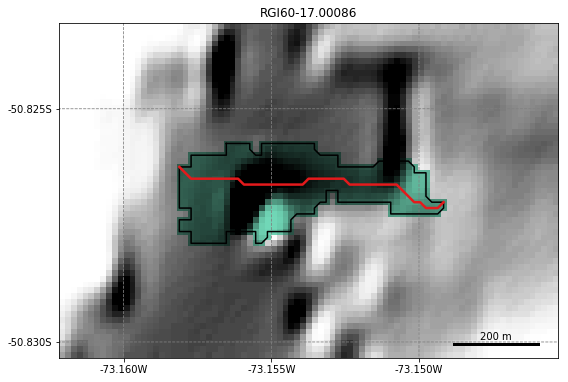

In [20]:
graphics.plot_catchment_areas(gdir)

In [12]:
oggm.core.flowline.run_constant_climate(gdir, y0=1951, halfsize=0, climate_filename='cesm_data')

2018-04-28 17:12:23: oggm.core.flowline: (RGI60-17.00086) run_constant_climate
2018-04-28 17:12:23: oggm.core.flowline: (RGI60-17.00086) trying default time stepping scheme.
2018-04-28 17:12:36: oggm.core.flowline: (RGI60-17.00086) default time stepping was successful!


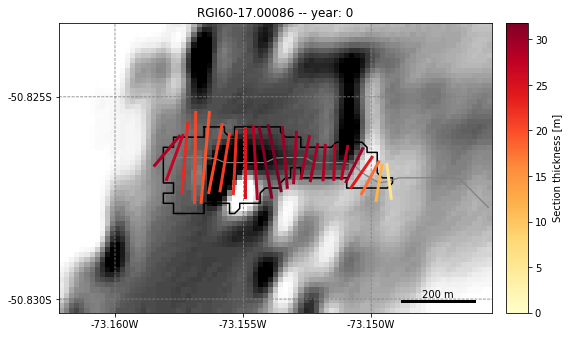

In [18]:
model = oggm.core.flowline.FileModel(gdir.get_filepath('model_run'))
graphics.plot_modeloutput_map(gdir, model=model)

In [ ]:
execute_entity_task(tasks.run_constant_climate, gdirs, y0=1951

#### If this has all worked, the model should be ready for the 127ka spin up (see Fabiens notes in the docs). Use '__LIG_spinup' as the output filesuffix, and read it in for the 122ka run with that as in input filesuffix. Don't worry about model run, "run_constant_climate" should work. Agian, follow the docs ntoes for looking at the input. Also, if nessisary CALM DOWN, CHILL OUT, ETC.

## CCSM DATA PROCESSING -- > DO NOT GOOF WITH

In [21]:
import geopandas as gpd
import salem, os, netCDF4, logging
import numpy as np
import pandas as pd
import xarray as xr
from datetime import datetime

def process_ccsm_data(gdir):
    
    """
        First attempt at a method to process the CCSM data into temperature/precip anomalies.

    """
 
    #Put this in the function def (see process_cesm_data)
    filesuffix=''

    if not (('climate_file' in cfg.PATHS) and
            os.path.exists(cfg.PATHS['climate_file'])):
        raise IOError('Custom climate file not found')

    #open dataset for precp use
    fpath = cfg.PATHS['climate_file']
    xr_ccsm = xr.open_dataset(fpath, decode_times=False)
    #open dataset for tmp use
    xr_ccsm_ts = xr.open_dataset(fpath, decode_times=False)
    #repeating for pi
    xr_pi = xr.open_dataset(PI_path, decode_times=False)

    # selecting location
    lon = gdir.cenlon
    lat = gdir.cenlat

    #Setting the longitude to a 0-360 grid [I think...] "CESM files are in 0-360"
    if lon <= 0:
        lon += 360 

    #"take the closest"
    #"TODO: consider GCM interpolation?"
    precp = xr_ccsm.PRECC.sel(lat=lat, lon=lon, method='nearest') + xr_ccsm.PRECL.sel(lat=lat, lon=lon, method='nearest')
    temp = xr_ccsm_ts.TS.sel(lat=lat, lon=lon, method='nearest')
    precp_pi = xr_pi.PRECC.sel(lat=lat, lon=lon, method='nearest') + xr_pi.PRECL.sel(lat=lat, lon=lon, method='nearest')
    temp_pi = xr_pi.TS.sel(lat=lat, lon=lon, method='nearest')

    #convert temp from K to C
    temp = temp - 273.15
    temp_pi = temp_pi - 273.15

   #Take anomaly for C|CSM data (with preindustrial control)
    for i in range(12):
        temp.values[i] = temp.values[i] - temp_pi.values[i]
    for i in range(12):
        precp.values[i] = precp.values[i] - precp_pi.values[i]

    #selecting & formatting values for y0 & y1
    y_0 = pd.to_datetime(str(temp.time.values[0]))
    y0= int(y_0.strftime('%Y'))
    y_1 = pd.to_datetime(str(temp.time.values[-1]))
    y1 = int(y_1.strftime('%Y'))

    #reformatting the time element of the data array to a datetime64.
    time = pd.period_range('{}-02'.format(y0), '{}01'.format(y1), freq='M')
    temp['time'], precp['time'] = time, time

    temp['month'] = ('time', time.month)
    precp['month'] = ('time', time.month)
    temp['year'] = ('time', time.year)
    temp['year'] = ('time', time.year)
    ny, r = divmod(len(temp.time), 12)
    assert r == 0

    #Convert m s-1 to mm mth-1 (for precp)
    ndays = np.tile(cfg.DAYS_IN_MONTH, y1-y0)
    precp = precp * ndays * (60 * 60 * 24 * 1000)

    #"Get CRU to apply the anomaly to"
    fpath = gdir.get_filepath('climate_monthly')
    ds_cru = xr.open_dataset(fpath)

    #"Here we assume the gradient is a monthly average"
    ts_grad = np.tile(ds_cru.grad[0:12], ny)

    #"Add the climate anomaly to CRU clim"
    dscru = ds_cru.sel(time=slice('1961', '1990'))
    #"for temp"
    loc_tmp = dscru.temp.groupby('time.month').mean()
    loc_tmp = xr.concat([loc_tmp[1:], loc_tmp[:-11]], dim='month')
    ts_tmp = temp #+ loc_tmp
    for j in range(12):
        ts_tmp.values[j] = ts_tmp[j].values + loc_tmp.values[j]
    ts_tmp = xr.concat([ts_tmp[2:], ts_tmp[:-10]], dim='time')
    #"for prcp"
    loc_pre = dscru.prcp.groupby('time.month').mean()
    loc_pre = xr.concat([loc_pre[1:], loc_pre[:-11]], dim='month')
    ts_pre = precp
    for j in range(12):
        ts_pre.values[j] = ts_pre[j].values + loc_pre.values[j]
    ts_pre = xr.concat([ts_pre[2:], ts_pre[:-10]], dim='time')

    #"load dates into right format to save"
    fpath = cfg.PATHS['climate_file']
    dsindex = salem.GeoNetcdf(fpath, monthbegin=True)
    time1 = dsindex.variables['time']

    assert np.all(np.isfinite(ts_pre.values))
    assert np.all(np.isfinite(ts_tmp.values))
    assert np.all(np.isfinite(ts_grad))

    time2 = [711475., 711505.,711536., 711566.,711597., 711628.,711658., 711689.,711719., 711750.,711781., 711809.]
    time2 = netCDF4.num2date(time2, time1.units, calendar='noleap')

    #"back to -180 - 180"
    loc_lon = precp.lon if precp.lon <= 180 else precp.lon - 360

    #write to netcdf
    gdir.write_monthly_climate_file(time2, ts_pre.values, ts_tmp.values, ts_grad, float(dscru.ref_hgt), loc_lon, precp.lat.values, time_unit=time1.units, file_name='cesm_data', filesuffix=filesuffix)

    #dsindex._nc.close()
    xr_ccsm.close()
    xr_ccsm_ts.close()
    xr_pi.close()
    ds_cru.close()

    #logger message
    log.info("%s", gdir.rgi_id)
    
def process_ccsm_gdirs(gdirs):
    for i in gdirs:
        new_process_ccsm_data(i)

In [18]:
def new_process_ccsm_data(gdir):
    #Put this in the function def (see process_cesm_data)
    filesuffix=''

    if not (('climate_file' in cfg.PATHS) and
            os.path.exists(cfg.PATHS['climate_file'])):
        raise IOError('Custom climate file not found')

    #open dataset for precp use
    fpath = cfg.PATHS['climate_file']
    xr_ccsm = xr.open_dataset(fpath, decode_times=False)
    #open dataset for tmp use
    xr_ccsm_ts = xr.open_dataset(fpath)
    #repeating for pi
    xr_pi = xr.open_dataset(PI_path, decode_times=False)

    # selecting location
    lon = gdir.cenlon
    lat = gdir.cenlat

    #Setting the longitude to a 0-360 grid [I think...] "CESM files are in 0-360"
    if lon <= 0:
        lon += 360

    #"take the closest"
    #"TODO: consider GCM interpolation?"
    precp = xr_ccsm.PRECC.sel(lat=lat, lon=lon, method='nearest') + xr_ccsm.PRECL.sel(lat=lat, lon=lon, method='nearest')
    temp = xr_ccsm_ts.TS.sel(lat=lat, lon=lon, method='nearest')
    precp_pi = xr_pi.PRECC.sel(lat=lat, lon=lon, method='nearest') + xr_pi.PRECL.sel(lat=lat, lon=lon, method='nearest')
    temp_pi = xr_pi.TS.sel(lat=lat, lon=lon, method='nearest')

    #convert temp from K to C
    temp = temp - 273.15
    temp_pi = temp_pi - 273.15

    #Take anomaly for C|CSM data (with preindustrial control)
    for i in range(12):
        temp.values[i] = temp.values[i] - temp_pi.values[i]
    for i in range(12):
        precp.values[i] = precp.values[i] - precp_pi.values[i]
        
    #selecting & formatting values for y0 & y1
    y_0 = pd.to_datetime(str(temp.time.values[0]))
    y0= int(y_0.strftime('%Y'))
    y_1 = pd.to_datetime(str(temp.time.values[-1]))
    y1 = int(y_1.strftime('%Y'))
    
    #reformatting the time element of the data array to a datetime64.
    time = pd.period_range('{}-02'.format(y0), '{}01'.format(y1), freq='M')
    temp['time'], precp['time'] = time, time
    
    # Workaround for https://github.com/pydata/xarray/issues/1565
    temp['month'] = ('time', time.month)
    precp['month'] = ('time', time.month)
    temp['year'] = ('time', time.year)
    temp['year'] = ('time', time.year)
    ny, r = divmod(len(temp.time), 12)
    assert r == 0
    
    #Convert m s-1 to mm mth-1 (for precp)
    ndays = np.tile(cfg.DAYS_IN_MONTH, y1-y0)
    precp = precp * ndays * (60 * 60 * 24 * 1000)

    #"Get CRU to apply the anomaly to"
    fpath = gdir.get_filepath('climate_monthly')
    ds_cru = xr.open_dataset(fpath)

    #"Here we assume the gradient is a monthly average"
    ts_grad = np.tile(ds_cru.grad[0:12], ny)
    
    #"Add the climate anomaly to CRU clim"
    dscru = ds_cru.sel(time=slice('1961', '1990'))
    #"for temp"
    loc_tmp = dscru.temp.groupby('time.month').mean()
    loc_tmp = xr.concat([loc_tmp[1:], loc_tmp[:-11]], dim='month')
    ts_tmp = temp #+ loc_tmp
    #ts_tmp[:] = [(i - 5) for i in temp]
    for j in range(12):
        ts_tmp.values[j] = ts_tmp[j].values + loc_tmp.values[j]
    ts_tmp = xr.concat([ts_tmp[2:], ts_tmp[:-10]], dim='time')
    
    #"for prcp"
    loc_pre = dscru.prcp.groupby('time.month').mean()
    loc_pre = xr.concat([loc_pre[1:], loc_pre[:-11]], dim='month')
    ts_pre = precp
    for j in range(12):
        ts_pre.values[j] = ts_pre[j].values + loc_pre.values[j]
    ts_pre = xr.concat([ts_pre[2:], ts_pre[:-10]], dim='time')
    
    fpath = cfg.PATHS['climate_file']
    dsindex = salem.GeoNetcdf(fpath, monthbegin=True)
    time1 = dsindex.variables['time']
    
    time2 = [711475., 711505.,711536., 711566.,711597., 711628.,711658., 711689.,711719., 711750.,711781., 711809.]
    time2 = netCDF4.num2date(time2, time1.units, calendar='noleap')
    
    assert np.all(np.isfinite(ts_pre.values))
    assert np.all(np.isfinite(ts_tmp.values))
    assert np.all(np.isfinite(ts_grad))

    #"back to -180 - 180"
    loc_lon = precp.lon if precp.lon <= 180 else precp.lon - 360

    #write to netcdf
    gdir.write_monthly_climate_file(time2, ts_pre.values, ts_tmp.values, ts_grad, float(dscru.ref_hgt), loc_lon, precp.lat.values, time_unit=time1.units, file_name='cesm_data', filesuffix=filesuffix)

    #dsindex._nc.close()
    xr_ccsm.close()
    xr_ccsm_ts.close()
    xr_pi.close()
    ds_cru.close()

    #logger message
    log.info("%s", gdir.rgi_id)